In [91]:
import os
import sys
import random
import numpy as np
import cv2
import torch
import seaborn as sns
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from tqdm import tqdm
from PIL import Image
from dataclasses import dataclass
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import matplotlib.pyplot as plt
from collections import Counter
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, f1_score, accuracy_score

In [92]:
def seed_everything(seed=42):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything()

In [93]:
@dataclass
class CFG:
    batch_size : int = 32
    seed: int = 42
    early_stopping_steps :int = 7
    number_of_channels : int = 3
    steps_until_plot: int = 2
    criterion : nn.Module = nn.CrossEntropyLoss()
    epochs : int = 70
    device : str = 'cuda' if torch.cuda.is_available() else 'cpu'
    img_size : int = 64
    base_path : str = 'land_patches'
    number_of_pictures_example: int = 5
    train_path : str = os.path.join(base_path, 'train')
    test_path : str = os.path.join(base_path, 'test')
    validation_path : str = os.path.join(base_path, 'val')
    num_classes = len(os.listdir(train_path))
    image_extension : str = '.jpg'
    mapping_between_folders_and_classes = {
        '0': 'AnnualCrop',
        '1': 'Forest',
        '2': 'HerbaceousVegetation',
        '3': 'Highway',
        '4': 'Industrial',
        '5': 'Pasture',
        '6': 'PermanentCrop',
        '7': 'Residential',
        '8': 'River',
        '9': 'SeaLake'
    }
    num_classes : int = len(mapping_between_folders_and_classes)
    imagenet_mean  = [0.485, 0.456, 0.406]
    imagenet_std  = [0.229, 0.224, 0.225]

In [94]:
def see_class_distribution_for_test_train_val(path = CFG.train_path):
  class_distribution = {}

  for class_folder in sorted(os.listdir(path)):
    class_path = os.path.join(CFG.train_path, class_folder)
    if os.path.isdir(class_path):
      num_images = len([f for f in os.listdir(class_path) if f.endswith(CFG.image_extension)])
      class_distribution[class_folder] = num_images

  return class_distribution

In [95]:
def plot_class_distribution_by_class(class_distribution):
  plt.figure(figsize=(10, 5))
  classes = list(class_distribution.keys())
  counts = [class_distribution[c] for c in classes]
  plt.bar(classes, counts, color='steelblue', edgecolor='black')
  plt.xlabel('Clasa', fontsize=12)
  plt.ylabel('Număr de imagini', fontsize=12)
  plt.title('Distribuția Claselor în Setul de Antrenare', fontsize=14, fontweight='bold')
  plt.grid(axis='y', alpha=0.3)
  plt.tight_layout()
  plt.show()

In [96]:
train_distribution = see_class_distribution_for_test_train_val(path=CFG.train_path)
test_distribution = see_class_distribution_for_test_train_val(path=CFG.test_path)
validation_distribution = see_class_distribution_for_test_train_val(path=CFG.validation_path)

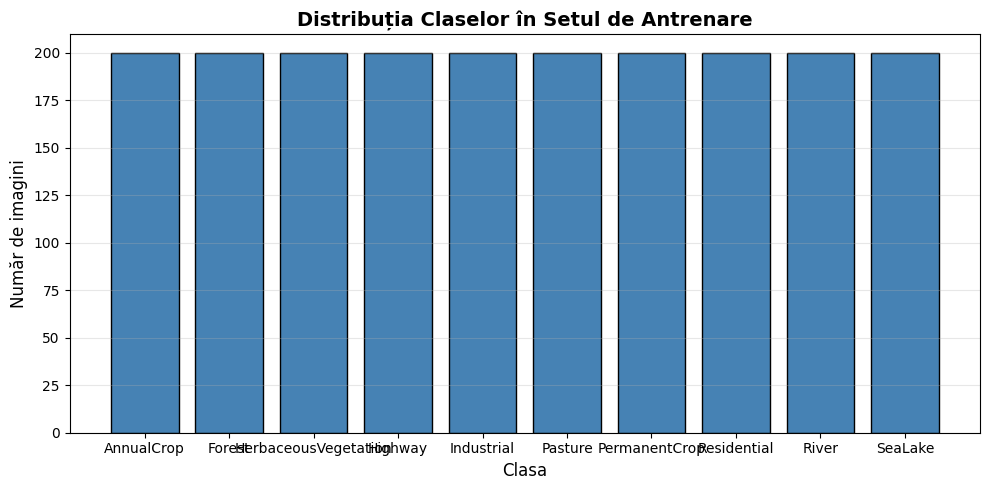

In [97]:
#plot_class_distribution_by_class(path = train_distribution)
plot_class_distribution_by_class(test_distribution)
#plot_class_distribution_by_class(validation_distribution)

In [98]:
def is_class_balanced(class_distribution):
  is_balanced = len(set(class_distribution.values())) == 1
  print(f"Dataset-ul este {'Echilibrat' if is_balanced else 'Dezechilibrat'}")

In [99]:
is_class_balanced(train_distribution)
is_class_balanced(test_distribution)
is_class_balanced(validation_distribution)

Dataset-ul este Echilibrat
Dataset-ul este Echilibrat
Dataset-ul este Echilibrat


In [100]:
def get_parameters_for_type_of_operation(type = 'picture_stats'):
    if type == 'picture_stats':
        return [],{}
    elif type == 'correlation_purpose':
        return [],[]
    elif type == 'plot_images':
        return [],[]
    elif type == 'make_csv_files':
        return [],[]

    return None

In [101]:
def get_random_images_to_plot(all_images):
    random.seed(CFG.seed)
    return random.sample(all_images, min(CFG.number_of_pictures_example, len(all_images)))

In [102]:
def set_path(train=True,validation=None):
    if validation:
      return CFG.validation_path if train else CFG.test_path
    return CFG.train_path if train else CFG.test_path

In [103]:
def get_path(class_idx, train=True, validation=None):
    base_path = set_path(train, validation)
    all_items = sorted(os.listdir(base_path))
    valid_folders = [
        d for d in all_items
        if os.path.isdir(os.path.join(base_path, d)) and not d.startswith('.')
    ]

    if 0 <= class_idx < len(valid_folders):
        return os.path.join(base_path, valid_folders[class_idx])
    return None

In [104]:
def get_all_images(class_idx, train=True, validation=None):
    class_path = get_path(class_idx, train, validation)
    if class_path is None:
        return []
    return [f for f in os.listdir(class_path) if f.endswith(CFG.image_extension)]

In [105]:
def read_images(image_name, class_idx, train=True, validation=None):
    img_path = os.path.join(get_path(class_idx, train, validation), image_name)
    return img_path, cv2.imread(img_path)

In [106]:
def prepare_plot():
    fig, axes = plt.subplots(CFG.num_classes, CFG.number_of_pictures_example, figsize=(16, 20))
    fig.suptitle('Exemple din Fiecare Clasă - Variabilitate Intra-Clasă', fontsize=16, fontweight='bold')
    return fig, axes

In [107]:
def plot_examples_from_dataset(image, axes, class_idx, img_idx):
    ax = axes[class_idx, img_idx]
    ax.imshow(image)
    ax.axis('off')

    if img_idx == 0:
        ax.set_title(f'Clasa {class_idx}', fontsize=12, fontweight='bold', loc='left')

In [108]:
def process_all_images(number_of_classes=CFG.num_classes, operation_type='picture_stats', train=True, validation=None):
    container1, container2 = get_parameters_for_type_of_operation(operation_type)

    if operation_type == 'plot_images':
        _, axes = prepare_plot()

    for class_idx in range(number_of_classes):
        all_images = get_all_images(class_idx, train=train, validation=validation)

        if operation_type == 'plot_images':
            all_images = get_random_images_to_plot(all_images)

        class_pixels = []
        for img_name in all_images:
            img_path, image = read_images(img_name, class_idx, train=train, validation=validation)

            if image is None:
                continue

            if operation_type == 'picture_stats':
                container1.append(image.shape[:2])
                class_pixels.append(np.array(image))

            elif operation_type == 'correlation_purpose':
                image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                vector = image_rgb.flatten()
                container1.append(vector)
                container2.append(class_idx)

            elif operation_type == 'plot_images':
                image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                plot_examples_from_dataset(image_rgb, axes, class_idx, img_idx=all_images.index(img_name))

            elif operation_type == 'make_csv_files':
                container1.append({'ID': img_path, 'label': class_idx})

        if operation_type == 'picture_stats' and class_pixels:
            class_pixels_np = np.array(class_pixels)
            container2[class_idx] = {
                'mean': np.mean(class_pixels_np),
                'std': np.std(class_pixels_np),
                'min': np.min(class_pixels_np),
                'max': np.max(class_pixels_np)
            }

    if operation_type == 'correlation_purpose':
        return np.array(container1), np.array(container2)

    if operation_type == 'plot_images':
        plt.tight_layout()
        plt.show()

    return container1, container2

In [109]:
image_sizes, pixel_stats_per_class = process_all_images()
print(f"\n{'Dimensiuni imagini:':<25} {Counter(image_sizes).most_common(1)[0][0]}")

print("-" * 60)
print("Statistici pixeli per clasă (Media ± Deviație Standard):")
print("-" * 60)

for class_idx in range(1, CFG.num_classes):
    stats = pixel_stats_per_class[class_idx-1]
    print(f"Clasa {class_idx:2d}: {stats['mean']:6.2f} ± {stats['std']:6.2f}  (min: {stats['min']:3.0f}, max: {stats['max']:3.0f})")

print("=" * 60)


Dimensiuni imagini:       (64, 64)
------------------------------------------------------------
Statistici pixeli per clasă (Media ± Deviație Standard):
------------------------------------------------------------
Clasa  1: 123.31 ±  44.85  (min:  27, max: 255)
Clasa  2:  60.56 ±  17.59  (min:  17, max: 189)
Clasa  3: 101.86 ±  32.54  (min:  20, max: 255)
Clasa  4:  96.11 ±  36.19  (min:  19, max: 255)
Clasa  5: 130.14 ±  49.88  (min:  25, max: 255)
Clasa  6:  80.45 ±  22.84  (min:  20, max: 255)
Clasa  7: 119.08 ±  37.53  (min:  22, max: 255)
Clasa  8: 107.52 ±  34.92  (min:   9, max: 255)
Clasa  9:  82.41 ±  28.69  (min:  19, max: 255)


In [110]:
X, y = process_all_images(operation_type = 'correlation_purpose')
corr_matrix = np.corrcoef(X)

intra_correlations = []
inter_correlations = []
num_samples = len(y)

mask = np.triu(np.ones_like(corr_matrix, dtype=bool), k=1)

class_mask = (y[:, None] == y[None, :]) & mask

intra_correlations = corr_matrix[class_mask]
inter_correlations = corr_matrix[mask & ~class_mask]

avg_intra = np.mean(intra_correlations)
avg_inter = np.mean(inter_correlations)

print(f"Average Intra-class Correlation (Consistency): {avg_intra:.4f}")
print(f"Average Inter-class Correlation (Confusion):   {avg_inter:.4f}")
print(f"Separability Score (Intra - Inter):            {avg_intra - avg_inter:.4f}")

Average Intra-class Correlation (Consistency): 0.2950
Average Inter-class Correlation (Confusion):   0.1253
Separability Score (Intra - Inter):            0.1697


/Users/denis2104/Desktop/Tema 2 IA/.venv/lib/python3.14/site-packages/scipy/_lib/_util.py:1280: RuntimeWarning: divide by zero encountered in vecdot
  return np.vecdot(x1, x2, axis=axis)
/Users/denis2104/Desktop/Tema 2 IA/.venv/lib/python3.14/site-packages/scipy/_lib/_util.py:1280: RuntimeWarning: overflow encountered in vecdot
  return np.vecdot(x1, x2, axis=axis)
/Users/denis2104/Desktop/Tema 2 IA/.venv/lib/python3.14/site-packages/scipy/_lib/_util.py:1280: RuntimeWarning: invalid value encountered in vecdot
  return np.vecdot(x1, x2, axis=axis)
/Users/denis2104/Desktop/Tema 2 IA/.venv/lib/python3.14/site-packages/scipy/_lib/_util.py:1280: RuntimeWarning: divide by zero encountered in vecdot
  return np.vecdot(x1, x2, axis=axis)
/Users/denis2104/Desktop/Tema 2 IA/.venv/lib/python3.14/site-packages/scipy/_lib/_util.py:1280: RuntimeWarning: overflow encountered in vecdot
  return np.vecdot(x1, x2, axis=axis)
/Users/denis2104/Desktop/Tema 2 IA/.venv/lib/python3.14/site-packages/scipy/_l

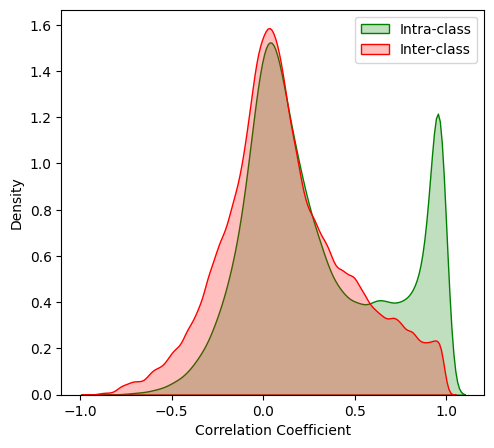

In [111]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.kdeplot(intra_correlations, label='Intra-class', fill=True, color='green')
sns.kdeplot(inter_correlations, label='Inter-class', fill=True, color='red')
plt.xlabel('Correlation Coefficient')
plt.legend()

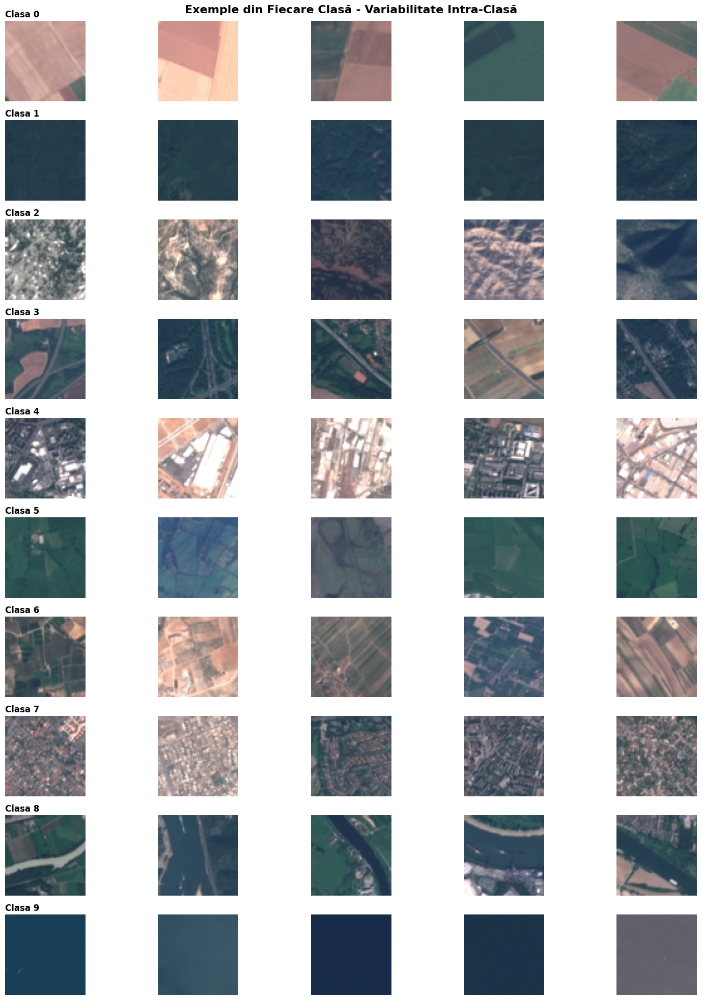

In [112]:
_, _ = process_all_images(operation_type = 'plot_images')

In [113]:
def make_train_and_test_csvs(train=True, validation=None):
    data, _ = process_all_images(operation_type='make_csv_files', train=train, validation=validation)
    return pd.DataFrame(data)

In [114]:
def locate_csv_to_folders(train=True, validation=None):
    df = make_train_and_test_csvs(train=train, validation=validation)
    if validation:
      split_name = "validation"
    else:
      split_name = "train" if train else "test"
    csv_path = os.path.join(set_path(train, validation), f"{split_name}_data.csv")
    df.to_csv(csv_path, index=False)

In [115]:
locate_csv_to_folders(train=True)
locate_csv_to_folders(train=False)
locate_csv_to_folders(train=True,validation=True)

In [116]:
train_set = pd.read_csv(f'{CFG.train_path}/train_data.csv')
val_set = pd.read_csv(f'{CFG.validation_path}/validation_data.csv')
test_set = pd.read_csv(f'{CFG.test_path}/test_data.csv')

In [117]:
class EarlyStopping:
    def __init__(self, patience=CFG.early_stopping_steps, verbose=False, path='checkpoint.pt', trace_func=print):
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = -np.inf
        self.early_stop = False
        self.path = path
        self.trace_func = trace_func

    def __call__(self, current_accuracy, model):
        if current_accuracy <= self.best_score + 1e-6:
            self.counter += 1
            if self.verbose:
                self.trace_func(f"EarlyStopping counter: {self.counter} out of {self.patience}")
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            if self.verbose:
                self.trace_func(
                    f"Validation accuracy increased ({self.best_score:.6f} → {current_accuracy:.6f}). Saving model..."
                )
            self.save_checkpoint(model)
            self.best_score = current_accuracy
            self.counter = 0

    def save_checkpoint(self, model):
        torch.save(model.state_dict(), self.path)


In [118]:
class ImprovedMLP(nn.Module):
    def __init__(self, input_size = CFG.number_of_channels * CFG.img_size * CFG.img_size,
                 hidden_sizes=[512, 258, 124], num_classes=CFG.num_classes, dropout_rate=0.2):
        super(ImprovedMLP, self).__init__()

        layers = []
        in_features = input_size

        for i, hidden in enumerate(hidden_sizes):
            layers.append(nn.Linear(in_features, hidden))
            layers.append(nn.BatchNorm1d(hidden))
            layers.append(nn.ReLU())
            dropout = dropout_rate if i < len(hidden_sizes) - 1 else dropout_rate * 0.5
            layers.append(nn.Dropout(dropout))
            in_features = hidden

        layers.append(nn.Linear(in_features, num_classes))

        self.model = nn.Sequential(*layers)

    def forward(self, x):
        x = x.view(x.size(0), -1)
        return self.model(x)

In [119]:
class MyDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df
        self.transform = transform

        self.resize = transforms.Resize((CFG.img_size, CFG.img_size))
        self.normalize = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=CFG.imagenet_mean, std=CFG.imagenet_std)
        ])

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_name = self.df.iloc[idx]['ID']
        label = self.df.iloc[idx]['label']
        image = Image.open(f'{img_name}').convert('RGB')

        if self.transform:
            image = self.resize(image)
            image = self.transform(image)
            image = self.normalize(image)
        else:
            image = self.resize(image)
            image = self.normalize(image)

        return image, label


train_transform = transforms.Compose([
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(p=0.4),
    transforms.RandomVerticalFlip(p=0.4),
])

train_dataset = MyDataset(train_set, transform=train_transform)
validation_dataset = MyDataset(val_set)
test_dataset = MyDataset(test_set)

train_loader = DataLoader(train_dataset, batch_size=CFG.batch_size, shuffle=True)
validation_loader = DataLoader(validation_dataset, batch_size=CFG.batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=CFG.batch_size, shuffle=False)

In [120]:
def get_number_of_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [121]:
def top_k_accuracy(k, target, output, device):
    batch_size = target.size(0)

    _, pred = output.topk(k, 1, True, True)

    pred = pred.t()

    correct = pred.eq(target.to(device).view(1, -1).expand_as(pred))

    correct_k = correct[:k].reshape(-1).float().sum(0, keepdim=True)
    correct_k = correct_k.mul_(100.0 / batch_size)

    return correct_k.item()

In [122]:
def plot_loss_curves(train_losses, val_losses):
    plt.figure(figsize=(10, 6))
    epochs = range(1, len(train_losses) + 1)

    plt.plot(epochs, train_losses, 'b-o', label='Training Loss', linewidth=2, markersize=5)
    plt.plot(epochs, val_losses, 'r-o', label='Validation Loss', linewidth=2, markersize=5)
    plt.xlabel('Epoch', fontsize=14)
    plt.ylabel('Loss', fontsize=14)
    plt.title('Curbe de Loss pentru Antrenare și Validare', fontsize=16, fontweight='bold')
    plt.legend(fontsize=12)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

In [123]:
def plot_accuracy_curves(train_top1, val_top1):
    plt.figure(figsize=(10, 6))
    epochs = range(1, len(train_top1) + 1)

    plt.plot(epochs, train_top1, 'b-o', label='Training Top-1 Accuracy', linewidth=2, markersize=5)
    plt.plot(epochs, val_top1, 'r-o', label='Validation Top-1 Accuracy', linewidth=2, markersize=5)
    plt.xlabel('Epoch', fontsize=14)
    plt.ylabel('Acuratețe (%)', fontsize=14)
    plt.title('Curbe de Acuratețe pentru Antrenare și Validare', fontsize=16, fontweight='bold')
    plt.legend(fontsize=12)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

In [124]:
def plot_confusion_matrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(12, 10))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=range(1, CFG.num_classes + 1),
                yticklabels=range(1, CFG.num_classes + 1),
                cbar_kws={'label': 'Număr de predicții'})
    plt.xlabel('Predicted Label', fontsize=14)
    plt.ylabel('True Label', fontsize=14)
    plt.title('Matricea de Confuzie', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

    return cm

In [125]:
def validate(model, criterion, val_loader, device, epoch):
    model.eval()
    running_loss = 0.0
    running_top1_acc = 0.0

    bar = tqdm(enumerate(val_loader), total=len(val_loader), colour='green', file=sys.stdout)

    with torch.no_grad():
        for i, (images, labels) in bar:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels.long())

            top1_acc = top_k_accuracy(1, labels, outputs, device)

            running_loss += loss.item() * images.size(0)
            running_top1_acc += top1_acc * images.size(0)

            avg_loss = running_loss / ((i + 1) * images.size(0))
            avg_top1 = running_top1_acc / ((i + 1) * images.size(0))

            bar.set_postfix({
                'epoch': epoch,
                'val_loss': f'{avg_loss:.4f}',
                'top1_accuracy': f'{avg_top1:.2f}%'
            })

    epoch_loss = running_loss / len(val_loader.dataset)
    epoch_top1 = running_top1_acc / len(val_loader.dataset)

    return epoch_loss, epoch_top1

In [126]:
from torch.optim.lr_scheduler import CosineAnnealingLR
def train_single_model(config, train_loader, val_loader, device, num_epochs=CFG.epochs):
    model = ImprovedMLP().to(device)
    optimizer = optim.AdamW(model.parameters(), lr=config['lr'],
                           weight_decay=config['weight_decay'], betas=(0.9, 0.999))
    scheduler = CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=1e-6)
    criterion = CFG.criterion
    early_stopping = EarlyStopping(patience=CFG.early_stopping_steps, verbose=True, path='best_model.pth')

    train_losses, train_top1 = [], []
    val_losses, val_top1 = [], []

    best_val_acc = 0.0

    for epoch in range(1, num_epochs + 1):
        model.train()
        running_loss = 0.0
        running_top1_acc = 0.0

        bar = tqdm(enumerate(train_loader), total=len(train_loader), colour='cyan', file=sys.stdout)

        for i, (images, labels) in bar:
            images = images.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)

            loss = criterion(outputs, labels.long())
            loss.backward()

            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

            optimizer.step()

            top1_acc = top_k_accuracy(1, labels, outputs, device)

            running_loss += loss.item() * images.size(0)
            running_top1_acc += top1_acc * images.size(0)

            avg_loss = running_loss / ((i + 1) * images.size(0))
            avg_top1 = running_top1_acc / ((i + 1) * images.size(0))

            bar.set_postfix({
            'epoch': epoch,
            'train_loss': f'{avg_loss:.4f}',
            'top1_accuracy': f'{avg_top1:.2f}%'
            })

        scheduler.step()

        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_top1 = running_top1_acc / len(train_loader.dataset)

        print(f"Train - Loss: {epoch_loss:.4f}, Top-1: {epoch_top1:.2f}%")

        train_losses.append(epoch_loss)
        train_top1.append(epoch_top1)

        val_loss, val_acc = validate(model, criterion, val_loader, device, epoch)

        print(f"Val - Loss: {val_loss:.4f}, Val - Top-1: {val_acc:.2f}%")

        val_losses.append(val_loss)
        val_top1.append(val_acc)

        early_stopping(val_acc, model)

        if early_stopping.early_stop:
            print(f"Early stopping triggered at epoch {epoch}")
            break

        if val_acc > best_val_acc:
            best_val_acc = val_acc

        if epoch % CFG.steps_until_plot == 0:
            plot_loss_curves(train_losses, val_losses)
            plot_accuracy_curves(train_top1, val_top1)

    return model, best_val_acc

In [127]:
def predict_soft_vote_ensemble(models, loader, device):
    for m in models:
        m.eval()

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)

            avg_probs = torch.zeros(images.size(0), CFG.num_classes).to(device)

            for model in models:
                outputs = model(images)
                probs = F.softmax(outputs, dim=1)
                avg_probs += probs

            avg_probs /= len(models)

            _, predicted = torch.max(avg_probs, 1)

            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return np.array(all_preds), np.array(all_labels)

In [128]:
def predict_hard_voting_ensemble(models, loader, device):
    for m in models:
        m.eval()

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)

            model_predictions  = []

            for model in models:
                outputs = model(images)
                _, predicted = outputs.max(1)
                model_predictions.append(predicted.cpu().numpy())

            model_predictions = np.array(model_predictions)

            ensemble_pred = []
            for i in range(model_predictions.shape[1]):
                votes = model_predictions[:, i]
                majority = Counter(votes).most_common(1)[0][0]
                ensemble_pred.append(majority)

            all_preds.extend(ensemble_pred)
            all_labels.extend(labels.cpu().numpy())

    return np.array(all_preds), np.array(all_labels)

In [129]:
def apply_tta_augmentations(img_tensor):
    augmentations = []

    augmentations.append(img_tensor)

    augmentations.append(torch.flip(img_tensor, dims=[2]))

    return augmentations

In [130]:
def predict_ensemble_with_tta(models, loader, device, num_tta=2):
    for m in models:
        m.eval()

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(loader, desc="TTA Ensemble Prediction", colour='magenta'):
            images, labels = images.to(device), labels.to(device)
            batch_size = images.size(0)

            final_probs = torch.zeros(batch_size, CFG.num_classes).to(device)

            for img_idx in range(batch_size):
                img = images[img_idx]


                augmented_images = apply_tta_augmentations(img)
                augmented_images = augmented_images[:min(num_tta, 2)]

                aug_batch = torch.stack(augmented_images)

                tta_probs = torch.zeros(CFG.num_classes).to(device)

                for model in models:
                    outputs = model(aug_batch)
                    probs = F.softmax(outputs, dim=1)
                    avg_probs = probs.mean(dim=0)
                    tta_probs += avg_probs

                tta_probs /= len(models)
                final_probs[img_idx] = tta_probs

            _, predicted = torch.max(final_probs, 1)

            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return np.array(all_preds), np.array(all_labels)


In [131]:
def calculate_f1_score(y_true, y_pred):
    return f1_score(y_true, y_pred, average='weighted') * 100

Starting Ensemble Training of 5 models...


Training Model 1/5
Config: lr=0.003, weight_decay=0.0001, lr_decay=0.93

100%|██████████| 63/63 [00:01<00:00, 60.22it/s, epoch=1, train_loss=3.6403, top1_accuracy=62.40%]
Train - Loss: 1.8347, Top-1: 31.45%
100%|██████████| 32/32 [00:00<00:00, 171.69it/s, epoch=1, val_loss=6.1004, top1_accuracy=185.16%]
Val - Loss: 1.5617, Val - Top-1: 47.40%
Validation accuracy increased (-inf → 47.400000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 60.57it/s, epoch=2, train_loss=3.1352, top1_accuracy=82.44%]
Train - Loss: 1.5802, Top-1: 41.55%
100%|██████████| 32/32 [00:00<00:00, 167.02it/s, epoch=2, val_loss=5.4786, top1_accuracy=203.12%]
Val - Loss: 1.4025, Val - Top-1: 52.00%
Validation accuracy increased (47.400000 → 52.000000). Saving model...


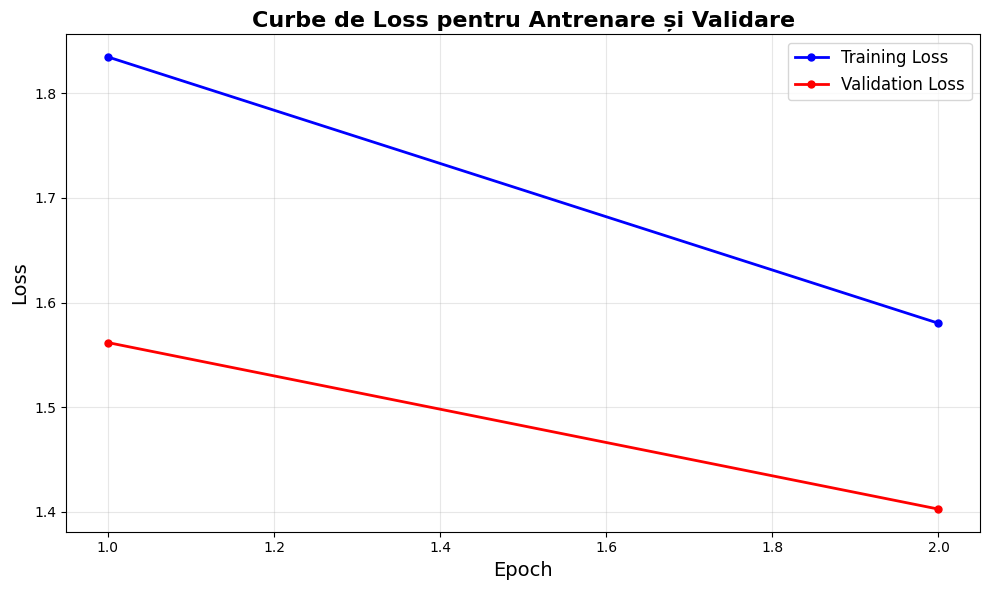

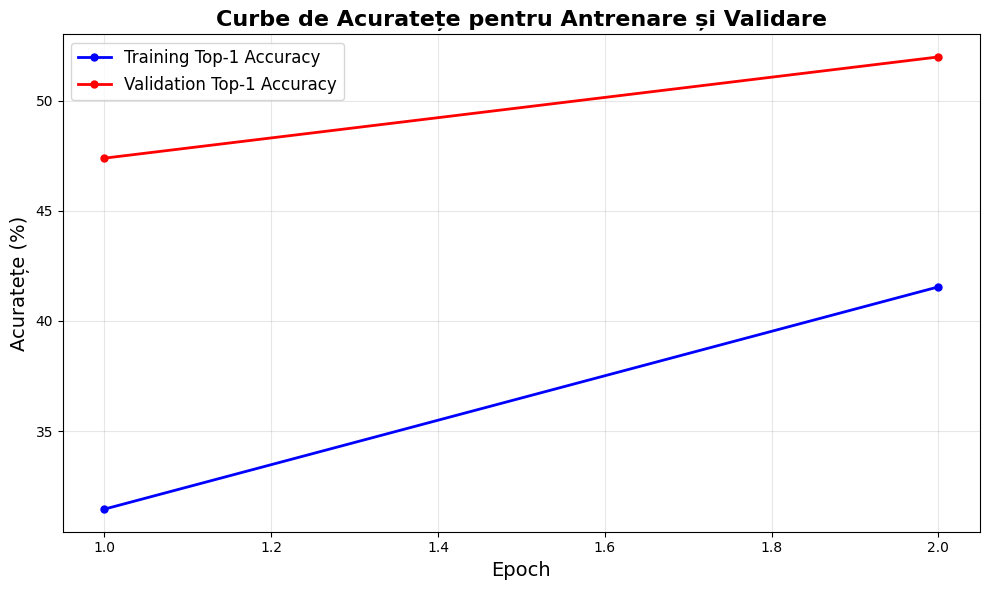

100%|██████████| 63/63 [00:01<00:00, 59.88it/s, epoch=3, train_loss=2.9266, top1_accuracy=92.26%]
Train - Loss: 1.4750, Top-1: 46.50%
100%|██████████| 32/32 [00:00<00:00, 170.70it/s, epoch=3, val_loss=5.3184, top1_accuracy=212.11%]
Val - Loss: 1.3615, Val - Top-1: 54.30%
Validation accuracy increased (52.000000 → 54.300000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 60.20it/s, epoch=4, train_loss=2.8768, top1_accuracy=93.85%]
Train - Loss: 1.4499, Top-1: 47.30%
100%|██████████| 32/32 [00:00<00:00, 166.56it/s, epoch=4, val_loss=5.5852, top1_accuracy=187.50%]
Val - Loss: 1.4298, Val - Top-1: 48.00%
EarlyStopping counter: 1 out of 7


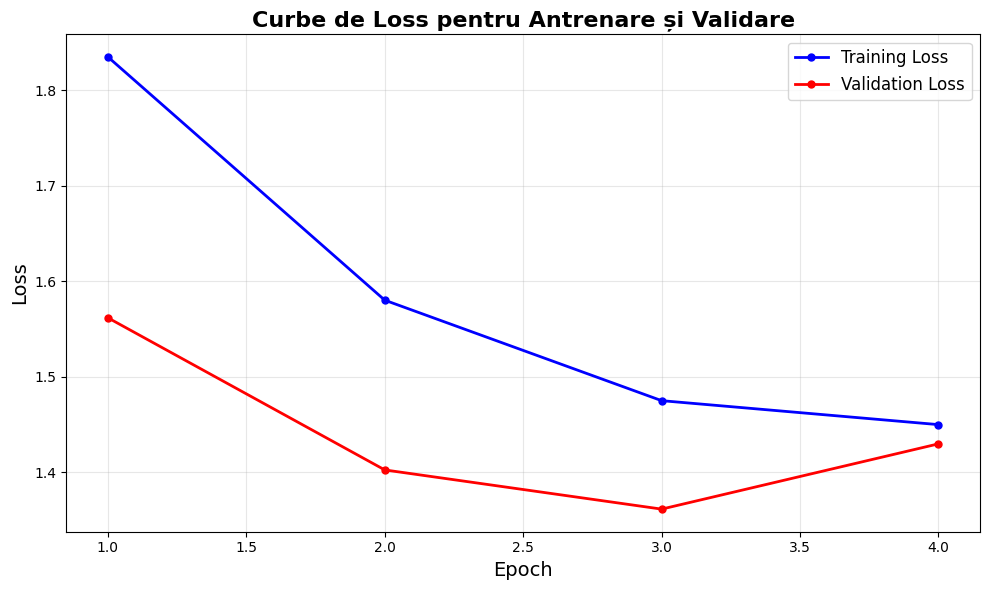

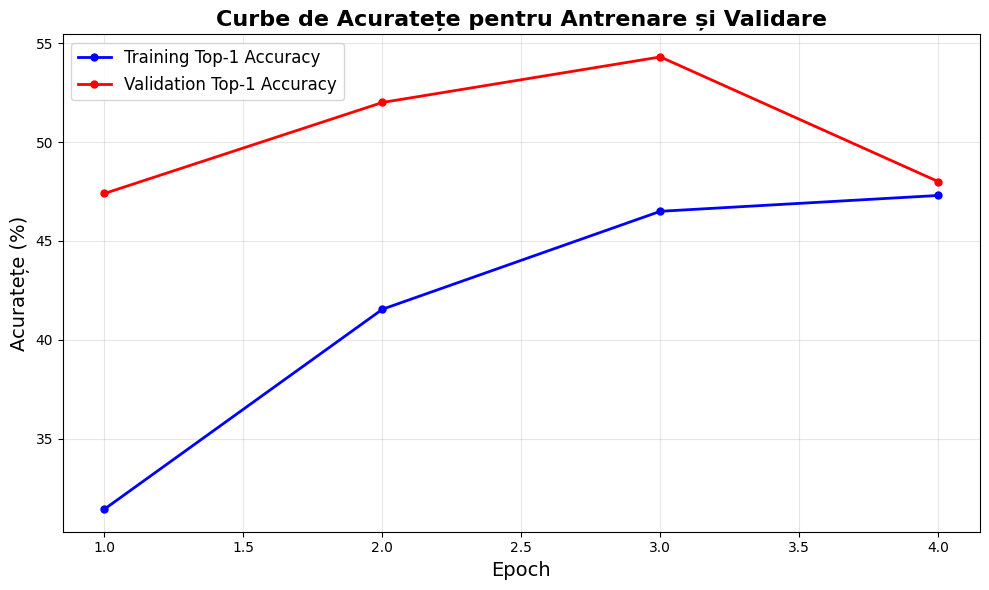

100%|██████████| 63/63 [00:01<00:00, 59.17it/s, epoch=5, train_loss=2.7699, top1_accuracy=94.54%]
Train - Loss: 1.3960, Top-1: 47.65%
100%|██████████| 32/32 [00:00<00:00, 171.57it/s, epoch=5, val_loss=5.4925, top1_accuracy=189.06%]
Val - Loss: 1.4061, Val - Top-1: 48.40%
EarlyStopping counter: 2 out of 7
100%|██████████| 63/63 [00:01<00:00, 60.47it/s, epoch=6, train_loss=2.7636, top1_accuracy=96.53%]
Train - Loss: 1.3928, Top-1: 48.65%
100%|██████████| 32/32 [00:00<00:00, 170.74it/s, epoch=6, val_loss=4.7444, top1_accuracy=228.52%]
Val - Loss: 1.2146, Val - Top-1: 58.50%
Validation accuracy increased (54.300000 → 58.500000). Saving model...


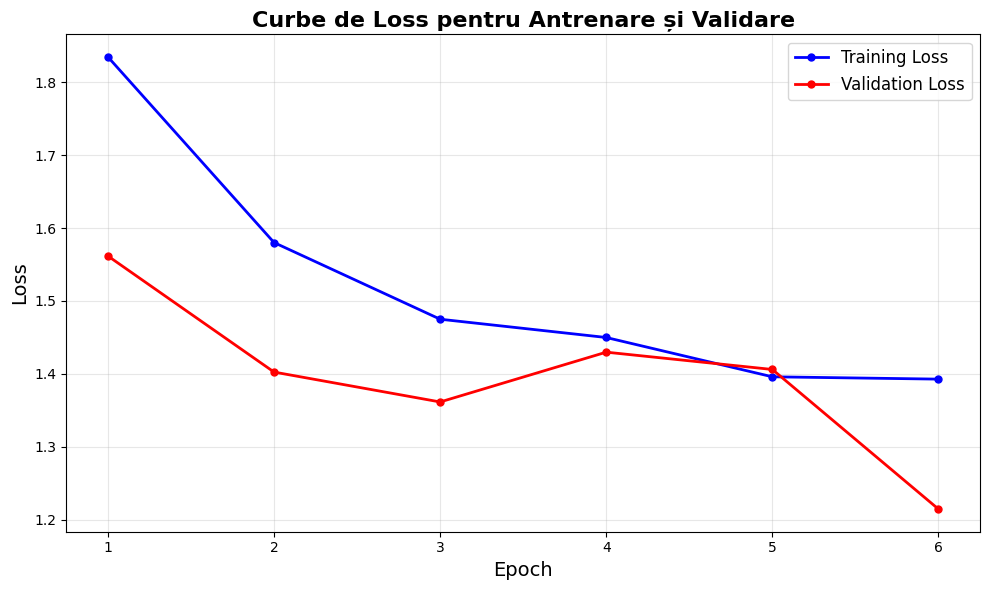

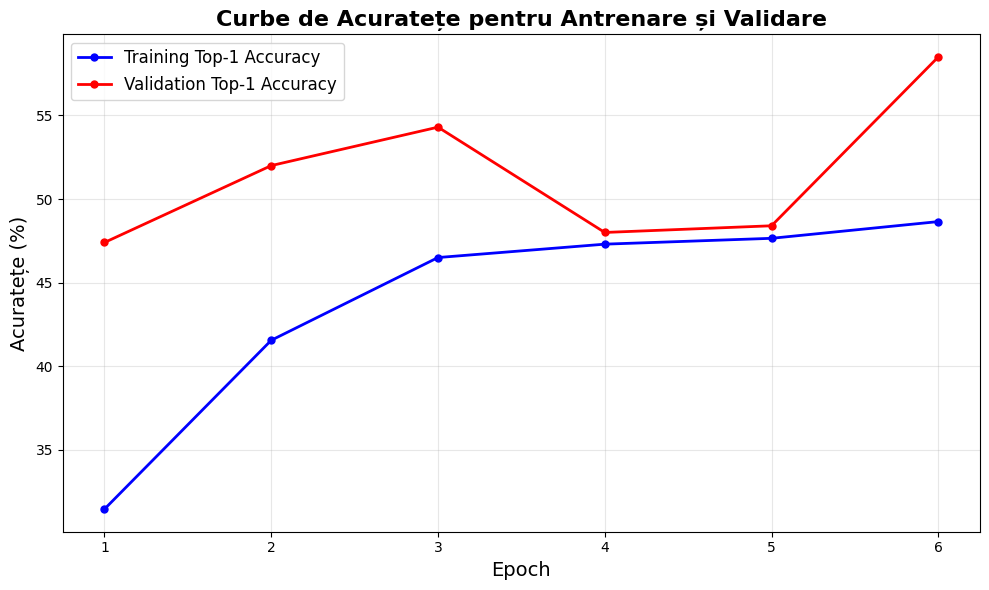

100%|██████████| 63/63 [00:01<00:00, 59.42it/s, epoch=7, train_loss=2.7118, top1_accuracy=100.40%]
Train - Loss: 1.3667, Top-1: 50.60%
100%|██████████| 32/32 [00:00<00:00, 171.32it/s, epoch=7, val_loss=4.7537, top1_accuracy=235.55%]
Val - Loss: 1.2170, Val - Top-1: 60.30%
Validation accuracy increased (58.500000 → 60.300000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 60.13it/s, epoch=8, train_loss=2.6031, top1_accuracy=104.27%]
Train - Loss: 1.3120, Top-1: 52.55%
100%|██████████| 32/32 [00:00<00:00, 171.33it/s, epoch=8, val_loss=4.8789, top1_accuracy=218.36%]
Val - Loss: 1.2490, Val - Top-1: 55.90%
EarlyStopping counter: 1 out of 7


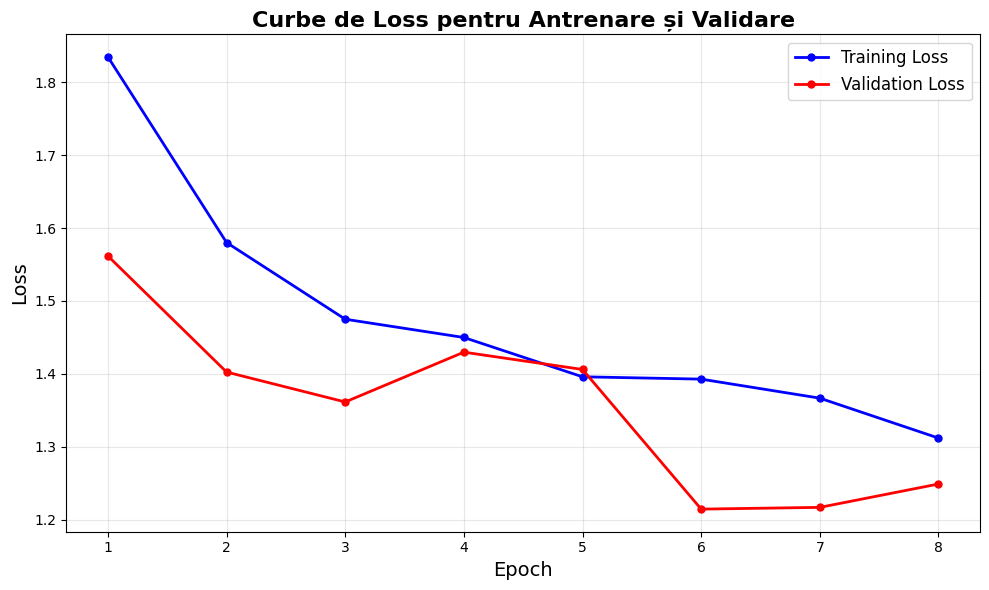

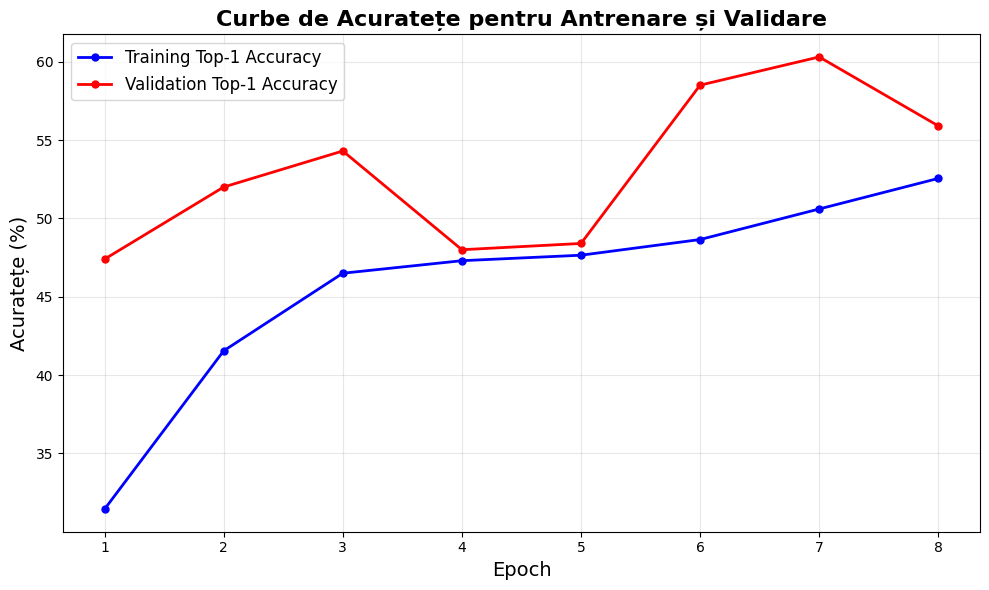

100%|██████████| 63/63 [00:01<00:00, 60.31it/s, epoch=9, train_loss=2.4815, top1_accuracy=109.82%]
Train - Loss: 1.2507, Top-1: 55.35%
100%|██████████| 32/32 [00:00<00:00, 171.20it/s, epoch=9, val_loss=4.6848, top1_accuracy=231.25%]
Val - Loss: 1.1993, Val - Top-1: 59.20%
EarlyStopping counter: 2 out of 7
100%|██████████| 63/63 [00:01<00:00, 59.64it/s, epoch=10, train_loss=2.4879, top1_accuracy=109.03%]
Train - Loss: 1.2539, Top-1: 54.95%
100%|██████████| 32/32 [00:00<00:00, 170.92it/s, epoch=10, val_loss=4.5958, top1_accuracy=232.81%]
Val - Loss: 1.1765, Val - Top-1: 59.60%
EarlyStopping counter: 3 out of 7


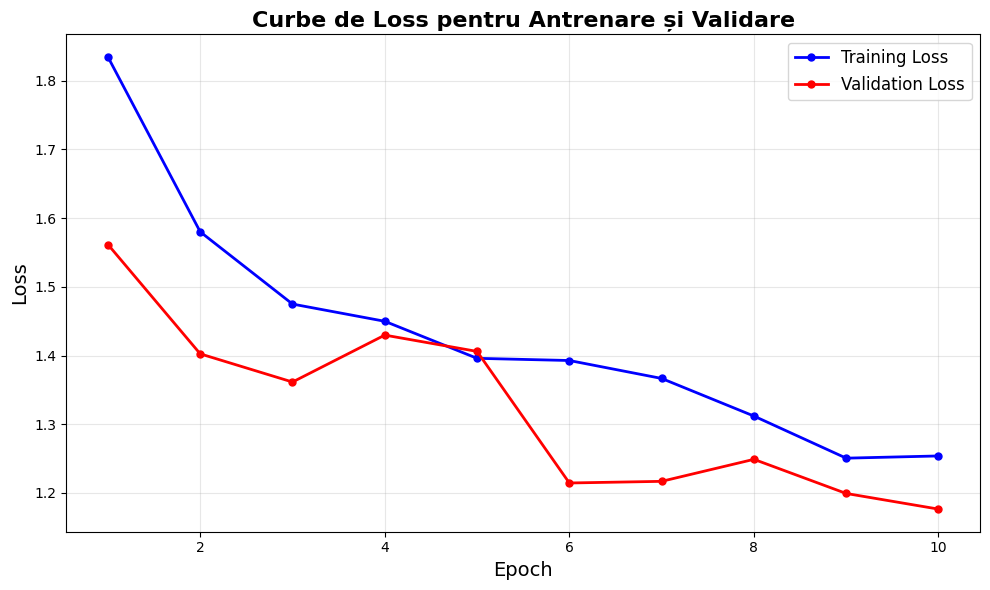

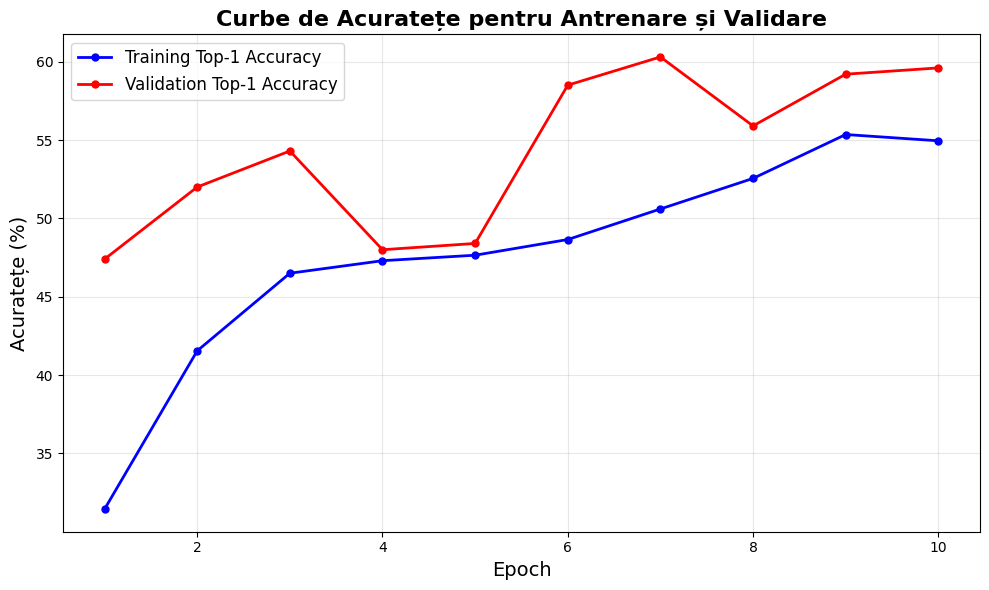

100%|██████████| 63/63 [00:01<00:00, 60.26it/s, epoch=11, train_loss=2.4364, top1_accuracy=111.31%]
Train - Loss: 1.2280, Top-1: 56.10%
100%|██████████| 32/32 [00:00<00:00, 171.28it/s, epoch=11, val_loss=4.4307, top1_accuracy=238.28%]
Val - Loss: 1.1343, Val - Top-1: 61.00%
Validation accuracy increased (60.300000 → 61.000000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 59.61it/s, epoch=12, train_loss=2.4986, top1_accuracy=107.04%]
Train - Loss: 1.2593, Top-1: 53.95%
100%|██████████| 32/32 [00:00<00:00, 168.11it/s, epoch=12, val_loss=4.6081, top1_accuracy=219.92%]
Val - Loss: 1.1797, Val - Top-1: 56.30%
EarlyStopping counter: 1 out of 7


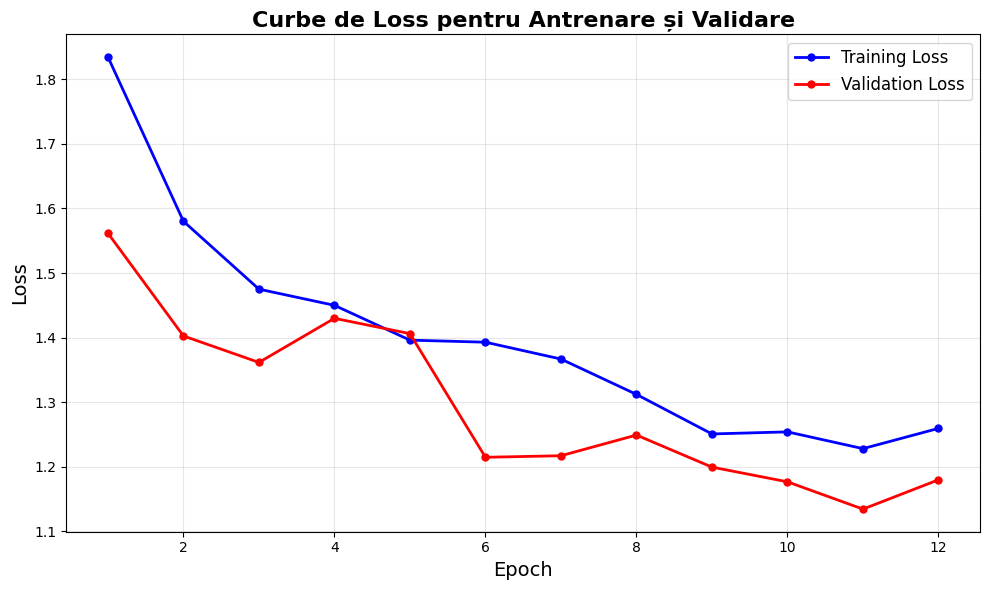

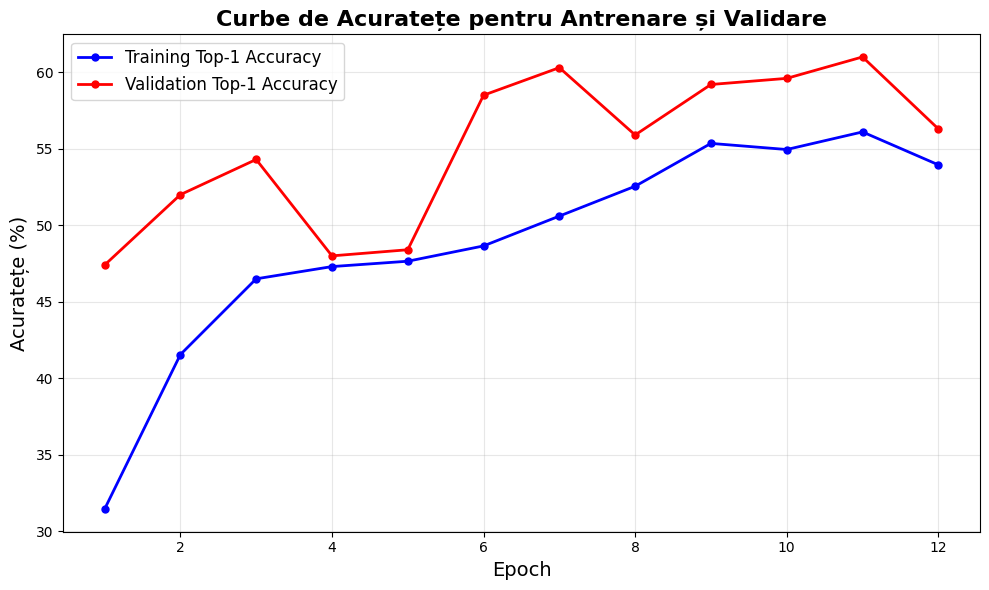

100%|██████████| 63/63 [00:01<00:00, 60.37it/s, epoch=13, train_loss=2.3580, top1_accuracy=113.59%]
Train - Loss: 1.1884, Top-1: 57.25%
100%|██████████| 32/32 [00:00<00:00, 171.55it/s, epoch=13, val_loss=4.3889, top1_accuracy=239.45%]
Val - Loss: 1.1236, Val - Top-1: 61.30%
Validation accuracy increased (61.000000 → 61.300000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 58.70it/s, epoch=14, train_loss=2.3168, top1_accuracy=116.57%]
Train - Loss: 1.1676, Top-1: 58.75%
100%|██████████| 32/32 [00:00<00:00, 170.87it/s, epoch=14, val_loss=4.3224, top1_accuracy=236.33%]
Val - Loss: 1.1065, Val - Top-1: 60.50%
EarlyStopping counter: 1 out of 7


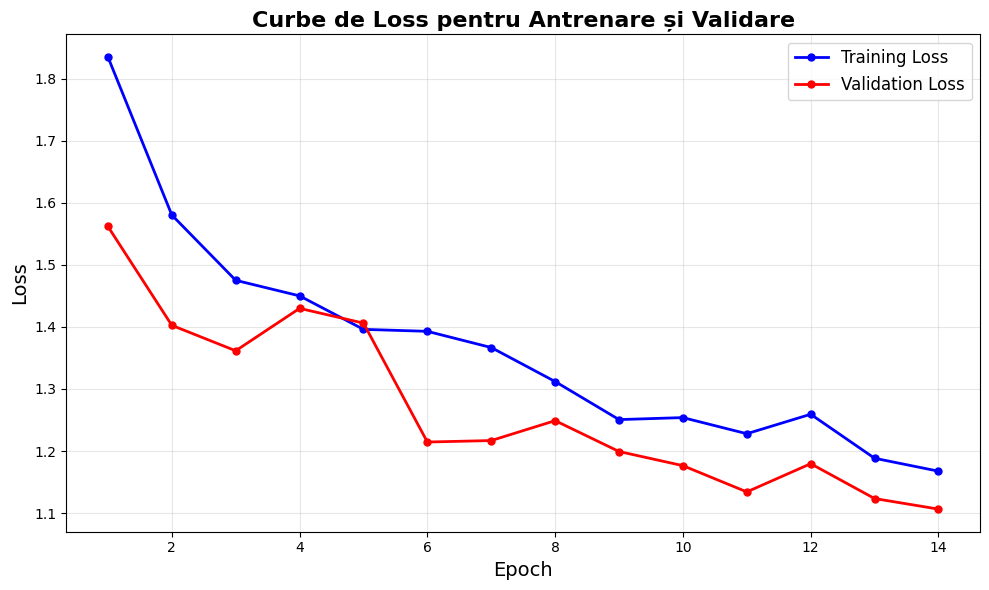

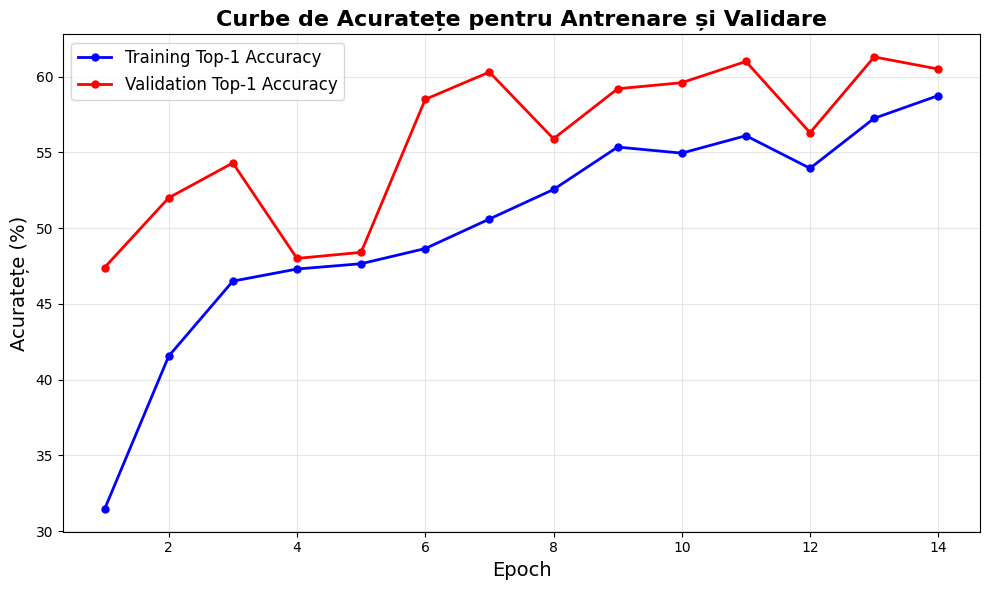

100%|██████████| 63/63 [00:01<00:00, 60.16it/s, epoch=15, train_loss=2.3291, top1_accuracy=116.27%]
Train - Loss: 1.1739, Top-1: 58.60%
100%|██████████| 32/32 [00:00<00:00, 171.46it/s, epoch=15, val_loss=4.4069, top1_accuracy=239.84%]
Val - Loss: 1.1282, Val - Top-1: 61.40%
Validation accuracy increased (61.300000 → 61.400000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 60.42it/s, epoch=16, train_loss=2.2736, top1_accuracy=115.58%]
Train - Loss: 1.1459, Top-1: 58.25%
100%|██████████| 32/32 [00:00<00:00, 171.19it/s, epoch=16, val_loss=4.5273, top1_accuracy=230.47%]
Val - Loss: 1.1590, Val - Top-1: 59.00%
EarlyStopping counter: 1 out of 7


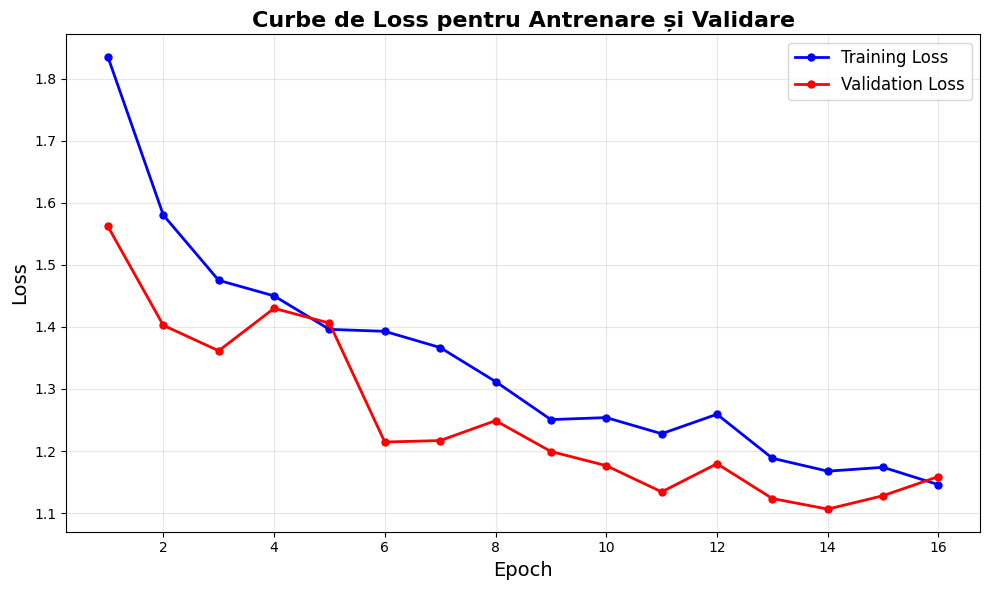

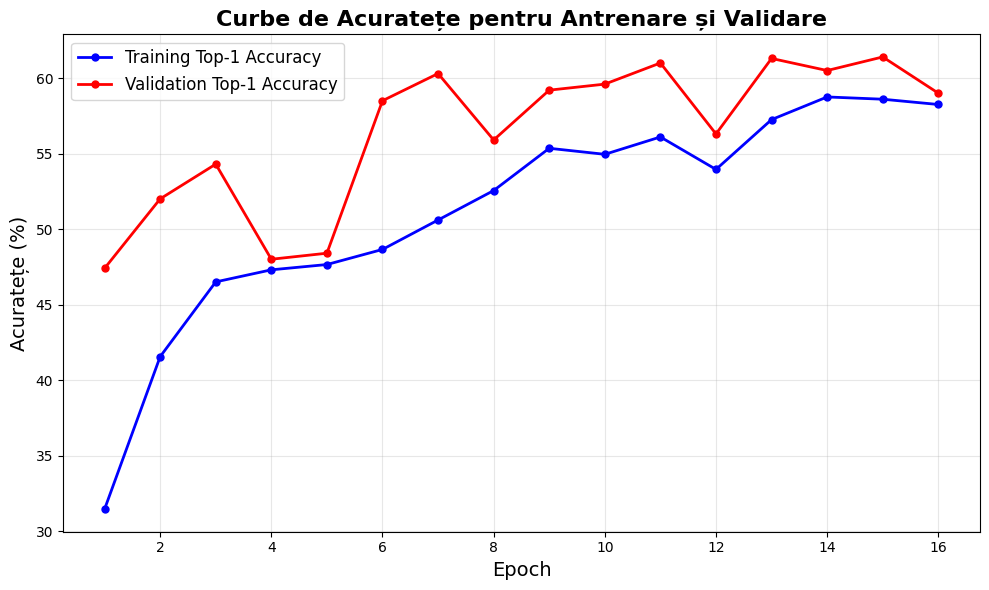

100%|██████████| 63/63 [00:01<00:00, 59.55it/s, epoch=17, train_loss=2.2912, top1_accuracy=116.07%]
Train - Loss: 1.1548, Top-1: 58.50%
100%|██████████| 32/32 [00:00<00:00, 171.37it/s, epoch=17, val_loss=4.6241, top1_accuracy=221.48%]
Val - Loss: 1.1838, Val - Top-1: 56.70%
EarlyStopping counter: 2 out of 7
100%|██████████| 63/63 [00:01<00:00, 60.31it/s, epoch=18, train_loss=2.2530, top1_accuracy=113.79%]
Train - Loss: 1.1355, Top-1: 57.35%
100%|██████████| 32/32 [00:00<00:00, 170.49it/s, epoch=18, val_loss=4.0995, top1_accuracy=249.61%]
Val - Loss: 1.0495, Val - Top-1: 63.90%
Validation accuracy increased (61.400000 → 63.900000). Saving model...


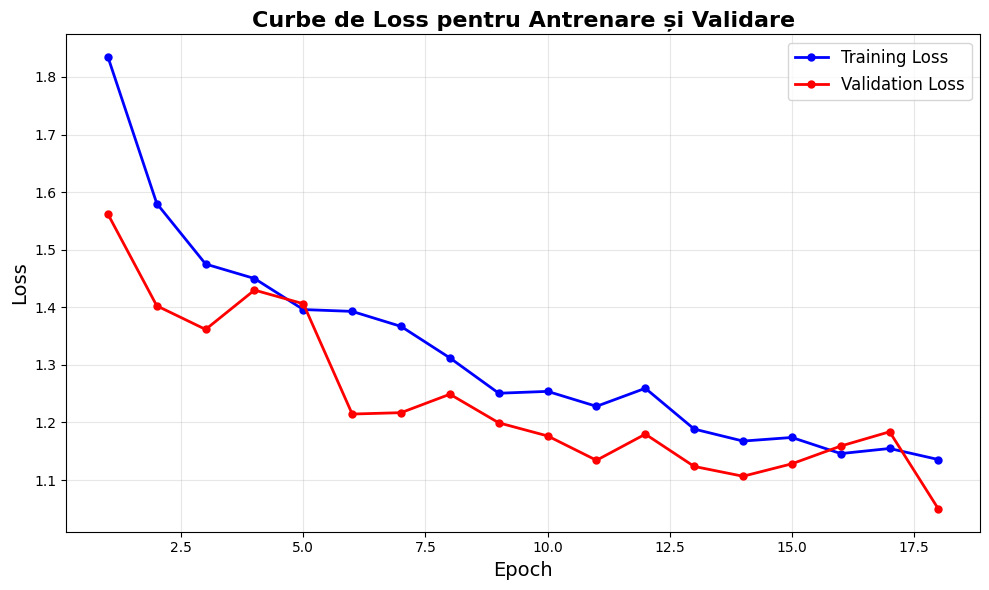

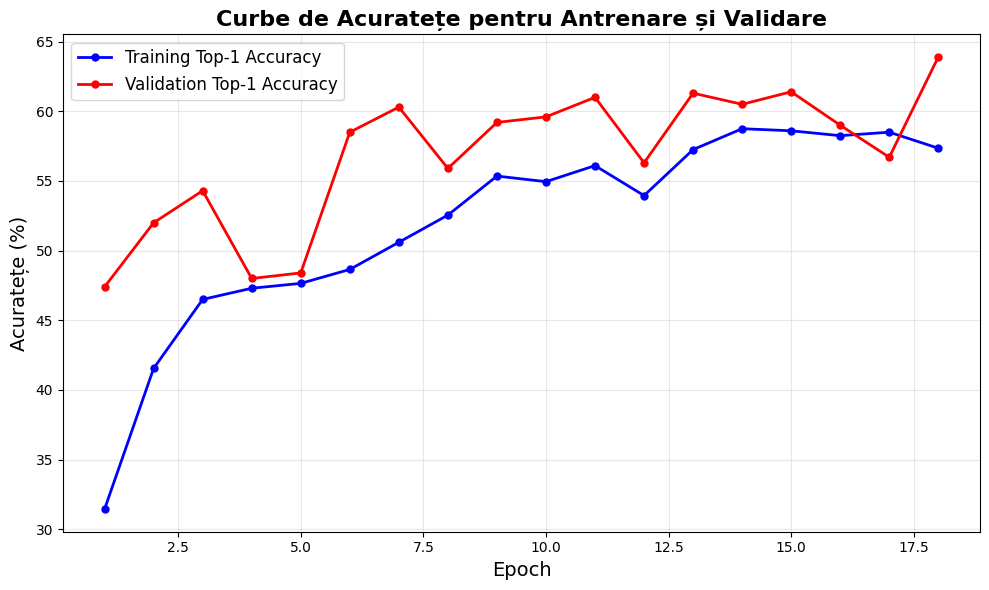

100%|██████████| 63/63 [00:01<00:00, 59.57it/s, epoch=19, train_loss=2.2681, top1_accuracy=115.97%]
Train - Loss: 1.1431, Top-1: 58.45%
100%|██████████| 32/32 [00:00<00:00, 171.11it/s, epoch=19, val_loss=4.4200, top1_accuracy=237.89%]
Val - Loss: 1.1315, Val - Top-1: 60.90%
EarlyStopping counter: 1 out of 7
100%|██████████| 63/63 [00:01<00:00, 60.56it/s, epoch=20, train_loss=2.2395, top1_accuracy=114.68%]
Train - Loss: 1.1287, Top-1: 57.80%
100%|██████████| 32/32 [00:00<00:00, 171.35it/s, epoch=20, val_loss=4.1358, top1_accuracy=242.58%]
Val - Loss: 1.0588, Val - Top-1: 62.10%
EarlyStopping counter: 2 out of 7


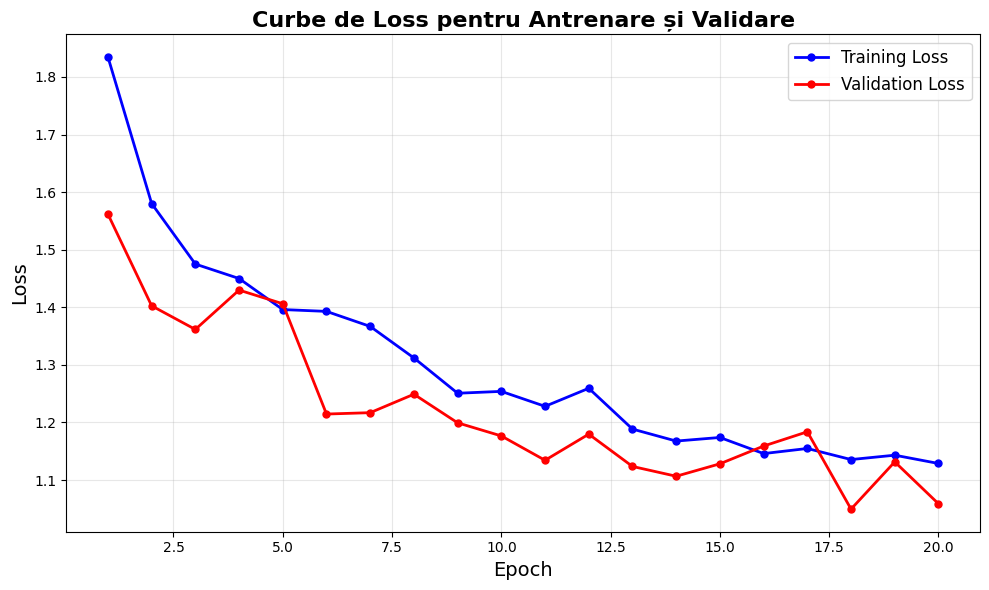

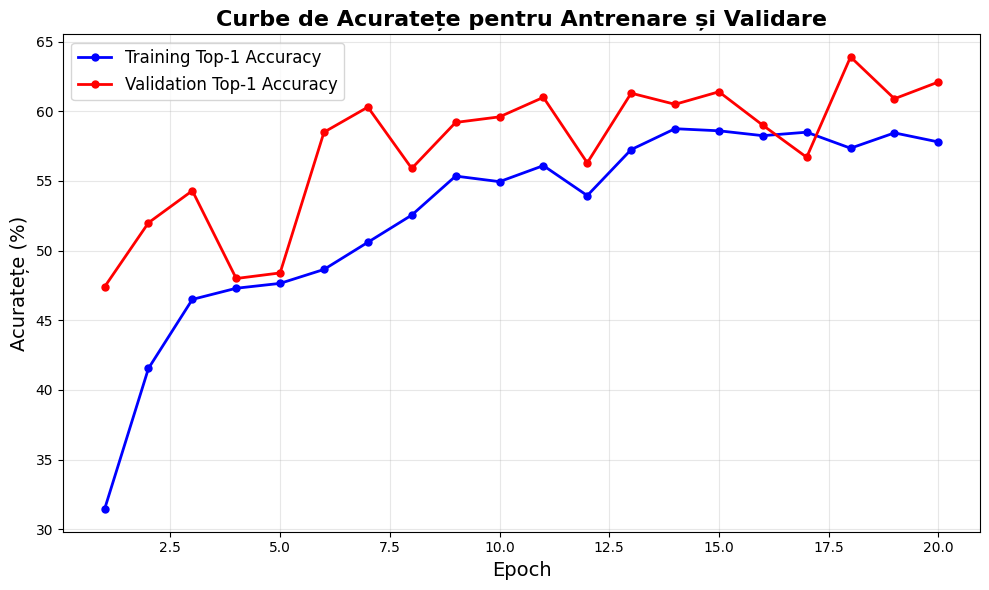

100%|██████████| 63/63 [00:01<00:00, 59.51it/s, epoch=21, train_loss=2.1740, top1_accuracy=119.74%]
Train - Loss: 1.0957, Top-1: 60.35%
100%|██████████| 32/32 [00:00<00:00, 170.73it/s, epoch=21, val_loss=3.9911, top1_accuracy=252.34%]
Val - Loss: 1.0217, Val - Top-1: 64.60%
Validation accuracy increased (63.900000 → 64.600000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 60.57it/s, epoch=22, train_loss=2.1626, top1_accuracy=120.83%]
Train - Loss: 1.0900, Top-1: 60.90%
100%|██████████| 32/32 [00:00<00:00, 170.31it/s, epoch=22, val_loss=4.2055, top1_accuracy=244.14%]
Val - Loss: 1.0766, Val - Top-1: 62.50%
EarlyStopping counter: 1 out of 7


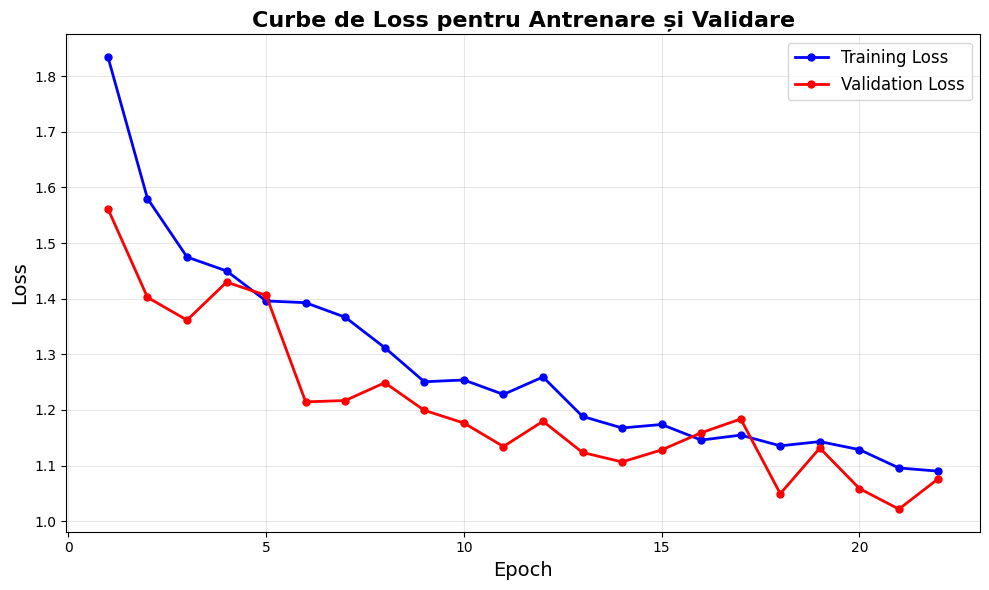

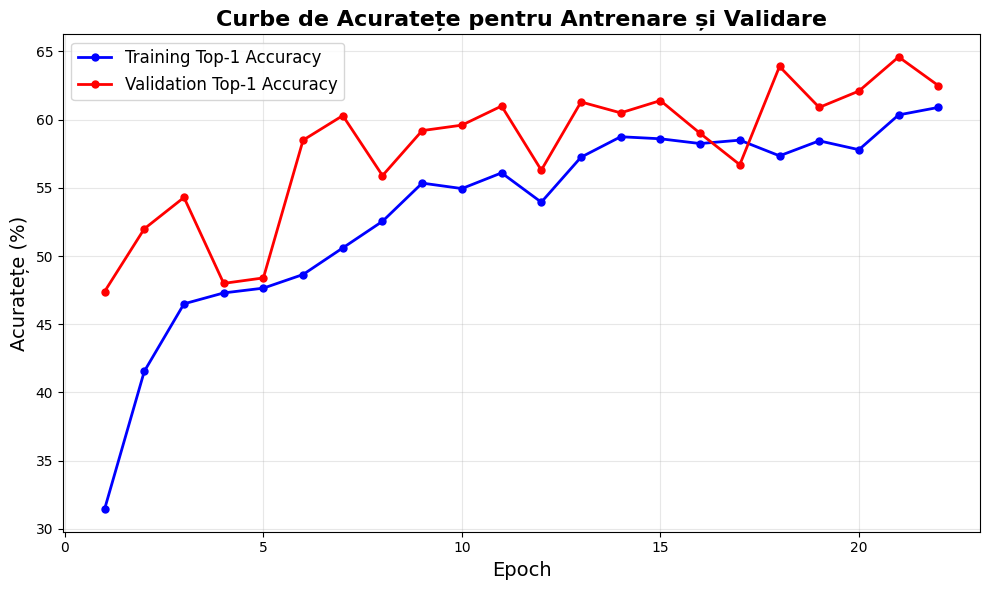

100%|██████████| 63/63 [00:01<00:00, 59.57it/s, epoch=23, train_loss=2.1840, top1_accuracy=120.24%]
Train - Loss: 1.1007, Top-1: 60.60%
100%|██████████| 32/32 [00:00<00:00, 172.07it/s, epoch=23, val_loss=4.2908, top1_accuracy=241.80%]
Val - Loss: 1.0985, Val - Top-1: 61.90%
EarlyStopping counter: 2 out of 7
100%|██████████| 63/63 [00:01<00:00, 60.30it/s, epoch=24, train_loss=2.1264, top1_accuracy=122.42%]
Train - Loss: 1.0717, Top-1: 61.70%
100%|██████████| 32/32 [00:00<00:00, 150.32it/s, epoch=24, val_loss=3.9759, top1_accuracy=260.16%]
Val - Loss: 1.0178, Val - Top-1: 66.60%
Validation accuracy increased (64.600000 → 66.600000). Saving model...


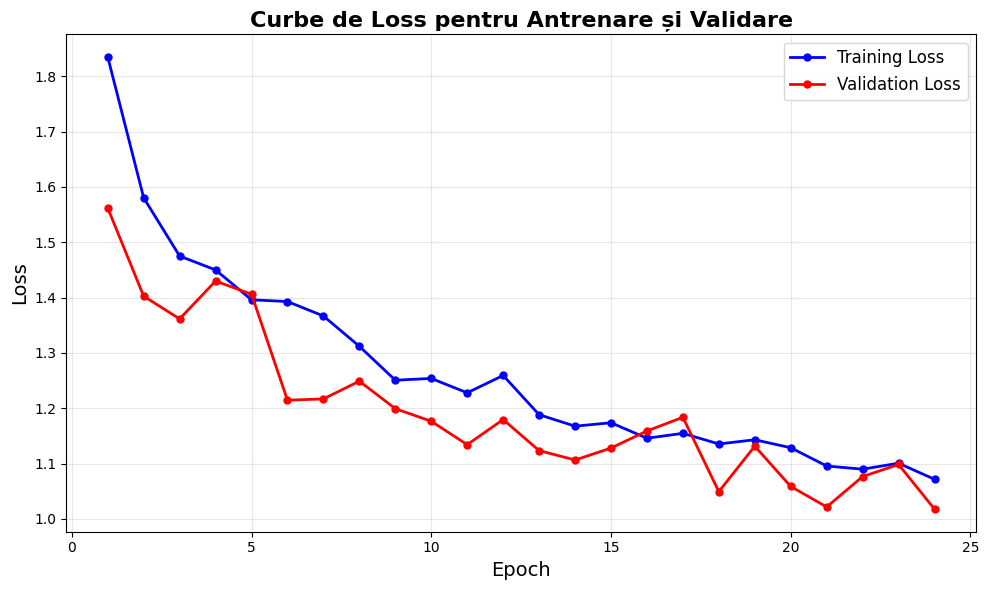

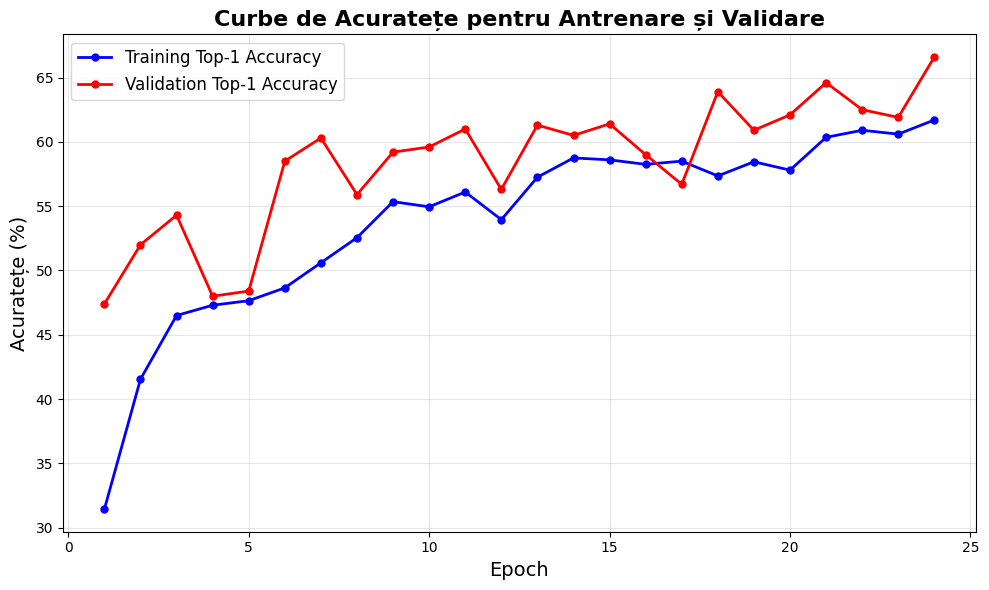

100%|██████████| 63/63 [00:01<00:00, 60.14it/s, epoch=25, train_loss=2.0577, top1_accuracy=125.79%]
Train - Loss: 1.0371, Top-1: 63.40%
100%|██████████| 32/32 [00:00<00:00, 171.63it/s, epoch=25, val_loss=4.0716, top1_accuracy=255.86%]
Val - Loss: 1.0423, Val - Top-1: 65.50%
EarlyStopping counter: 1 out of 7
100%|██████████| 63/63 [00:01<00:00, 60.16it/s, epoch=26, train_loss=2.1226, top1_accuracy=123.91%]
Train - Loss: 1.0698, Top-1: 62.45%
100%|██████████| 32/32 [00:00<00:00, 171.00it/s, epoch=26, val_loss=4.0914, top1_accuracy=243.36%]
Val - Loss: 1.0474, Val - Top-1: 62.30%
EarlyStopping counter: 2 out of 7


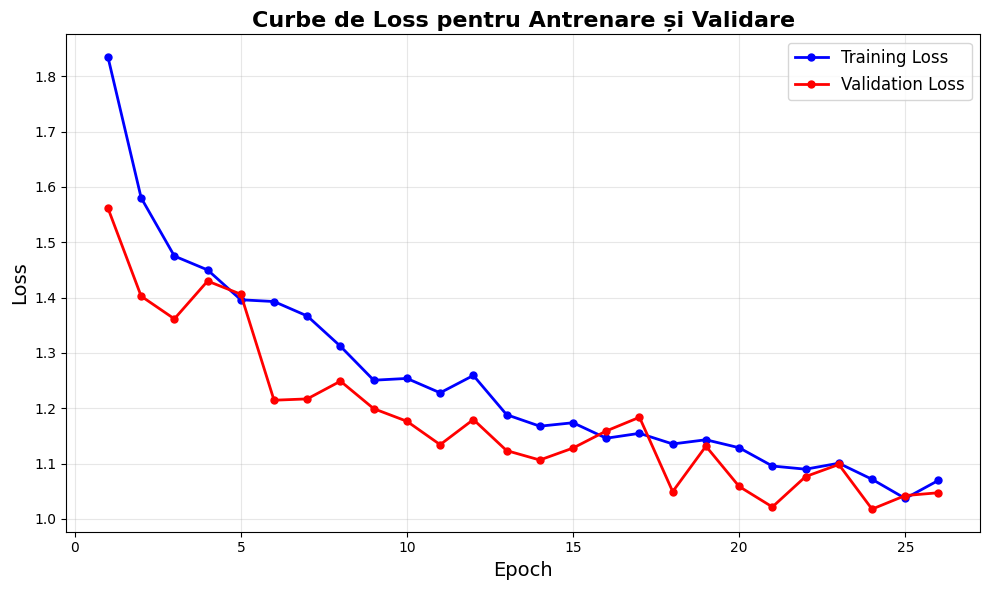

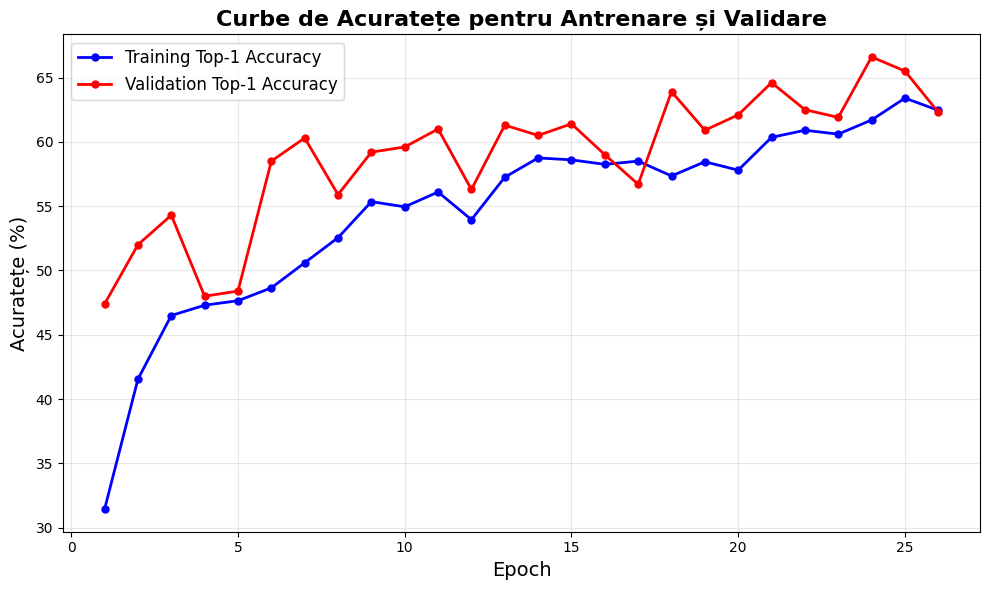

100%|██████████| 63/63 [00:01<00:00, 60.10it/s, epoch=27, train_loss=2.0039, top1_accuracy=126.09%]
Train - Loss: 1.0100, Top-1: 63.55%
100%|██████████| 32/32 [00:00<00:00, 171.37it/s, epoch=27, val_loss=4.0236, top1_accuracy=248.44%]
Val - Loss: 1.0300, Val - Top-1: 63.60%
EarlyStopping counter: 3 out of 7
100%|██████████| 63/63 [00:01<00:00, 60.32it/s, epoch=28, train_loss=2.0392, top1_accuracy=123.61%]
Train - Loss: 1.0278, Top-1: 62.30%
100%|██████████| 32/32 [00:00<00:00, 170.51it/s, epoch=28, val_loss=4.0008, top1_accuracy=256.64%]
Val - Loss: 1.0242, Val - Top-1: 65.70%
EarlyStopping counter: 4 out of 7


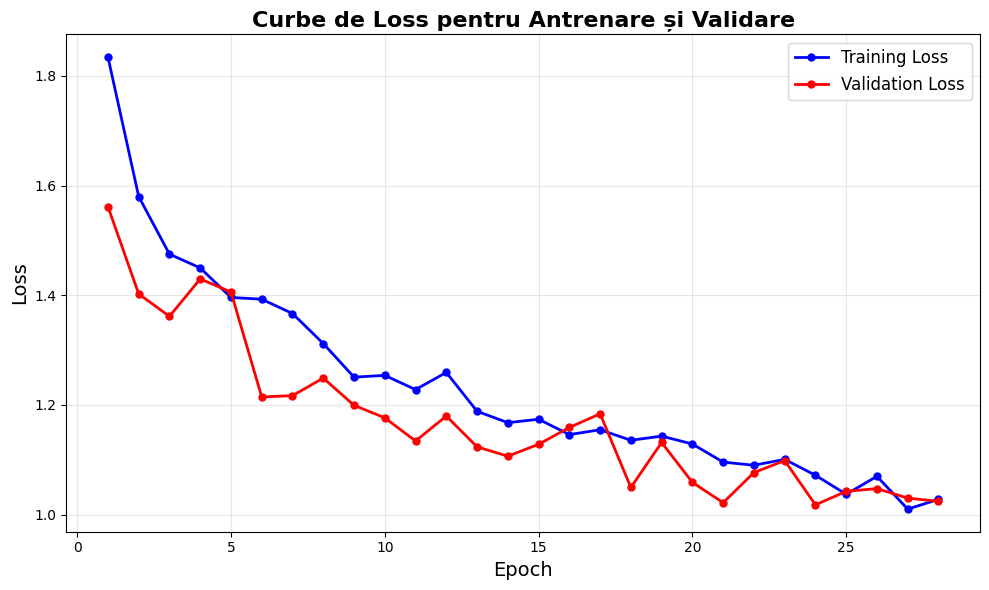

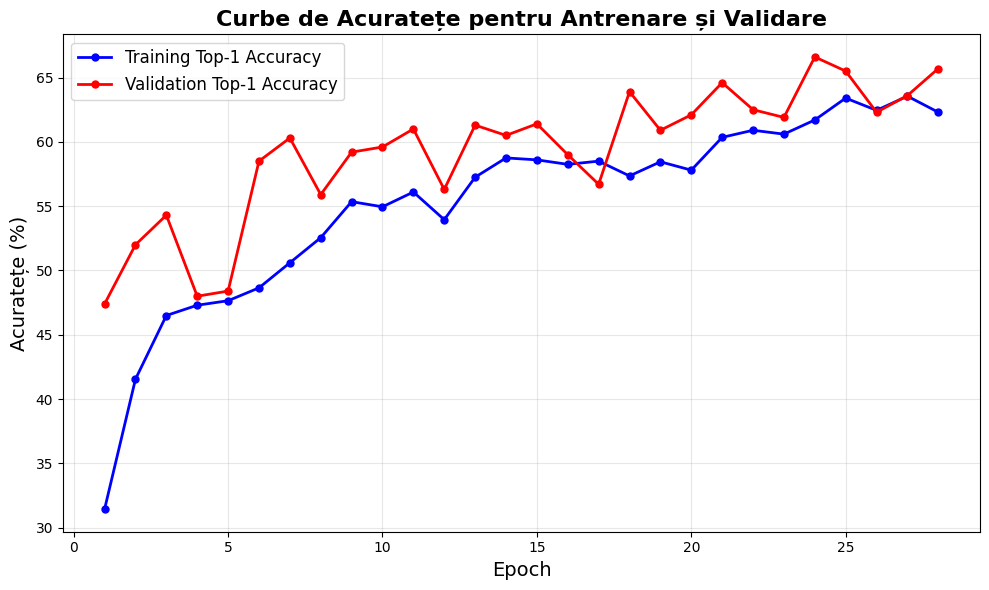

100%|██████████| 63/63 [00:01<00:00, 60.11it/s, epoch=29, train_loss=2.0274, top1_accuracy=126.39%]
Train - Loss: 1.0218, Top-1: 63.70%
100%|██████████| 32/32 [00:00<00:00, 155.05it/s, epoch=29, val_loss=4.2476, top1_accuracy=233.59%]
Val - Loss: 1.0874, Val - Top-1: 59.80%
EarlyStopping counter: 5 out of 7
100%|██████████| 63/63 [00:01<00:00, 58.65it/s, epoch=30, train_loss=2.0349, top1_accuracy=125.40%]
Train - Loss: 1.0256, Top-1: 63.20%
100%|██████████| 32/32 [00:00<00:00, 166.43it/s, epoch=30, val_loss=4.0309, top1_accuracy=254.69%]
Val - Loss: 1.0319, Val - Top-1: 65.20%
EarlyStopping counter: 6 out of 7


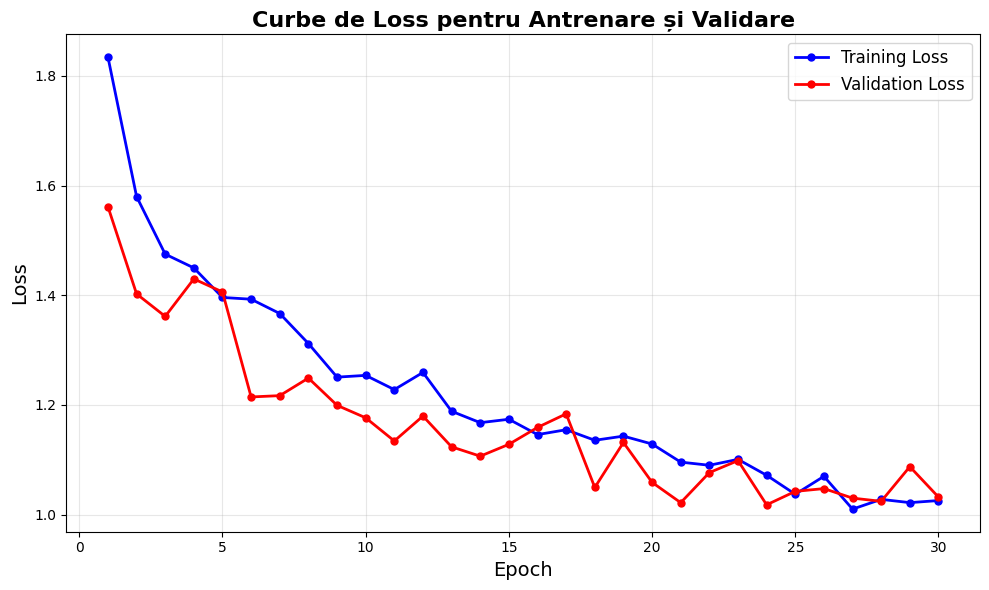

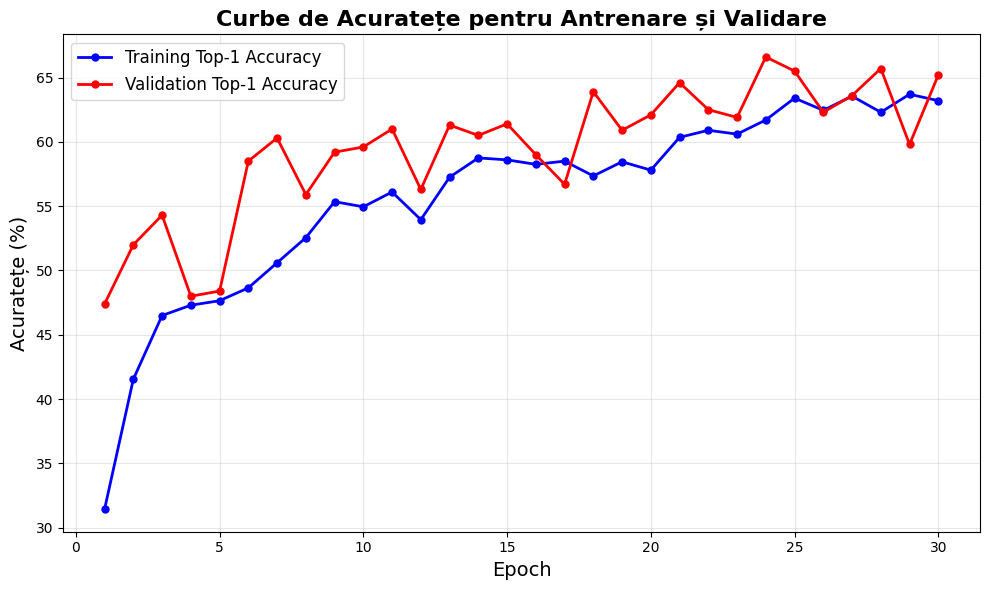

100%|██████████| 63/63 [00:01<00:00, 56.95it/s, epoch=31, train_loss=2.0156, top1_accuracy=125.69%]
Train - Loss: 1.0158, Top-1: 63.35%
100%|██████████| 32/32 [00:00<00:00, 162.10it/s, epoch=31, val_loss=3.9137, top1_accuracy=257.03%]
Val - Loss: 1.0019, Val - Top-1: 65.80%
EarlyStopping counter: 7 out of 7
Early stopping triggered at epoch 31

Model 1 Best Validation Accuracy: 66.60%

Training Model 2/5
Config: lr=0.003, weight_decay=0.0002, lr_decay=0.94

100%|██████████| 63/63 [00:01<00:00, 57.77it/s, epoch=1, train_loss=3.6548, top1_accuracy=60.42%]
Train - Loss: 1.8420, Top-1: 30.45%
100%|██████████| 32/32 [00:00<00:00, 162.76it/s, epoch=1, val_loss=6.4075, top1_accuracy=144.92%]
Val - Loss: 1.6403, Val - Top-1: 37.10%
Validation accuracy increased (-inf → 37.100000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 57.73it/s, epoch=2, train_loss=3.2162, top1_accuracy=78.87%]
Train - Loss: 1.6210, Top-1: 39.75%
100%|██████████| 32/32 [00:00<00:00, 162.72it/s, epoch=2, val_loss

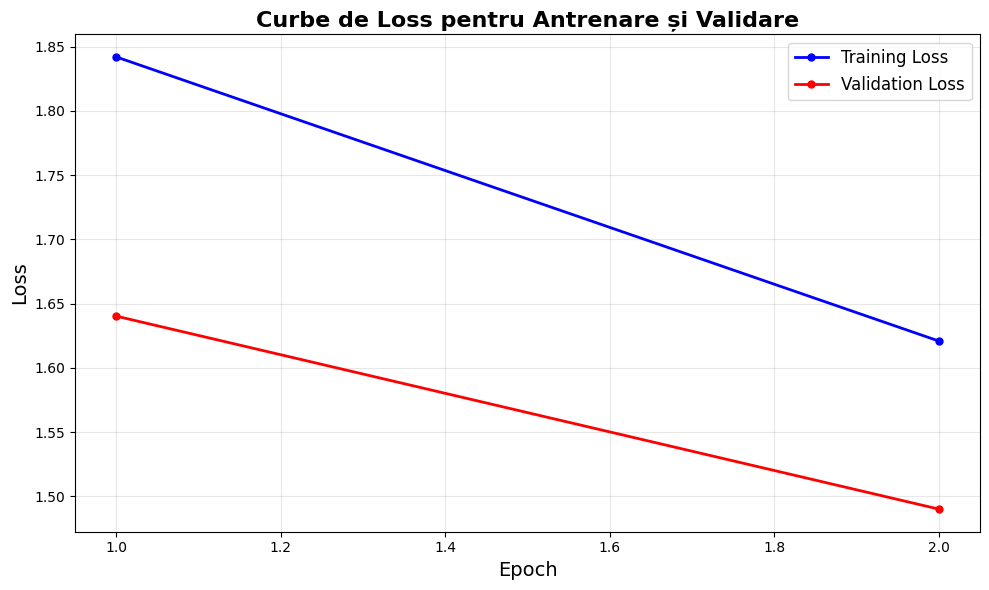

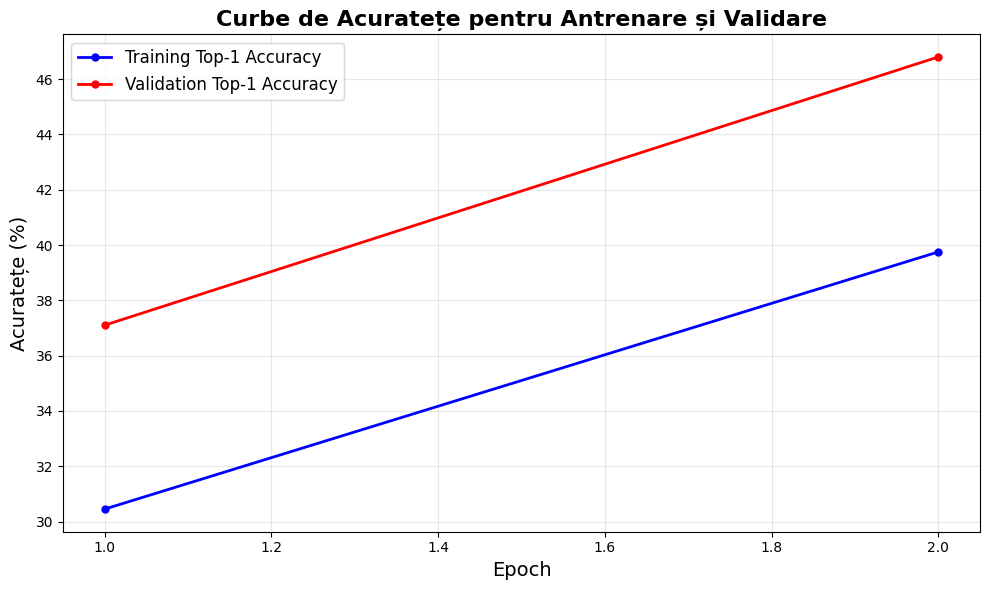

100%|██████████| 63/63 [00:01<00:00, 57.89it/s, epoch=3, train_loss=2.9986, top1_accuracy=88.99%]
Train - Loss: 1.5113, Top-1: 44.85%
100%|██████████| 32/32 [00:00<00:00, 161.31it/s, epoch=3, val_loss=5.5555, top1_accuracy=178.12%]
Val - Loss: 1.4222, Val - Top-1: 45.60%
EarlyStopping counter: 1 out of 7
100%|██████████| 63/63 [00:01<00:00, 57.68it/s, epoch=4, train_loss=2.8595, top1_accuracy=93.25%]
Train - Loss: 1.4412, Top-1: 47.00%
100%|██████████| 32/32 [00:00<00:00, 162.23it/s, epoch=4, val_loss=5.1305, top1_accuracy=201.56%]
Val - Loss: 1.3134, Val - Top-1: 51.60%
Validation accuracy increased (46.800000 → 51.600000). Saving model...


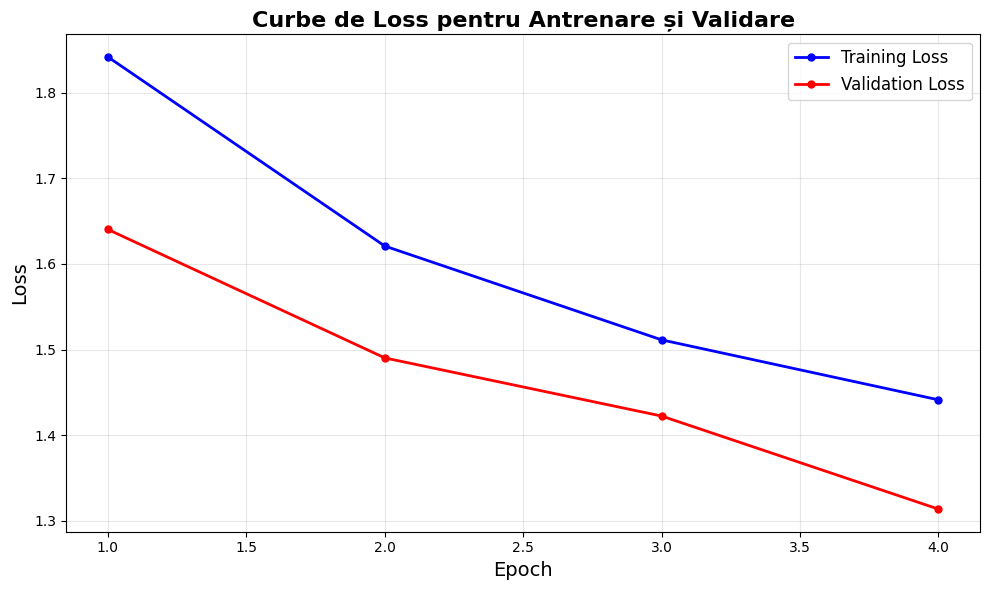

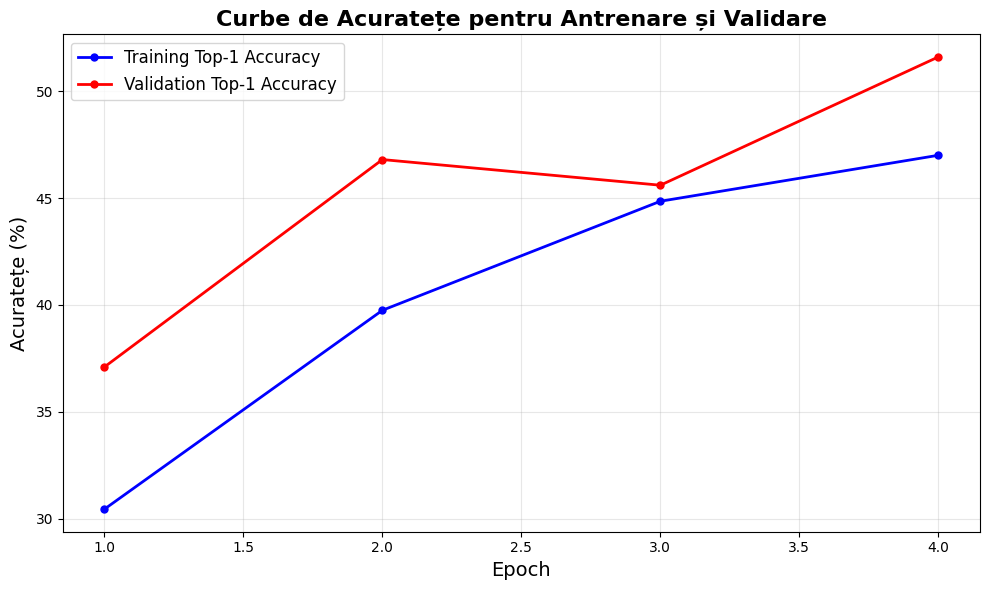

100%|██████████| 63/63 [00:01<00:00, 57.73it/s, epoch=5, train_loss=2.7934, top1_accuracy=96.23%]
Train - Loss: 1.4079, Top-1: 48.50%
100%|██████████| 32/32 [00:00<00:00, 162.31it/s, epoch=5, val_loss=5.3413, top1_accuracy=192.58%]
Val - Loss: 1.3674, Val - Top-1: 49.30%
EarlyStopping counter: 1 out of 7
100%|██████████| 63/63 [00:01<00:00, 57.77it/s, epoch=6, train_loss=2.7411, top1_accuracy=98.12%]
Train - Loss: 1.3815, Top-1: 49.45%
100%|██████████| 32/32 [00:00<00:00, 156.66it/s, epoch=6, val_loss=5.3288, top1_accuracy=194.14%]
Val - Loss: 1.3642, Val - Top-1: 49.70%
EarlyStopping counter: 2 out of 7


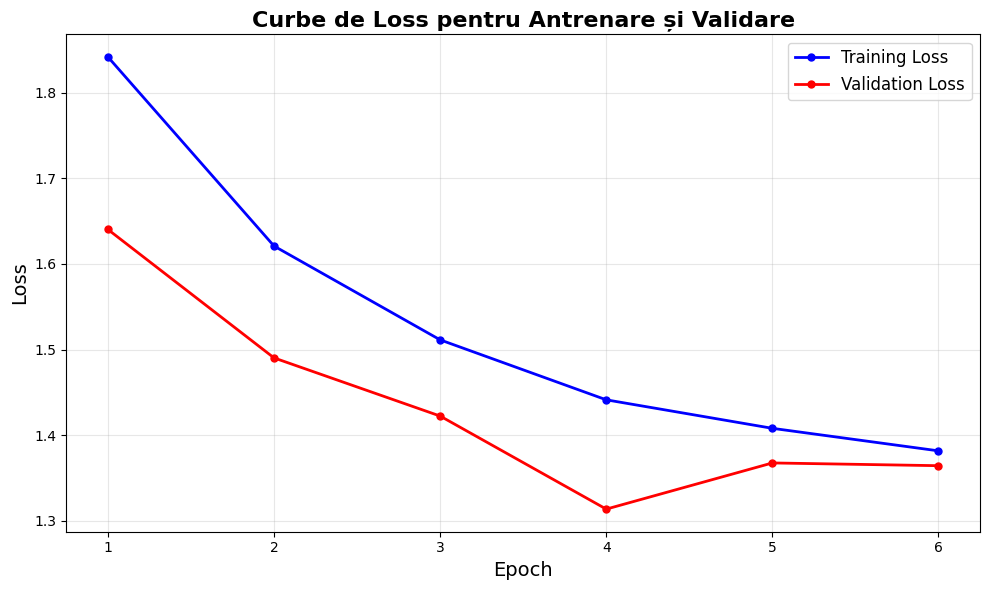

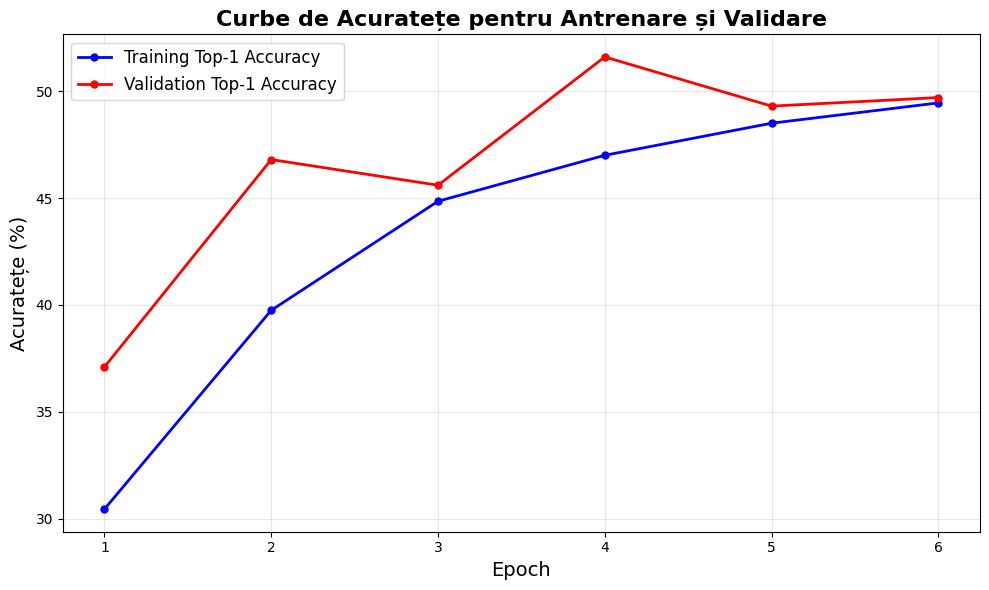

100%|██████████| 63/63 [00:01<00:00, 57.56it/s, epoch=7, train_loss=2.6800, top1_accuracy=100.60%]
Train - Loss: 1.3507, Top-1: 50.70%
100%|██████████| 32/32 [00:00<00:00, 161.27it/s, epoch=7, val_loss=4.7614, top1_accuracy=221.48%]
Val - Loss: 1.2189, Val - Top-1: 56.70%
Validation accuracy increased (51.600000 → 56.700000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 57.69it/s, epoch=8, train_loss=2.5721, top1_accuracy=106.55%]
Train - Loss: 1.2963, Top-1: 53.70%
100%|██████████| 32/32 [00:00<00:00, 161.77it/s, epoch=8, val_loss=4.5388, top1_accuracy=233.59%]
Val - Loss: 1.1619, Val - Top-1: 59.80%
Validation accuracy increased (56.700000 → 59.800000). Saving model...


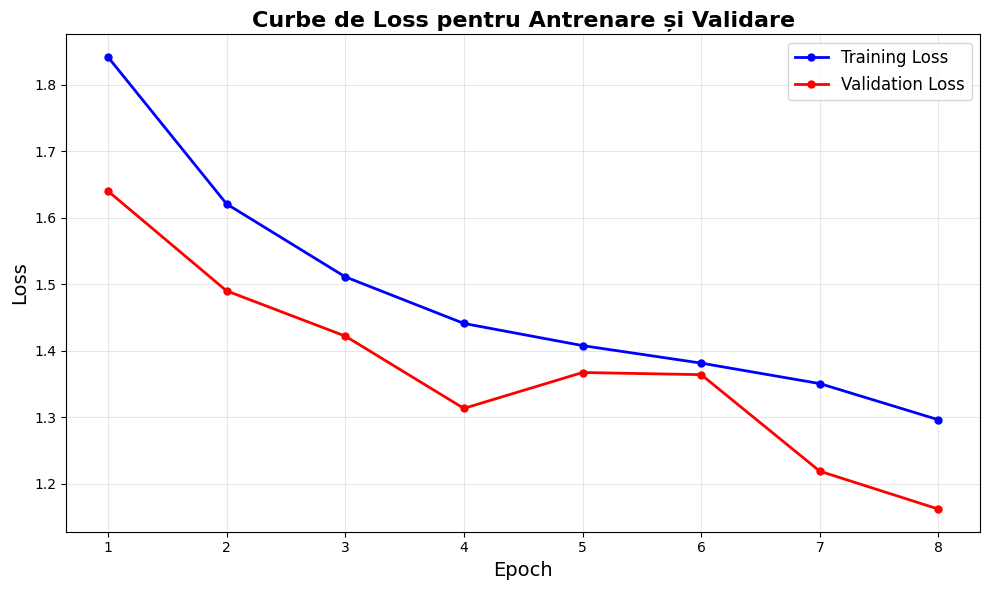

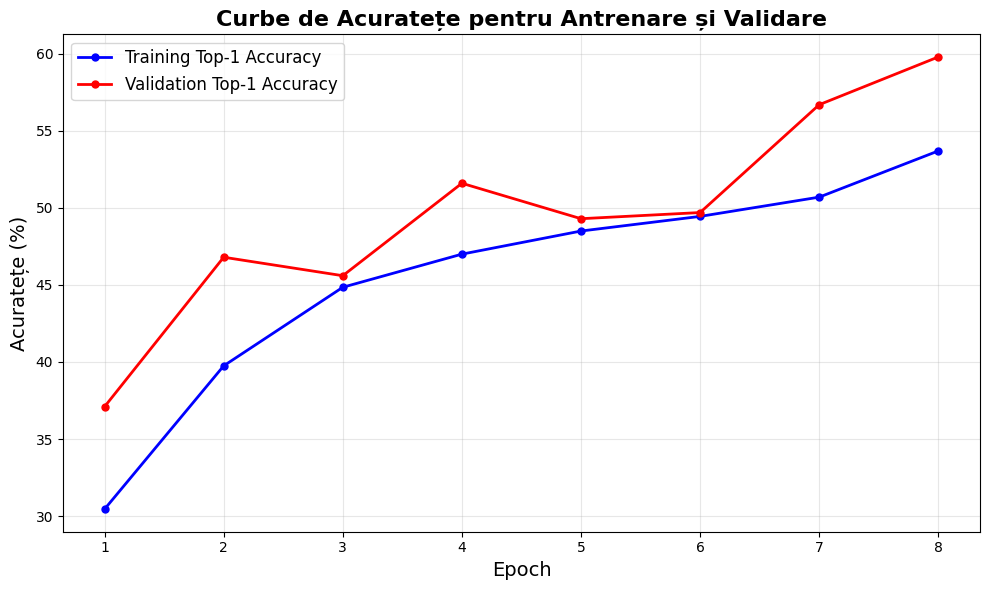

100%|██████████| 63/63 [00:01<00:00, 56.79it/s, epoch=9, train_loss=2.5062, top1_accuracy=106.75%]
Train - Loss: 1.2631, Top-1: 53.80%
100%|██████████| 32/32 [00:00<00:00, 160.28it/s, epoch=9, val_loss=4.6243, top1_accuracy=230.08%]
Val - Loss: 1.1838, Val - Top-1: 58.90%
EarlyStopping counter: 1 out of 7
100%|██████████| 63/63 [00:01<00:00, 57.39it/s, epoch=10, train_loss=2.5511, top1_accuracy=105.06%]
Train - Loss: 1.2858, Top-1: 52.95%
100%|██████████| 32/32 [00:00<00:00, 159.06it/s, epoch=10, val_loss=4.5798, top1_accuracy=237.50%]
Val - Loss: 1.1724, Val - Top-1: 60.80%
Validation accuracy increased (59.800000 → 60.800000). Saving model...


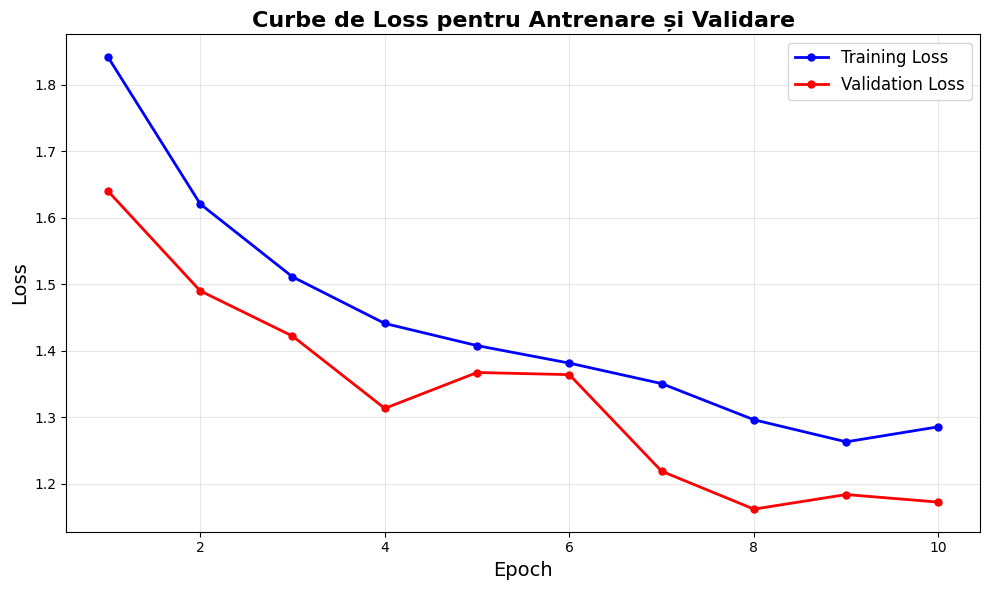

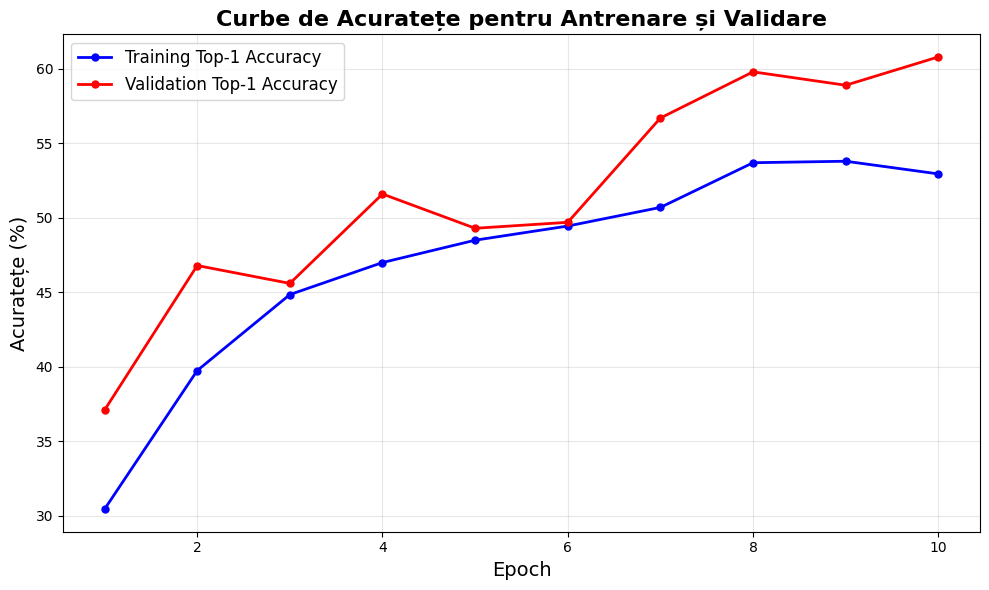

100%|██████████| 63/63 [00:01<00:00, 56.95it/s, epoch=11, train_loss=2.4455, top1_accuracy=107.04%]
Train - Loss: 1.2325, Top-1: 53.95%
100%|██████████| 32/32 [00:00<00:00, 155.11it/s, epoch=11, val_loss=5.2313, top1_accuracy=201.56%]
Val - Loss: 1.3392, Val - Top-1: 51.60%
EarlyStopping counter: 1 out of 7
100%|██████████| 63/63 [00:01<00:00, 56.85it/s, epoch=12, train_loss=2.4192, top1_accuracy=110.32%]
Train - Loss: 1.2193, Top-1: 55.60%
100%|██████████| 32/32 [00:00<00:00, 166.14it/s, epoch=12, val_loss=4.3405, top1_accuracy=242.19%]
Val - Loss: 1.1112, Val - Top-1: 62.00%
Validation accuracy increased (60.800000 → 62.000000). Saving model...


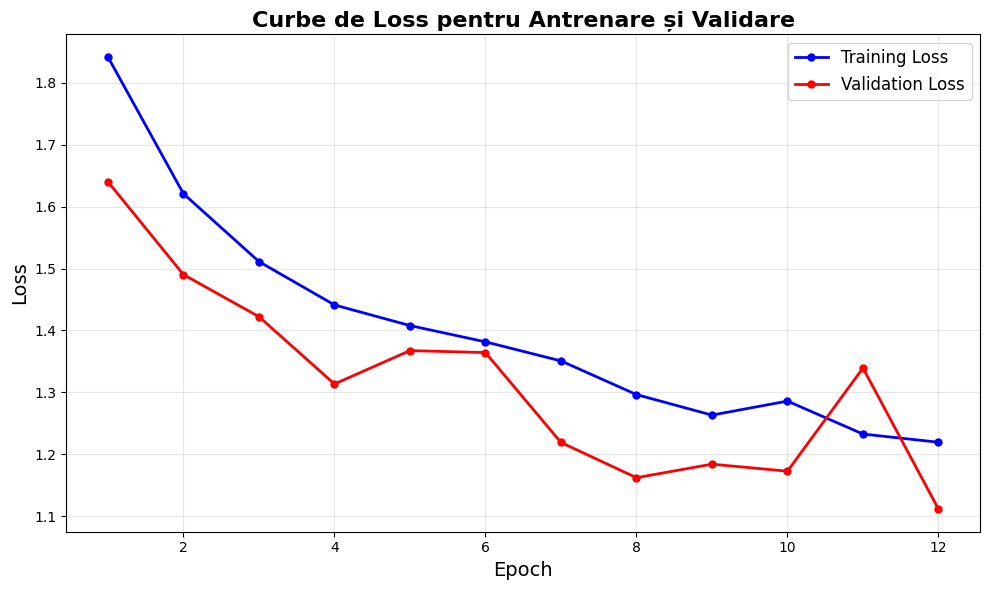

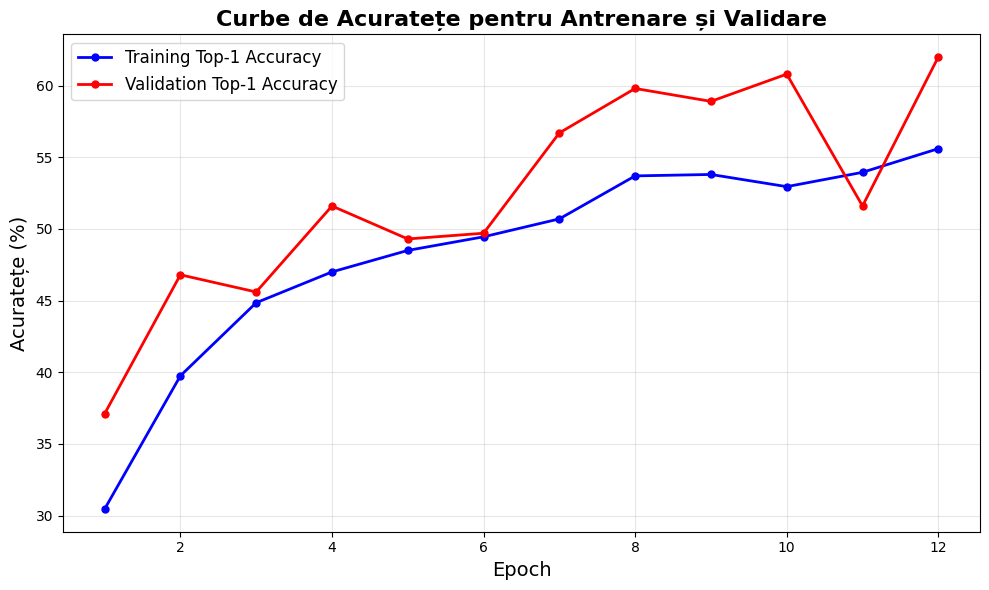

100%|██████████| 63/63 [00:01<00:00, 56.91it/s, epoch=13, train_loss=2.4670, top1_accuracy=108.83%]
Train - Loss: 1.2434, Top-1: 54.85%
100%|██████████| 32/32 [00:00<00:00, 167.42it/s, epoch=13, val_loss=4.6491, top1_accuracy=216.80%]
Val - Loss: 1.1902, Val - Top-1: 55.50%
EarlyStopping counter: 1 out of 7
100%|██████████| 63/63 [00:01<00:00, 58.37it/s, epoch=14, train_loss=2.3780, top1_accuracy=111.71%]
Train - Loss: 1.1985, Top-1: 56.30%
100%|██████████| 32/32 [00:00<00:00, 170.67it/s, epoch=14, val_loss=4.2652, top1_accuracy=241.02%]
Val - Loss: 1.0919, Val - Top-1: 61.70%
EarlyStopping counter: 2 out of 7


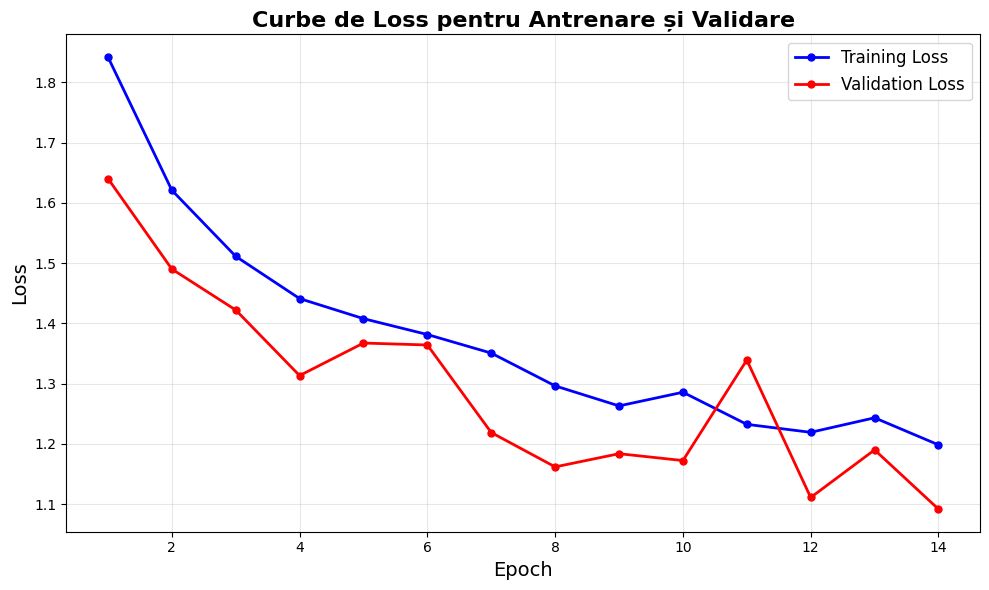

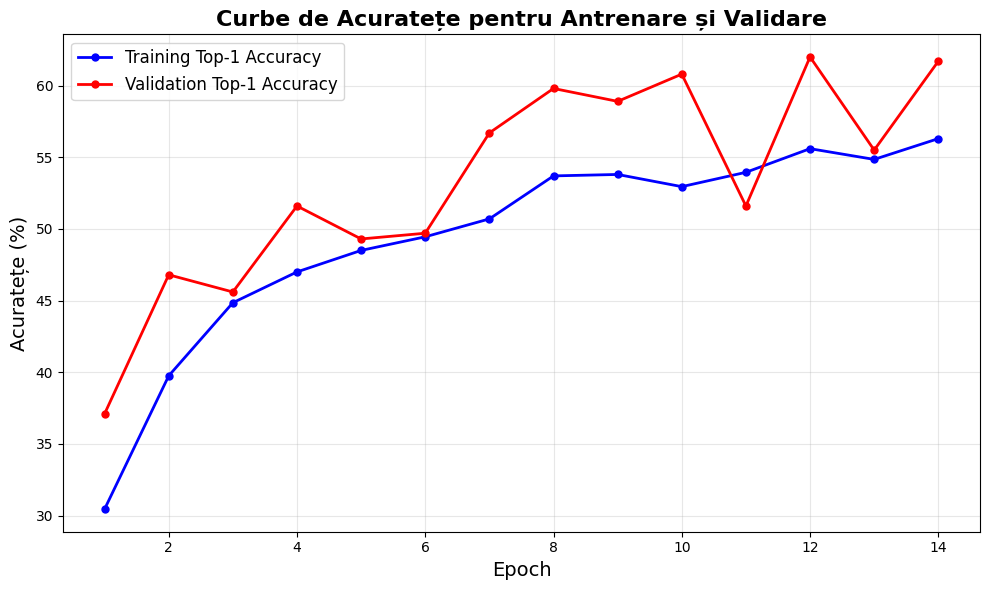

100%|██████████| 63/63 [00:01<00:00, 58.02it/s, epoch=15, train_loss=2.3018, top1_accuracy=116.07%]
Train - Loss: 1.1601, Top-1: 58.50%
100%|██████████| 32/32 [00:00<00:00, 160.23it/s, epoch=15, val_loss=4.3603, top1_accuracy=239.45%]
Val - Loss: 1.1162, Val - Top-1: 61.30%
EarlyStopping counter: 3 out of 7
100%|██████████| 63/63 [00:01<00:00, 57.35it/s, epoch=16, train_loss=2.3345, top1_accuracy=113.99%]
Train - Loss: 1.1766, Top-1: 57.45%
100%|██████████| 32/32 [00:00<00:00, 159.85it/s, epoch=16, val_loss=4.5918, top1_accuracy=221.88%]
Val - Loss: 1.1755, Val - Top-1: 56.80%
EarlyStopping counter: 4 out of 7


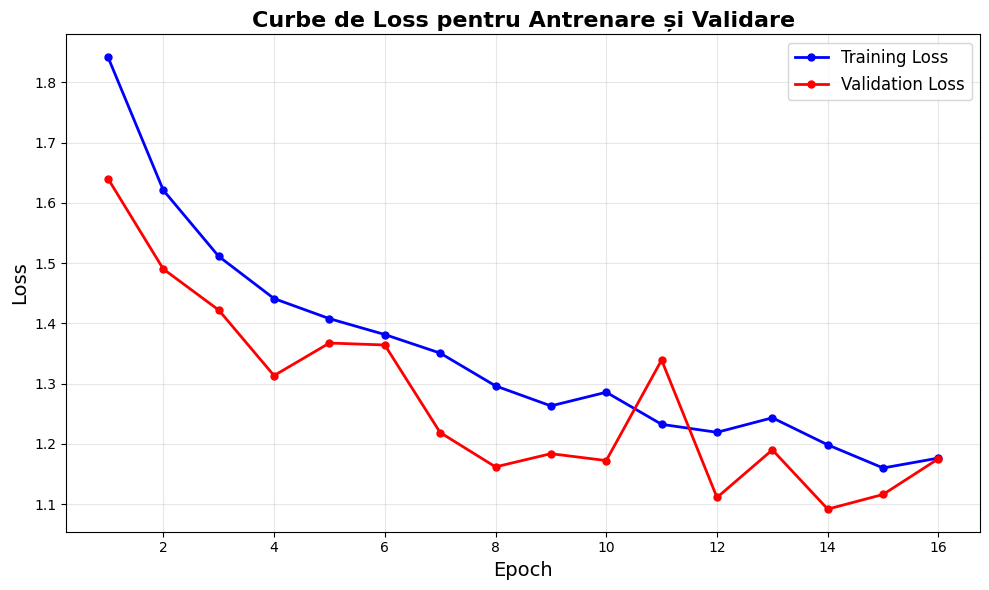

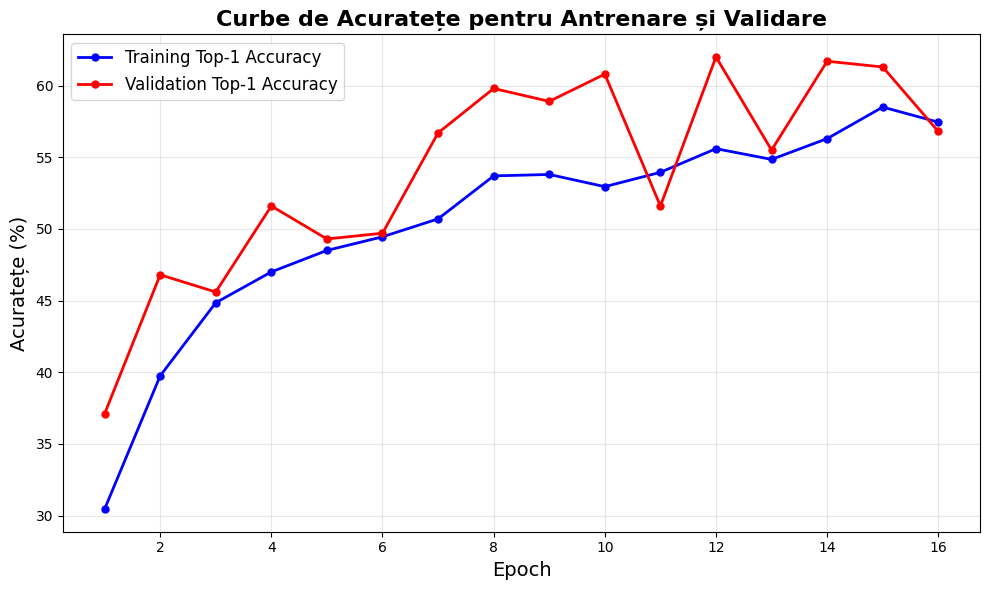

100%|██████████| 63/63 [00:01<00:00, 56.67it/s, epoch=17, train_loss=2.2451, top1_accuracy=117.96%]
Train - Loss: 1.1315, Top-1: 59.45%
100%|██████████| 32/32 [00:00<00:00, 159.47it/s, epoch=17, val_loss=4.2021, top1_accuracy=250.00%]
Val - Loss: 1.0757, Val - Top-1: 64.00%
Validation accuracy increased (62.000000 → 64.000000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 57.24it/s, epoch=18, train_loss=2.2386, top1_accuracy=117.26%]
Train - Loss: 1.1282, Top-1: 59.10%
100%|██████████| 32/32 [00:00<00:00, 158.80it/s, epoch=18, val_loss=4.3198, top1_accuracy=246.48%]
Val - Loss: 1.1059, Val - Top-1: 63.10%
EarlyStopping counter: 1 out of 7


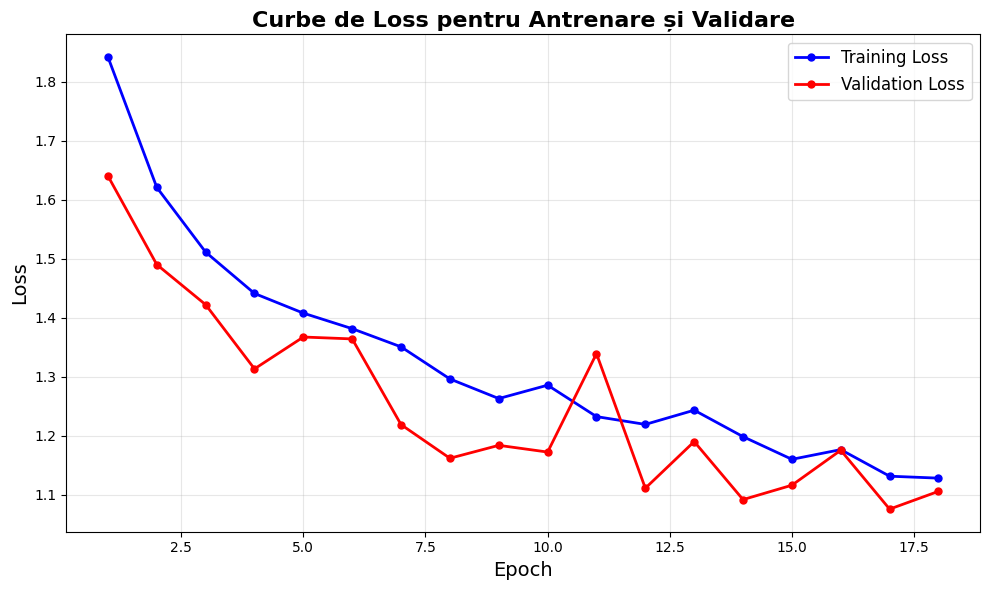

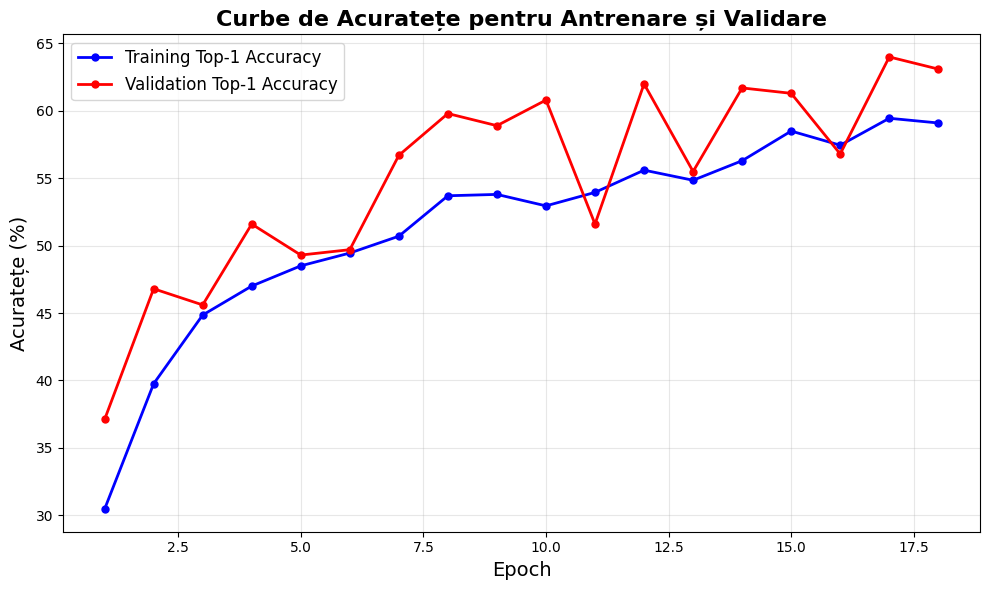

100%|██████████| 63/63 [00:01<00:00, 53.56it/s, epoch=19, train_loss=2.2264, top1_accuracy=115.77%]
Train - Loss: 1.1221, Top-1: 58.35%
100%|██████████| 32/32 [00:00<00:00, 158.31it/s, epoch=19, val_loss=4.3712, top1_accuracy=238.67%]
Val - Loss: 1.1190, Val - Top-1: 61.10%
EarlyStopping counter: 2 out of 7
100%|██████████| 63/63 [00:01<00:00, 57.03it/s, epoch=20, train_loss=2.2058, top1_accuracy=119.74%]
Train - Loss: 1.1117, Top-1: 60.35%
100%|██████████| 32/32 [00:00<00:00, 159.55it/s, epoch=20, val_loss=4.1319, top1_accuracy=248.44%]
Val - Loss: 1.0578, Val - Top-1: 63.60%
EarlyStopping counter: 3 out of 7


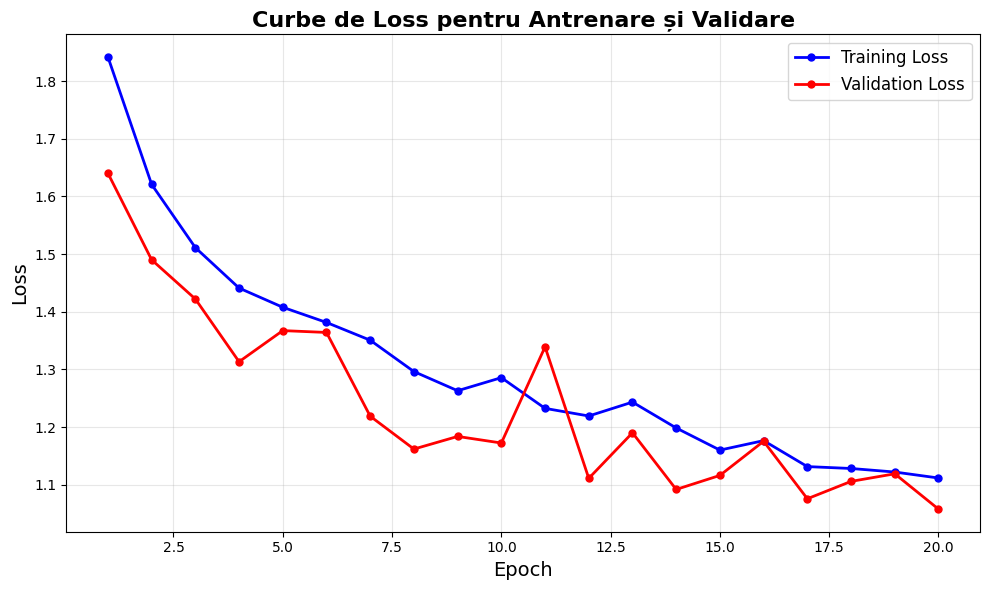

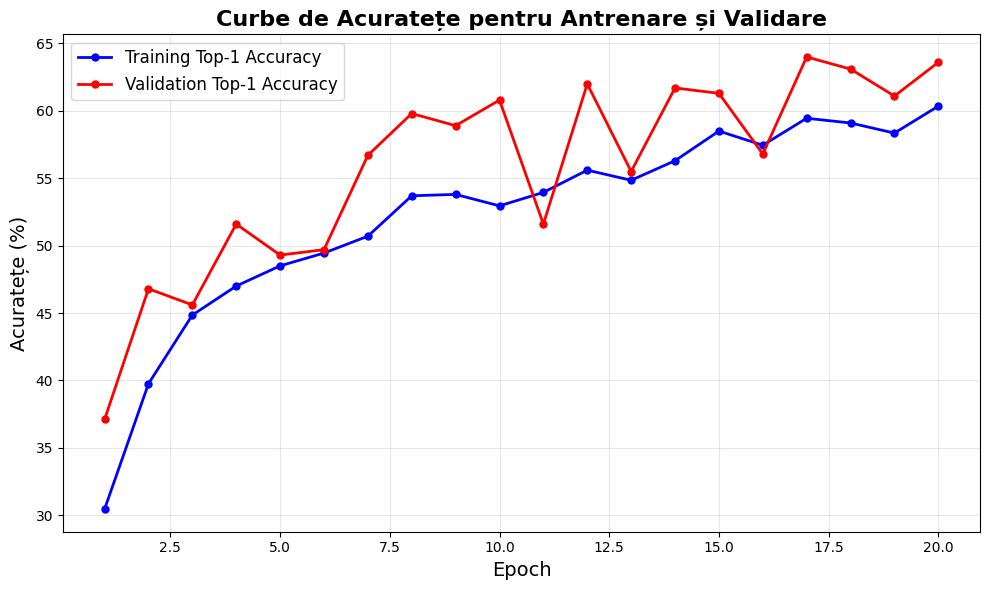

100%|██████████| 63/63 [00:01<00:00, 57.09it/s, epoch=21, train_loss=2.2636, top1_accuracy=118.95%]
Train - Loss: 1.1409, Top-1: 59.95%
100%|██████████| 32/32 [00:00<00:00, 158.64it/s, epoch=21, val_loss=4.2761, top1_accuracy=239.45%]
Val - Loss: 1.0947, Val - Top-1: 61.30%
EarlyStopping counter: 4 out of 7
100%|██████████| 63/63 [00:01<00:00, 56.66it/s, epoch=22, train_loss=2.1929, top1_accuracy=116.77%]
Train - Loss: 1.1052, Top-1: 58.85%
100%|██████████| 32/32 [00:00<00:00, 157.41it/s, epoch=22, val_loss=4.1531, top1_accuracy=244.53%]
Val - Loss: 1.0632, Val - Top-1: 62.60%
EarlyStopping counter: 5 out of 7


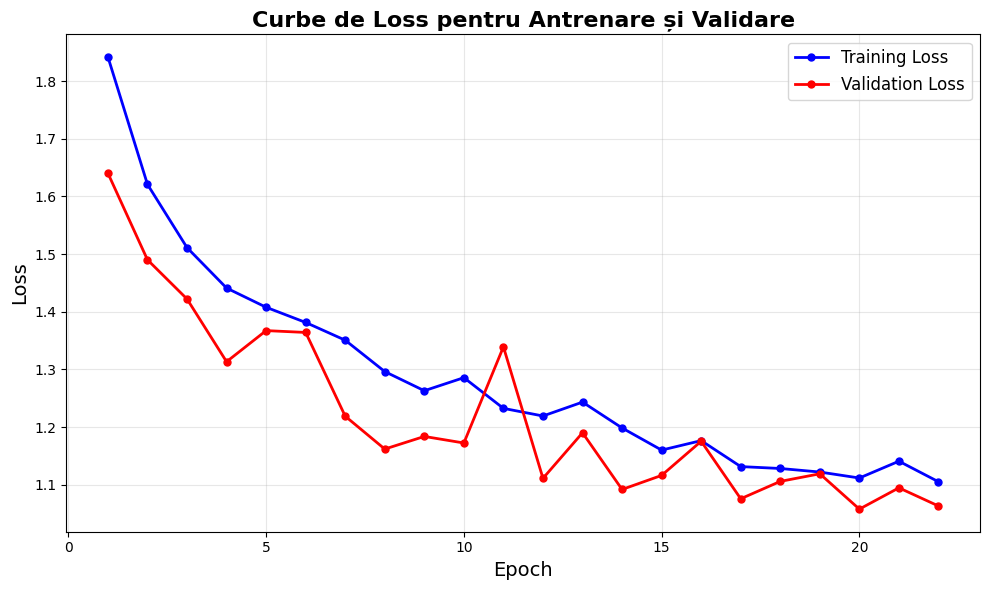

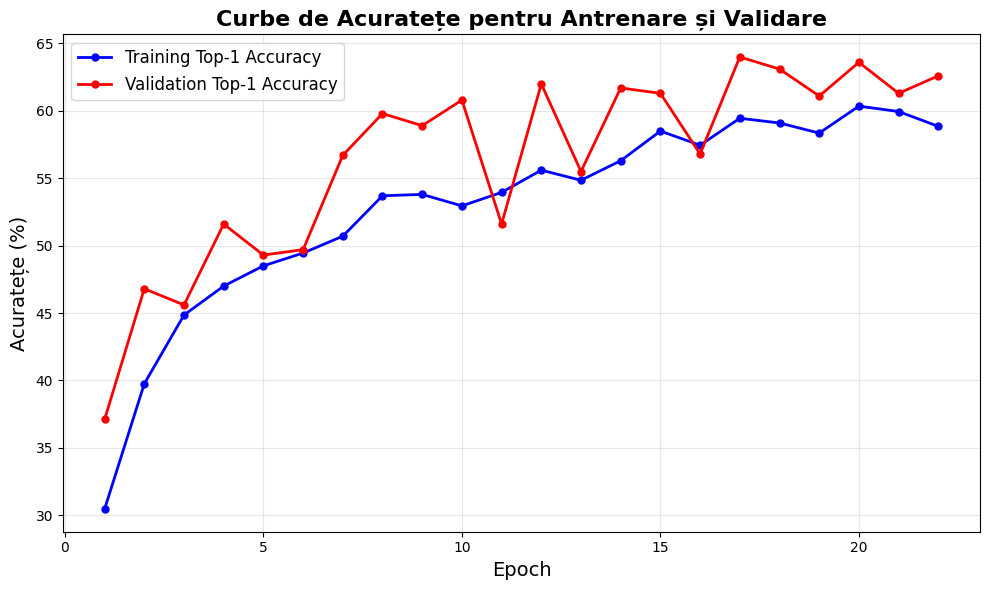

100%|██████████| 63/63 [00:01<00:00, 56.94it/s, epoch=23, train_loss=2.1668, top1_accuracy=119.15%]
Train - Loss: 1.0921, Top-1: 60.05%
100%|██████████| 32/32 [00:00<00:00, 158.70it/s, epoch=23, val_loss=4.1443, top1_accuracy=250.78%]
Val - Loss: 1.0609, Val - Top-1: 64.20%
Validation accuracy increased (64.000000 → 64.200000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 58.26it/s, epoch=24, train_loss=2.1722, top1_accuracy=120.34%]
Train - Loss: 1.0948, Top-1: 60.65%
100%|██████████| 32/32 [00:00<00:00, 167.63it/s, epoch=24, val_loss=4.3012, top1_accuracy=232.03%]
Val - Loss: 1.1011, Val - Top-1: 59.40%
EarlyStopping counter: 1 out of 7


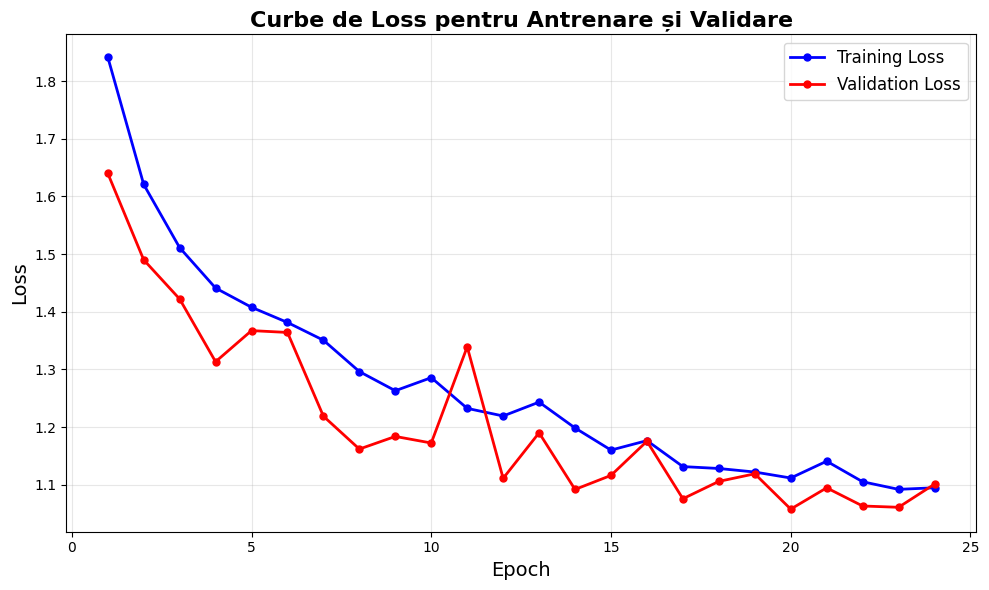

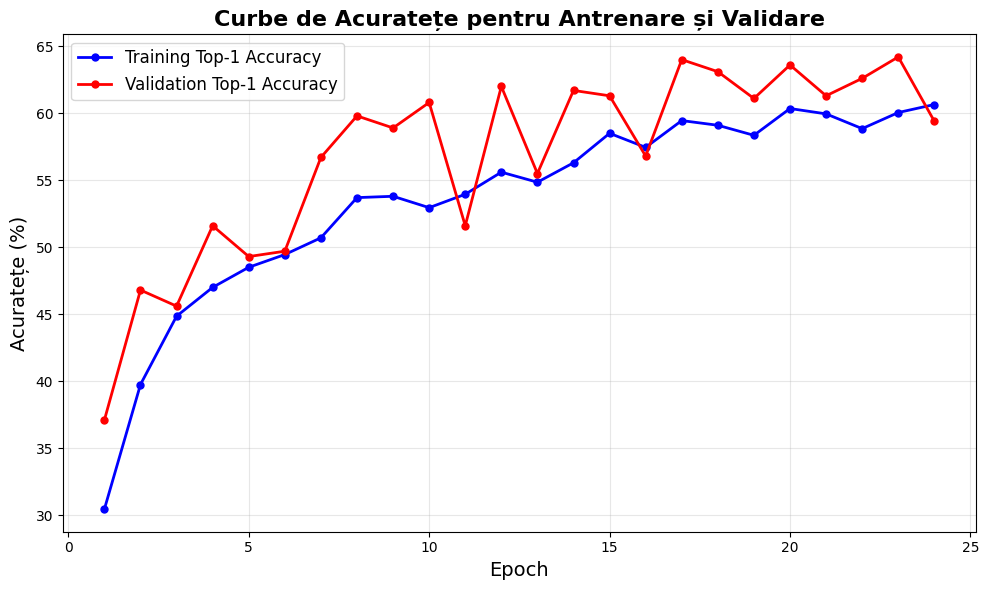

100%|██████████| 63/63 [00:01<00:00, 57.34it/s, epoch=25, train_loss=2.1516, top1_accuracy=119.74%]
Train - Loss: 1.0844, Top-1: 60.35%
100%|██████████| 32/32 [00:00<00:00, 157.19it/s, epoch=25, val_loss=4.1159, top1_accuracy=248.05%]
Val - Loss: 1.0537, Val - Top-1: 63.50%
EarlyStopping counter: 2 out of 7
100%|██████████| 63/63 [00:01<00:00, 56.80it/s, epoch=26, train_loss=2.0740, top1_accuracy=124.70%]
Train - Loss: 1.0453, Top-1: 62.85%
100%|██████████| 32/32 [00:00<00:00, 151.00it/s, epoch=26, val_loss=4.1449, top1_accuracy=246.09%]
Val - Loss: 1.0611, Val - Top-1: 63.00%
EarlyStopping counter: 3 out of 7


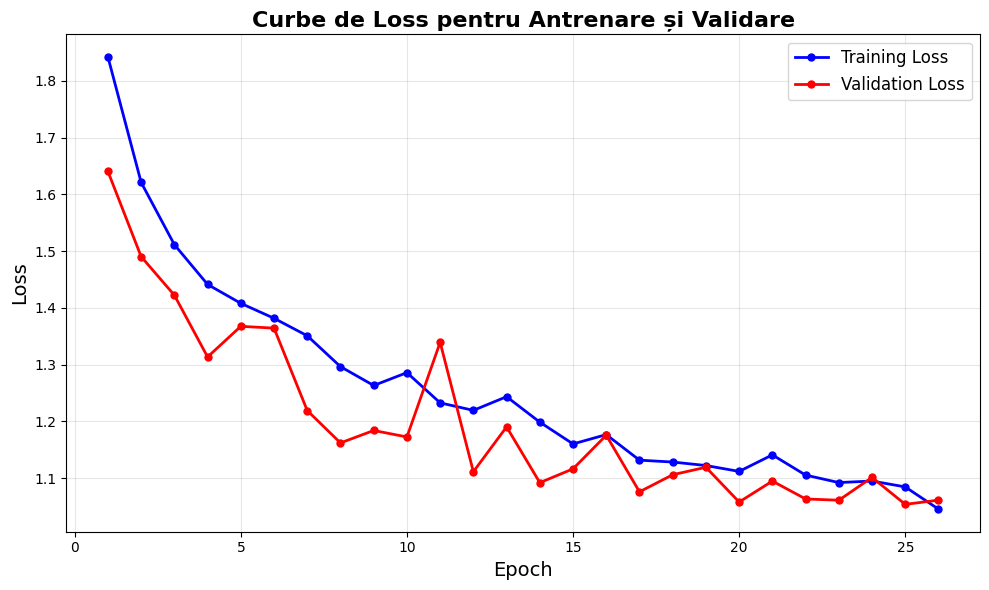

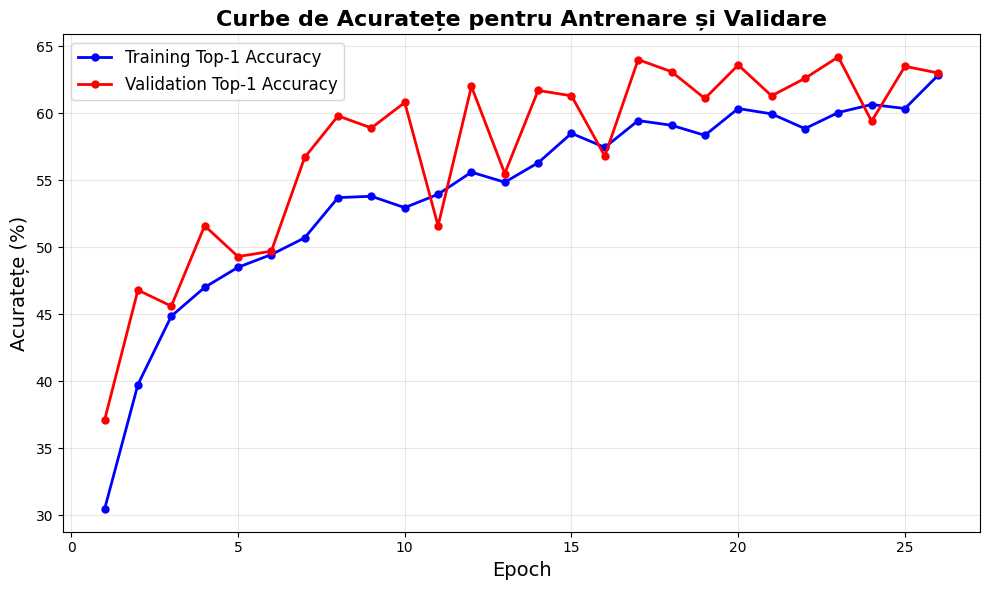

100%|██████████| 63/63 [00:01<00:00, 57.58it/s, epoch=27, train_loss=2.0622, top1_accuracy=123.02%]
Train - Loss: 1.0393, Top-1: 62.00%
100%|██████████| 32/32 [00:00<00:00, 157.89it/s, epoch=27, val_loss=4.3064, top1_accuracy=232.42%]
Val - Loss: 1.1025, Val - Top-1: 59.50%
EarlyStopping counter: 4 out of 7
100%|██████████| 63/63 [00:01<00:00, 57.47it/s, epoch=28, train_loss=2.0433, top1_accuracy=121.43%]
Train - Loss: 1.0298, Top-1: 61.20%
100%|██████████| 32/32 [00:00<00:00, 161.11it/s, epoch=28, val_loss=4.2177, top1_accuracy=241.80%]
Val - Loss: 1.0797, Val - Top-1: 61.90%
EarlyStopping counter: 5 out of 7


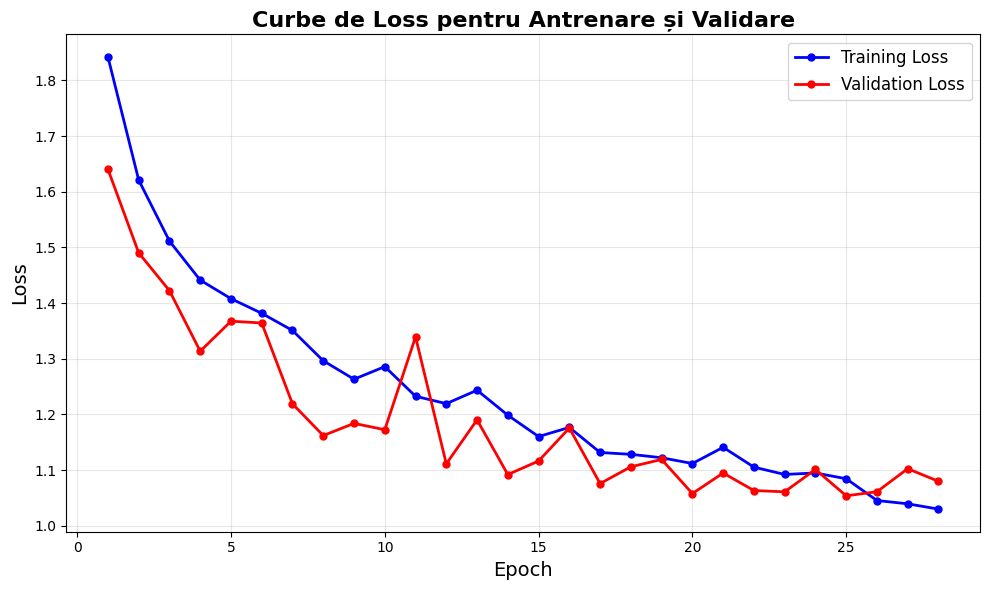

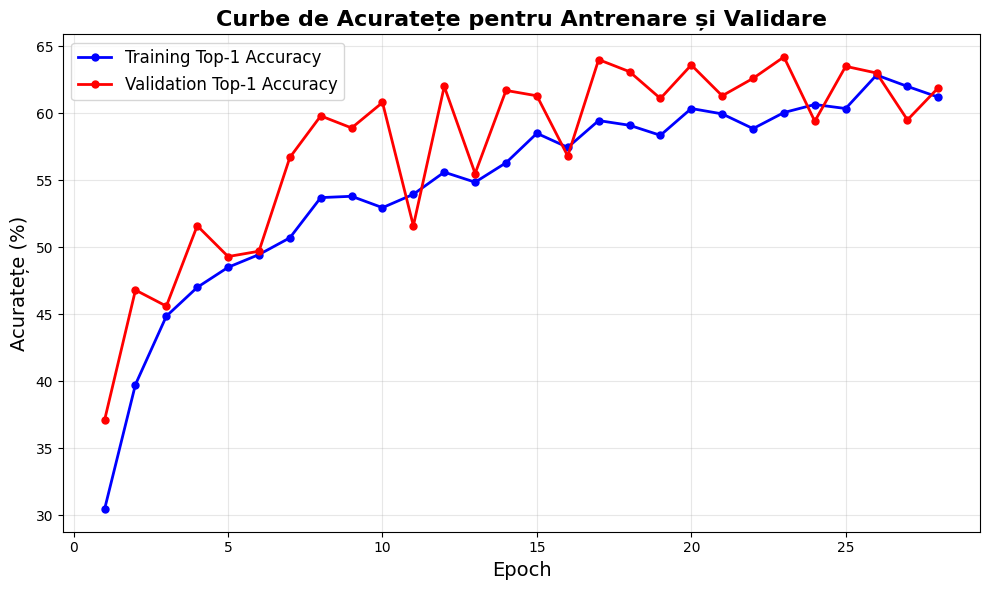

100%|██████████| 63/63 [00:01<00:00, 56.51it/s, epoch=29, train_loss=2.0055, top1_accuracy=127.88%]
Train - Loss: 1.0108, Top-1: 64.45%
100%|██████████| 32/32 [00:00<00:00, 157.98it/s, epoch=29, val_loss=4.0780, top1_accuracy=249.61%]
Val - Loss: 1.0440, Val - Top-1: 63.90%
EarlyStopping counter: 6 out of 7
100%|██████████| 63/63 [00:01<00:00, 57.00it/s, epoch=30, train_loss=2.0048, top1_accuracy=125.40%]
Train - Loss: 1.0104, Top-1: 63.20%
100%|██████████| 32/32 [00:00<00:00, 158.11it/s, epoch=30, val_loss=4.0999, top1_accuracy=243.75%]
Val - Loss: 1.0496, Val - Top-1: 62.40%
EarlyStopping counter: 7 out of 7
Early stopping triggered at epoch 30

Model 2 Best Validation Accuracy: 64.20%

Training Model 3/5
Config: lr=0.003, weight_decay=0.0003, lr_decay=0.92

100%|██████████| 63/63 [00:01<00:00, 57.64it/s, epoch=1, train_loss=3.5314, top1_accuracy=69.15%]
Train - Loss: 1.7798, Top-1: 34.85%
100%|██████████| 32/32 [00:00<00:00, 166.75it/s, epoch=1, val_loss=6.2990, top1_accuracy=153.91

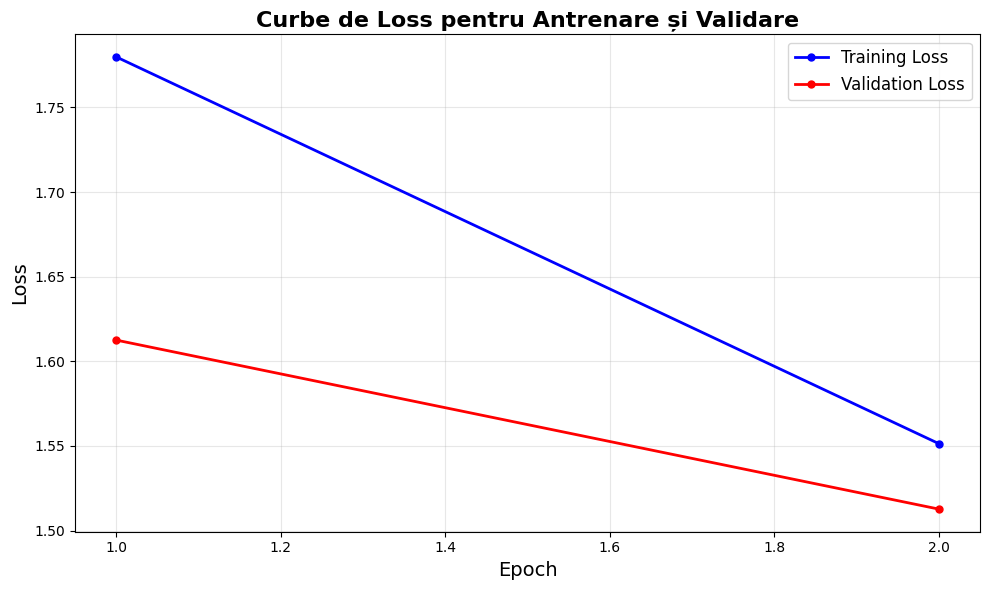

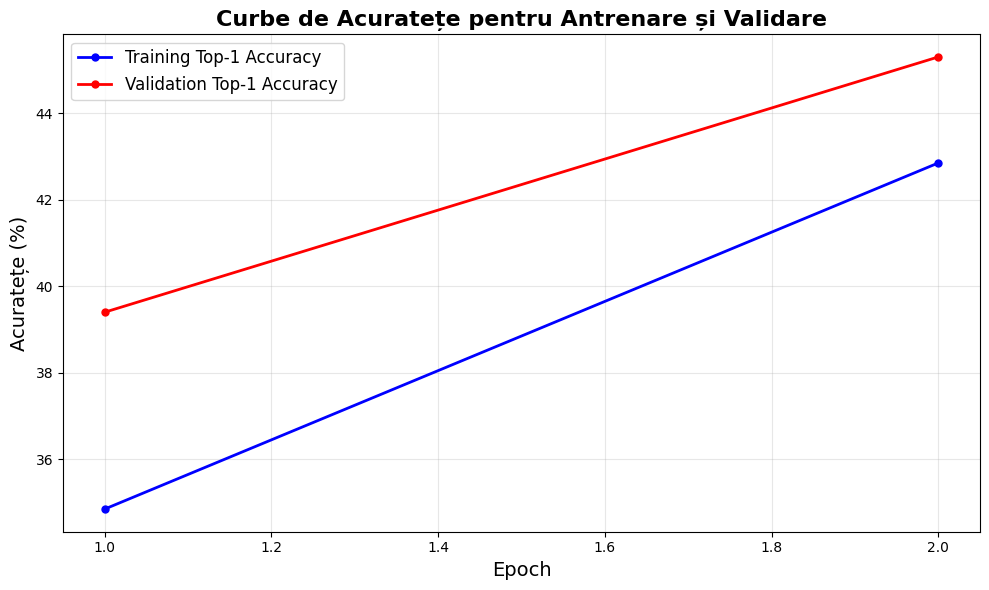

100%|██████████| 63/63 [00:01<00:00, 59.06it/s, epoch=3, train_loss=2.9995, top1_accuracy=86.41%]
Train - Loss: 1.5118, Top-1: 43.55%
100%|██████████| 32/32 [00:00<00:00, 171.78it/s, epoch=3, val_loss=5.4030, top1_accuracy=188.28%]
Val - Loss: 1.3832, Val - Top-1: 48.20%
Validation accuracy increased (45.300000 → 48.200000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 60.06it/s, epoch=4, train_loss=2.8373, top1_accuracy=93.06%]
Train - Loss: 1.4300, Top-1: 46.90%
100%|██████████| 32/32 [00:00<00:00, 170.88it/s, epoch=4, val_loss=5.2353, top1_accuracy=201.17%]
Val - Loss: 1.3402, Val - Top-1: 51.50%
Validation accuracy increased (48.200000 → 51.500000). Saving model...


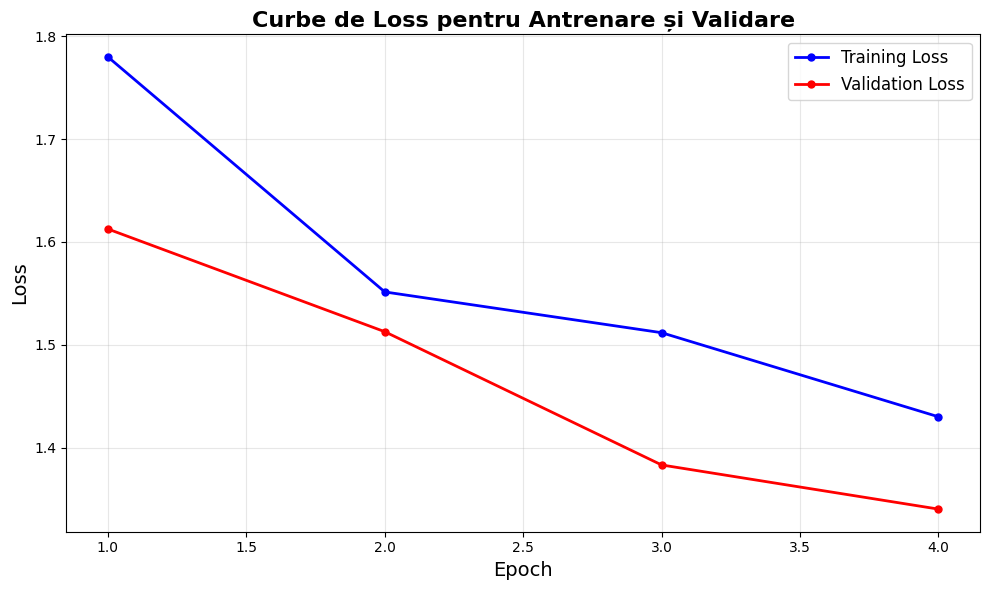

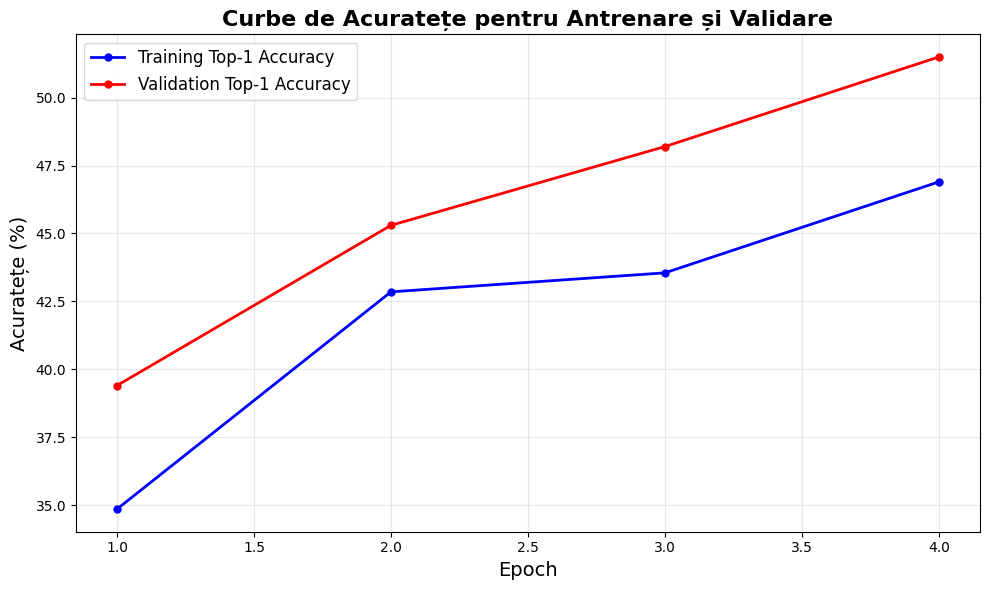

100%|██████████| 63/63 [00:01<00:00, 59.39it/s, epoch=5, train_loss=2.8300, top1_accuracy=93.95%]
Train - Loss: 1.4263, Top-1: 47.35%
100%|██████████| 32/32 [00:00<00:00, 171.33it/s, epoch=5, val_loss=4.9487, top1_accuracy=211.33%]
Val - Loss: 1.2669, Val - Top-1: 54.10%
Validation accuracy increased (51.500000 → 54.100000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 60.19it/s, epoch=6, train_loss=2.7661, top1_accuracy=98.61%]
Train - Loss: 1.3941, Top-1: 49.70%
100%|██████████| 32/32 [00:00<00:00, 170.80it/s, epoch=6, val_loss=5.0551, top1_accuracy=208.59%]
Val - Loss: 1.2941, Val - Top-1: 53.40%
EarlyStopping counter: 1 out of 7


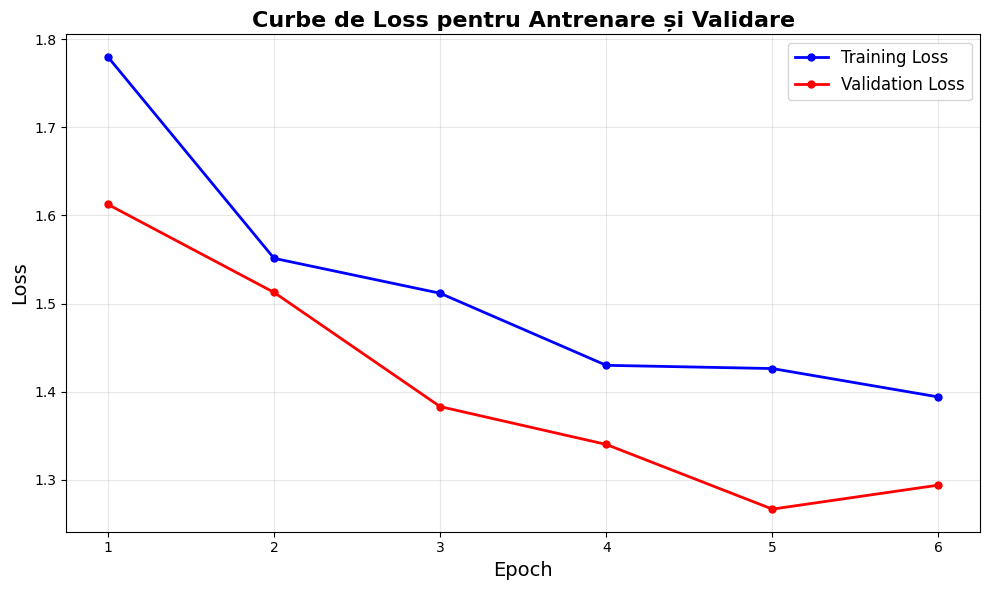

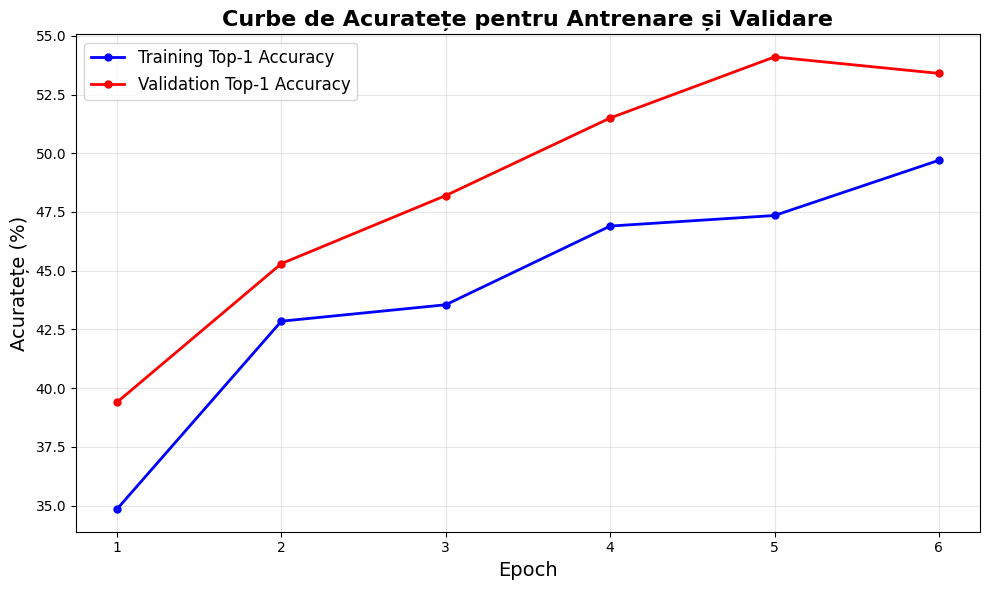

100%|██████████| 63/63 [00:01<00:00, 59.99it/s, epoch=7, train_loss=2.6952, top1_accuracy=97.62%]
Train - Loss: 1.3584, Top-1: 49.20%
100%|██████████| 32/32 [00:00<00:00, 171.84it/s, epoch=7, val_loss=5.1239, top1_accuracy=210.94%]
Val - Loss: 1.3117, Val - Top-1: 54.00%
EarlyStopping counter: 2 out of 7
100%|██████████| 63/63 [00:01<00:00, 57.41it/s, epoch=8, train_loss=2.6379, top1_accuracy=103.97%]
Train - Loss: 1.3295, Top-1: 52.40%
100%|██████████| 32/32 [00:00<00:00, 170.80it/s, epoch=8, val_loss=4.6786, top1_accuracy=219.14%]
Val - Loss: 1.1977, Val - Top-1: 56.10%
Validation accuracy increased (54.100000 → 56.100000). Saving model...


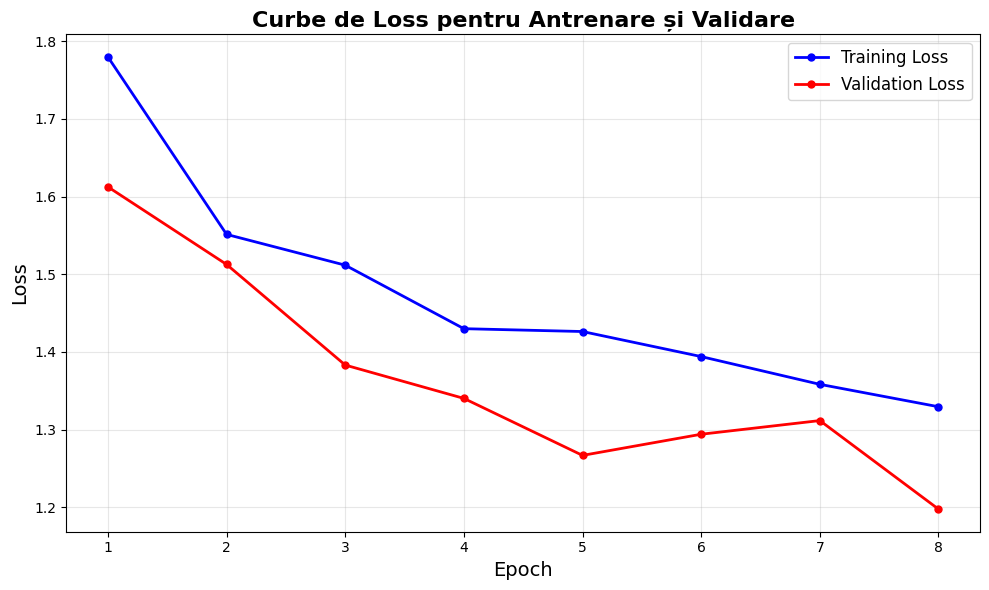

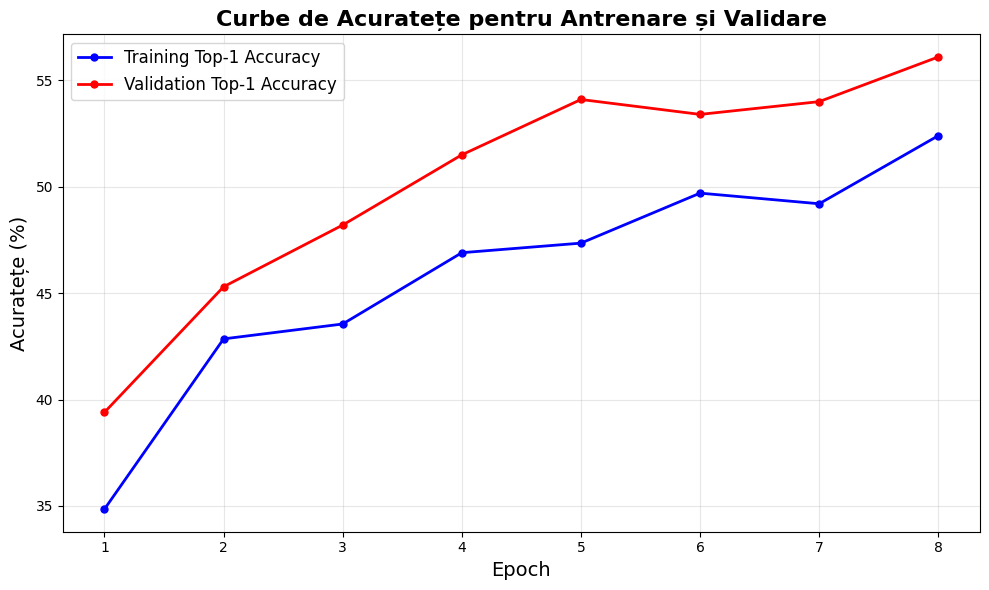

100%|██████████| 63/63 [00:01<00:00, 59.91it/s, epoch=9, train_loss=2.5639, top1_accuracy=105.36%]
Train - Loss: 1.2922, Top-1: 53.10%
100%|██████████| 32/32 [00:00<00:00, 170.96it/s, epoch=9, val_loss=4.5128, top1_accuracy=234.38%]
Val - Loss: 1.1553, Val - Top-1: 60.00%
Validation accuracy increased (56.100000 → 60.000000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 60.31it/s, epoch=10, train_loss=2.4639, top1_accuracy=107.24%]
Train - Loss: 1.2418, Top-1: 54.05%
100%|██████████| 32/32 [00:00<00:00, 171.07it/s, epoch=10, val_loss=4.4435, top1_accuracy=226.95%]
Val - Loss: 1.1375, Val - Top-1: 58.10%
EarlyStopping counter: 1 out of 7


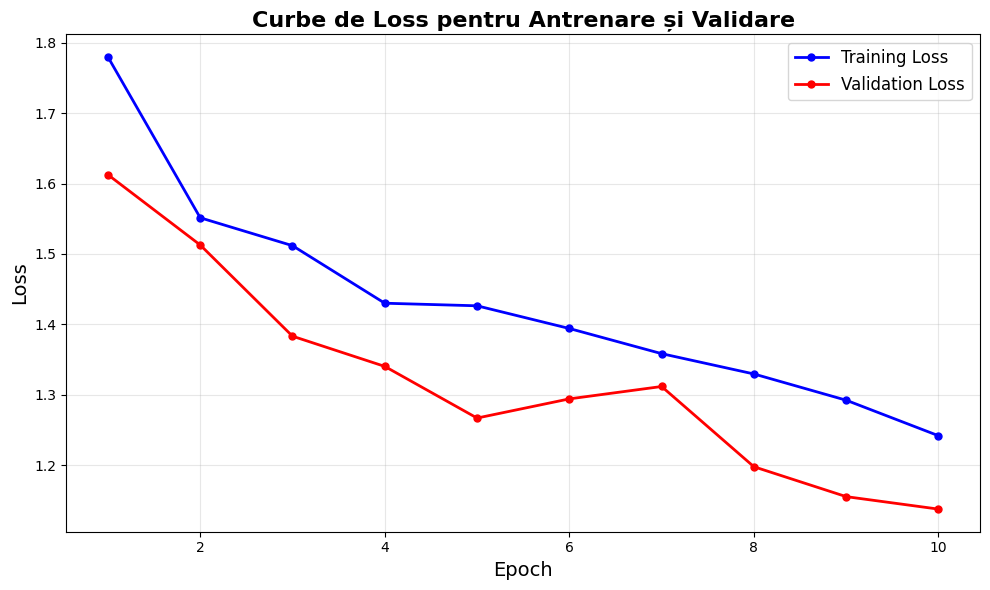

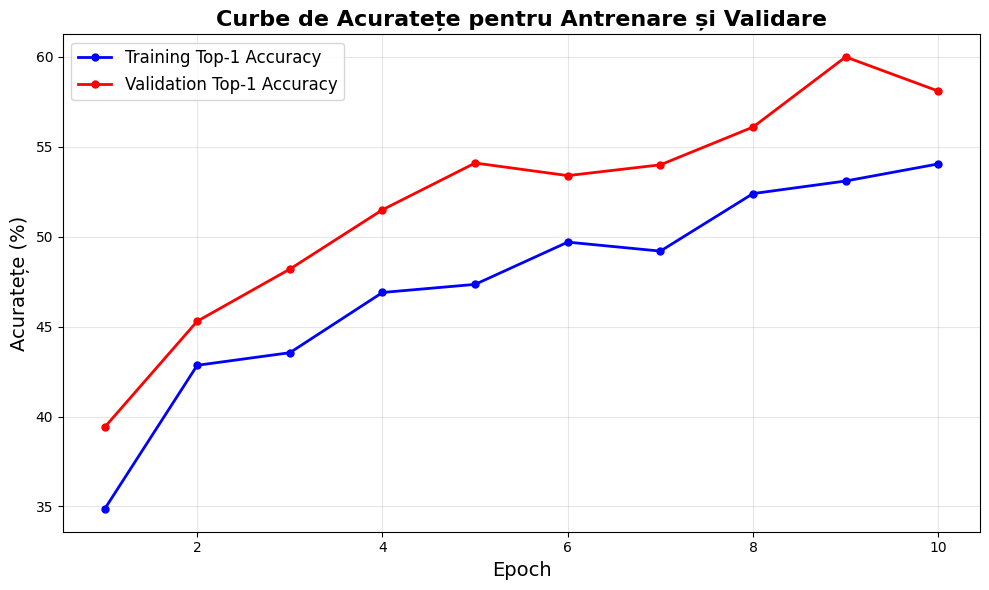

100%|██████████| 63/63 [00:01<00:00, 60.15it/s, epoch=11, train_loss=2.4757, top1_accuracy=108.13%]
Train - Loss: 1.2477, Top-1: 54.50%
100%|██████████| 32/32 [00:00<00:00, 165.22it/s, epoch=11, val_loss=4.4954, top1_accuracy=230.47%]
Val - Loss: 1.1508, Val - Top-1: 59.00%
EarlyStopping counter: 2 out of 7
100%|██████████| 63/63 [00:01<00:00, 60.54it/s, epoch=12, train_loss=2.4739, top1_accuracy=108.63%]
Train - Loss: 1.2469, Top-1: 54.75%
100%|██████████| 32/32 [00:00<00:00, 158.07it/s, epoch=12, val_loss=4.4398, top1_accuracy=232.42%]
Val - Loss: 1.1366, Val - Top-1: 59.50%
EarlyStopping counter: 3 out of 7


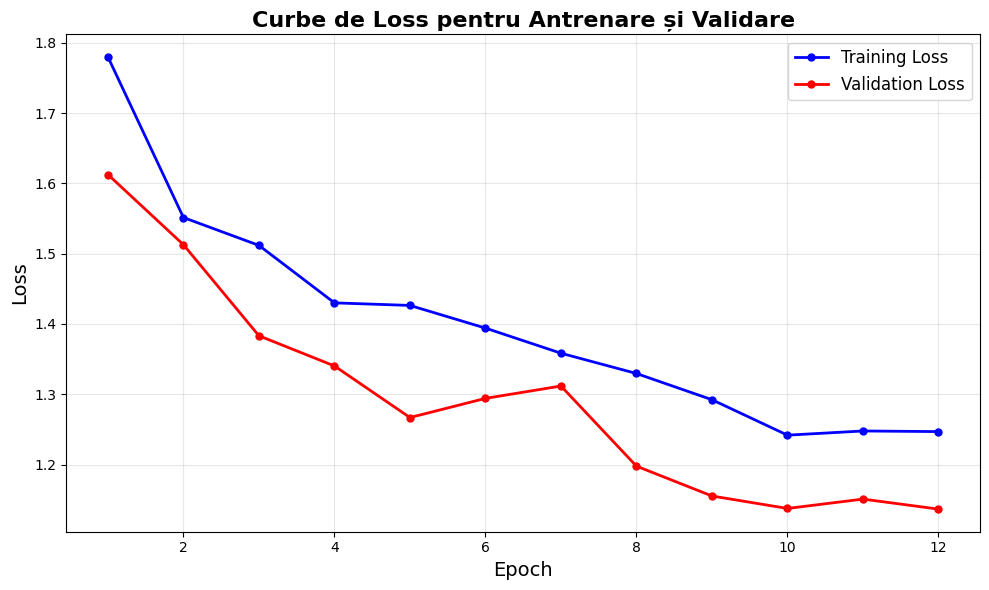

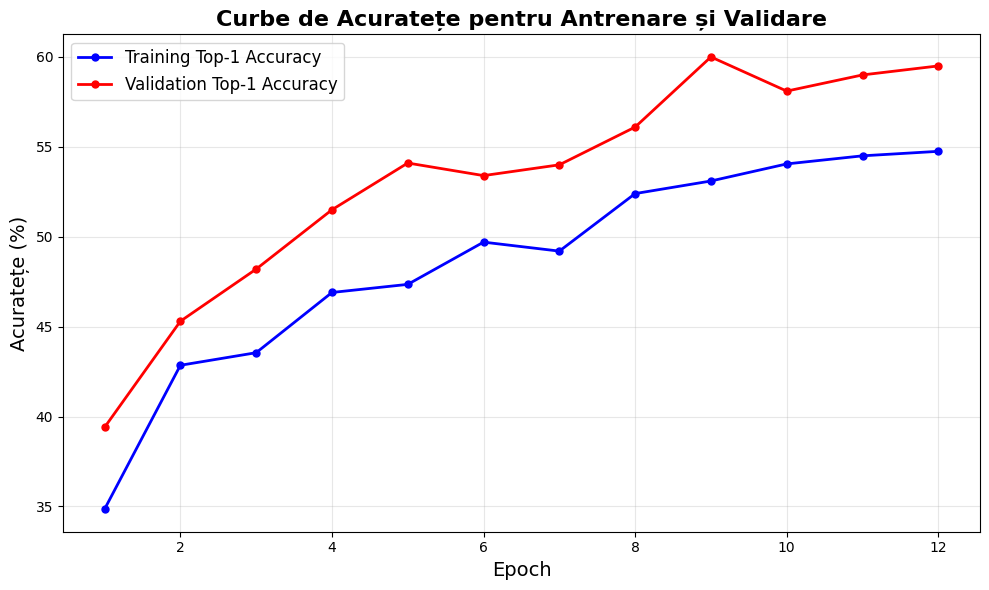

100%|██████████| 63/63 [00:01<00:00, 60.09it/s, epoch=13, train_loss=2.4519, top1_accuracy=109.03%]
Train - Loss: 1.2357, Top-1: 54.95%
100%|██████████| 32/32 [00:00<00:00, 163.40it/s, epoch=13, val_loss=4.3117, top1_accuracy=240.23%]
Val - Loss: 1.1038, Val - Top-1: 61.50%
Validation accuracy increased (60.000000 → 61.500000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 60.11it/s, epoch=14, train_loss=2.3629, top1_accuracy=114.58%]
Train - Loss: 1.1909, Top-1: 57.75%
100%|██████████| 32/32 [00:00<00:00, 171.44it/s, epoch=14, val_loss=4.3396, top1_accuracy=243.36%]
Val - Loss: 1.1109, Val - Top-1: 62.30%
Validation accuracy increased (61.500000 → 62.300000). Saving model...


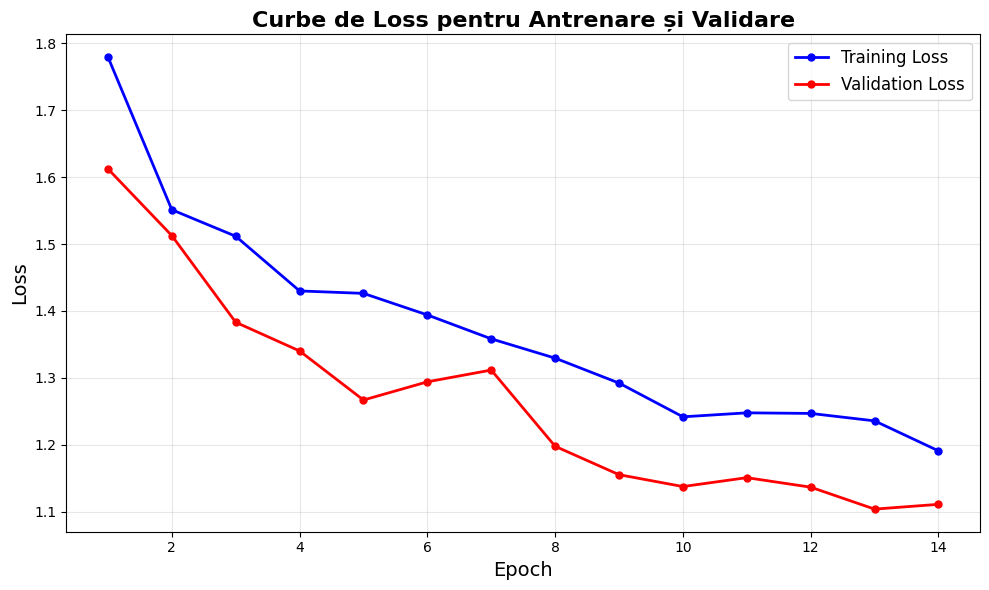

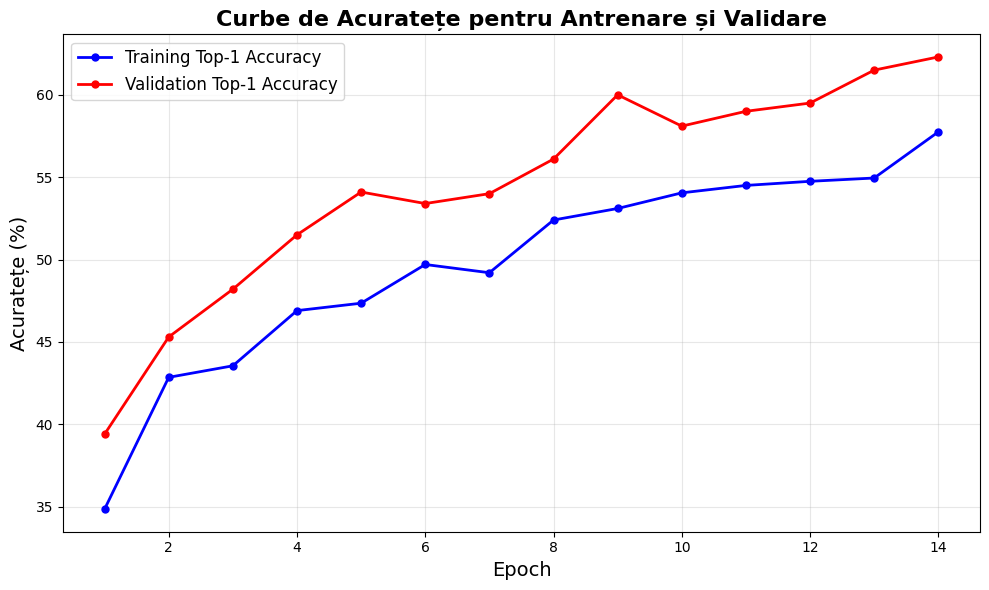

100%|██████████| 63/63 [00:01<00:00, 59.26it/s, epoch=15, train_loss=2.3776, top1_accuracy=112.30%]
Train - Loss: 1.1983, Top-1: 56.60%
100%|██████████| 32/32 [00:00<00:00, 171.28it/s, epoch=15, val_loss=4.4718, top1_accuracy=231.64%]
Val - Loss: 1.1448, Val - Top-1: 59.30%
EarlyStopping counter: 1 out of 7
100%|██████████| 63/63 [00:01<00:00, 60.39it/s, epoch=16, train_loss=2.3338, top1_accuracy=113.59%]
Train - Loss: 1.1762, Top-1: 57.25%
100%|██████████| 32/32 [00:00<00:00, 170.08it/s, epoch=16, val_loss=4.5288, top1_accuracy=232.81%]
Val - Loss: 1.1594, Val - Top-1: 59.60%
EarlyStopping counter: 2 out of 7


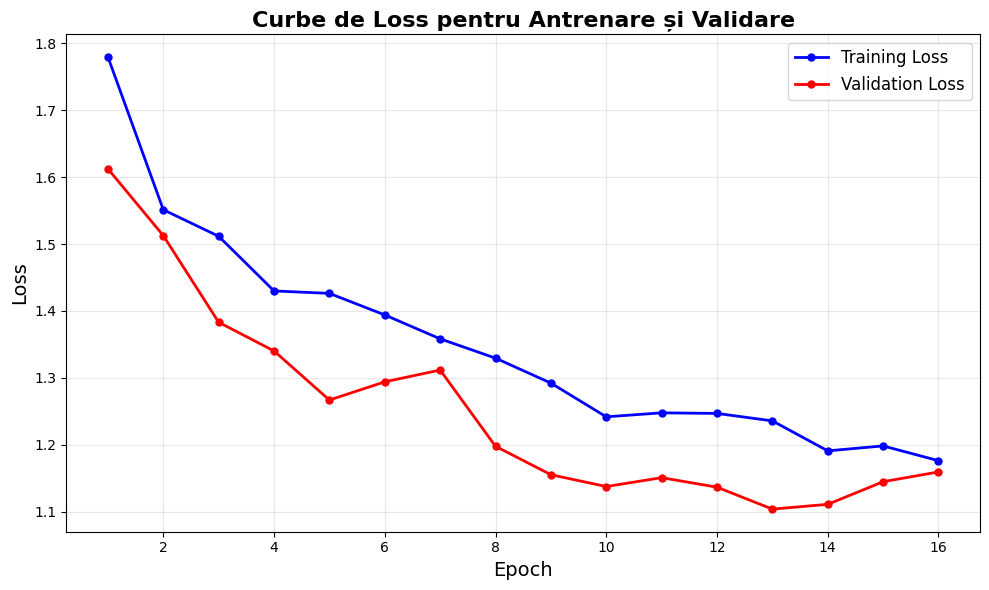

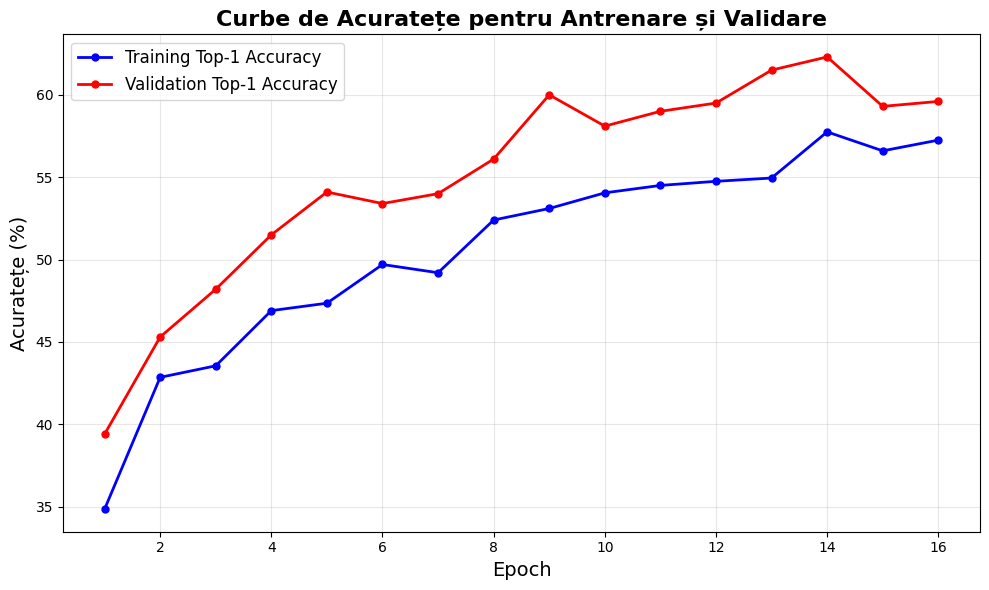

100%|██████████| 63/63 [00:01<00:00, 59.22it/s, epoch=17, train_loss=2.2590, top1_accuracy=114.68%]
Train - Loss: 1.1385, Top-1: 57.80%
100%|██████████| 32/32 [00:00<00:00, 171.14it/s, epoch=17, val_loss=4.2435, top1_accuracy=233.59%]
Val - Loss: 1.0863, Val - Top-1: 59.80%
EarlyStopping counter: 3 out of 7
100%|██████████| 63/63 [00:01<00:00, 60.44it/s, epoch=18, train_loss=2.3041, top1_accuracy=114.38%]
Train - Loss: 1.1613, Top-1: 57.65%
100%|██████████| 32/32 [00:00<00:00, 170.34it/s, epoch=18, val_loss=4.2471, top1_accuracy=235.94%]
Val - Loss: 1.0873, Val - Top-1: 60.40%
EarlyStopping counter: 4 out of 7


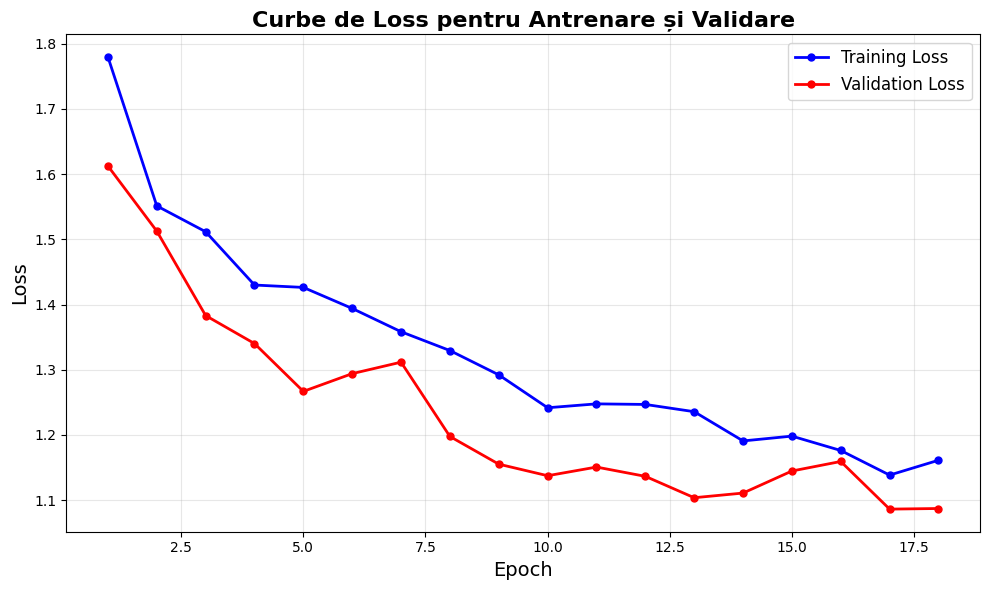

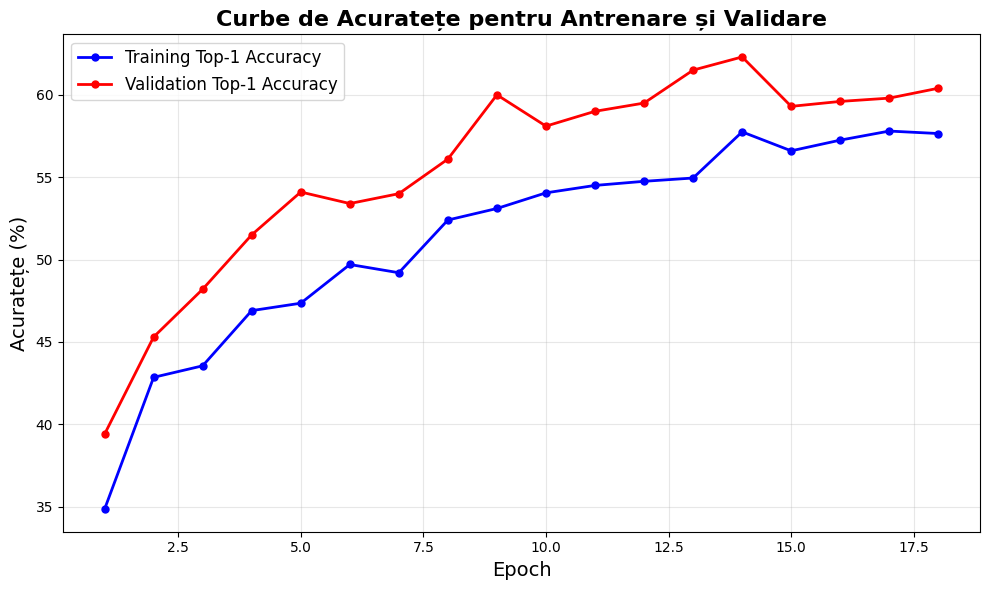

100%|██████████| 63/63 [00:01<00:00, 58.33it/s, epoch=19, train_loss=2.2517, top1_accuracy=116.67%]
Train - Loss: 1.1348, Top-1: 58.80%
100%|██████████| 32/32 [00:00<00:00, 170.95it/s, epoch=19, val_loss=4.2149, top1_accuracy=245.70%]
Val - Loss: 1.0790, Val - Top-1: 62.90%
Validation accuracy increased (62.300000 → 62.900000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 60.34it/s, epoch=20, train_loss=2.1858, top1_accuracy=118.25%]
Train - Loss: 1.1016, Top-1: 59.60%
100%|██████████| 32/32 [00:00<00:00, 156.85it/s, epoch=20, val_loss=4.1299, top1_accuracy=247.27%]
Val - Loss: 1.0572, Val - Top-1: 63.30%
Validation accuracy increased (62.900000 → 63.300000). Saving model...


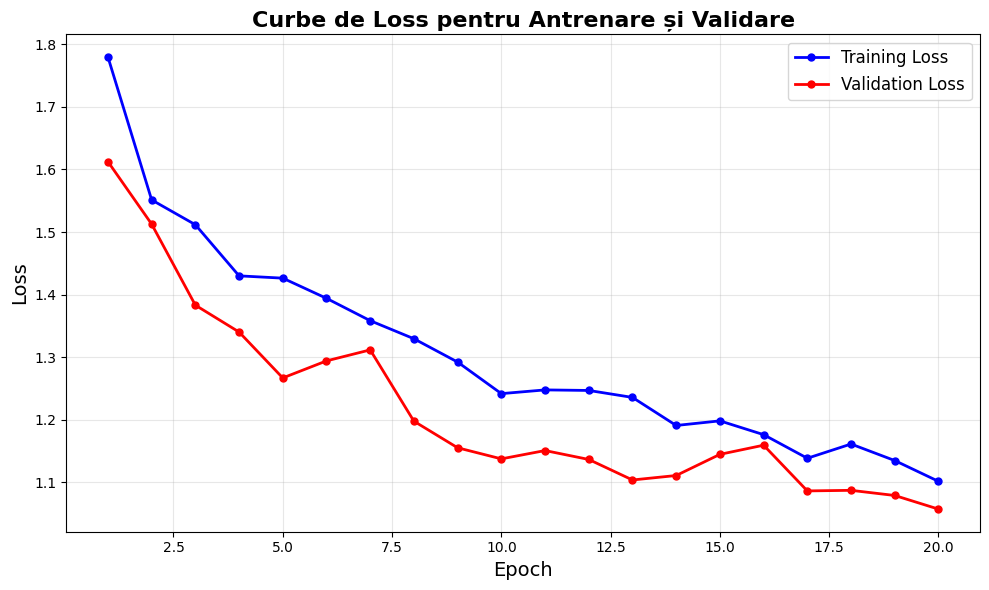

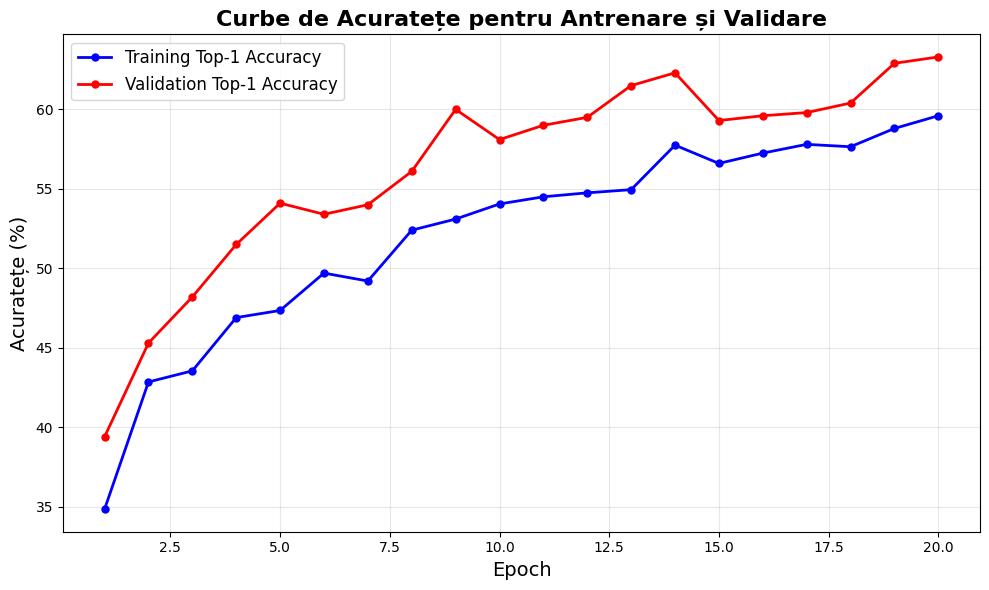

100%|██████████| 63/63 [00:01<00:00, 59.43it/s, epoch=21, train_loss=2.2239, top1_accuracy=117.26%]
Train - Loss: 1.1209, Top-1: 59.10%
100%|██████████| 32/32 [00:00<00:00, 171.23it/s, epoch=21, val_loss=4.4711, top1_accuracy=228.52%]
Val - Loss: 1.1446, Val - Top-1: 58.50%
EarlyStopping counter: 1 out of 7
100%|██████████| 63/63 [00:01<00:00, 60.22it/s, epoch=22, train_loss=2.1903, top1_accuracy=119.25%]
Train - Loss: 1.1039, Top-1: 60.10%
100%|██████████| 32/32 [00:00<00:00, 171.41it/s, epoch=22, val_loss=4.1570, top1_accuracy=243.75%]
Val - Loss: 1.0642, Val - Top-1: 62.40%
EarlyStopping counter: 2 out of 7


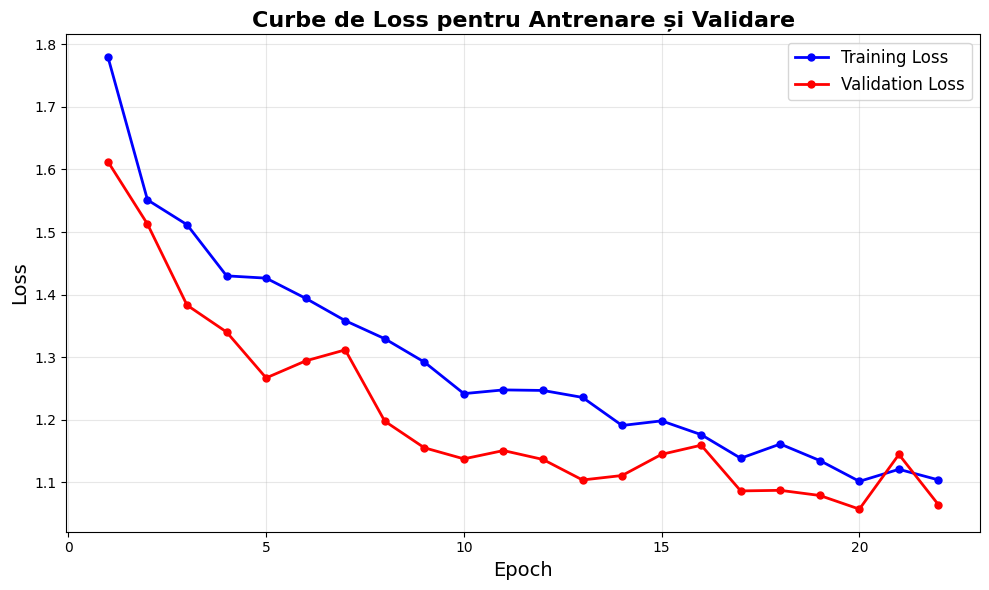

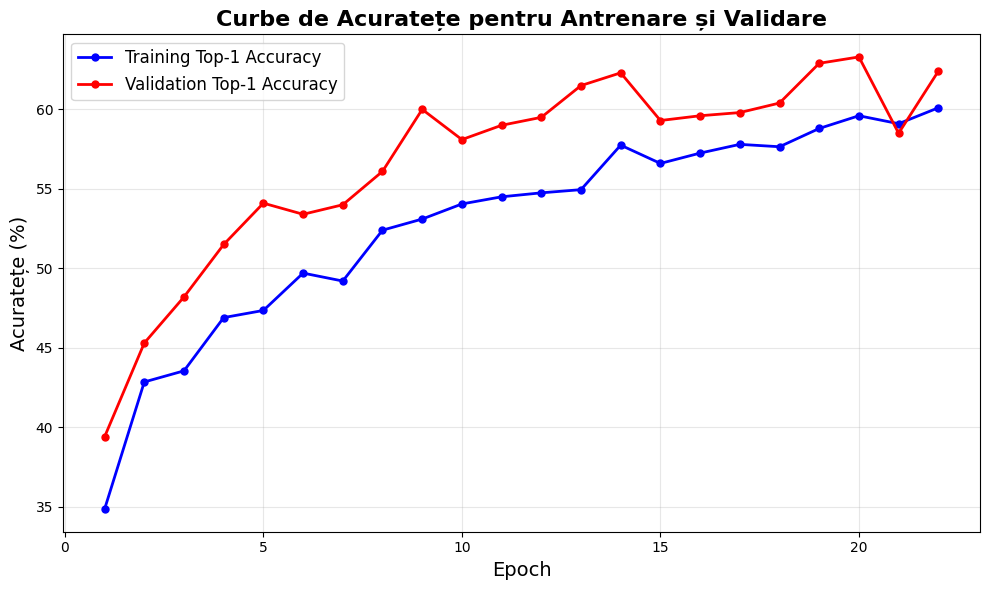

100%|██████████| 63/63 [00:01<00:00, 59.17it/s, epoch=23, train_loss=2.1414, top1_accuracy=119.74%]
Train - Loss: 1.0793, Top-1: 60.35%
100%|██████████| 32/32 [00:00<00:00, 170.79it/s, epoch=23, val_loss=4.0646, top1_accuracy=248.44%]
Val - Loss: 1.0405, Val - Top-1: 63.60%
Validation accuracy increased (63.300000 → 63.600000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 60.27it/s, epoch=24, train_loss=2.1001, top1_accuracy=121.13%]
Train - Loss: 1.0584, Top-1: 61.05%
100%|██████████| 32/32 [00:00<00:00, 170.50it/s, epoch=24, val_loss=4.1064, top1_accuracy=247.66%]
Val - Loss: 1.0512, Val - Top-1: 63.40%
EarlyStopping counter: 1 out of 7


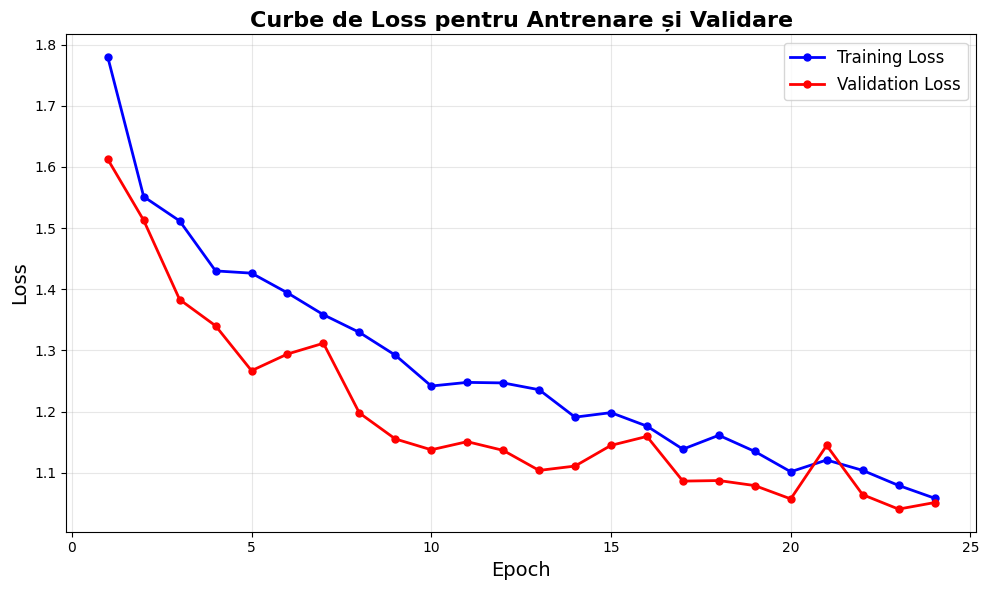

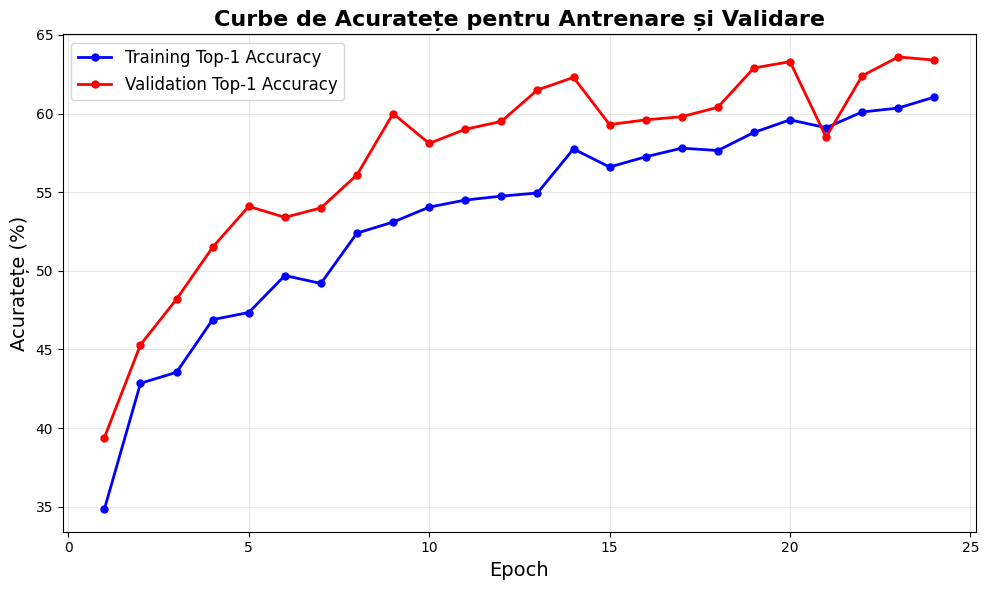

100%|██████████| 63/63 [00:01<00:00, 60.25it/s, epoch=25, train_loss=2.1249, top1_accuracy=121.23%]
Train - Loss: 1.0710, Top-1: 61.10%
100%|██████████| 32/32 [00:00<00:00, 171.43it/s, epoch=25, val_loss=4.0106, top1_accuracy=245.70%]
Val - Loss: 1.0267, Val - Top-1: 62.90%
EarlyStopping counter: 2 out of 7
100%|██████████| 63/63 [00:01<00:00, 59.55it/s, epoch=26, train_loss=2.0700, top1_accuracy=125.40%]
Train - Loss: 1.0433, Top-1: 63.20%
100%|██████████| 32/32 [00:00<00:00, 170.90it/s, epoch=26, val_loss=4.0426, top1_accuracy=253.91%]
Val - Loss: 1.0349, Val - Top-1: 65.00%
Validation accuracy increased (63.600000 → 65.000000). Saving model...


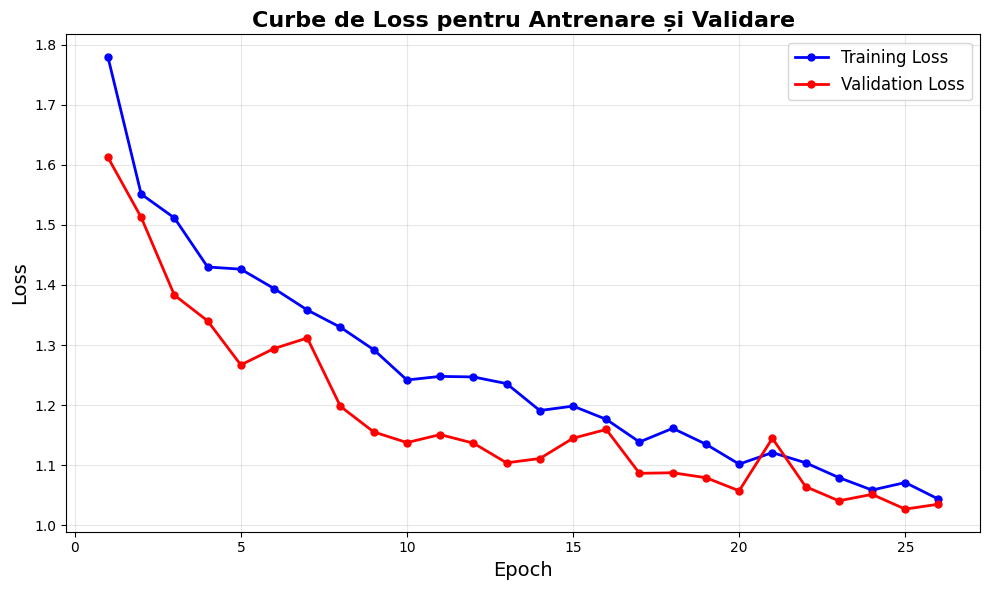

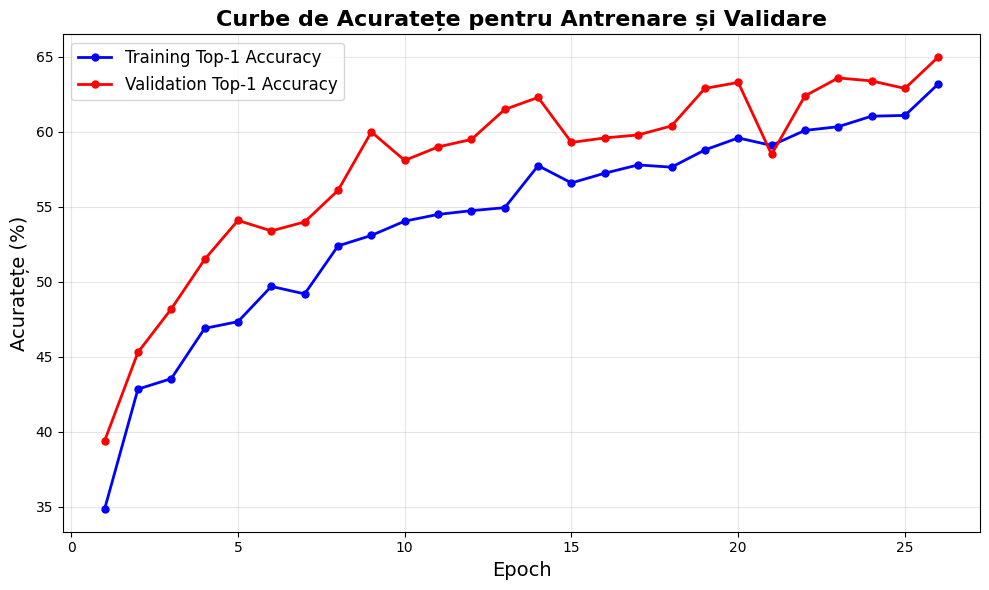

100%|██████████| 63/63 [00:01<00:00, 59.05it/s, epoch=27, train_loss=2.0669, top1_accuracy=122.72%]
Train - Loss: 1.0417, Top-1: 61.85%
100%|██████████| 32/32 [00:00<00:00, 170.95it/s, epoch=27, val_loss=4.0033, top1_accuracy=250.39%]
Val - Loss: 1.0248, Val - Top-1: 64.10%
EarlyStopping counter: 1 out of 7
100%|██████████| 63/63 [00:01<00:00, 60.35it/s, epoch=28, train_loss=1.9901, top1_accuracy=124.40%]
Train - Loss: 1.0030, Top-1: 62.70%
100%|██████████| 32/32 [00:00<00:00, 171.47it/s, epoch=28, val_loss=4.2476, top1_accuracy=234.38%]
Val - Loss: 1.0874, Val - Top-1: 60.00%
EarlyStopping counter: 2 out of 7


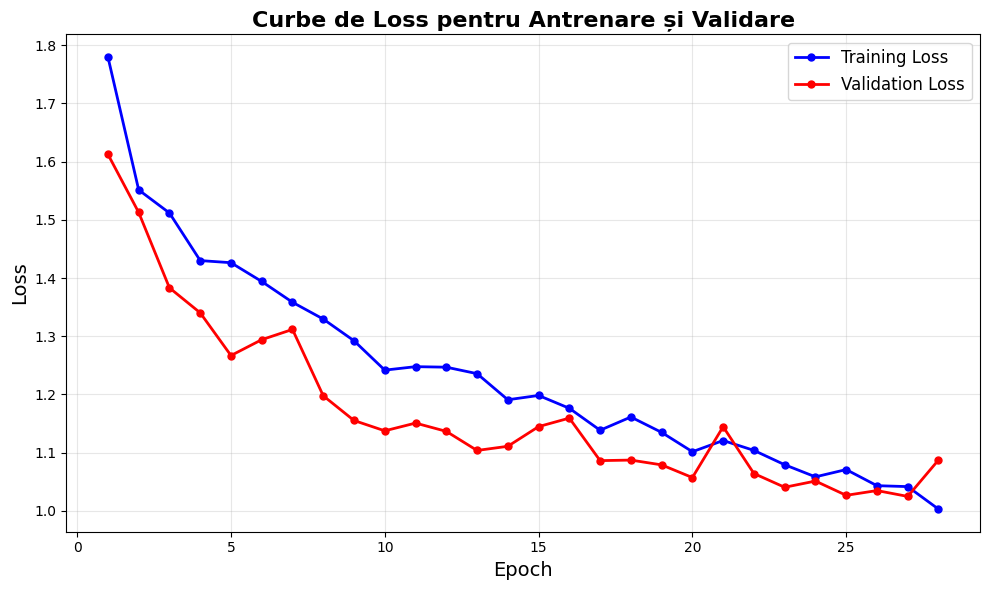

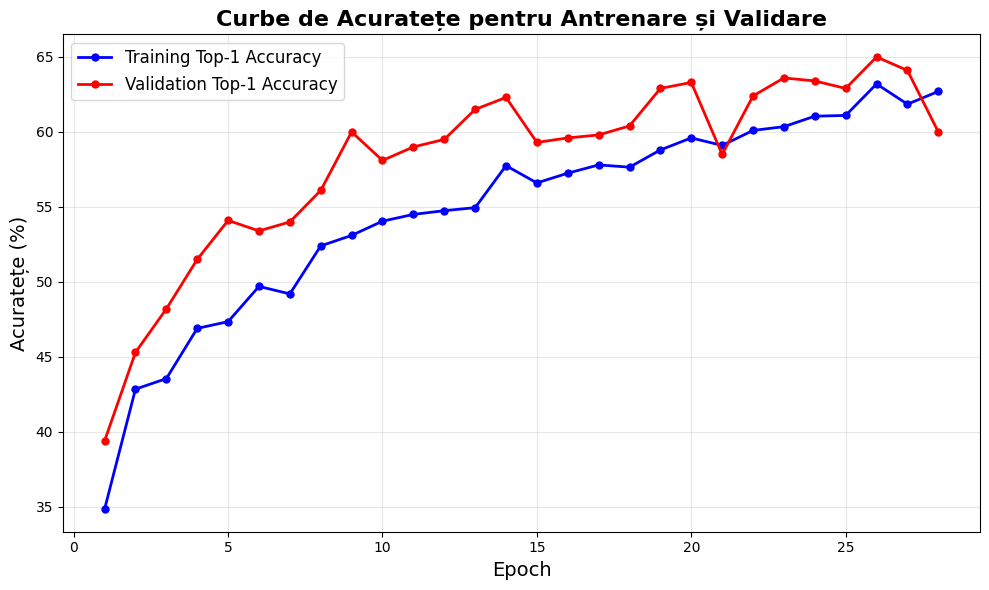

100%|██████████| 63/63 [00:01<00:00, 58.87it/s, epoch=29, train_loss=2.0714, top1_accuracy=125.00%]
Train - Loss: 1.0440, Top-1: 63.00%
100%|██████████| 32/32 [00:00<00:00, 171.58it/s, epoch=29, val_loss=3.9683, top1_accuracy=252.34%]
Val - Loss: 1.0159, Val - Top-1: 64.60%
EarlyStopping counter: 3 out of 7
100%|██████████| 63/63 [00:01<00:00, 60.37it/s, epoch=30, train_loss=2.0057, top1_accuracy=124.01%]
Train - Loss: 1.0109, Top-1: 62.50%
100%|██████████| 32/32 [00:00<00:00, 171.06it/s, epoch=30, val_loss=4.2762, top1_accuracy=244.53%]
Val - Loss: 1.0947, Val - Top-1: 62.60%
EarlyStopping counter: 4 out of 7


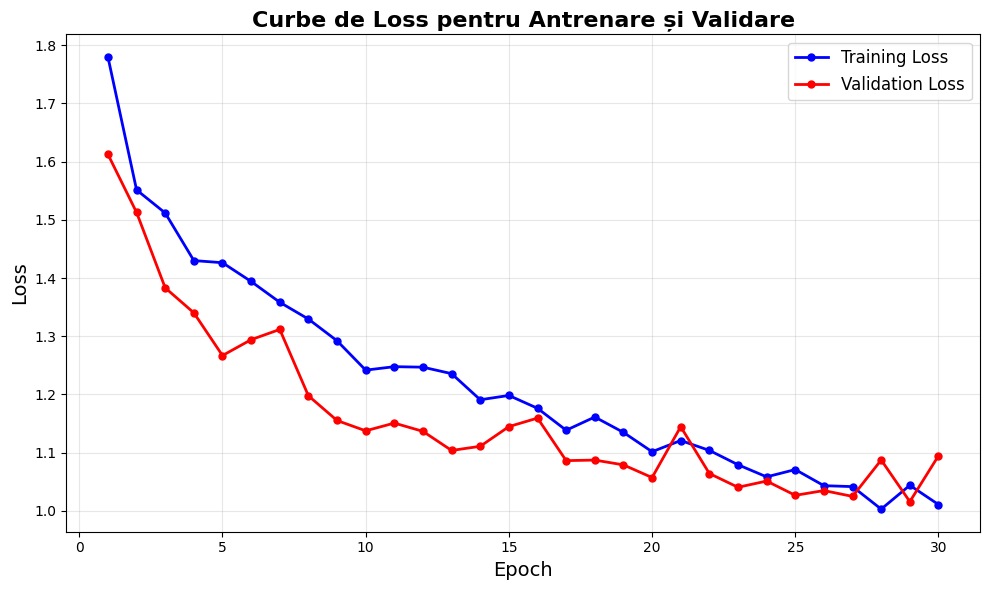

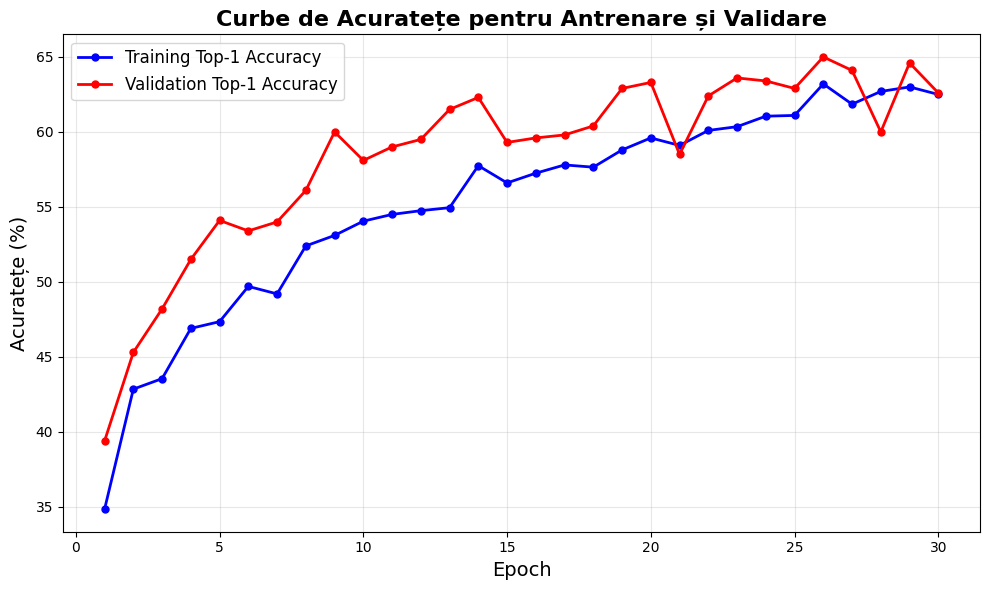

100%|██████████| 63/63 [00:01<00:00, 60.03it/s, epoch=31, train_loss=1.9852, top1_accuracy=127.68%]
Train - Loss: 1.0006, Top-1: 64.35%
100%|██████████| 32/32 [00:00<00:00, 165.47it/s, epoch=31, val_loss=4.0810, top1_accuracy=244.92%]
Val - Loss: 1.0447, Val - Top-1: 62.70%
EarlyStopping counter: 5 out of 7
100%|██████████| 63/63 [00:01<00:00, 54.58it/s, epoch=32, train_loss=1.9841, top1_accuracy=123.81%]
Train - Loss: 1.0000, Top-1: 62.40%
100%|██████████| 32/32 [00:00<00:00, 158.59it/s, epoch=32, val_loss=3.9539, top1_accuracy=251.56%]
Val - Loss: 1.0122, Val - Top-1: 64.40%
EarlyStopping counter: 6 out of 7


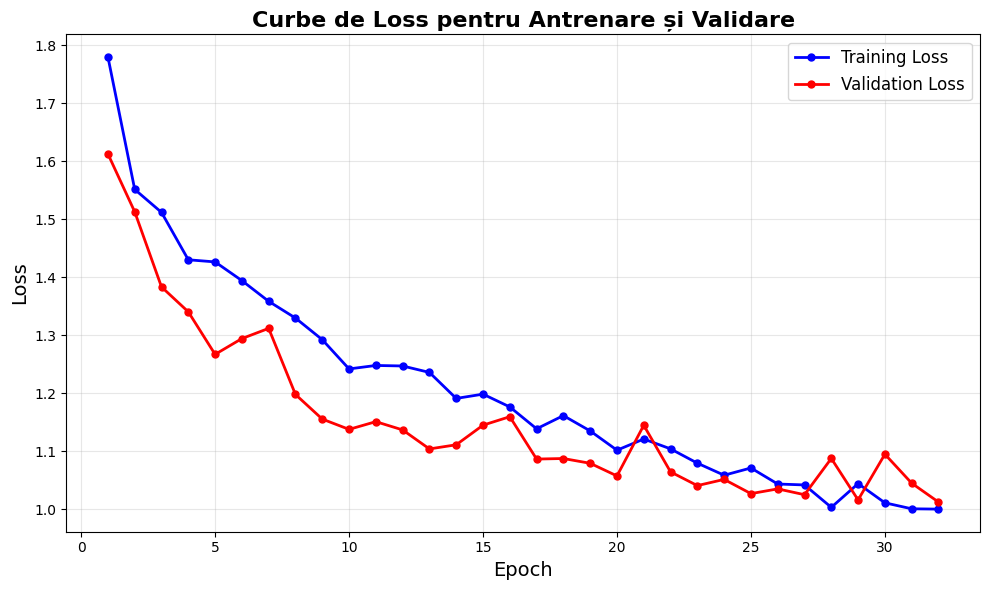

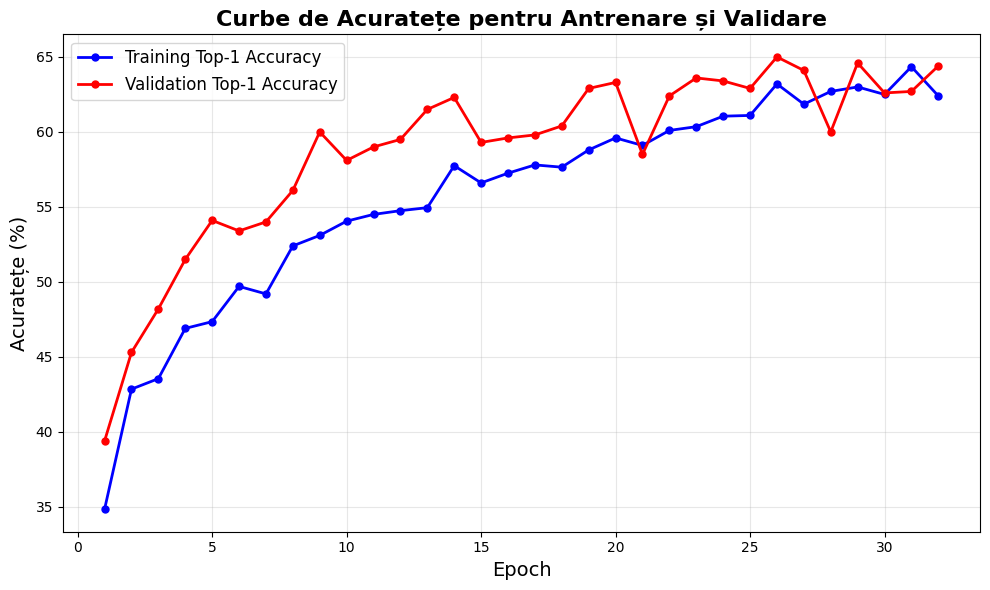

100%|██████████| 63/63 [00:01<00:00, 53.83it/s, epoch=33, train_loss=1.9720, top1_accuracy=128.47%]
Train - Loss: 0.9939, Top-1: 64.75%
100%|██████████| 32/32 [00:00<00:00, 160.37it/s, epoch=33, val_loss=4.0070, top1_accuracy=251.56%]
Val - Loss: 1.0258, Val - Top-1: 64.40%
EarlyStopping counter: 7 out of 7
Early stopping triggered at epoch 33

Model 3 Best Validation Accuracy: 65.00%

Training Model 4/5
Config: lr=0.003, weight_decay=0.0002, lr_decay=0.935

100%|██████████| 63/63 [00:01<00:00, 55.93it/s, epoch=1, train_loss=3.5407, top1_accuracy=64.29%]
Train - Loss: 1.7845, Top-1: 32.40%
100%|██████████| 32/32 [00:00<00:00, 162.72it/s, epoch=1, val_loss=6.1511, top1_accuracy=158.20%]
Val - Loss: 1.5747, Val - Top-1: 40.50%
Validation accuracy increased (-inf → 40.500000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 56.19it/s, epoch=2, train_loss=3.1004, top1_accuracy=84.82%]
Train - Loss: 1.5626, Top-1: 42.75%
100%|██████████| 32/32 [00:00<00:00, 145.34it/s, epoch=2, val_los

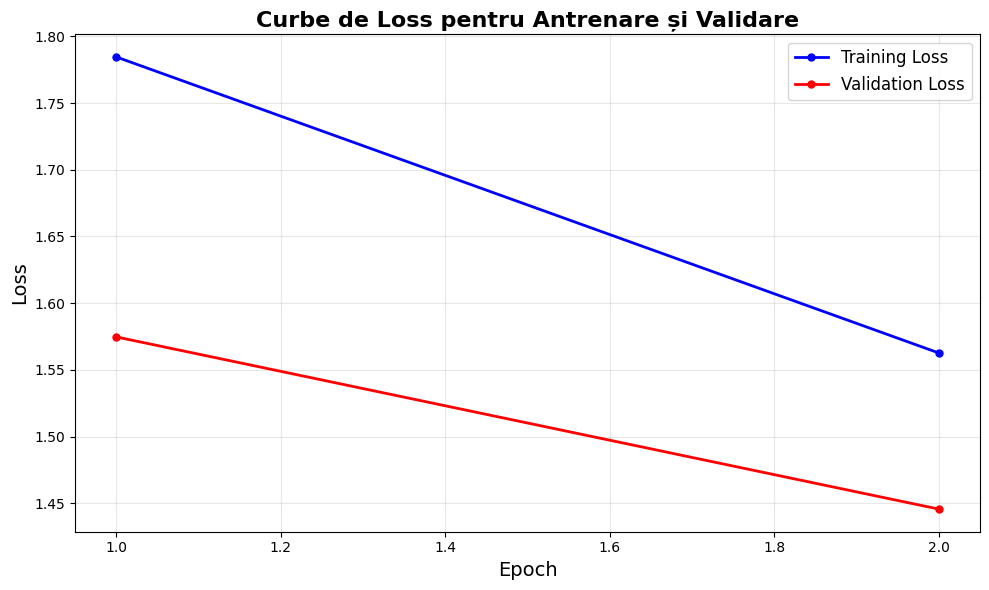

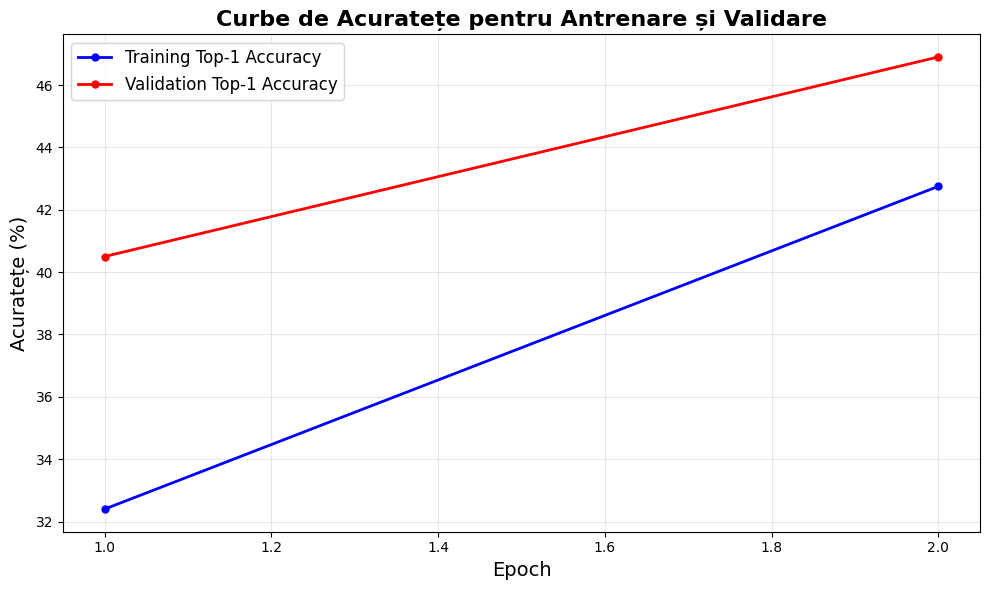

100%|██████████| 63/63 [00:01<00:00, 54.19it/s, epoch=3, train_loss=2.9369, top1_accuracy=91.87%]
Train - Loss: 1.4802, Top-1: 46.30%
100%|██████████| 32/32 [00:00<00:00, 158.51it/s, epoch=3, val_loss=5.5027, top1_accuracy=204.30%]
Val - Loss: 1.4087, Val - Top-1: 52.30%
Validation accuracy increased (46.900000 → 52.300000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 55.48it/s, epoch=4, train_loss=2.9079, top1_accuracy=90.08%]
Train - Loss: 1.4656, Top-1: 45.40%
100%|██████████| 32/32 [00:00<00:00, 157.82it/s, epoch=4, val_loss=5.4394, top1_accuracy=186.72%]
Val - Loss: 1.3925, Val - Top-1: 47.80%
EarlyStopping counter: 1 out of 7


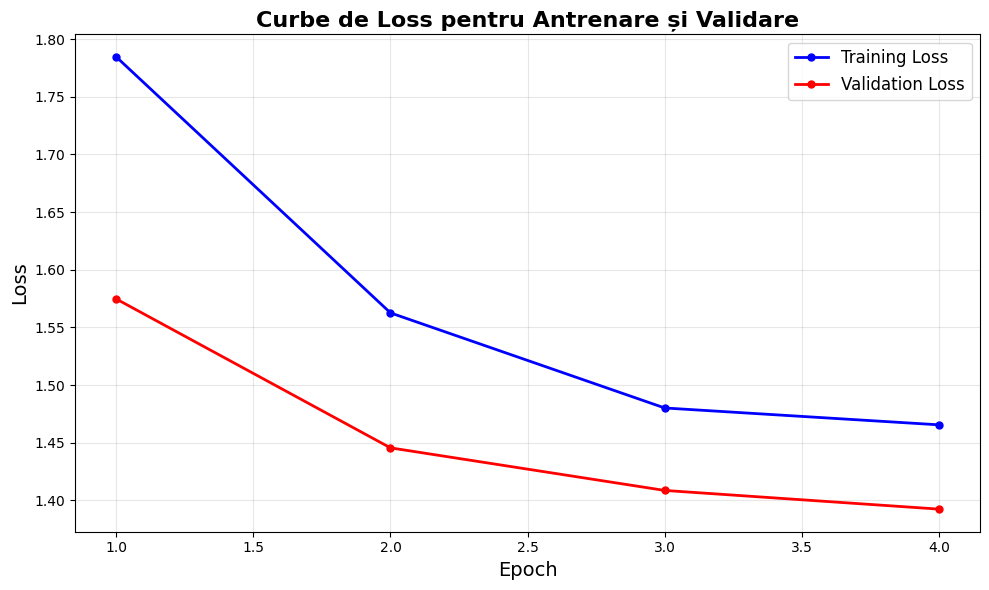

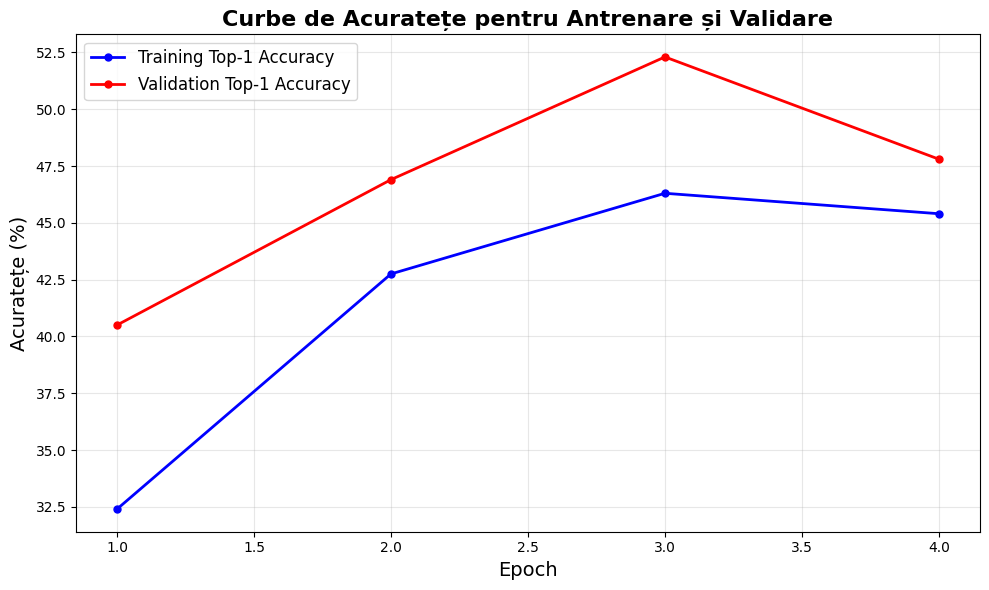

100%|██████████| 63/63 [00:01<00:00, 54.43it/s, epoch=5, train_loss=2.8134, top1_accuracy=93.15%]
Train - Loss: 1.4179, Top-1: 46.95%
100%|██████████| 32/32 [00:00<00:00, 162.45it/s, epoch=5, val_loss=5.1185, top1_accuracy=211.33%]
Val - Loss: 1.3103, Val - Top-1: 54.10%
Validation accuracy increased (52.300000 → 54.100000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 54.39it/s, epoch=6, train_loss=2.6893, top1_accuracy=100.79%]
Train - Loss: 1.3554, Top-1: 50.80%
100%|██████████| 32/32 [00:00<00:00, 158.52it/s, epoch=6, val_loss=4.8673, top1_accuracy=210.16%]
Val - Loss: 1.2460, Val - Top-1: 53.80%
EarlyStopping counter: 1 out of 7


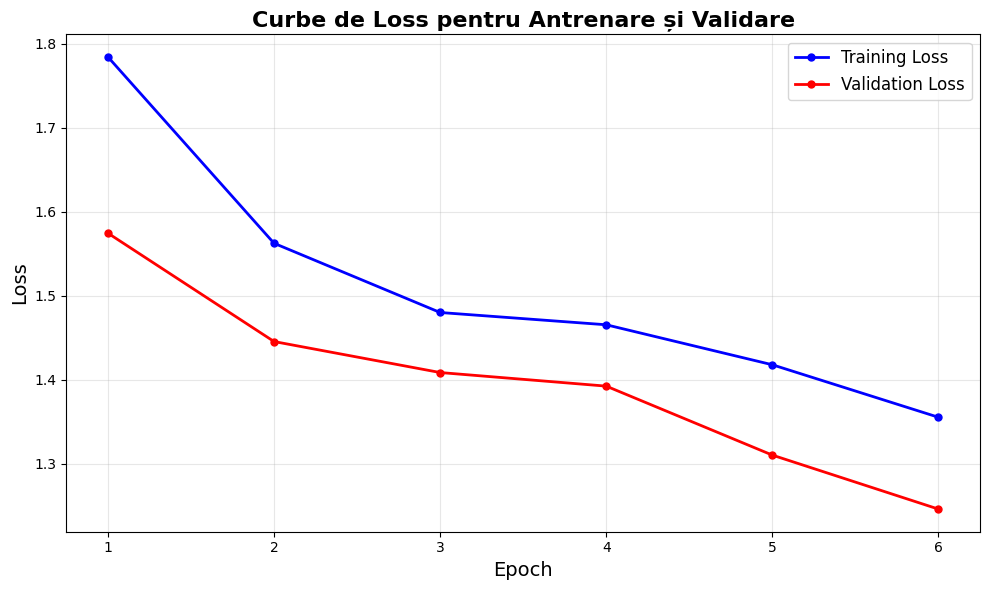

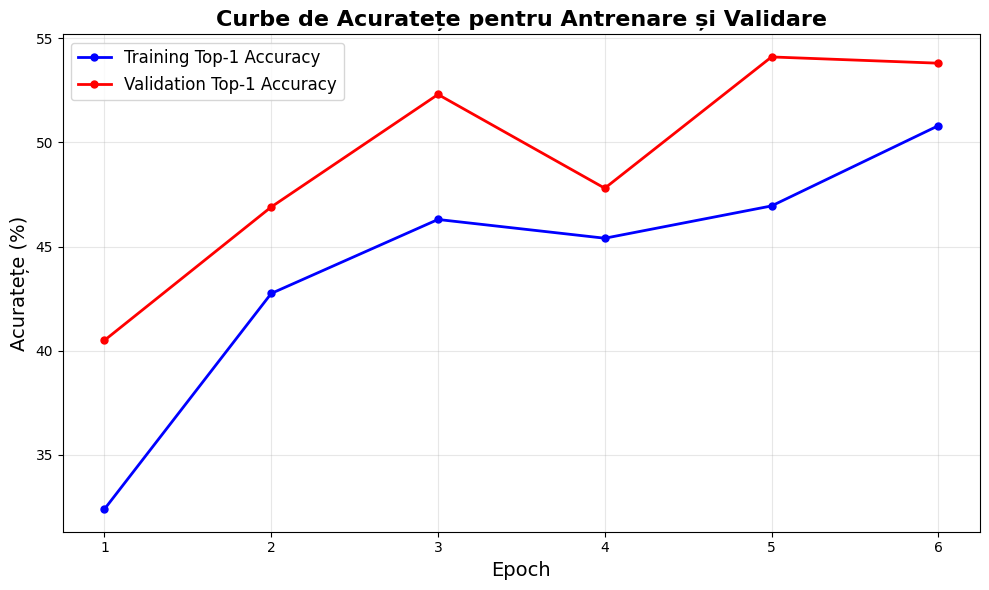

100%|██████████| 63/63 [00:01<00:00, 52.16it/s, epoch=7, train_loss=2.6650, top1_accuracy=98.61%]
Train - Loss: 1.3431, Top-1: 49.70%
100%|██████████| 32/32 [00:00<00:00, 145.94it/s, epoch=7, val_loss=4.8318, top1_accuracy=219.92%]
Val - Loss: 1.2369, Val - Top-1: 56.30%
Validation accuracy increased (54.100000 → 56.300000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 53.68it/s, epoch=8, train_loss=2.6391, top1_accuracy=106.45%]
Train - Loss: 1.3301, Top-1: 53.65%
100%|██████████| 32/32 [00:00<00:00, 152.25it/s, epoch=8, val_loss=4.7320, top1_accuracy=228.52%]
Val - Loss: 1.2114, Val - Top-1: 58.50%
Validation accuracy increased (56.300000 → 58.500000). Saving model...


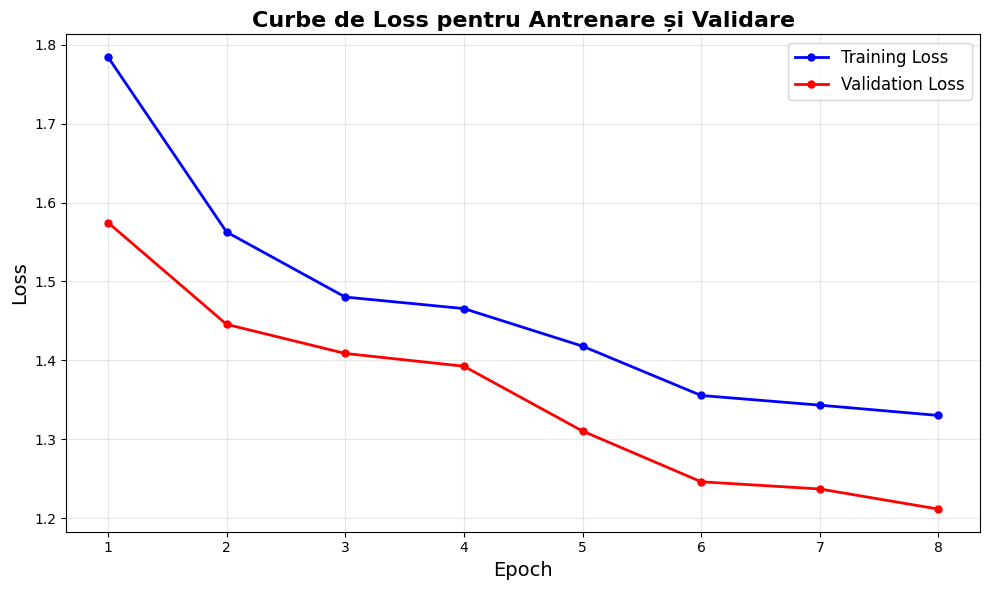

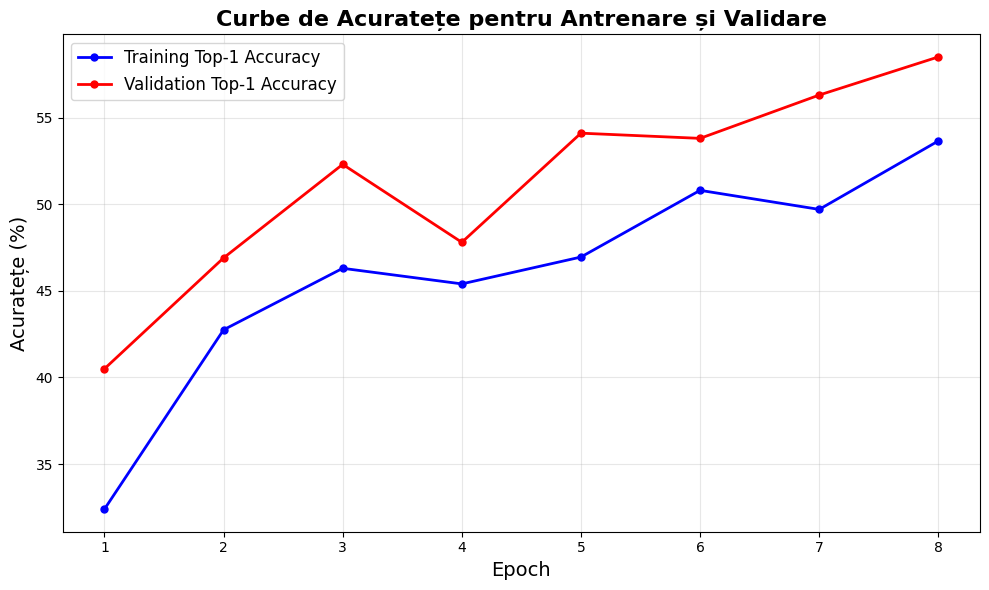

100%|██████████| 63/63 [00:01<00:00, 53.16it/s, epoch=9, train_loss=2.5634, top1_accuracy=104.07%]
Train - Loss: 1.2919, Top-1: 52.45%
100%|██████████| 32/32 [00:00<00:00, 153.27it/s, epoch=9, val_loss=4.6408, top1_accuracy=229.30%]
Val - Loss: 1.1880, Val - Top-1: 58.70%
Validation accuracy increased (58.500000 → 58.700000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 52.65it/s, epoch=10, train_loss=2.5003, top1_accuracy=107.84%]
Train - Loss: 1.2602, Top-1: 54.35%
100%|██████████| 32/32 [00:00<00:00, 154.24it/s, epoch=10, val_loss=4.5644, top1_accuracy=227.34%]
Val - Loss: 1.1685, Val - Top-1: 58.20%
EarlyStopping counter: 1 out of 7


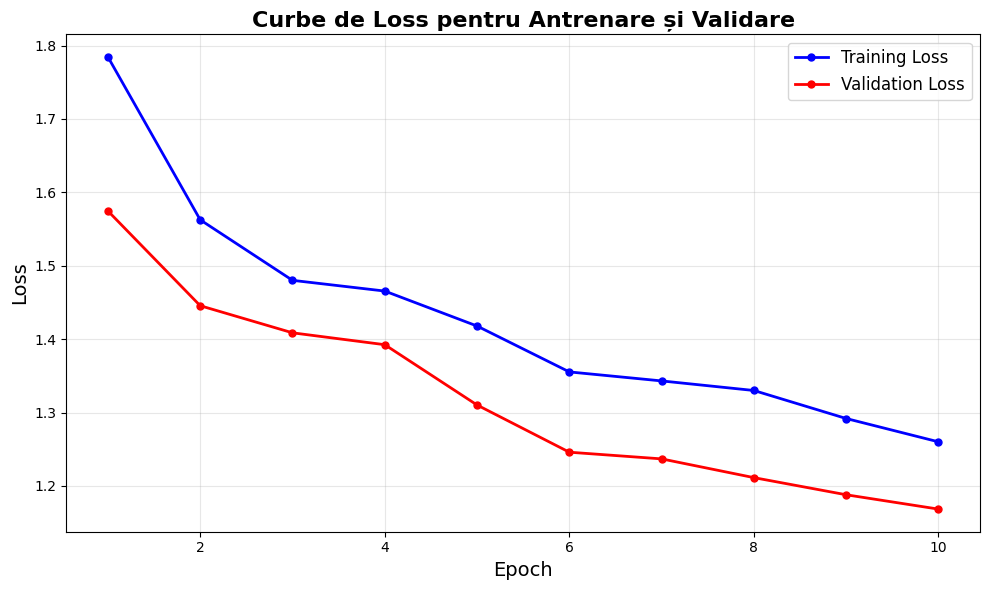

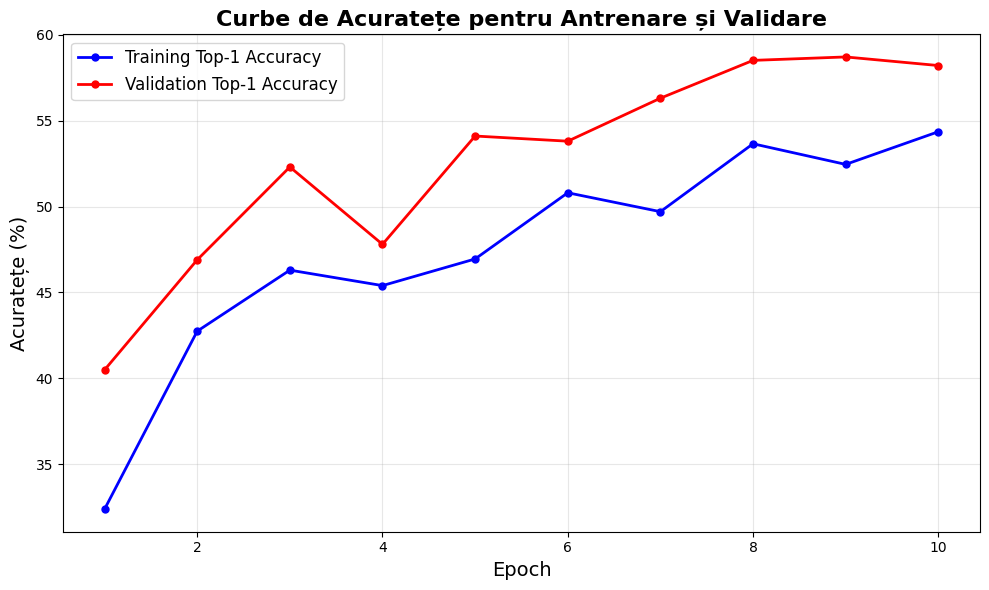

100%|██████████| 63/63 [00:01<00:00, 51.30it/s, epoch=11, train_loss=2.4715, top1_accuracy=110.22%]
Train - Loss: 1.2456, Top-1: 55.55%
100%|██████████| 32/32 [00:00<00:00, 156.42it/s, epoch=11, val_loss=4.3817, top1_accuracy=231.64%]
Val - Loss: 1.1217, Val - Top-1: 59.30%
Validation accuracy increased (58.700000 → 59.300000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 52.91it/s, epoch=12, train_loss=2.4336, top1_accuracy=107.54%]
Train - Loss: 1.2266, Top-1: 54.20%
100%|██████████| 32/32 [00:00<00:00, 156.13it/s, epoch=12, val_loss=4.5783, top1_accuracy=226.95%]
Val - Loss: 1.1721, Val - Top-1: 58.10%
EarlyStopping counter: 1 out of 7


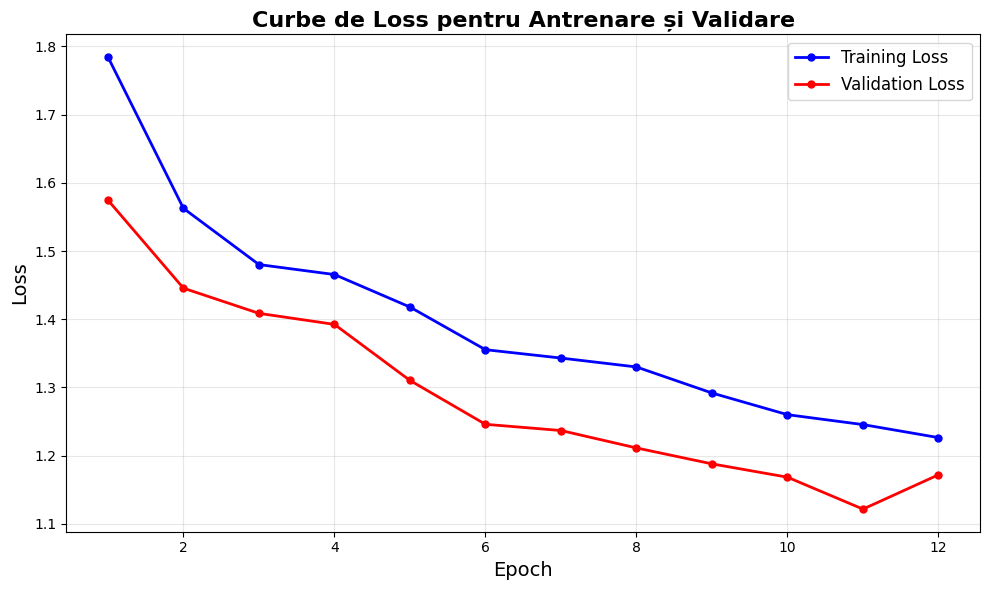

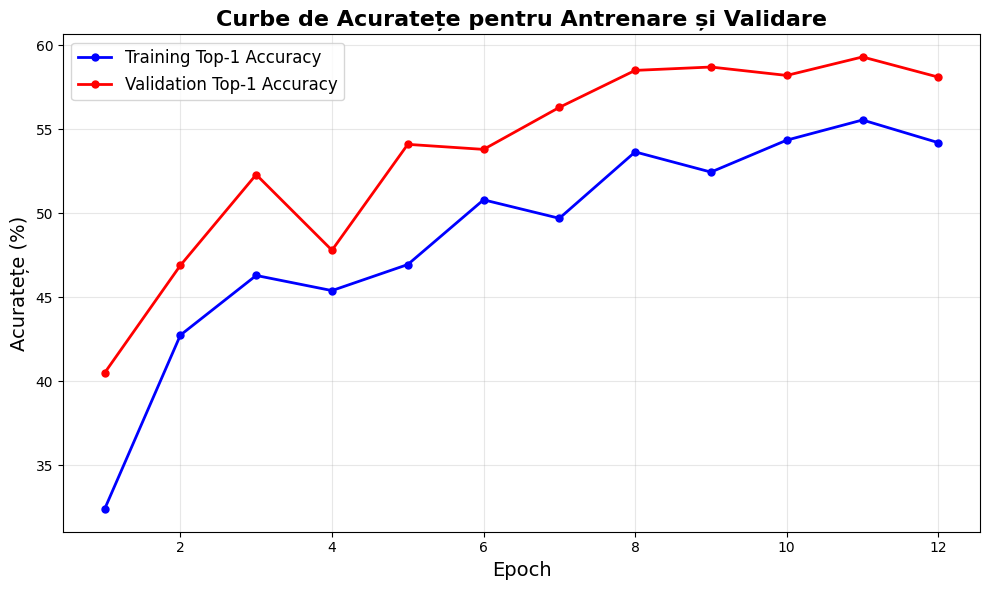

100%|██████████| 63/63 [00:01<00:00, 51.52it/s, epoch=13, train_loss=2.4143, top1_accuracy=110.71%]
Train - Loss: 1.2168, Top-1: 55.80%
100%|██████████| 32/32 [00:00<00:00, 154.99it/s, epoch=13, val_loss=4.5465, top1_accuracy=236.72%]
Val - Loss: 1.1639, Val - Top-1: 60.60%
Validation accuracy increased (59.300000 → 60.600000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 51.26it/s, epoch=14, train_loss=2.4217, top1_accuracy=113.39%]
Train - Loss: 1.2206, Top-1: 57.15%
100%|██████████| 32/32 [00:00<00:00, 150.19it/s, epoch=14, val_loss=4.3853, top1_accuracy=237.50%]
Val - Loss: 1.1226, Val - Top-1: 60.80%
Validation accuracy increased (60.600000 → 60.800000). Saving model...


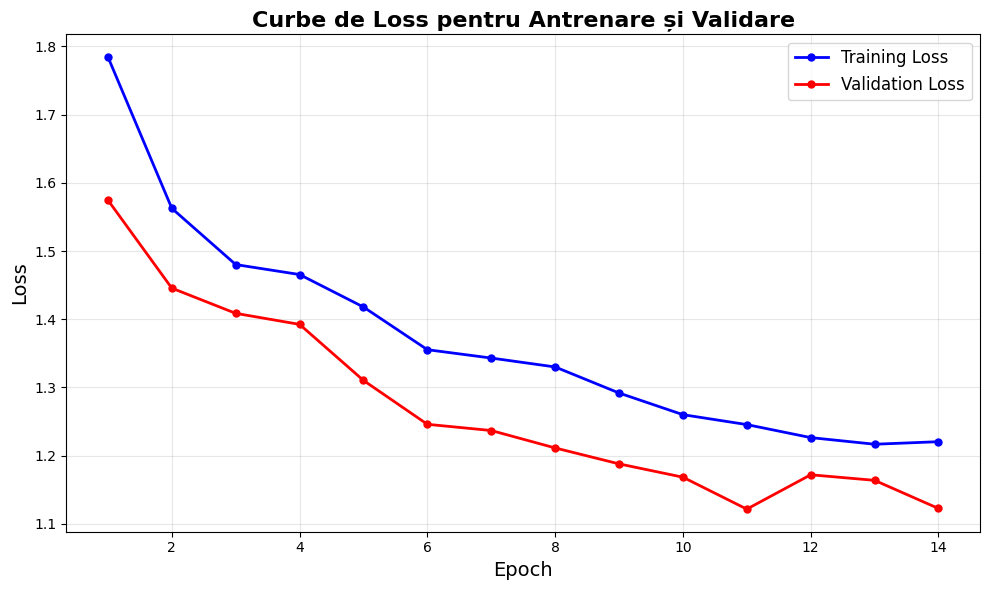

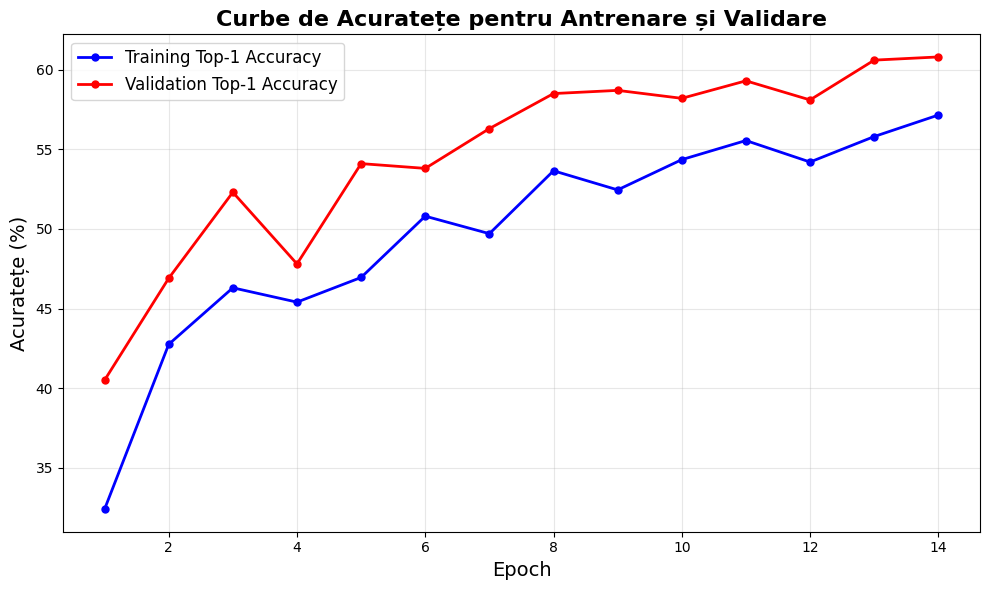

100%|██████████| 63/63 [00:01<00:00, 50.14it/s, epoch=15, train_loss=2.3589, top1_accuracy=112.90%]
Train - Loss: 1.1889, Top-1: 56.90%
100%|██████████| 32/32 [00:00<00:00, 150.02it/s, epoch=15, val_loss=4.4496, top1_accuracy=234.77%]
Val - Loss: 1.1391, Val - Top-1: 60.10%
EarlyStopping counter: 1 out of 7
100%|██████████| 63/63 [00:01<00:00, 51.68it/s, epoch=16, train_loss=2.3179, top1_accuracy=115.87%]
Train - Loss: 1.1682, Top-1: 58.40%
100%|██████████| 32/32 [00:00<00:00, 149.86it/s, epoch=16, val_loss=4.4978, top1_accuracy=232.42%]
Val - Loss: 1.1514, Val - Top-1: 59.50%
EarlyStopping counter: 2 out of 7


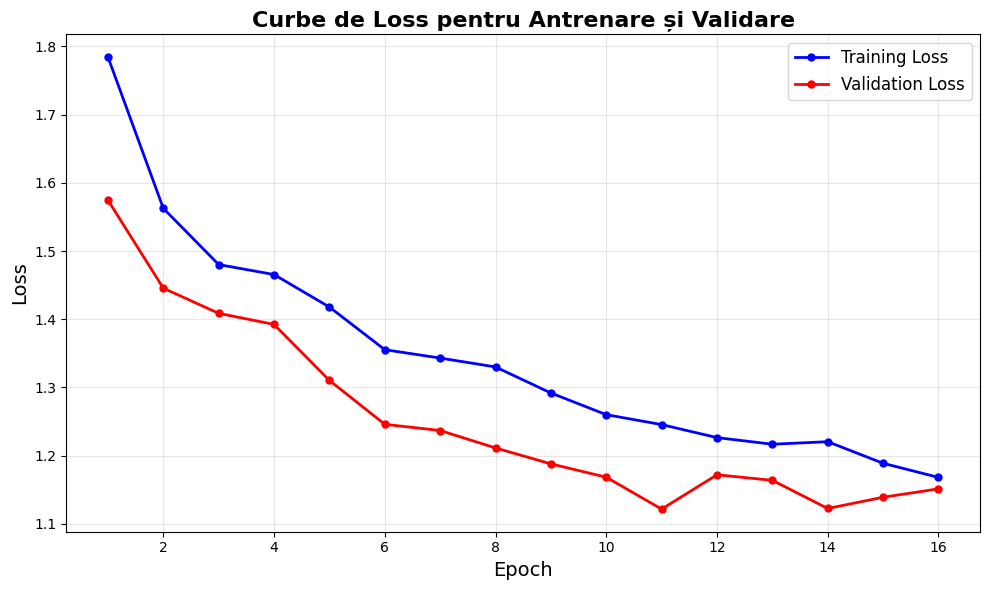

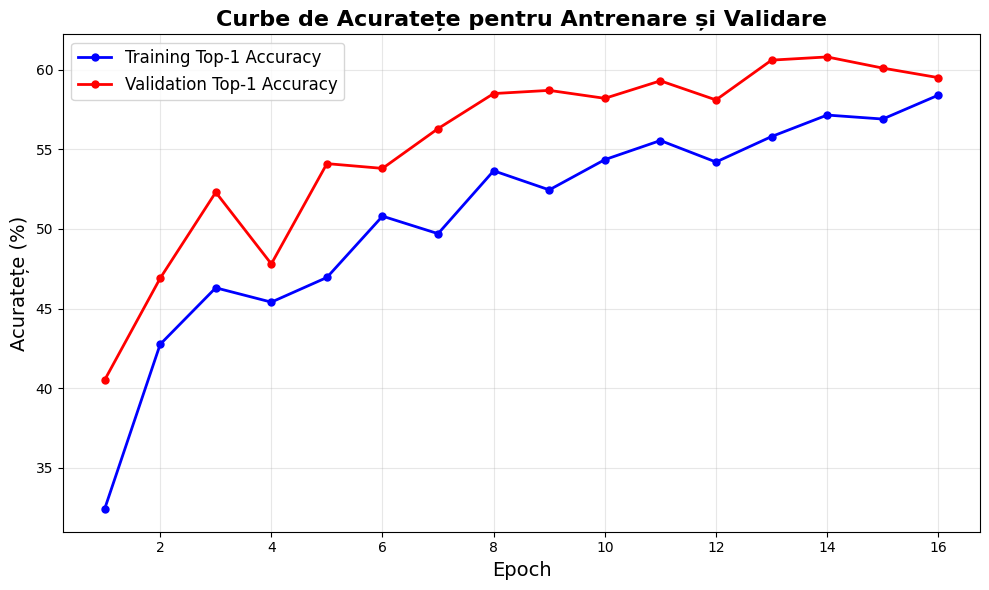

100%|██████████| 63/63 [00:01<00:00, 49.98it/s, epoch=17, train_loss=2.3154, top1_accuracy=113.00%]
Train - Loss: 1.1669, Top-1: 56.95%
100%|██████████| 32/32 [00:00<00:00, 150.28it/s, epoch=17, val_loss=4.5051, top1_accuracy=231.25%]
Val - Loss: 1.1533, Val - Top-1: 59.20%
EarlyStopping counter: 3 out of 7
100%|██████████| 63/63 [00:01<00:00, 49.73it/s, epoch=18, train_loss=2.3617, top1_accuracy=111.51%]
Train - Loss: 1.1903, Top-1: 56.20%
100%|██████████| 32/32 [00:00<00:00, 150.13it/s, epoch=18, val_loss=4.7714, top1_accuracy=219.53%]
Val - Loss: 1.2215, Val - Top-1: 56.20%
EarlyStopping counter: 4 out of 7


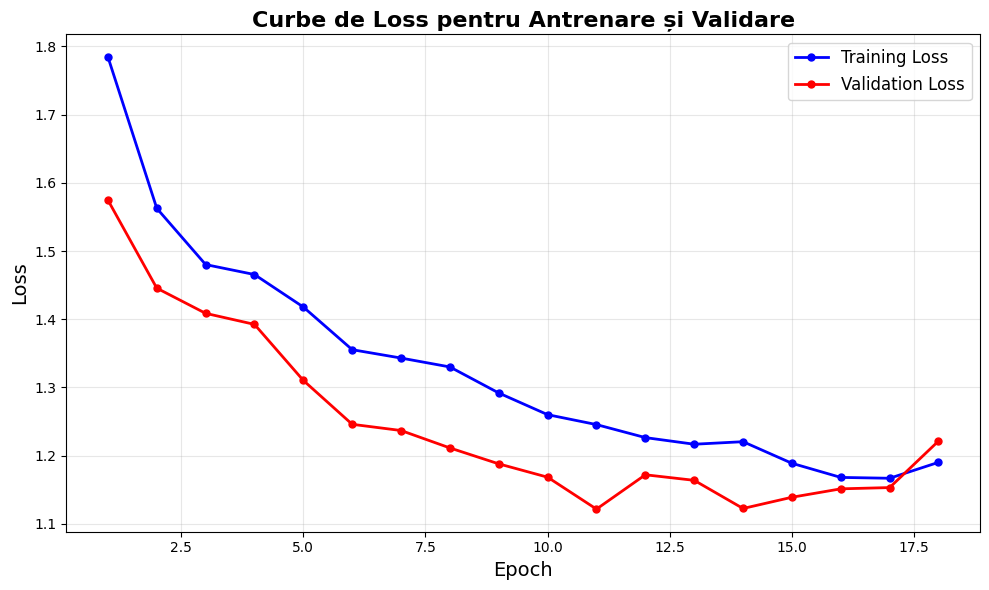

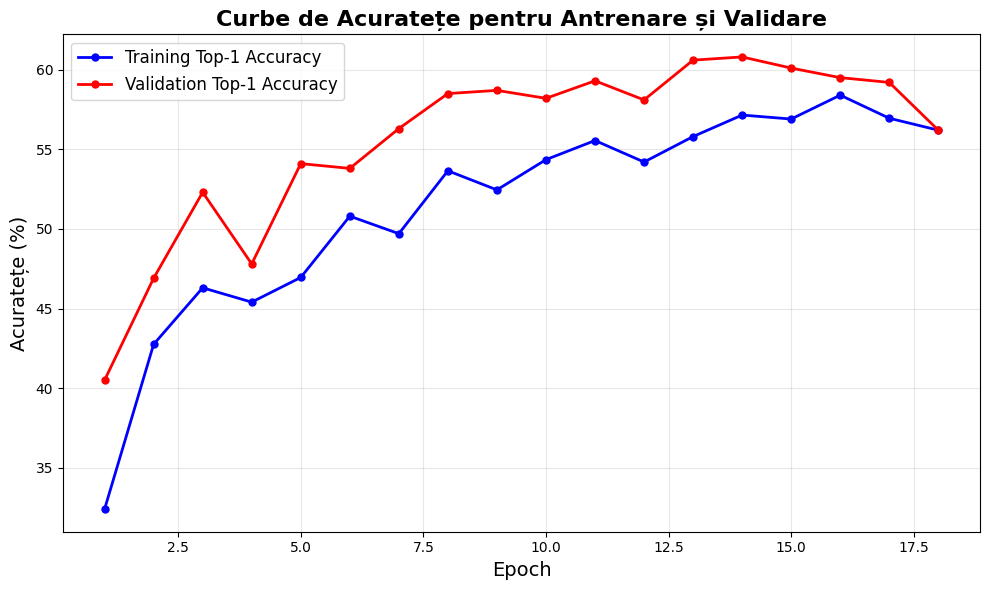

100%|██████████| 63/63 [00:01<00:00, 47.27it/s, epoch=19, train_loss=2.2057, top1_accuracy=120.14%]
Train - Loss: 1.1117, Top-1: 60.55%
100%|██████████| 32/32 [00:00<00:00, 149.83it/s, epoch=19, val_loss=4.2479, top1_accuracy=232.42%]
Val - Loss: 1.0875, Val - Top-1: 59.50%
EarlyStopping counter: 5 out of 7
100%|██████████| 63/63 [00:01<00:00, 50.26it/s, epoch=20, train_loss=2.1627, top1_accuracy=116.77%]
Train - Loss: 1.0900, Top-1: 58.85%
100%|██████████| 32/32 [00:00<00:00, 149.92it/s, epoch=20, val_loss=4.0629, top1_accuracy=250.78%]
Val - Loss: 1.0401, Val - Top-1: 64.20%
Validation accuracy increased (60.800000 → 64.200000). Saving model...


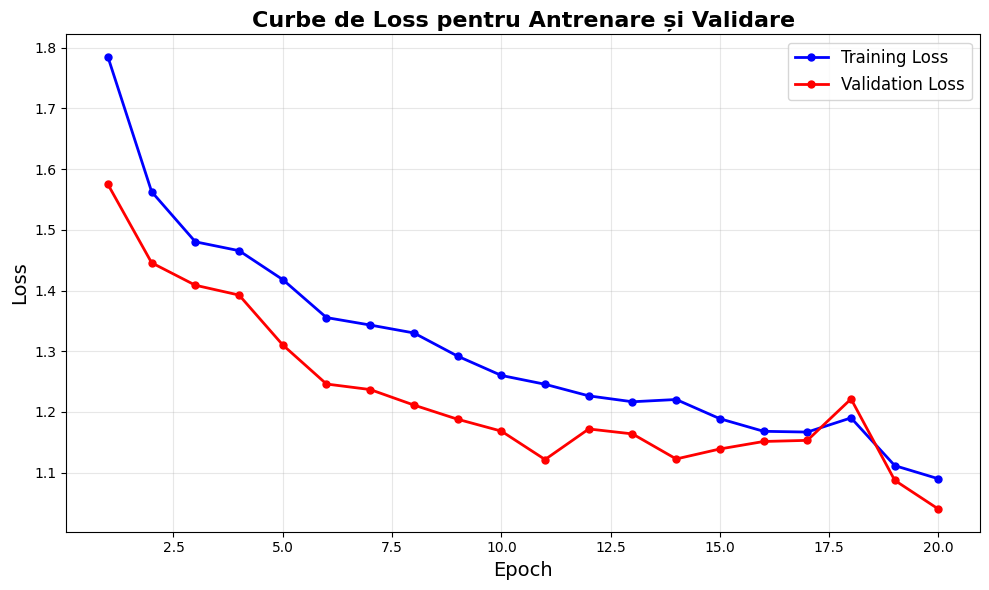

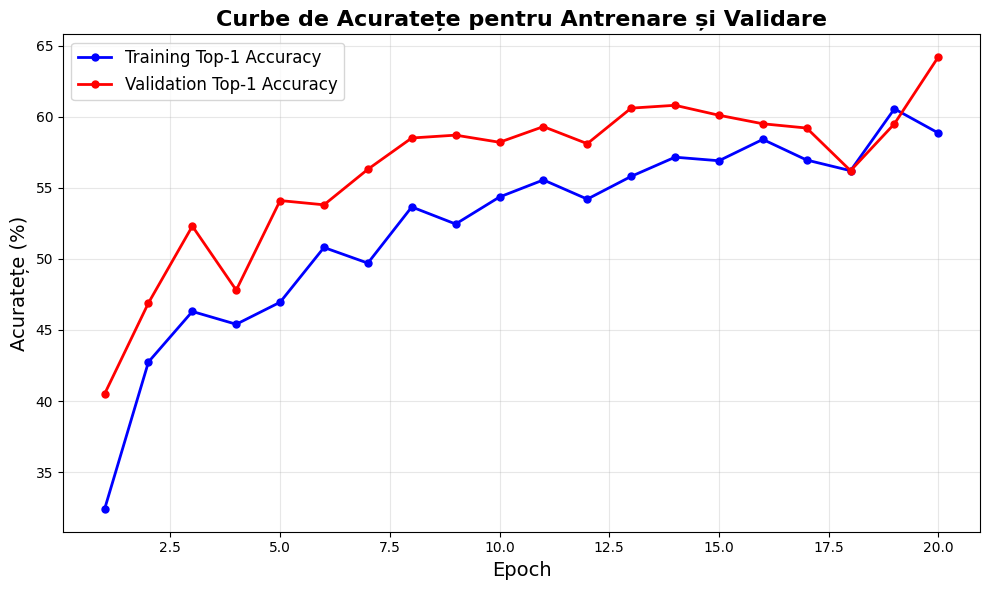

100%|██████████| 63/63 [00:01<00:00, 50.53it/s, epoch=21, train_loss=2.1893, top1_accuracy=116.27%]
Train - Loss: 1.1034, Top-1: 58.60%
100%|██████████| 32/32 [00:00<00:00, 149.73it/s, epoch=21, val_loss=4.4219, top1_accuracy=241.80%]
Val - Loss: 1.1320, Val - Top-1: 61.90%
EarlyStopping counter: 1 out of 7
100%|██████████| 63/63 [00:01<00:00, 49.82it/s, epoch=22, train_loss=2.1401, top1_accuracy=119.54%]
Train - Loss: 1.0786, Top-1: 60.25%
100%|██████████| 32/32 [00:00<00:00, 136.83it/s, epoch=22, val_loss=4.1048, top1_accuracy=239.84%]
Val - Loss: 1.0508, Val - Top-1: 61.40%
EarlyStopping counter: 2 out of 7


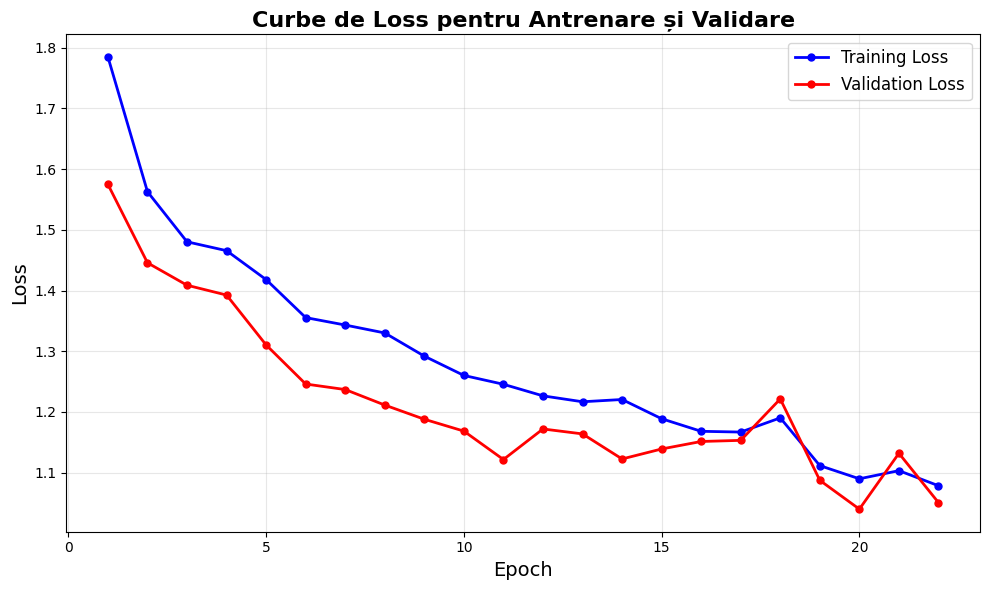

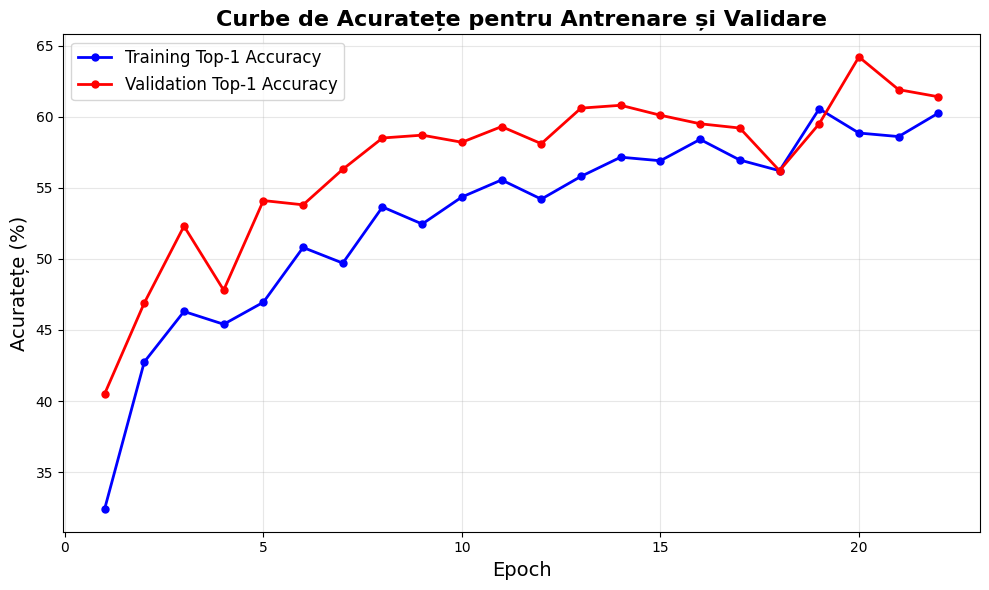

100%|██████████| 63/63 [00:01<00:00, 47.59it/s, epoch=23, train_loss=2.0666, top1_accuracy=120.63%]
Train - Loss: 1.0416, Top-1: 60.80%
100%|██████████| 32/32 [00:00<00:00, 148.52it/s, epoch=23, val_loss=4.3712, top1_accuracy=233.98%]
Val - Loss: 1.1190, Val - Top-1: 59.90%
EarlyStopping counter: 3 out of 7
100%|██████████| 63/63 [00:01<00:00, 49.55it/s, epoch=24, train_loss=2.1212, top1_accuracy=121.73%]
Train - Loss: 1.0691, Top-1: 61.35%
100%|██████████| 32/32 [00:00<00:00, 144.51it/s, epoch=24, val_loss=4.1888, top1_accuracy=252.34%]
Val - Loss: 1.0723, Val - Top-1: 64.60%
Validation accuracy increased (64.200000 → 64.600000). Saving model...


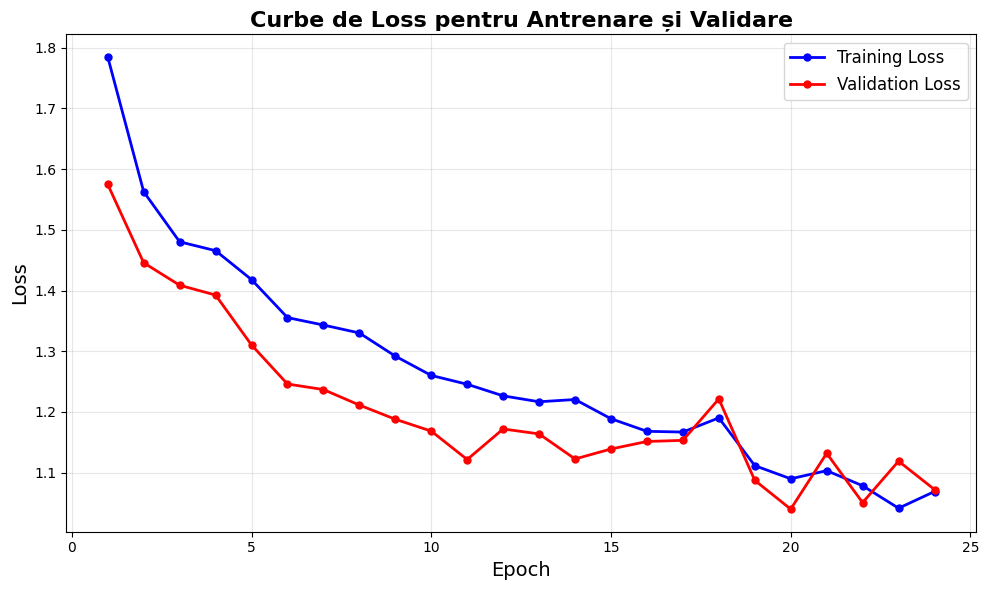

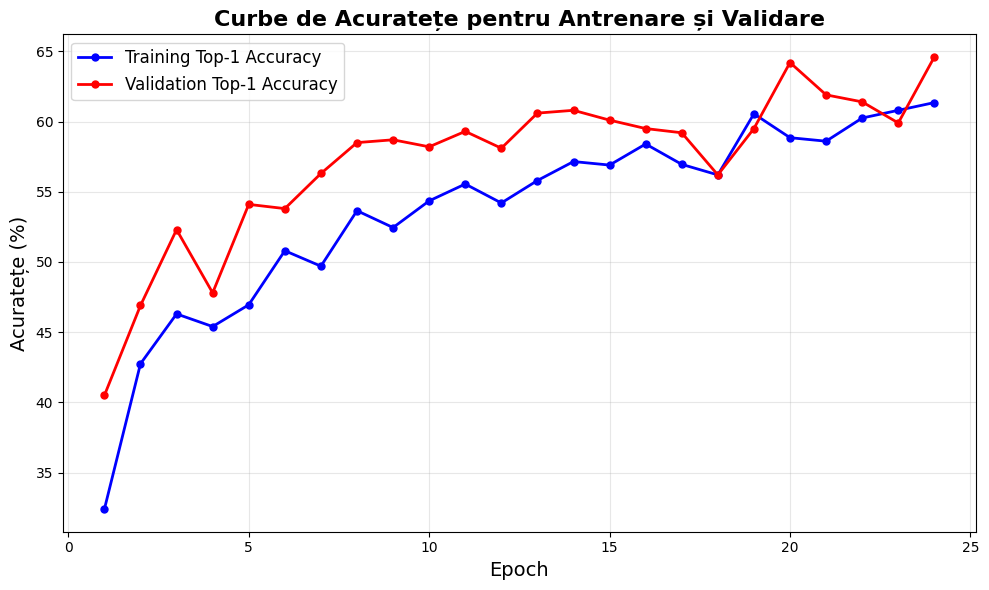

100%|██████████| 63/63 [00:01<00:00, 48.46it/s, epoch=25, train_loss=2.1463, top1_accuracy=119.35%]
Train - Loss: 1.0817, Top-1: 60.15%
100%|██████████| 32/32 [00:00<00:00, 147.33it/s, epoch=25, val_loss=4.1217, top1_accuracy=244.53%]
Val - Loss: 1.0552, Val - Top-1: 62.60%
EarlyStopping counter: 1 out of 7
100%|██████████| 63/63 [00:01<00:00, 48.43it/s, epoch=26, train_loss=2.1084, top1_accuracy=121.63%]
Train - Loss: 1.0626, Top-1: 61.30%
100%|██████████| 32/32 [00:00<00:00, 139.99it/s, epoch=26, val_loss=4.2048, top1_accuracy=239.06%]
Val - Loss: 1.0764, Val - Top-1: 61.20%
EarlyStopping counter: 2 out of 7


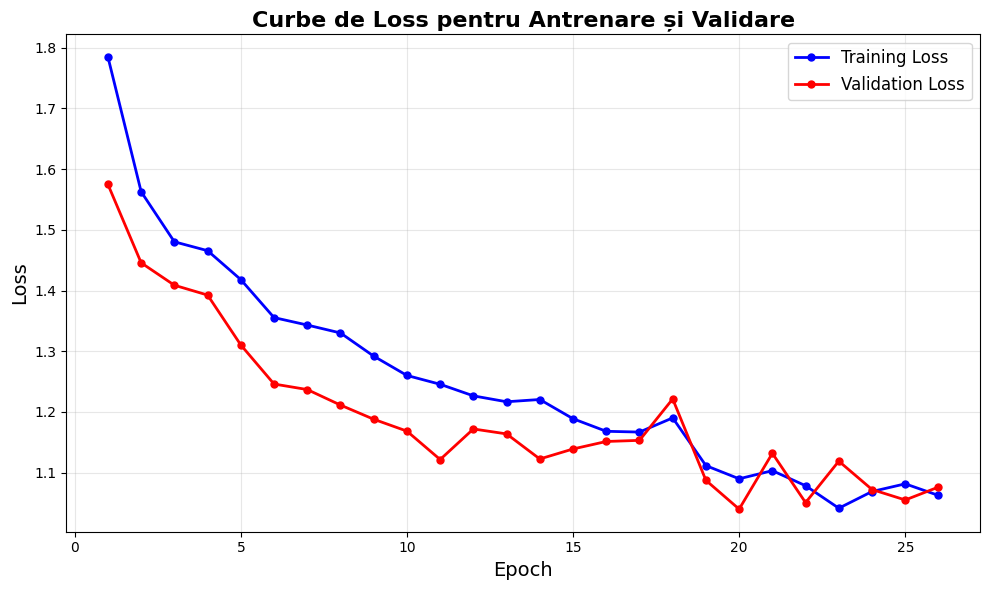

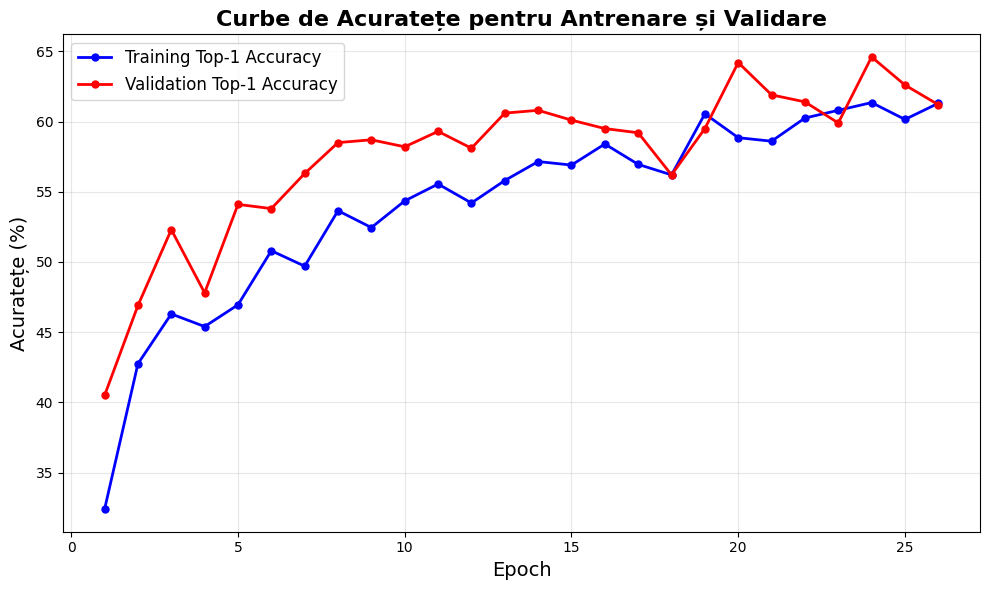

100%|██████████| 63/63 [00:01<00:00, 47.40it/s, epoch=27, train_loss=2.0716, top1_accuracy=123.71%]
Train - Loss: 1.0441, Top-1: 62.35%
100%|██████████| 32/32 [00:00<00:00, 144.55it/s, epoch=27, val_loss=4.0403, top1_accuracy=251.17%]
Val - Loss: 1.0343, Val - Top-1: 64.30%
EarlyStopping counter: 3 out of 7
100%|██████████| 63/63 [00:01<00:00, 48.09it/s, epoch=28, train_loss=2.0846, top1_accuracy=124.60%]
Train - Loss: 1.0507, Top-1: 62.80%
100%|██████████| 32/32 [00:00<00:00, 148.20it/s, epoch=28, val_loss=4.0514, top1_accuracy=248.44%]
Val - Loss: 1.0372, Val - Top-1: 63.60%
EarlyStopping counter: 4 out of 7


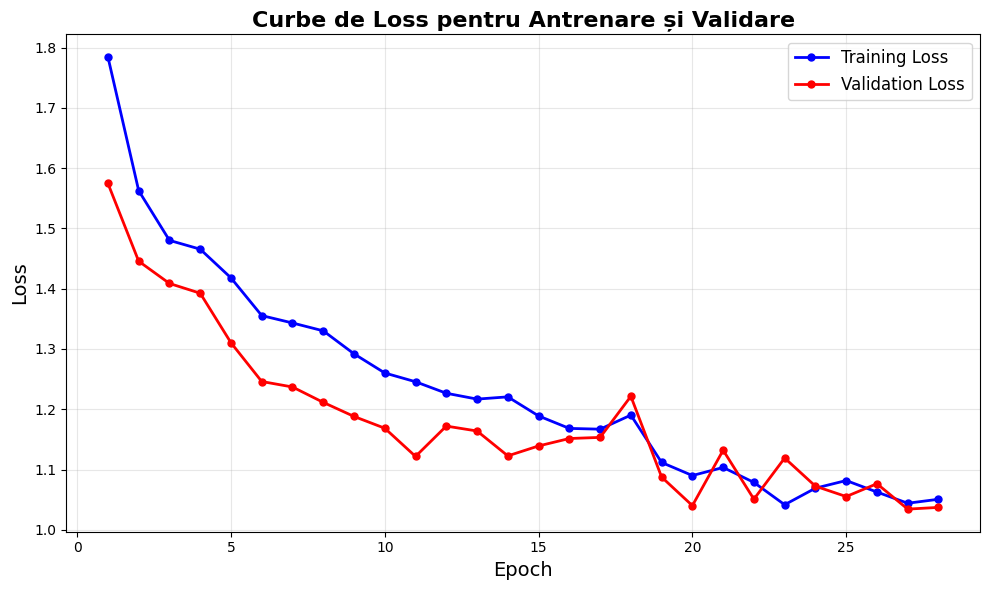

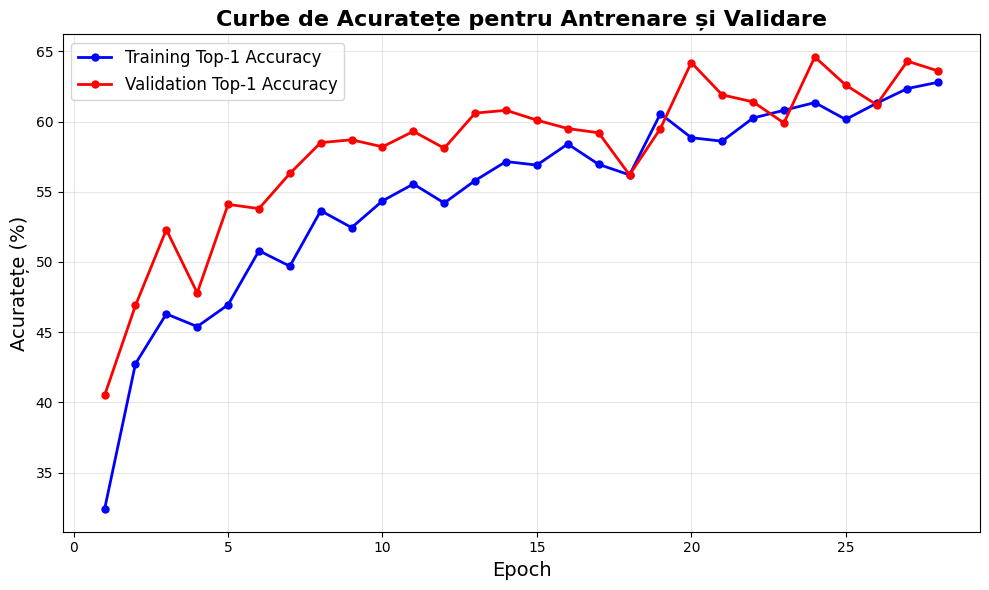

100%|██████████| 63/63 [00:01<00:00, 48.06it/s, epoch=29, train_loss=2.0504, top1_accuracy=122.82%]
Train - Loss: 1.0334, Top-1: 61.90%
100%|██████████| 32/32 [00:00<00:00, 142.63it/s, epoch=29, val_loss=4.0757, top1_accuracy=248.83%]
Val - Loss: 1.0434, Val - Top-1: 63.70%
EarlyStopping counter: 5 out of 7
100%|██████████| 63/63 [00:01<00:00, 47.10it/s, epoch=30, train_loss=2.0383, top1_accuracy=123.02%]
Train - Loss: 1.0273, Top-1: 62.00%
100%|██████████| 32/32 [00:00<00:00, 142.45it/s, epoch=30, val_loss=3.9742, top1_accuracy=253.91%]
Val - Loss: 1.0174, Val - Top-1: 65.00%
Validation accuracy increased (64.600000 → 65.000000). Saving model...


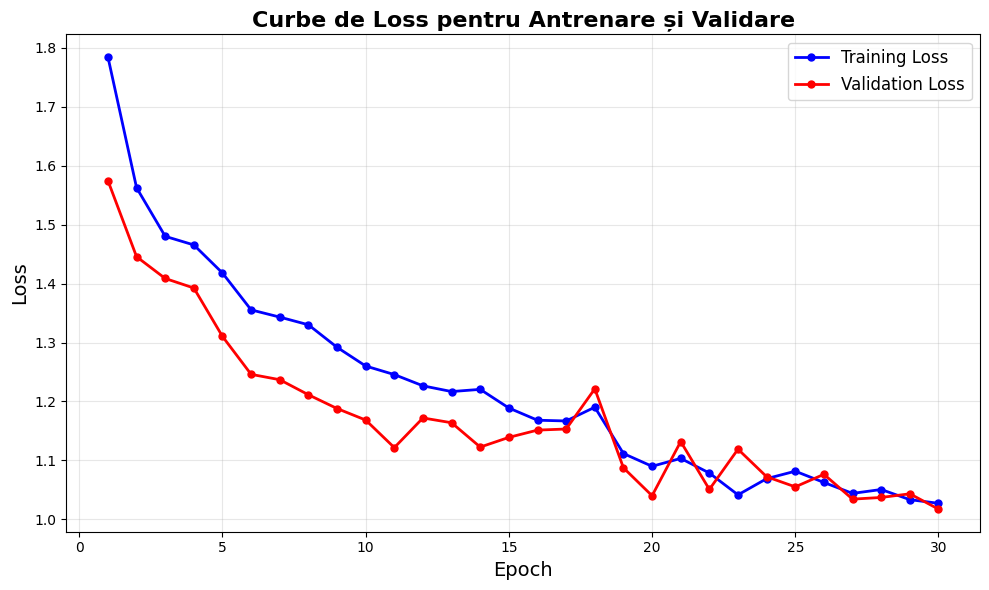

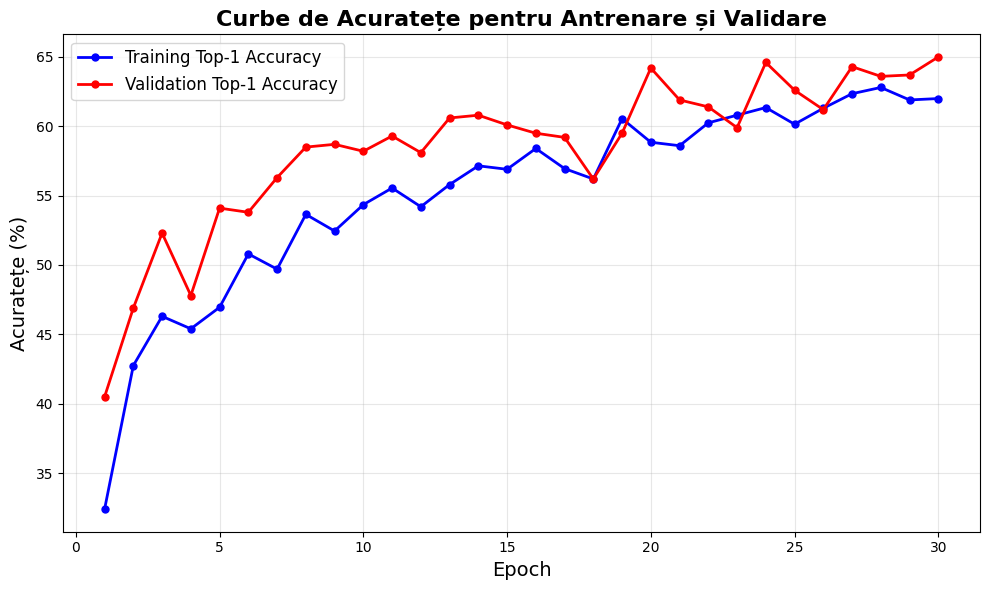

100%|██████████| 63/63 [00:01<00:00, 46.79it/s, epoch=31, train_loss=2.0087, top1_accuracy=122.62%]
Train - Loss: 1.0124, Top-1: 61.80%
100%|██████████| 32/32 [00:00<00:00, 140.00it/s, epoch=31, val_loss=4.0972, top1_accuracy=253.91%]
Val - Loss: 1.0489, Val - Top-1: 65.00%
EarlyStopping counter: 1 out of 7
100%|██████████| 63/63 [00:01<00:00, 47.94it/s, epoch=32, train_loss=1.9741, top1_accuracy=126.59%]
Train - Loss: 0.9950, Top-1: 63.80%
100%|██████████| 32/32 [00:00<00:00, 142.92it/s, epoch=32, val_loss=3.9900, top1_accuracy=257.42%]
Val - Loss: 1.0214, Val - Top-1: 65.90%
Validation accuracy increased (65.000000 → 65.900000). Saving model...


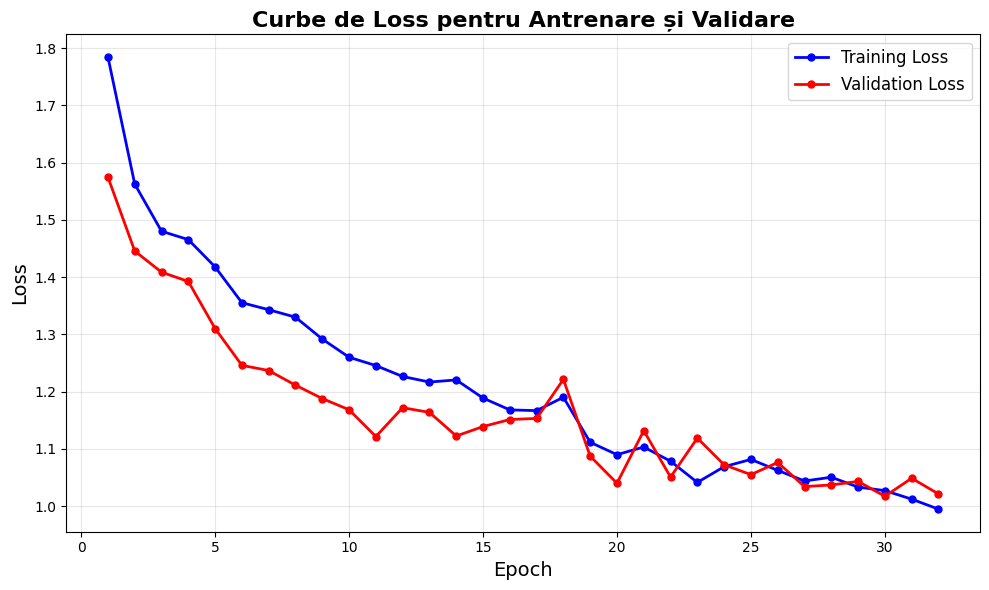

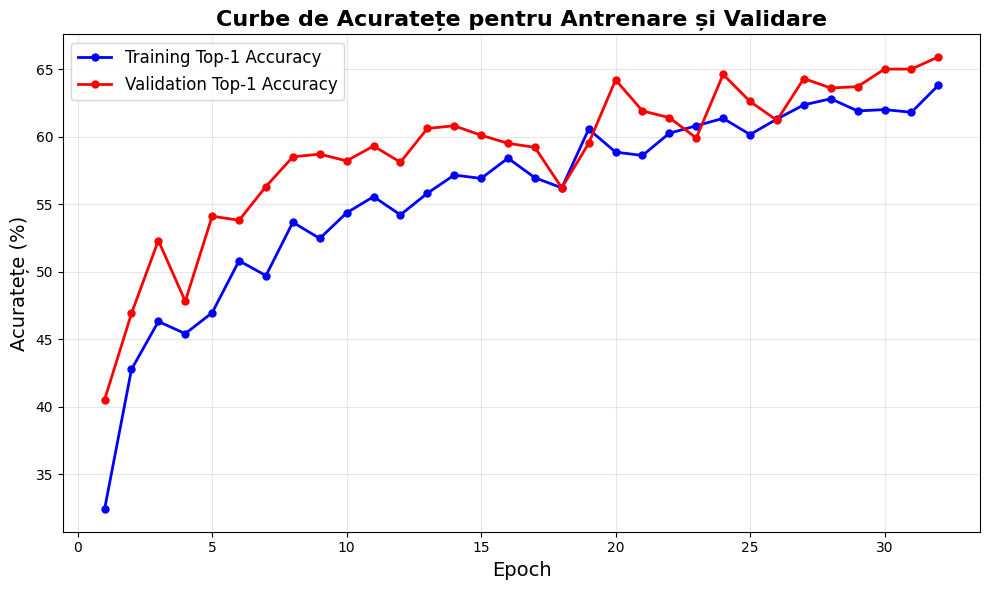

100%|██████████| 63/63 [00:01<00:00, 44.89it/s, epoch=33, train_loss=1.9058, top1_accuracy=128.97%]
Train - Loss: 0.9605, Top-1: 65.00%
100%|██████████| 32/32 [00:00<00:00, 141.96it/s, epoch=33, val_loss=4.0406, top1_accuracy=253.91%]
Val - Loss: 1.0344, Val - Top-1: 65.00%
EarlyStopping counter: 1 out of 7
100%|██████████| 63/63 [00:01<00:00, 46.10it/s, epoch=34, train_loss=1.9734, top1_accuracy=127.48%]
Train - Loss: 0.9946, Top-1: 64.25%
100%|██████████| 32/32 [00:00<00:00, 140.79it/s, epoch=34, val_loss=4.0517, top1_accuracy=248.05%]
Val - Loss: 1.0372, Val - Top-1: 63.50%
EarlyStopping counter: 2 out of 7


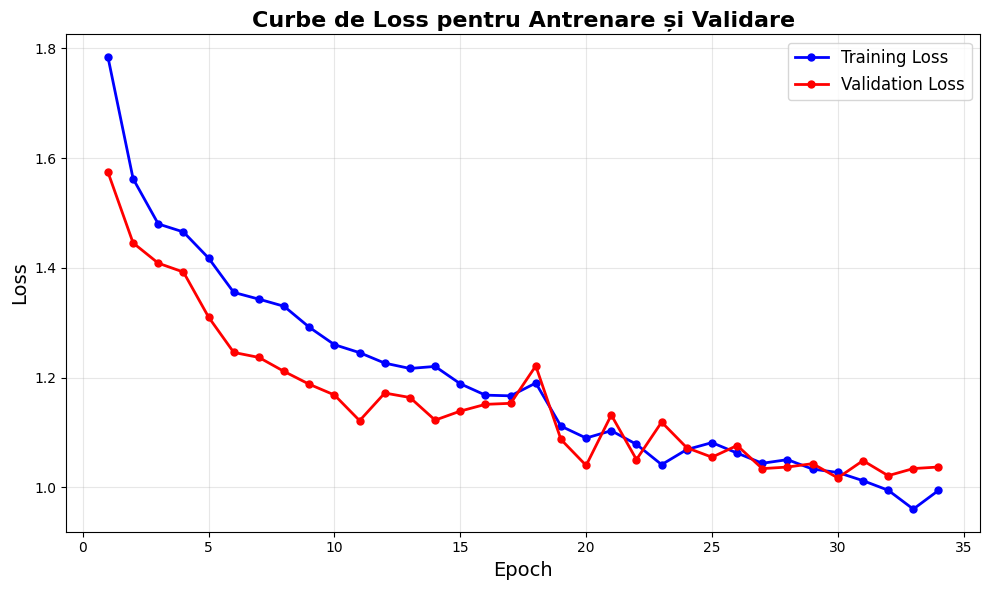

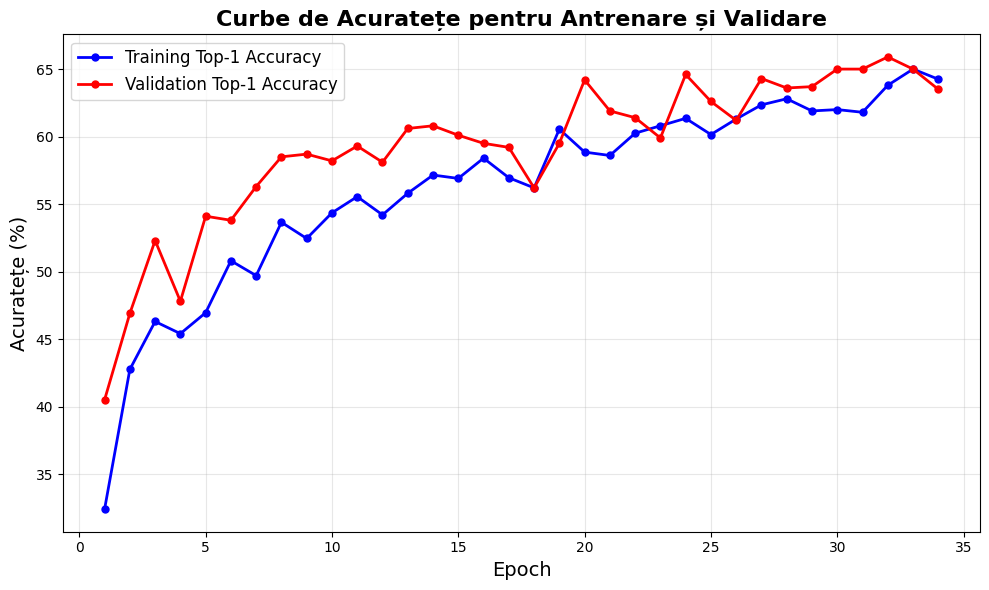

100%|██████████| 63/63 [00:01<00:00, 46.04it/s, epoch=35, train_loss=1.8829, top1_accuracy=127.68%]
Train - Loss: 0.9490, Top-1: 64.35%
100%|██████████| 32/32 [00:00<00:00, 141.68it/s, epoch=35, val_loss=3.9437, top1_accuracy=252.73%]
Val - Loss: 1.0096, Val - Top-1: 64.70%
EarlyStopping counter: 3 out of 7
100%|██████████| 63/63 [00:01<00:00, 46.71it/s, epoch=36, train_loss=1.9524, top1_accuracy=126.69%]
Train - Loss: 0.9840, Top-1: 63.85%
100%|██████████| 32/32 [00:00<00:00, 140.83it/s, epoch=36, val_loss=3.9560, top1_accuracy=248.44%]
Val - Loss: 1.0127, Val - Top-1: 63.60%
EarlyStopping counter: 4 out of 7


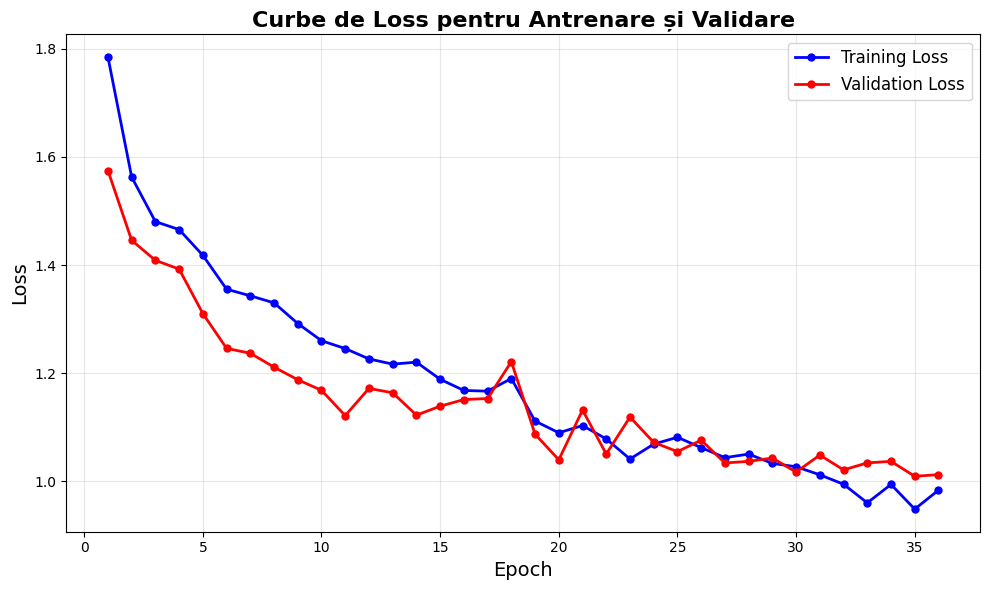

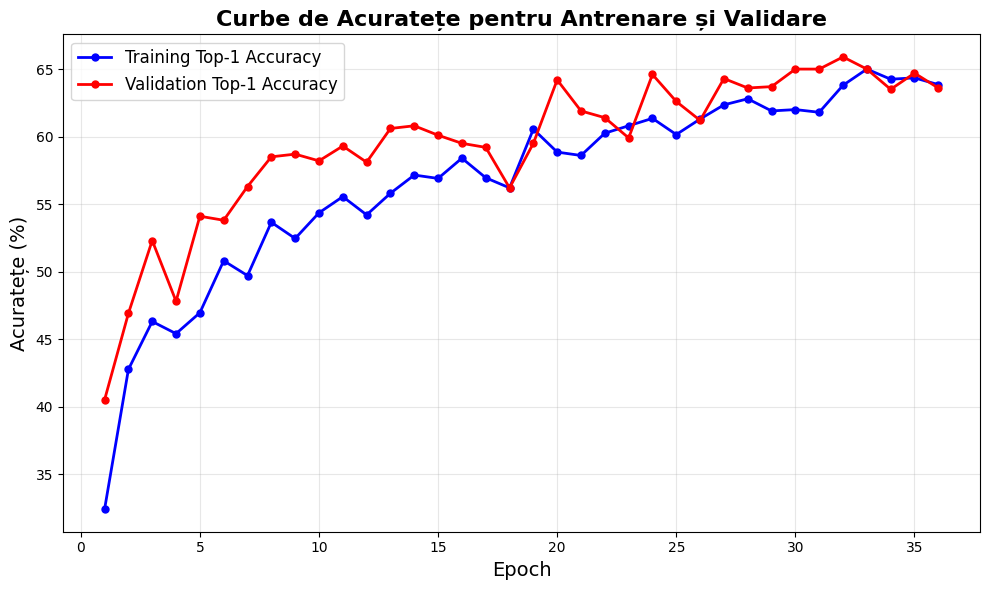

100%|██████████| 63/63 [00:01<00:00, 45.95it/s, epoch=37, train_loss=1.8648, top1_accuracy=131.35%]
Train - Loss: 0.9398, Top-1: 66.20%
100%|██████████| 32/32 [00:00<00:00, 141.52it/s, epoch=37, val_loss=3.9513, top1_accuracy=254.30%]
Val - Loss: 1.0115, Val - Top-1: 65.10%
EarlyStopping counter: 5 out of 7
100%|██████████| 63/63 [00:01<00:00, 45.02it/s, epoch=38, train_loss=1.9252, top1_accuracy=128.17%]
Train - Loss: 0.9703, Top-1: 64.60%
100%|██████████| 32/32 [00:00<00:00, 137.89it/s, epoch=38, val_loss=4.3137, top1_accuracy=240.62%]
Val - Loss: 1.1043, Val - Top-1: 61.60%
EarlyStopping counter: 6 out of 7


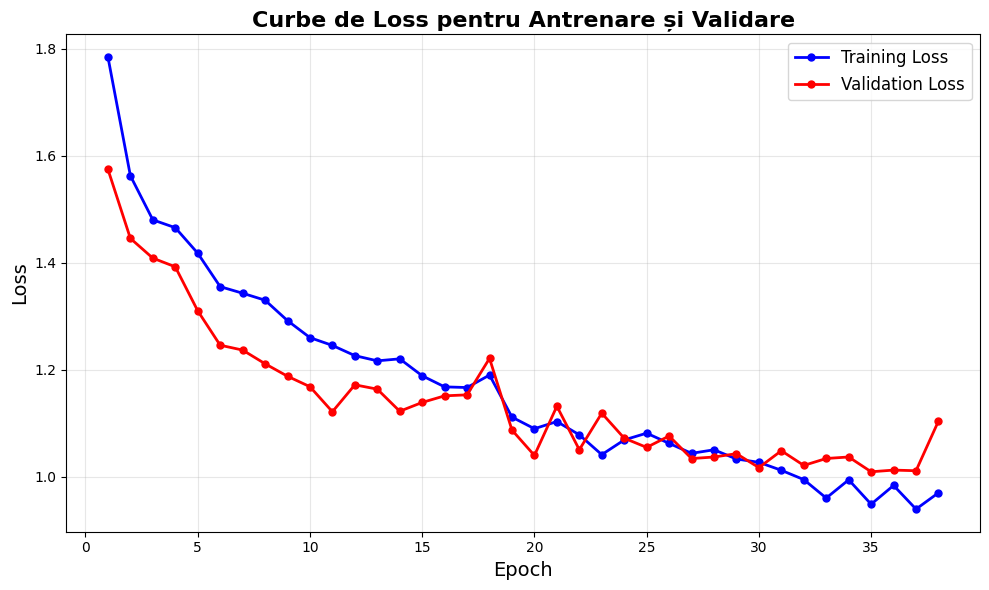

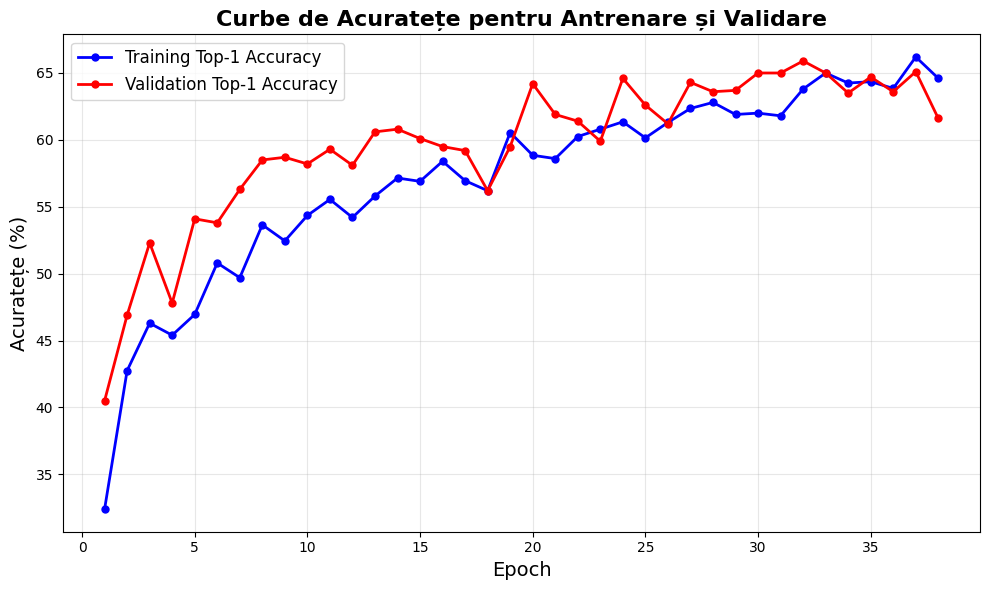

100%|██████████| 63/63 [00:01<00:00, 45.13it/s, epoch=39, train_loss=1.9035, top1_accuracy=128.37%]
Train - Loss: 0.9594, Top-1: 64.70%
100%|██████████| 32/32 [00:00<00:00, 133.71it/s, epoch=39, val_loss=3.9689, top1_accuracy=253.91%]
Val - Loss: 1.0160, Val - Top-1: 65.00%
EarlyStopping counter: 7 out of 7
Early stopping triggered at epoch 39

Model 4 Best Validation Accuracy: 65.90%

Training Model 5/5
Config: lr=0.003, weight_decay=0.0001, lr_decay=0.915

100%|██████████| 63/63 [00:01<00:00, 45.91it/s, epoch=1, train_loss=3.6450, top1_accuracy=62.90%]
Train - Loss: 1.8371, Top-1: 31.70%
100%|██████████| 32/32 [00:00<00:00, 136.96it/s, epoch=1, val_loss=6.3801, top1_accuracy=182.03%]
Val - Loss: 1.6333, Val - Top-1: 46.60%
Validation accuracy increased (-inf → 46.600000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 45.83it/s, epoch=2, train_loss=3.1314, top1_accuracy=84.82%]
Train - Loss: 1.5782, Top-1: 42.75%
100%|██████████| 32/32 [00:00<00:00, 120.72it/s, epoch=2, val_los

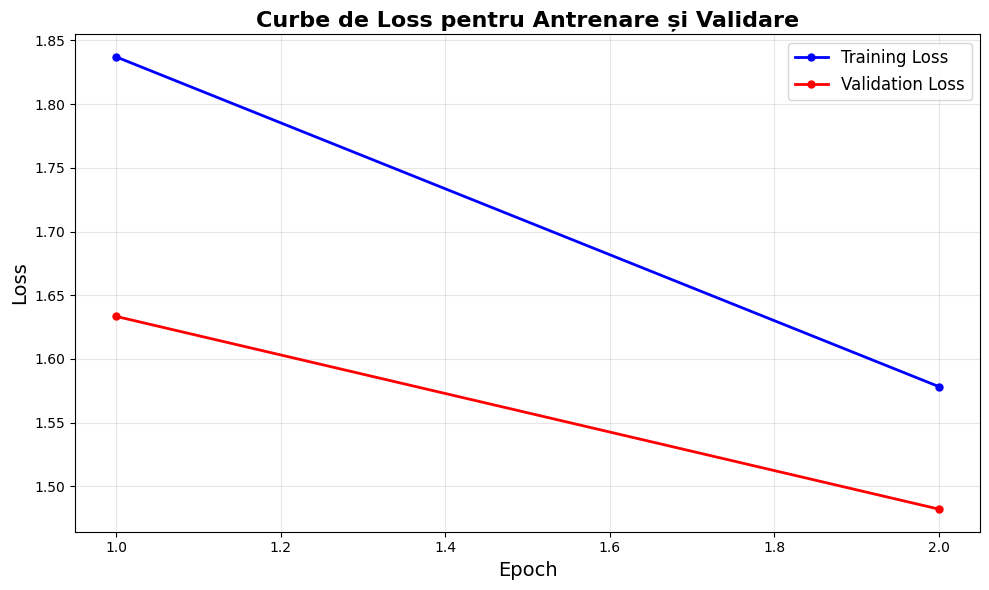

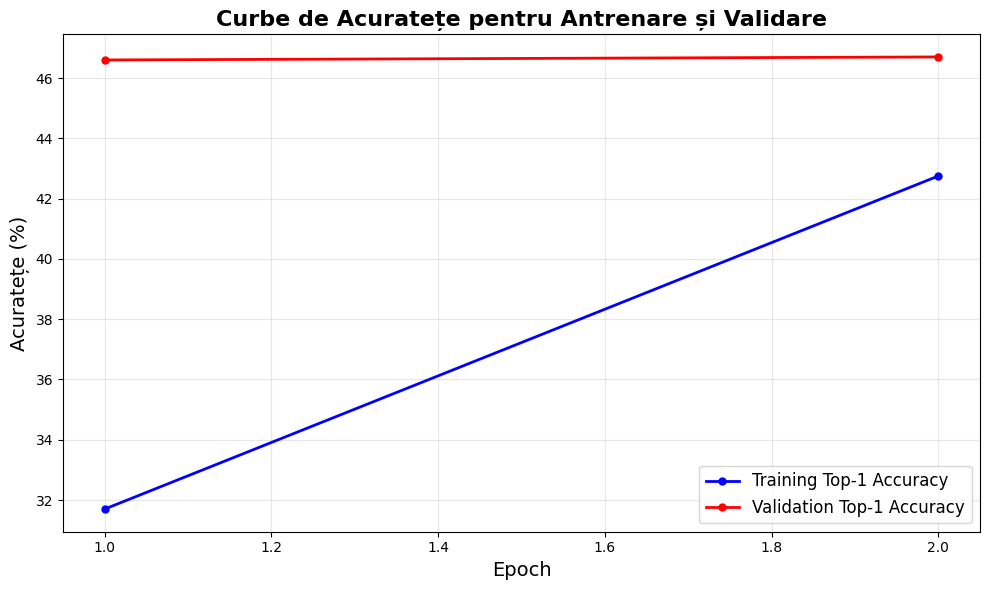

100%|██████████| 63/63 [00:01<00:00, 44.15it/s, epoch=3, train_loss=2.9663, top1_accuracy=90.67%]
Train - Loss: 1.4950, Top-1: 45.70%
100%|██████████| 32/32 [00:00<00:00, 141.11it/s, epoch=3, val_loss=5.3719, top1_accuracy=198.83%]
Val - Loss: 1.3752, Val - Top-1: 50.90%
Validation accuracy increased (46.700000 → 50.900000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 45.89it/s, epoch=4, train_loss=2.8788, top1_accuracy=91.67%]
Train - Loss: 1.4509, Top-1: 46.20%
100%|██████████| 32/32 [00:00<00:00, 137.38it/s, epoch=4, val_loss=5.2942, top1_accuracy=197.27%]
Val - Loss: 1.3553, Val - Top-1: 50.50%
EarlyStopping counter: 1 out of 7


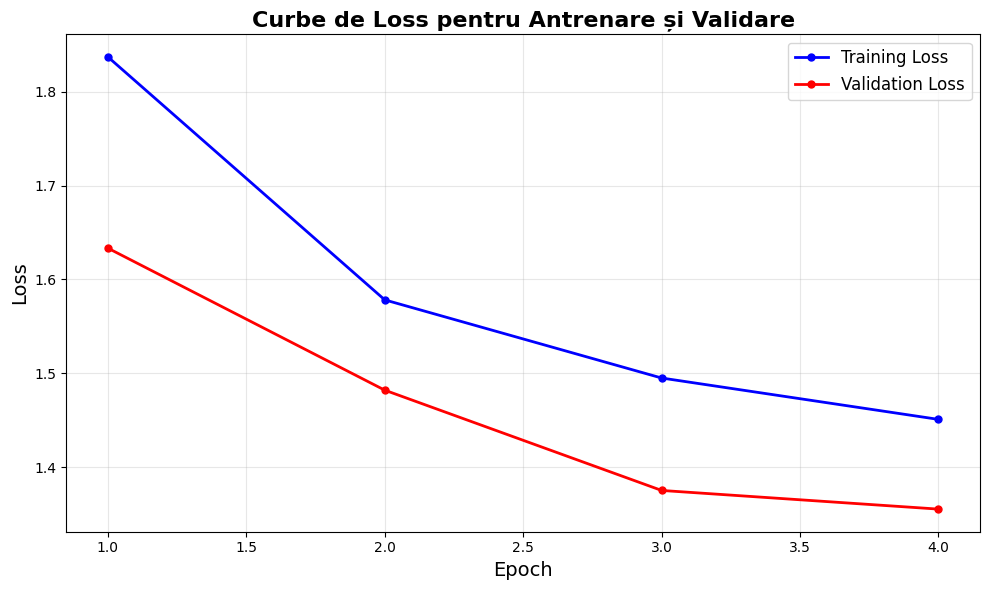

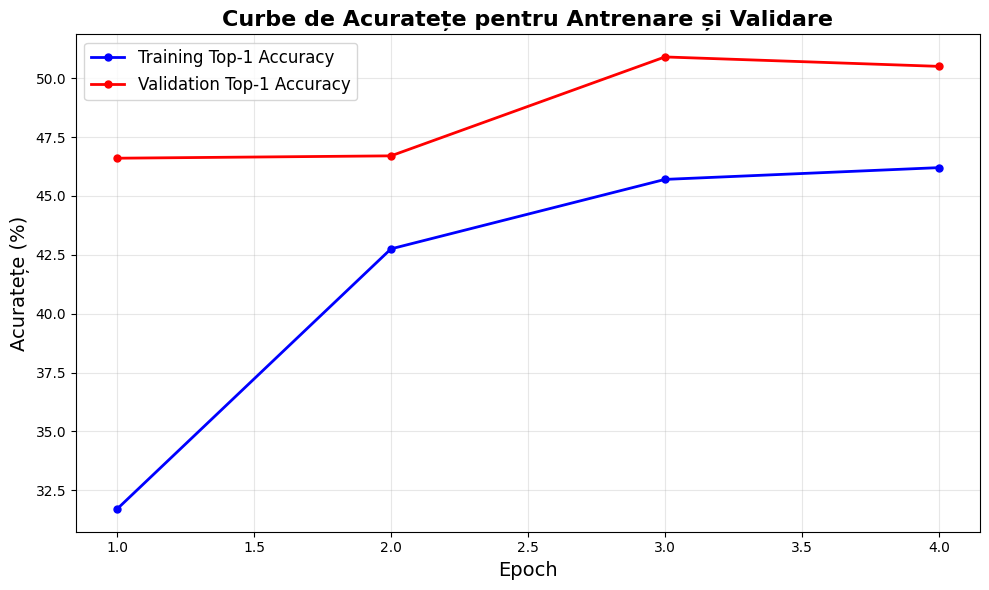

100%|██████████| 63/63 [00:01<00:00, 45.01it/s, epoch=5, train_loss=2.8478, top1_accuracy=92.56%]
Train - Loss: 1.4353, Top-1: 46.65%
100%|██████████| 32/32 [00:00<00:00, 140.22it/s, epoch=5, val_loss=5.1276, top1_accuracy=207.42%]
Val - Loss: 1.3127, Val - Top-1: 53.10%
Validation accuracy increased (50.900000 → 53.100000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 44.49it/s, epoch=6, train_loss=2.7105, top1_accuracy=98.71%]
Train - Loss: 1.3661, Top-1: 49.75%
100%|██████████| 32/32 [00:00<00:00, 138.51it/s, epoch=6, val_loss=4.7769, top1_accuracy=228.12%]
Val - Loss: 1.2229, Val - Top-1: 58.40%
Validation accuracy increased (53.100000 → 58.400000). Saving model...


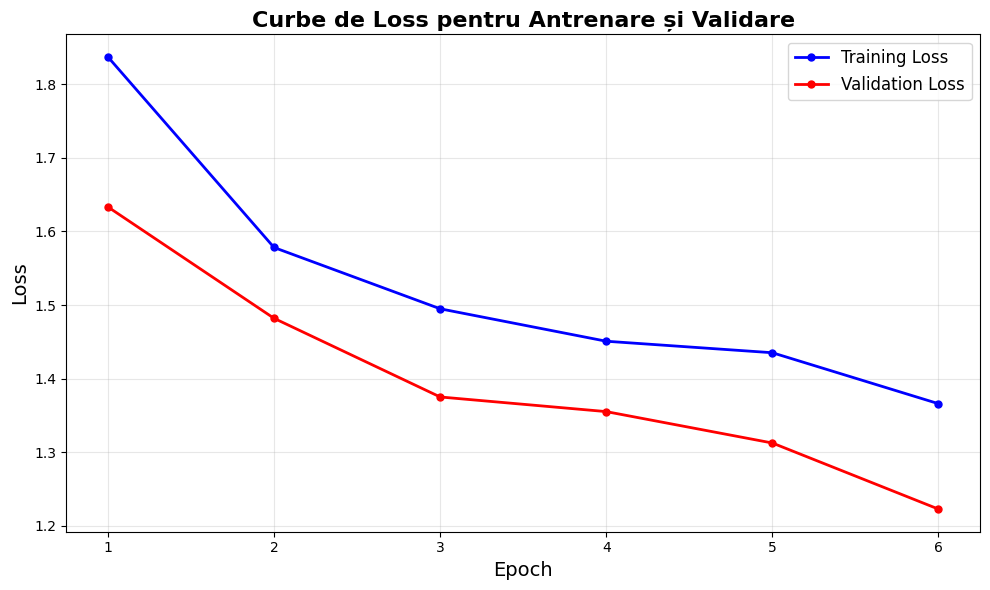

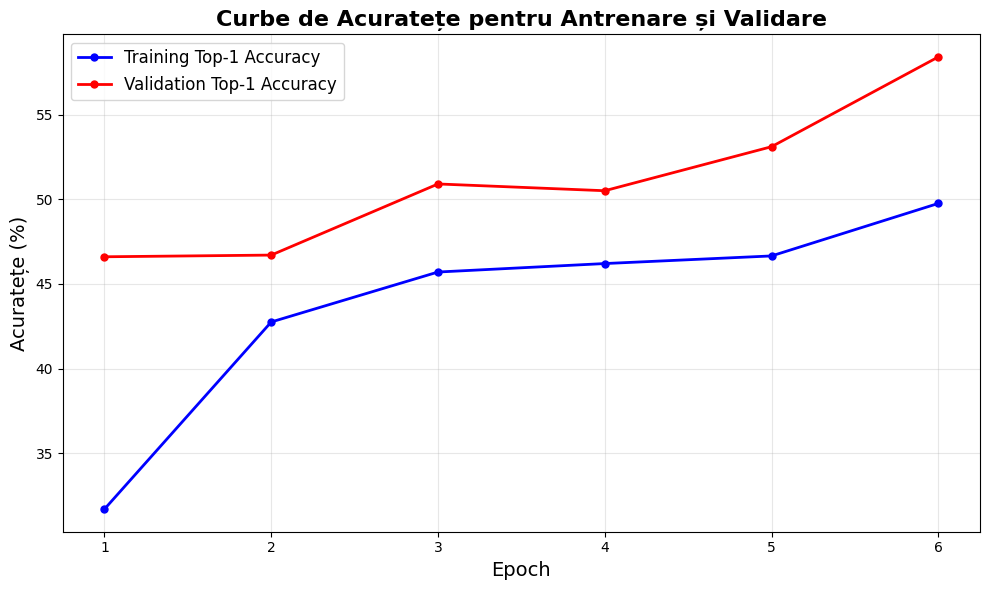

100%|██████████| 63/63 [00:01<00:00, 44.35it/s, epoch=7, train_loss=2.6499, top1_accuracy=99.31%]
Train - Loss: 1.3355, Top-1: 50.05%
100%|██████████| 32/32 [00:00<00:00, 141.88it/s, epoch=7, val_loss=4.7318, top1_accuracy=221.09%]
Val - Loss: 1.2113, Val - Top-1: 56.60%
EarlyStopping counter: 1 out of 7
100%|██████████| 63/63 [00:01<00:00, 45.42it/s, epoch=8, train_loss=2.5817, top1_accuracy=106.45%]
Train - Loss: 1.3012, Top-1: 53.65%
100%|██████████| 32/32 [00:00<00:00, 141.41it/s, epoch=8, val_loss=4.7688, top1_accuracy=213.28%]
Val - Loss: 1.2208, Val - Top-1: 54.60%
EarlyStopping counter: 2 out of 7


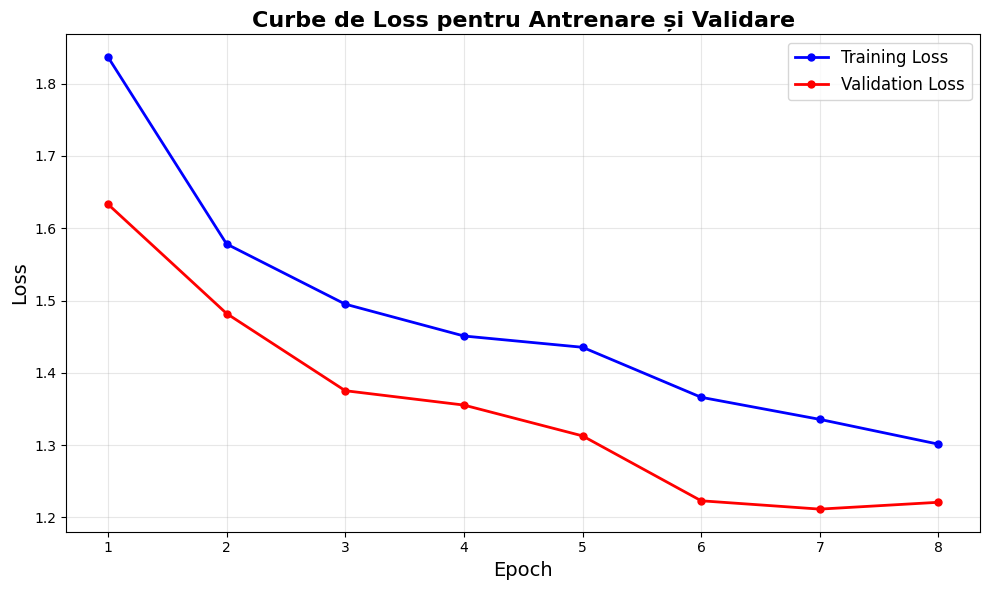

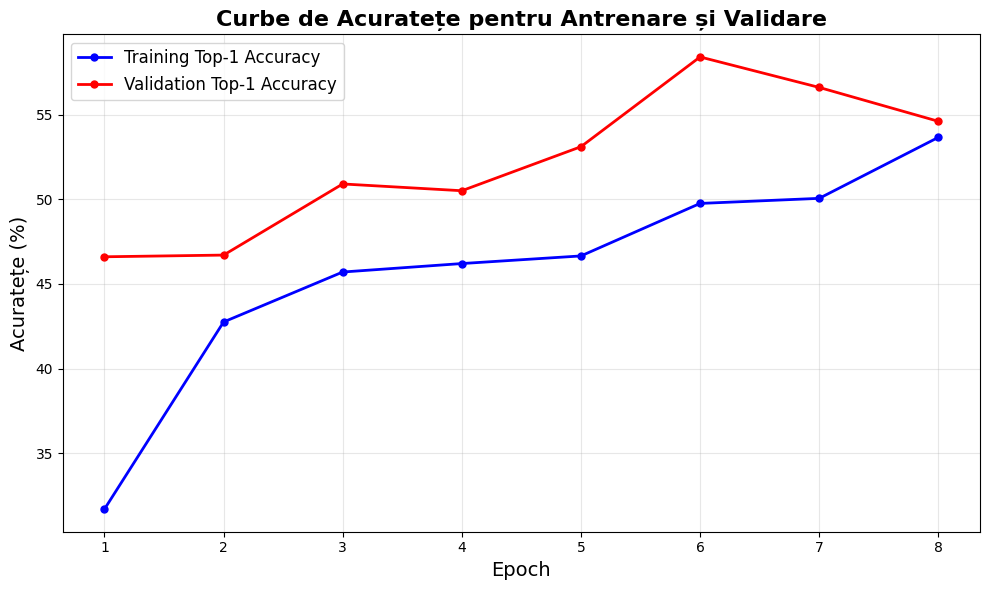

100%|██████████| 63/63 [00:01<00:00, 44.42it/s, epoch=9, train_loss=2.5806, top1_accuracy=103.87%]
Train - Loss: 1.3006, Top-1: 52.35%
100%|██████████| 32/32 [00:00<00:00, 140.99it/s, epoch=9, val_loss=4.5173, top1_accuracy=239.06%]
Val - Loss: 1.1564, Val - Top-1: 61.20%
Validation accuracy increased (58.400000 → 61.200000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 43.26it/s, epoch=10, train_loss=2.5313, top1_accuracy=106.05%]
Train - Loss: 1.2758, Top-1: 53.45%
100%|██████████| 32/32 [00:00<00:00, 111.23it/s, epoch=10, val_loss=4.5026, top1_accuracy=231.25%]
Val - Loss: 1.1527, Val - Top-1: 59.20%
EarlyStopping counter: 1 out of 7


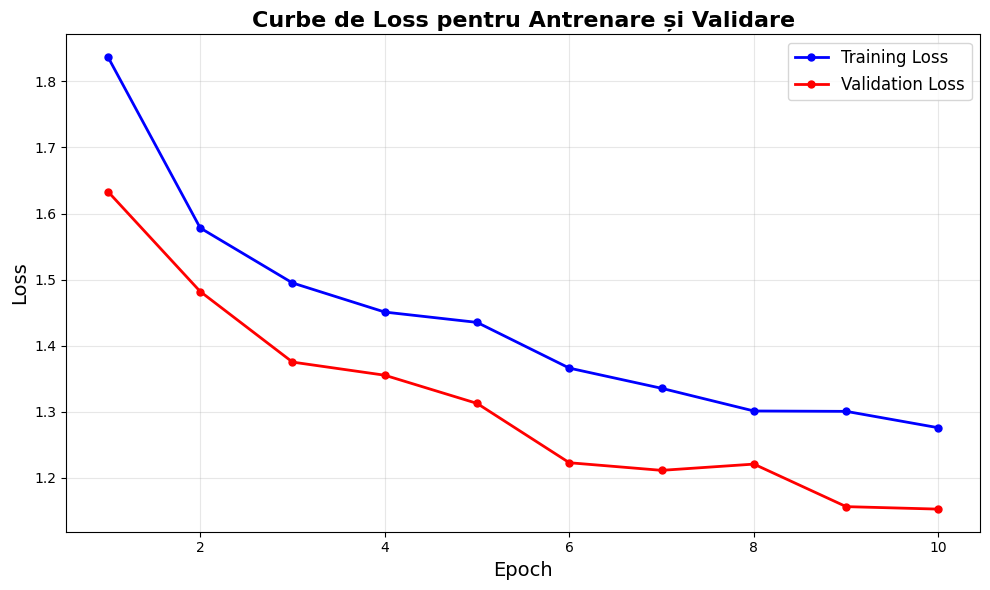

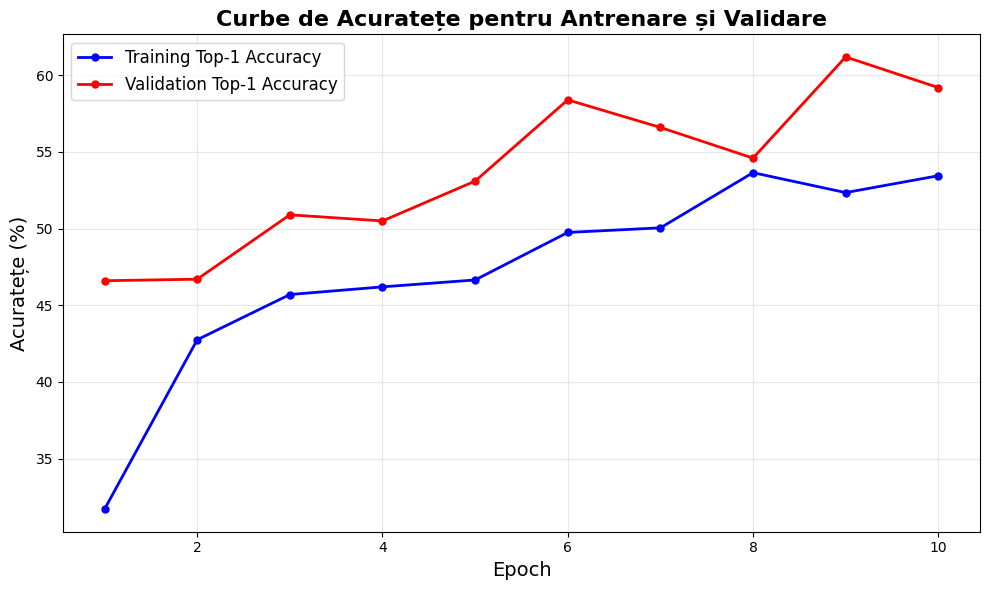

100%|██████████| 63/63 [00:01<00:00, 42.85it/s, epoch=11, train_loss=2.5384, top1_accuracy=104.27%]
Train - Loss: 1.2794, Top-1: 52.55%
100%|██████████| 32/32 [00:00<00:00, 134.40it/s, epoch=11, val_loss=4.4339, top1_accuracy=230.86%]
Val - Loss: 1.1351, Val - Top-1: 59.10%
EarlyStopping counter: 2 out of 7
100%|██████████| 63/63 [00:01<00:00, 45.00it/s, epoch=12, train_loss=2.4452, top1_accuracy=110.02%]
Train - Loss: 1.2324, Top-1: 55.45%
100%|██████████| 32/32 [00:00<00:00, 138.87it/s, epoch=12, val_loss=4.3754, top1_accuracy=232.03%]
Val - Loss: 1.1201, Val - Top-1: 59.40%
EarlyStopping counter: 3 out of 7


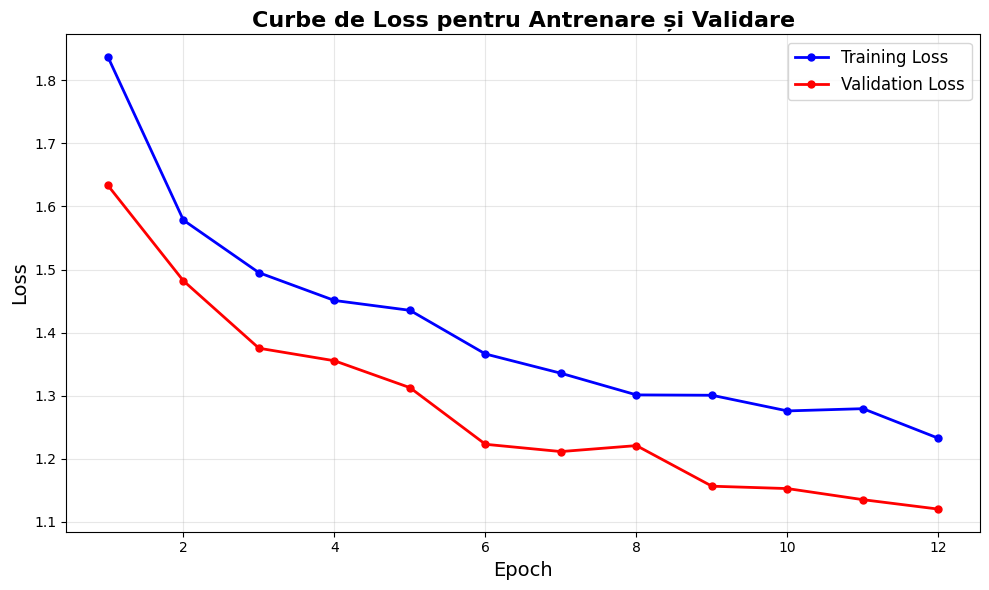

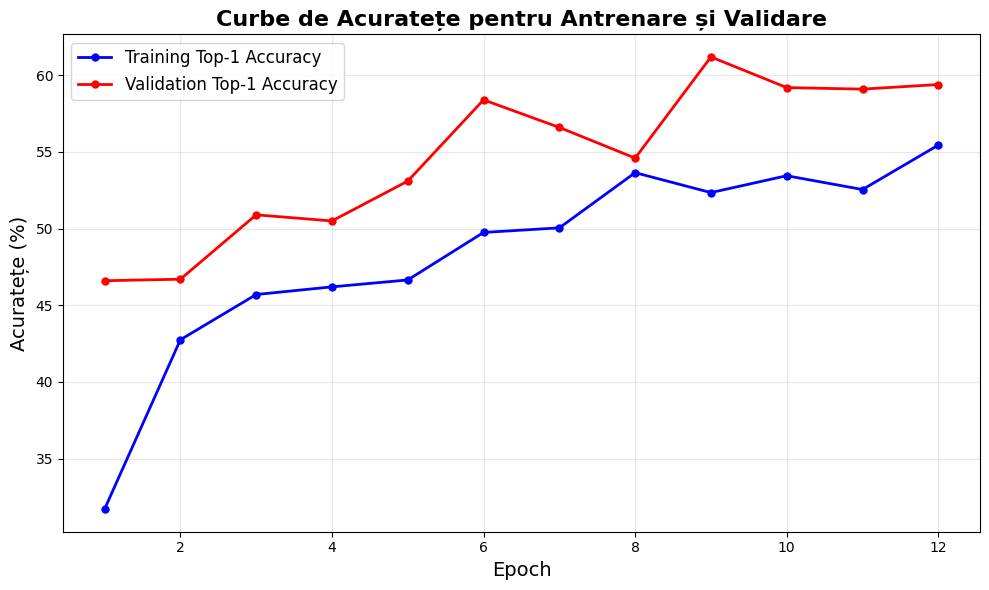

100%|██████████| 63/63 [00:01<00:00, 44.49it/s, epoch=13, train_loss=2.4265, top1_accuracy=110.52%]
Train - Loss: 1.2230, Top-1: 55.70%
100%|██████████| 32/32 [00:00<00:00, 140.88it/s, epoch=13, val_loss=4.4738, top1_accuracy=228.91%]
Val - Loss: 1.1453, Val - Top-1: 58.60%
EarlyStopping counter: 4 out of 7
100%|██████████| 63/63 [00:01<00:00, 44.73it/s, epoch=14, train_loss=2.3884, top1_accuracy=107.54%]
Train - Loss: 1.2038, Top-1: 54.20%
100%|██████████| 32/32 [00:00<00:00, 138.81it/s, epoch=14, val_loss=4.4570, top1_accuracy=230.86%]
Val - Loss: 1.1410, Val - Top-1: 59.10%
EarlyStopping counter: 5 out of 7


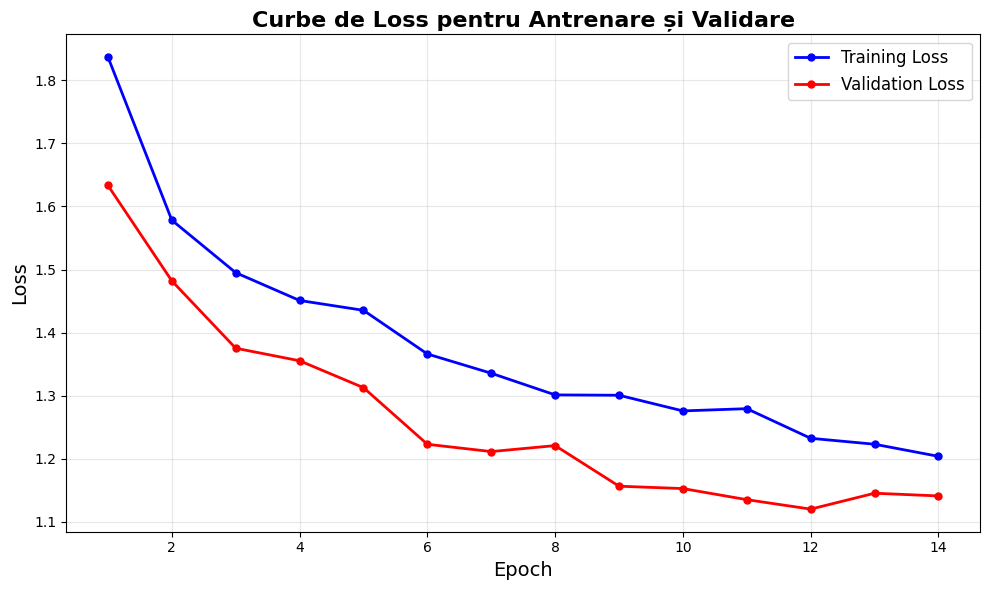

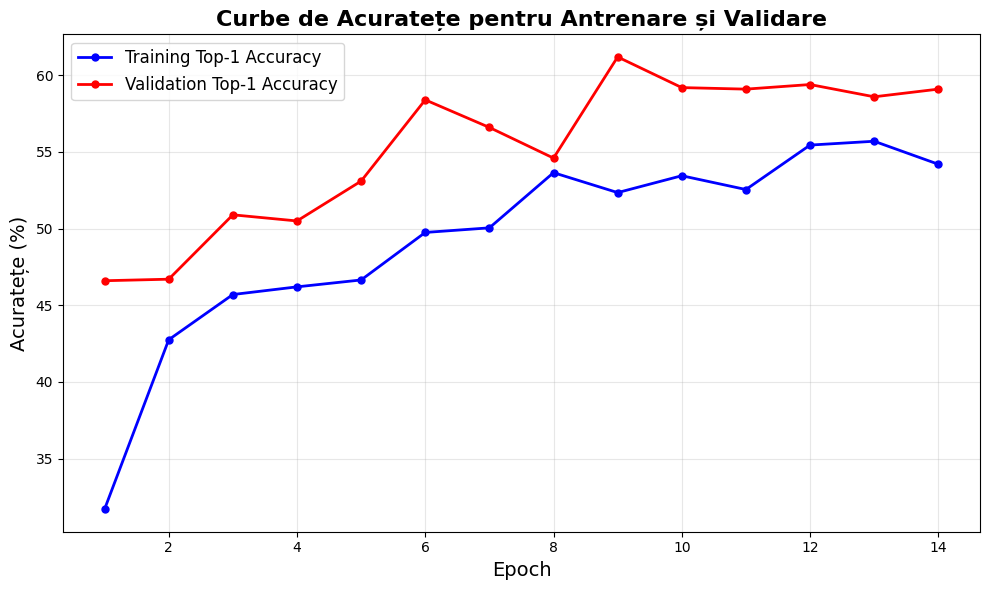

100%|██████████| 63/63 [00:01<00:00, 42.51it/s, epoch=15, train_loss=2.3335, top1_accuracy=114.88%]
Train - Loss: 1.1761, Top-1: 57.90%
100%|██████████| 32/32 [00:00<00:00, 132.92it/s, epoch=15, val_loss=4.4564, top1_accuracy=236.72%]
Val - Loss: 1.1409, Val - Top-1: 60.60%
EarlyStopping counter: 6 out of 7
100%|██████████| 63/63 [00:01<00:00, 43.56it/s, epoch=16, train_loss=2.3193, top1_accuracy=115.38%]
Train - Loss: 1.1689, Top-1: 58.15%
100%|██████████| 32/32 [00:00<00:00, 135.34it/s, epoch=16, val_loss=4.2355, top1_accuracy=251.56%]
Val - Loss: 1.0843, Val - Top-1: 64.40%
Validation accuracy increased (61.200000 → 64.400000). Saving model...


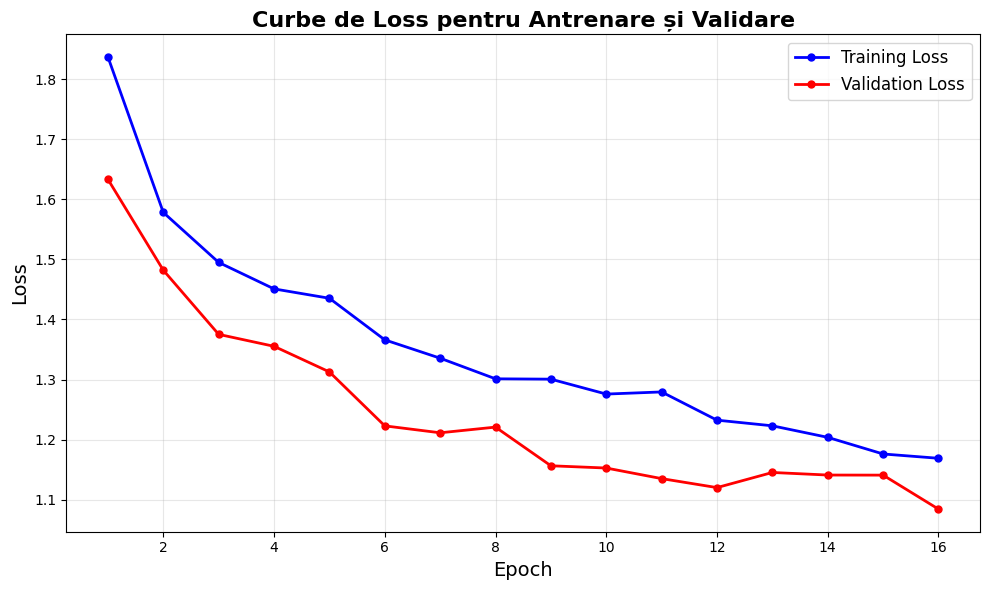

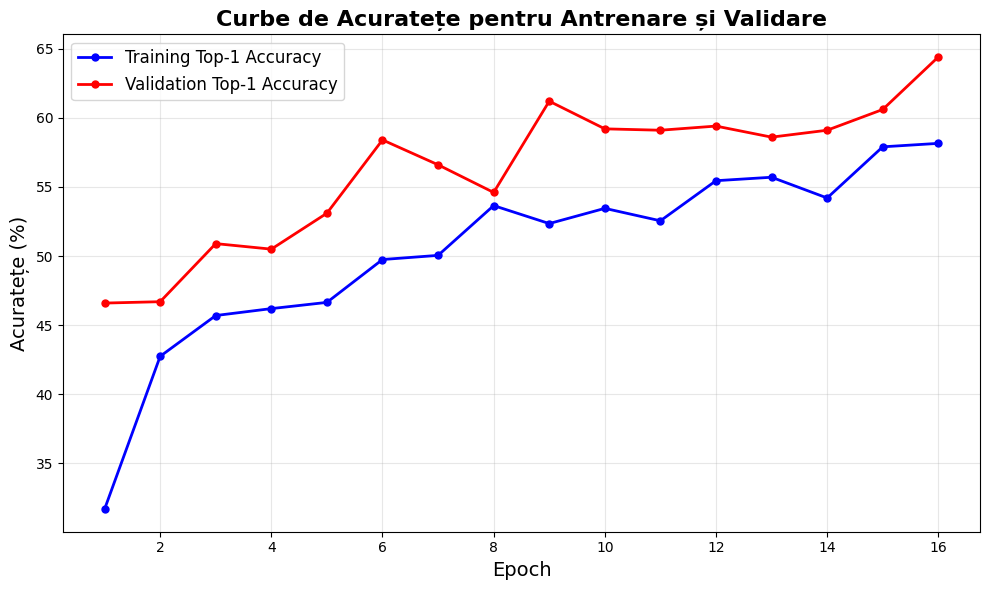

100%|██████████| 63/63 [00:01<00:00, 45.36it/s, epoch=17, train_loss=2.2733, top1_accuracy=117.96%]
Train - Loss: 1.1458, Top-1: 59.45%
100%|██████████| 32/32 [00:00<00:00, 140.28it/s, epoch=17, val_loss=4.3572, top1_accuracy=240.62%]
Val - Loss: 1.1154, Val - Top-1: 61.60%
EarlyStopping counter: 1 out of 7
100%|██████████| 63/63 [00:01<00:00, 44.73it/s, epoch=18, train_loss=2.2426, top1_accuracy=116.27%]
Train - Loss: 1.1303, Top-1: 58.60%
100%|██████████| 32/32 [00:00<00:00, 139.83it/s, epoch=18, val_loss=4.5954, top1_accuracy=220.31%]
Val - Loss: 1.1764, Val - Top-1: 56.40%
EarlyStopping counter: 2 out of 7


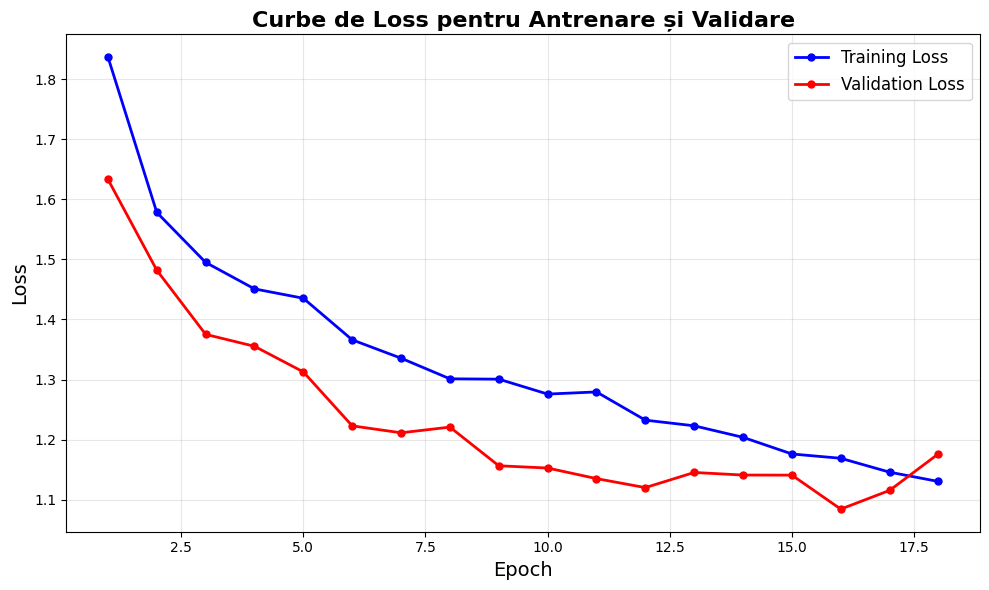

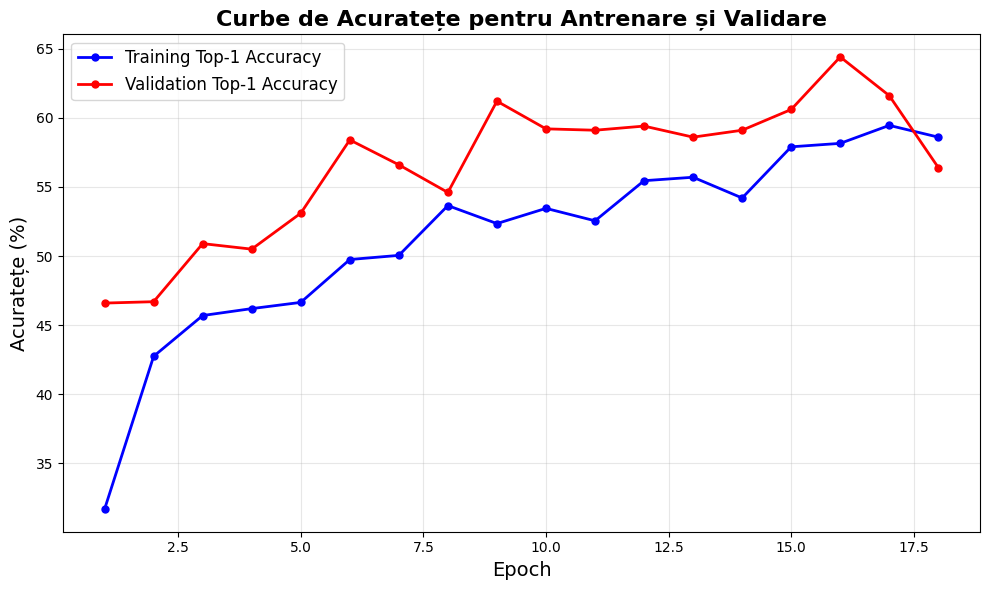

100%|██████████| 63/63 [00:01<00:00, 42.36it/s, epoch=19, train_loss=2.3299, top1_accuracy=115.87%]
Train - Loss: 1.1742, Top-1: 58.40%
100%|██████████| 32/32 [00:00<00:00, 135.07it/s, epoch=19, val_loss=4.4516, top1_accuracy=238.67%]
Val - Loss: 1.1396, Val - Top-1: 61.10%
EarlyStopping counter: 3 out of 7
100%|██████████| 63/63 [00:01<00:00, 45.23it/s, epoch=20, train_loss=2.2630, top1_accuracy=116.67%]
Train - Loss: 1.1405, Top-1: 58.80%
100%|██████████| 32/32 [00:00<00:00, 141.54it/s, epoch=20, val_loss=4.3300, top1_accuracy=241.80%]
Val - Loss: 1.1085, Val - Top-1: 61.90%
EarlyStopping counter: 4 out of 7


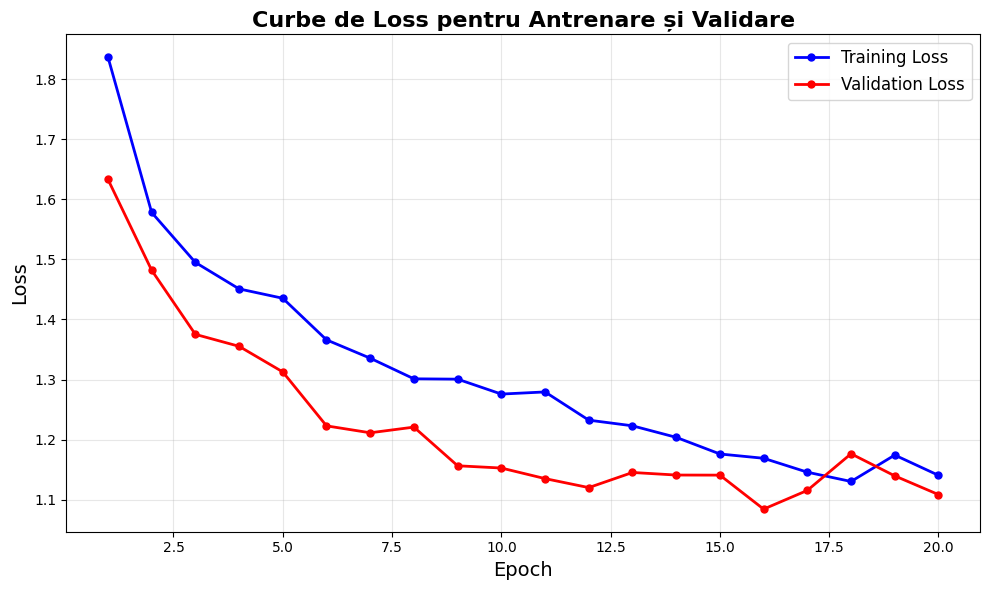

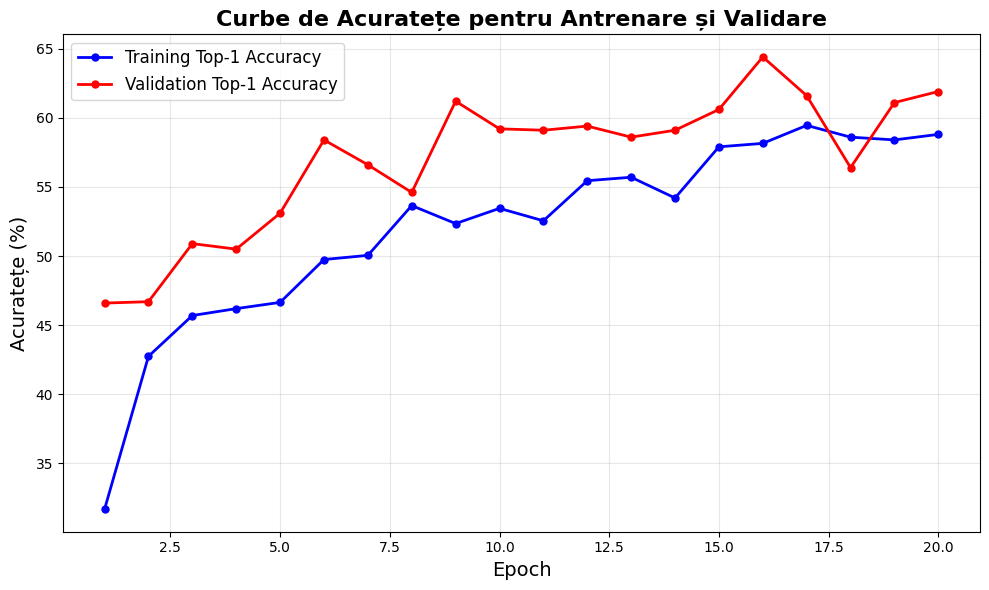

100%|██████████| 63/63 [00:01<00:00, 44.68it/s, epoch=21, train_loss=2.1627, top1_accuracy=119.74%]
Train - Loss: 1.0900, Top-1: 60.35%
100%|██████████| 32/32 [00:00<00:00, 132.29it/s, epoch=21, val_loss=4.1009, top1_accuracy=251.95%]
Val - Loss: 1.0498, Val - Top-1: 64.50%
Validation accuracy increased (64.400000 → 64.500000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 44.60it/s, epoch=22, train_loss=2.1645, top1_accuracy=118.85%]
Train - Loss: 1.0909, Top-1: 59.90%
100%|██████████| 32/32 [00:00<00:00, 141.88it/s, epoch=22, val_loss=4.1199, top1_accuracy=247.27%]
Val - Loss: 1.0547, Val - Top-1: 63.30%
EarlyStopping counter: 1 out of 7


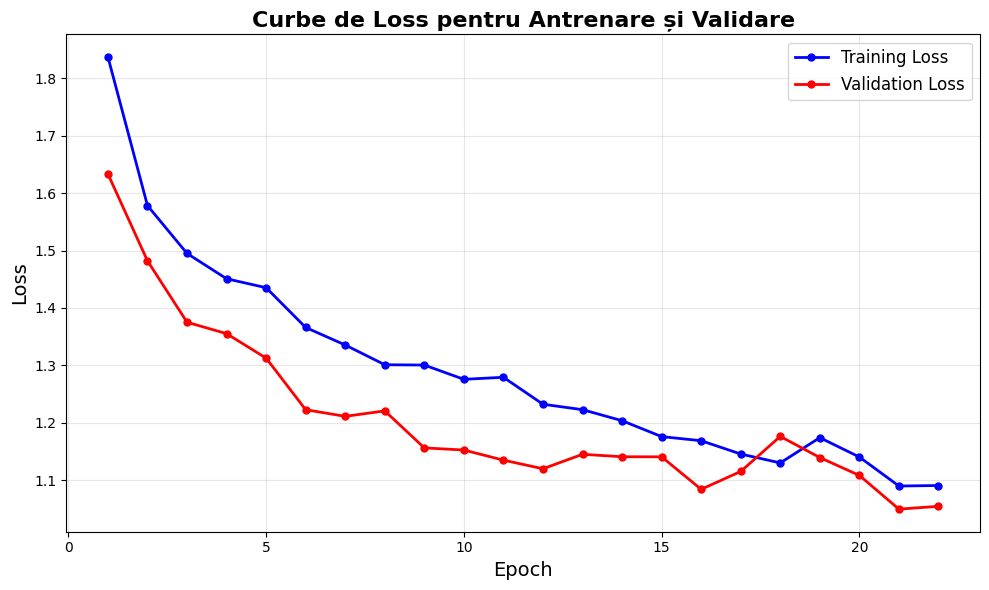

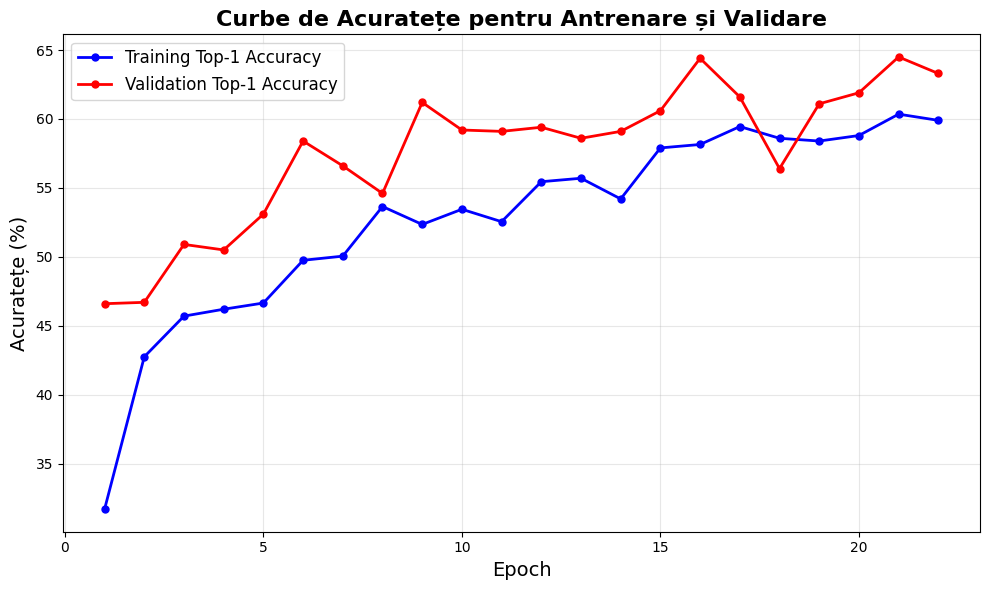

100%|██████████| 63/63 [00:01<00:00, 44.36it/s, epoch=23, train_loss=2.1952, top1_accuracy=121.43%]
Train - Loss: 1.1064, Top-1: 61.20%
100%|██████████| 32/32 [00:00<00:00, 128.15it/s, epoch=23, val_loss=4.0530, top1_accuracy=250.39%]
Val - Loss: 1.0376, Val - Top-1: 64.10%
EarlyStopping counter: 2 out of 7
100%|██████████| 63/63 [00:01<00:00, 44.67it/s, epoch=24, train_loss=2.1319, top1_accuracy=119.64%]
Train - Loss: 1.0745, Top-1: 60.30%
100%|██████████| 32/32 [00:00<00:00, 137.35it/s, epoch=24, val_loss=4.0952, top1_accuracy=248.83%]
Val - Loss: 1.0484, Val - Top-1: 63.70%
EarlyStopping counter: 3 out of 7


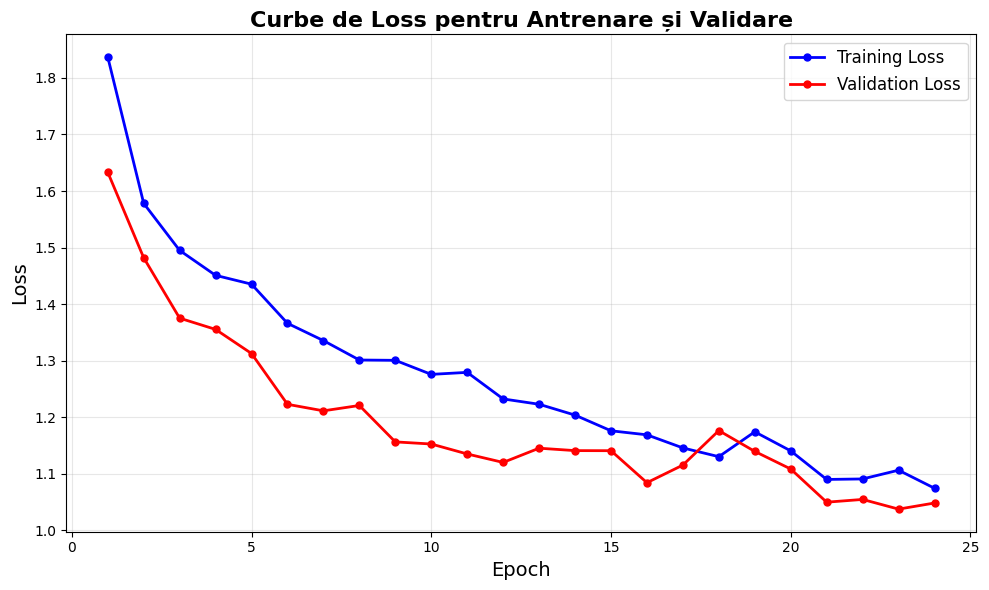

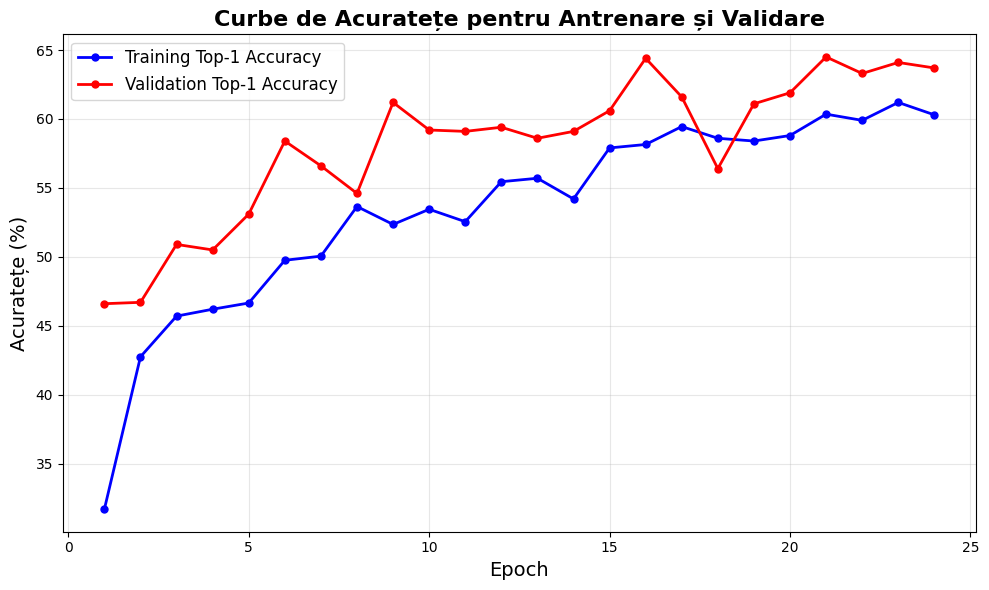

100%|██████████| 63/63 [00:01<00:00, 44.39it/s, epoch=25, train_loss=2.1654, top1_accuracy=118.95%]
Train - Loss: 1.0914, Top-1: 59.95%
100%|██████████| 32/32 [00:00<00:00, 141.29it/s, epoch=25, val_loss=4.1301, top1_accuracy=244.53%]
Val - Loss: 1.0573, Val - Top-1: 62.60%
EarlyStopping counter: 4 out of 7
100%|██████████| 63/63 [00:01<00:00, 43.92it/s, epoch=26, train_loss=2.1024, top1_accuracy=122.52%]
Train - Loss: 1.0596, Top-1: 61.75%
100%|██████████| 32/32 [00:00<00:00, 140.85it/s, epoch=26, val_loss=4.2867, top1_accuracy=236.33%]
Val - Loss: 1.0974, Val - Top-1: 60.50%
EarlyStopping counter: 5 out of 7


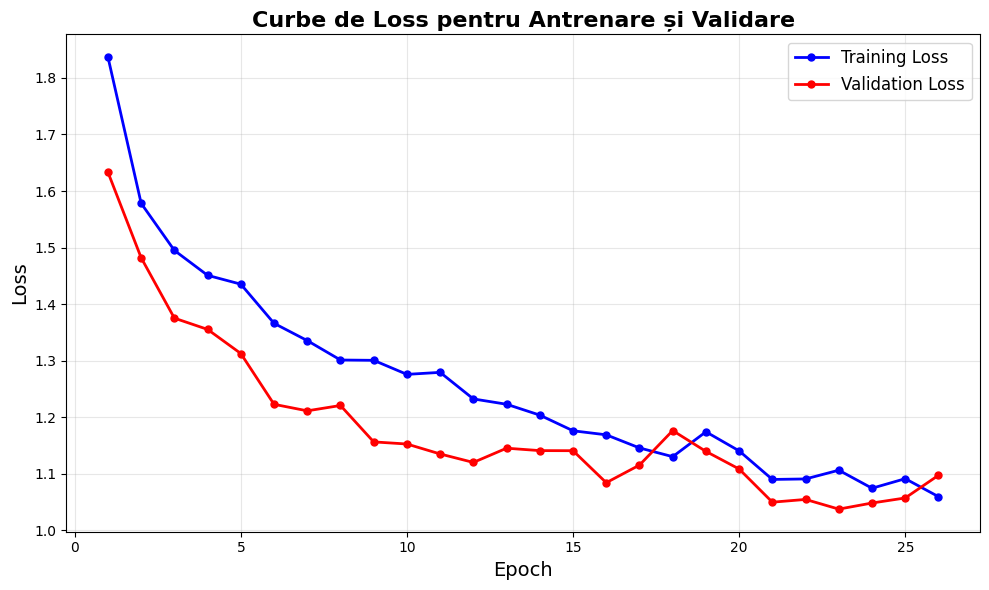

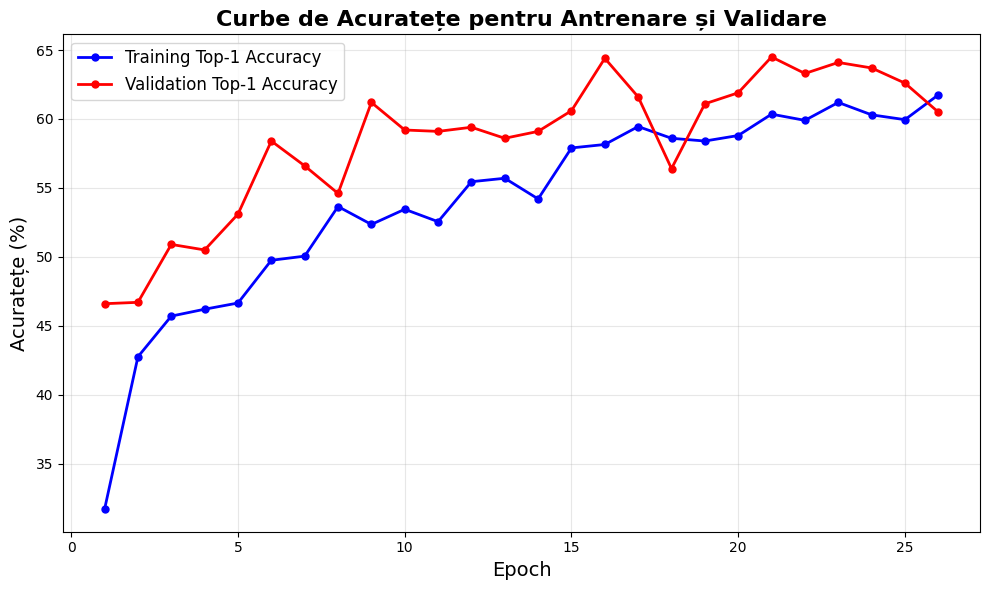

100%|██████████| 63/63 [00:01<00:00, 43.23it/s, epoch=27, train_loss=2.1100, top1_accuracy=120.83%]
Train - Loss: 1.0634, Top-1: 60.90%
100%|██████████| 32/32 [00:00<00:00, 120.97it/s, epoch=27, val_loss=4.1084, top1_accuracy=245.31%]
Val - Loss: 1.0517, Val - Top-1: 62.80%
EarlyStopping counter: 6 out of 7
100%|██████████| 63/63 [00:01<00:00, 44.37it/s, epoch=28, train_loss=2.0753, top1_accuracy=122.92%]
Train - Loss: 1.0460, Top-1: 61.95%
100%|██████████| 32/32 [00:00<00:00, 141.46it/s, epoch=28, val_loss=4.0991, top1_accuracy=252.34%]
Val - Loss: 1.0494, Val - Top-1: 64.60%
Validation accuracy increased (64.500000 → 64.600000). Saving model...


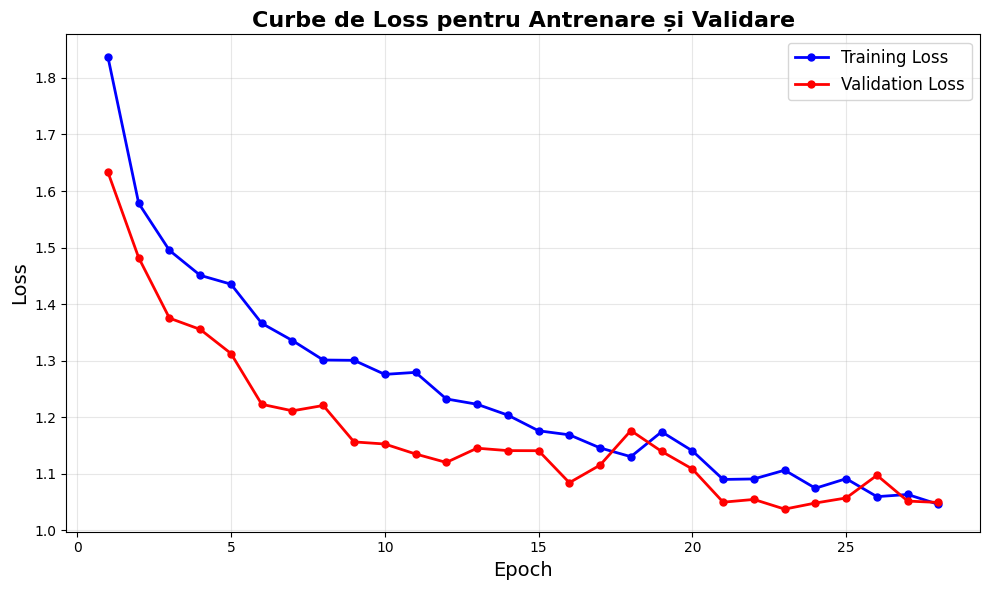

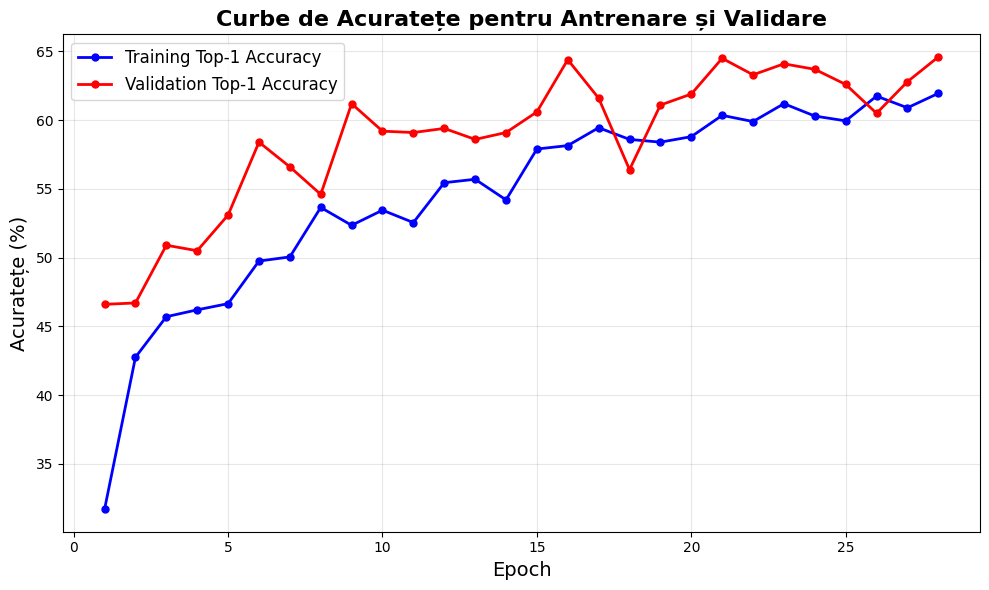

100%|██████████| 63/63 [00:01<00:00, 44.90it/s, epoch=29, train_loss=1.9973, top1_accuracy=127.48%]
Train - Loss: 1.0066, Top-1: 64.25%
100%|██████████| 32/32 [00:00<00:00, 128.95it/s, epoch=29, val_loss=4.1075, top1_accuracy=244.14%]
Val - Loss: 1.0515, Val - Top-1: 62.50%
EarlyStopping counter: 1 out of 7
100%|██████████| 63/63 [00:01<00:00, 44.99it/s, epoch=30, train_loss=1.9734, top1_accuracy=126.79%]
Train - Loss: 0.9946, Top-1: 63.90%
100%|██████████| 32/32 [00:00<00:00, 140.37it/s, epoch=30, val_loss=4.0614, top1_accuracy=254.69%]
Val - Loss: 1.0397, Val - Top-1: 65.20%
Validation accuracy increased (64.600000 → 65.200000). Saving model...


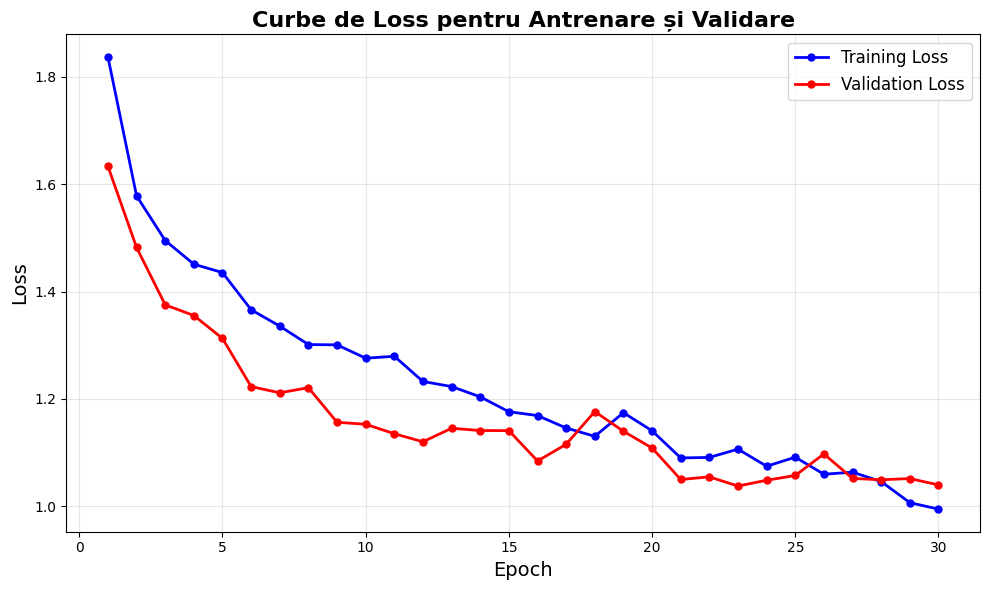

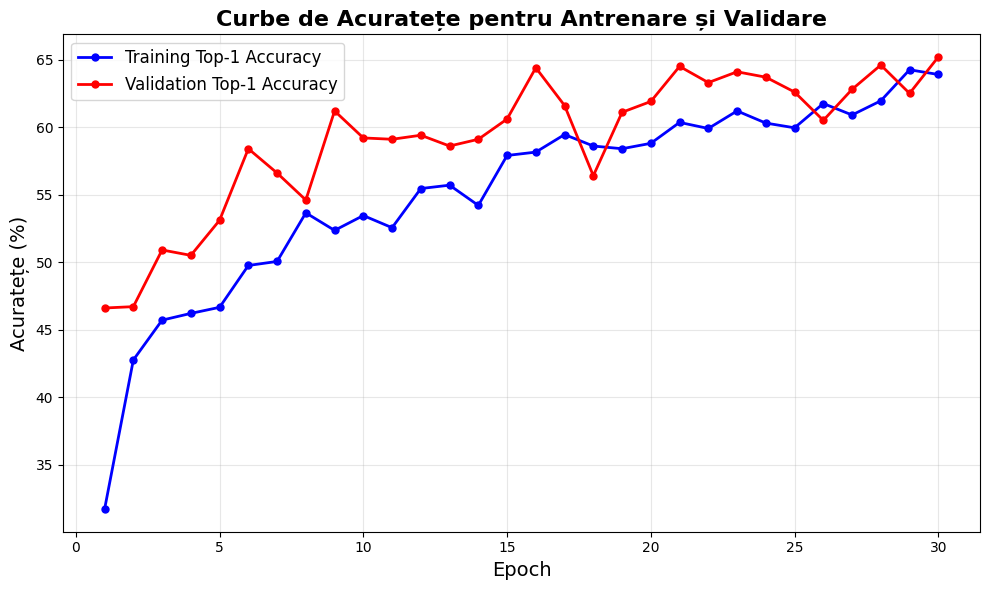

100%|██████████| 63/63 [00:01<00:00, 44.64it/s, epoch=31, train_loss=1.9876, top1_accuracy=127.18%]
Train - Loss: 1.0017, Top-1: 64.10%
100%|██████████| 32/32 [00:00<00:00, 126.88it/s, epoch=31, val_loss=4.0508, top1_accuracy=255.86%]
Val - Loss: 1.0370, Val - Top-1: 65.50%
Validation accuracy increased (65.200000 → 65.500000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 44.63it/s, epoch=32, train_loss=2.0155, top1_accuracy=129.07%]
Train - Loss: 1.0158, Top-1: 65.05%
100%|██████████| 32/32 [00:00<00:00, 141.96it/s, epoch=32, val_loss=4.0206, top1_accuracy=254.30%]
Val - Loss: 1.0293, Val - Top-1: 65.10%
EarlyStopping counter: 1 out of 7


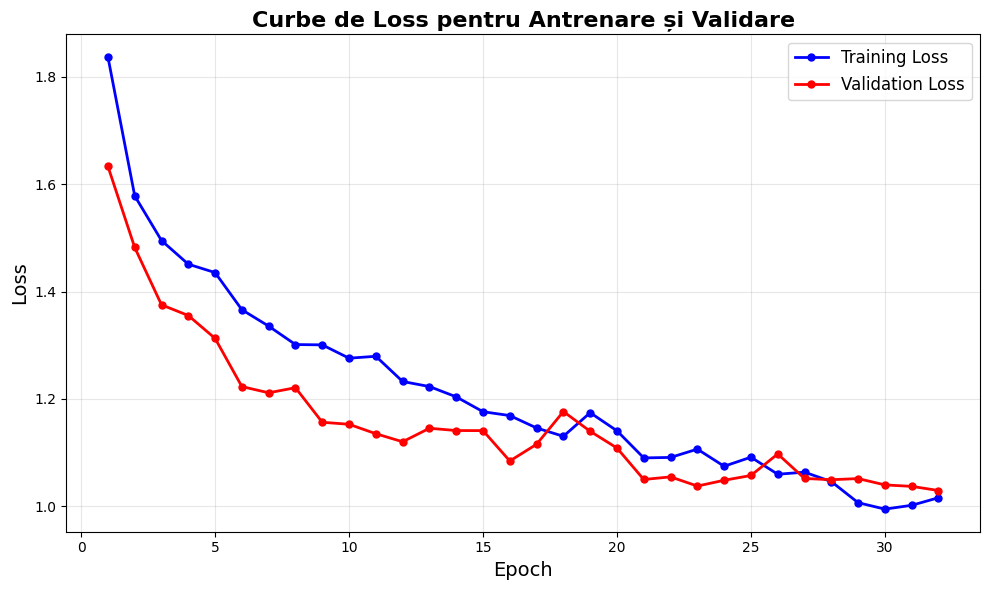

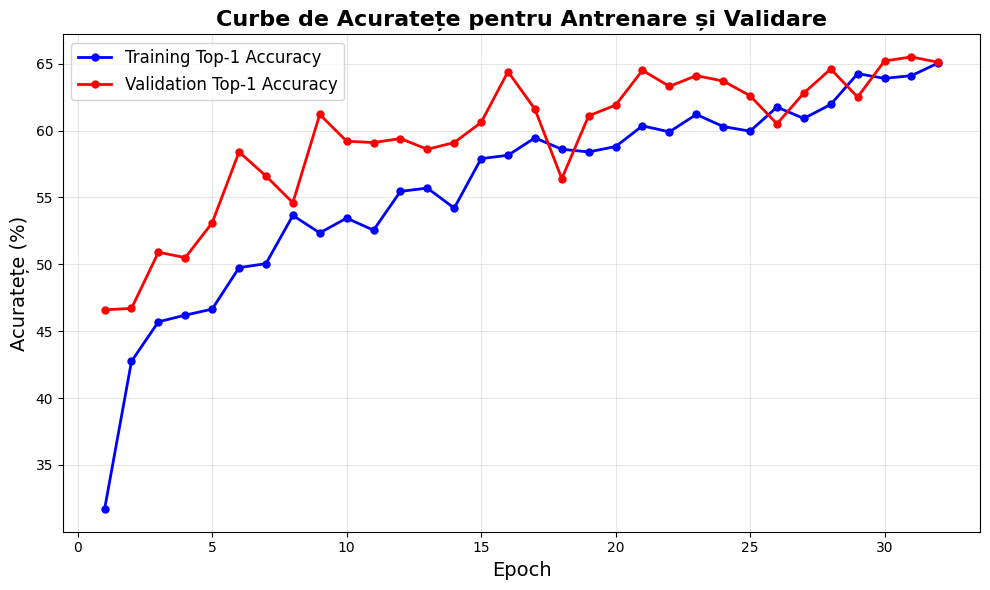

100%|██████████| 63/63 [00:01<00:00, 44.85it/s, epoch=33, train_loss=1.9466, top1_accuracy=127.68%]
Train - Loss: 0.9811, Top-1: 64.35%
100%|██████████| 32/32 [00:00<00:00, 126.41it/s, epoch=33, val_loss=3.9646, top1_accuracy=250.00%]
Val - Loss: 1.0149, Val - Top-1: 64.00%
EarlyStopping counter: 2 out of 7
100%|██████████| 63/63 [00:01<00:00, 45.11it/s, epoch=34, train_loss=1.9782, top1_accuracy=125.79%]
Train - Loss: 0.9970, Top-1: 63.40%
100%|██████████| 32/32 [00:00<00:00, 138.35it/s, epoch=34, val_loss=3.9694, top1_accuracy=250.39%]
Val - Loss: 1.0162, Val - Top-1: 64.10%
EarlyStopping counter: 3 out of 7


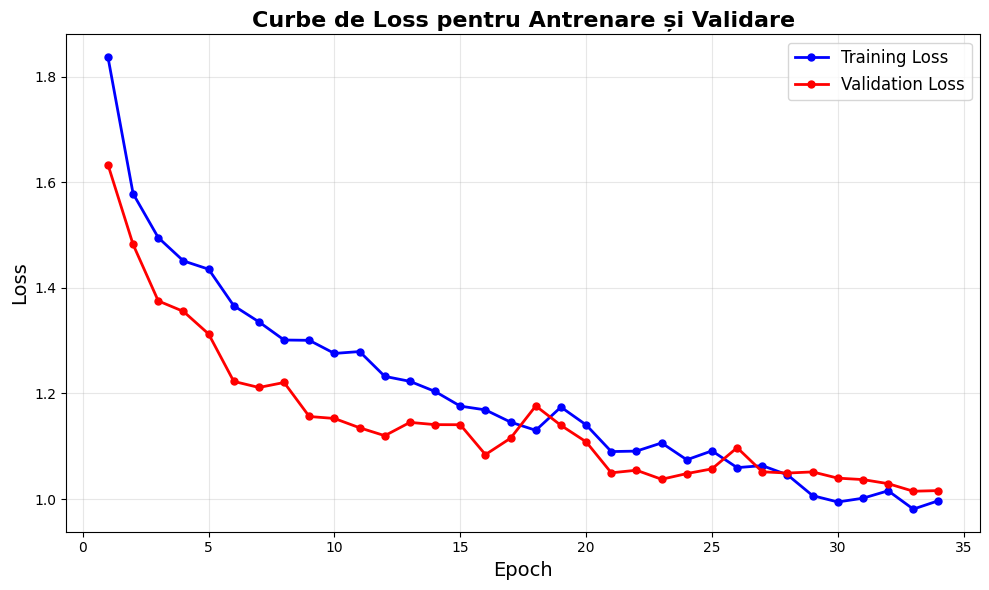

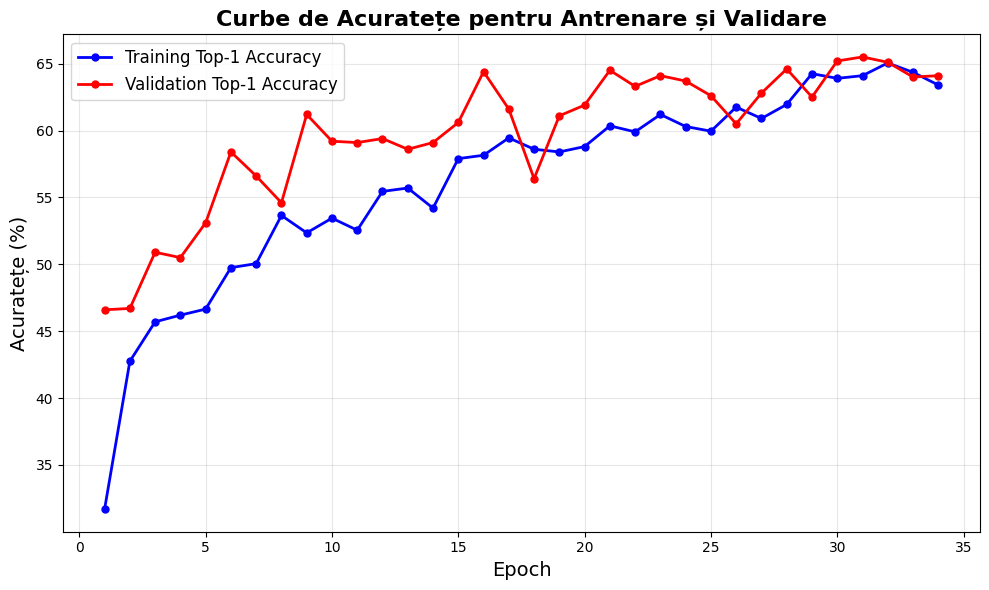

100%|██████████| 63/63 [00:01<00:00, 42.90it/s, epoch=35, train_loss=1.8995, top1_accuracy=128.17%]
Train - Loss: 0.9574, Top-1: 64.60%
100%|██████████| 32/32 [00:00<00:00, 117.79it/s, epoch=35, val_loss=3.9925, top1_accuracy=251.56%]
Val - Loss: 1.0221, Val - Top-1: 64.40%
EarlyStopping counter: 4 out of 7
100%|██████████| 63/63 [00:01<00:00, 45.16it/s, epoch=36, train_loss=1.9089, top1_accuracy=130.36%]
Train - Loss: 0.9621, Top-1: 65.70%
100%|██████████| 32/32 [00:00<00:00, 142.94it/s, epoch=36, val_loss=3.9577, top1_accuracy=252.34%]
Val - Loss: 1.0132, Val - Top-1: 64.60%
EarlyStopping counter: 5 out of 7


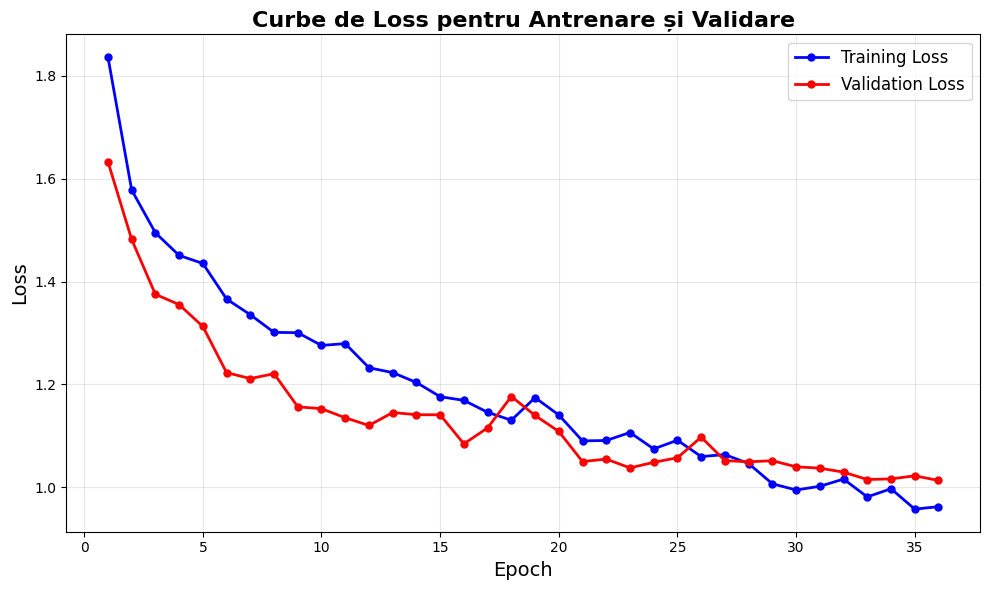

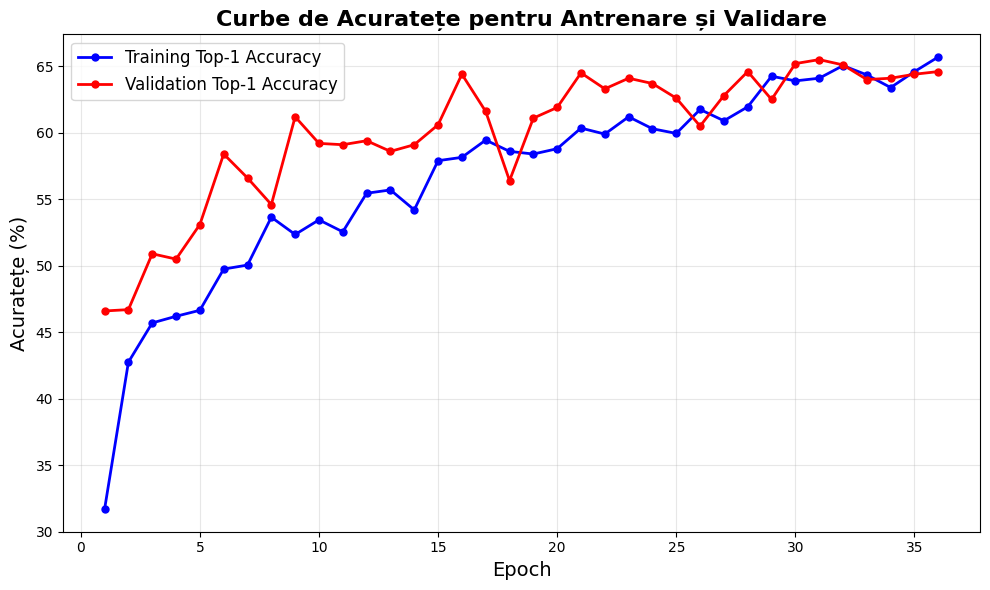

100%|██████████| 63/63 [00:01<00:00, 45.76it/s, epoch=37, train_loss=1.8773, top1_accuracy=131.65%]
Train - Loss: 0.9461, Top-1: 66.35%
100%|██████████| 32/32 [00:00<00:00, 123.01it/s, epoch=37, val_loss=3.9203, top1_accuracy=254.69%]
Val - Loss: 1.0036, Val - Top-1: 65.20%
EarlyStopping counter: 6 out of 7
100%|██████████| 63/63 [00:01<00:00, 45.64it/s, epoch=38, train_loss=1.8403, top1_accuracy=132.34%]
Train - Loss: 0.9275, Top-1: 66.70%
100%|██████████| 32/32 [00:00<00:00, 140.78it/s, epoch=38, val_loss=3.9283, top1_accuracy=258.20%]
Val - Loss: 1.0057, Val - Top-1: 66.10%
Validation accuracy increased (65.500000 → 66.100000). Saving model...


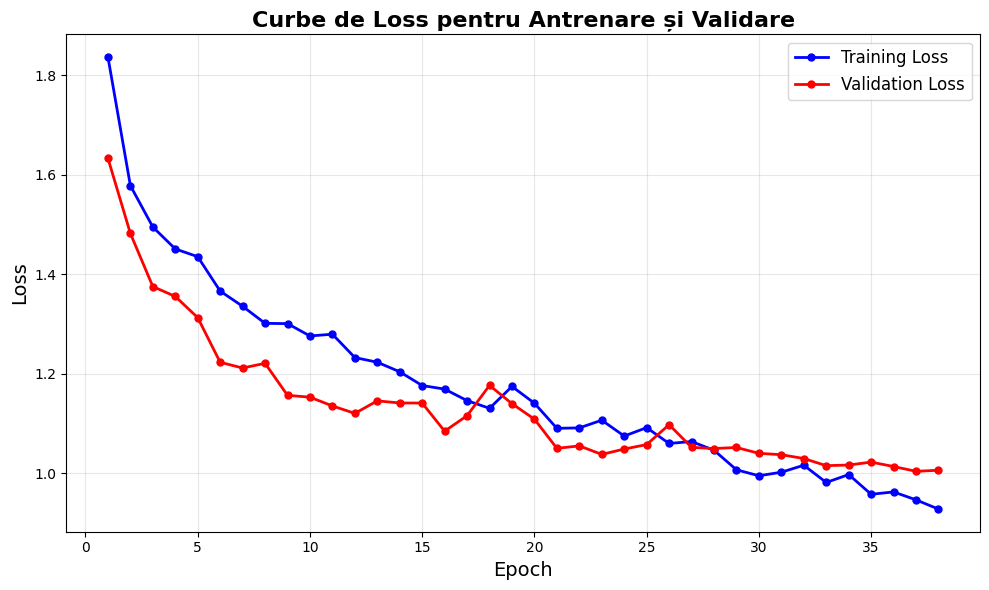

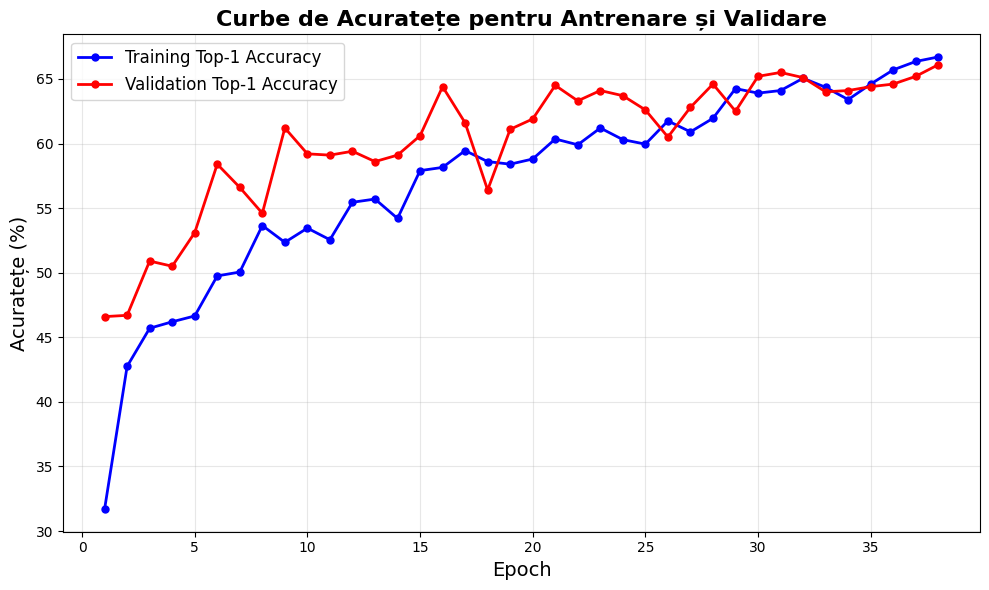

100%|██████████| 63/63 [00:01<00:00, 44.24it/s, epoch=39, train_loss=1.8614, top1_accuracy=129.27%]
Train - Loss: 0.9382, Top-1: 65.15%
100%|██████████| 32/32 [00:00<00:00, 132.52it/s, epoch=39, val_loss=3.9268, top1_accuracy=262.50%]
Val - Loss: 1.0053, Val - Top-1: 67.20%
Validation accuracy increased (66.100000 → 67.200000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 42.41it/s, epoch=40, train_loss=1.8751, top1_accuracy=130.56%]
Train - Loss: 0.9450, Top-1: 65.80%
100%|██████████| 32/32 [00:00<00:00, 124.59it/s, epoch=40, val_loss=3.9503, top1_accuracy=255.47%]
Val - Loss: 1.0113, Val - Top-1: 65.40%
EarlyStopping counter: 1 out of 7


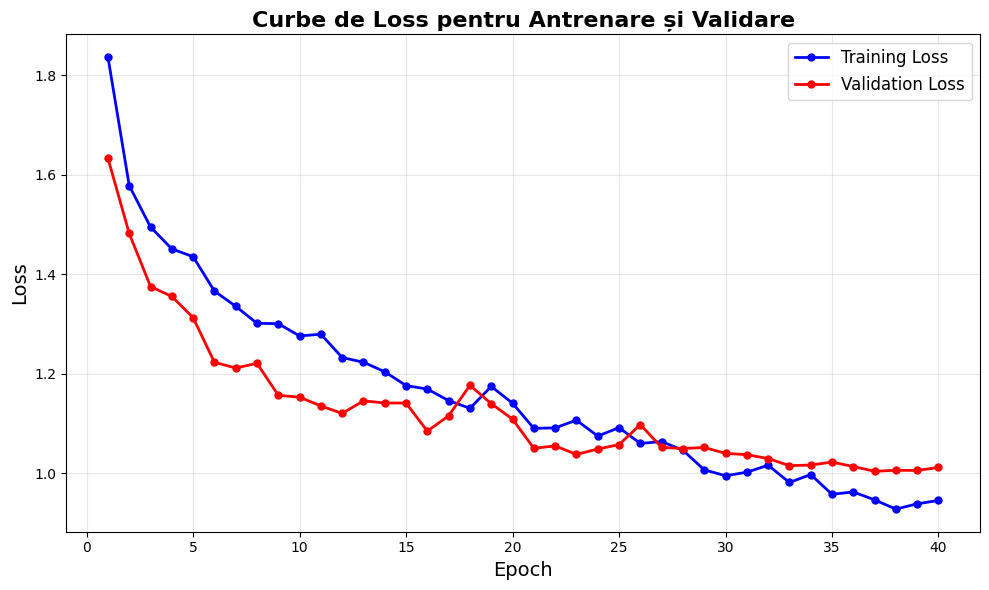

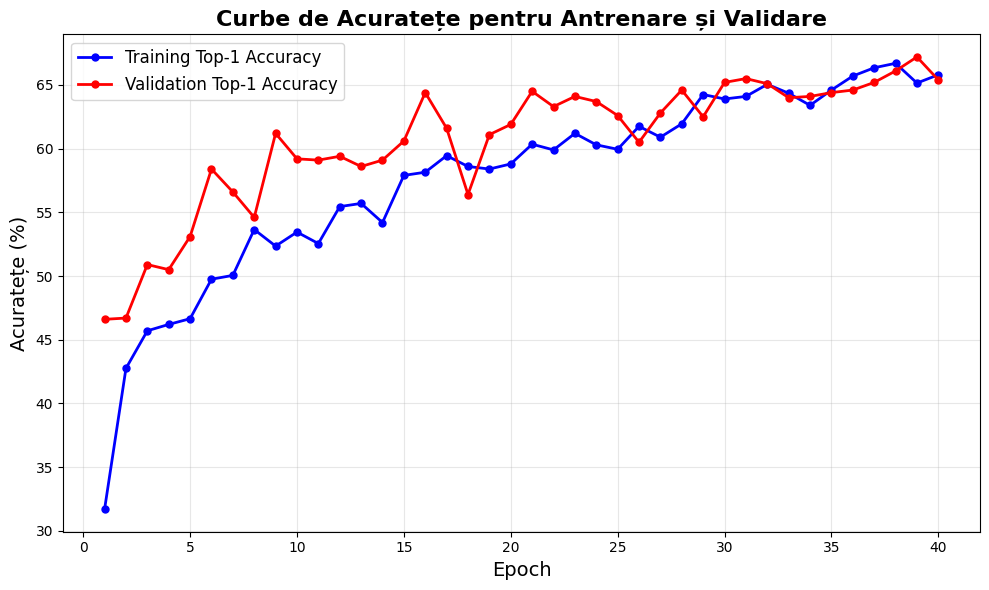

100%|██████████| 63/63 [00:01<00:00, 39.52it/s, epoch=41, train_loss=1.8899, top1_accuracy=129.66%]
Train - Loss: 0.9525, Top-1: 65.35%
100%|██████████| 32/32 [00:00<00:00, 104.08it/s, epoch=41, val_loss=3.8564, top1_accuracy=255.86%]
Val - Loss: 0.9872, Val - Top-1: 65.50%
EarlyStopping counter: 2 out of 7
100%|██████████| 63/63 [00:01<00:00, 39.97it/s, epoch=42, train_loss=1.7918, top1_accuracy=132.34%]
Train - Loss: 0.9030, Top-1: 66.70%
100%|██████████| 32/32 [00:00<00:00, 121.78it/s, epoch=42, val_loss=3.9350, top1_accuracy=255.86%]
Val - Loss: 1.0074, Val - Top-1: 65.50%
EarlyStopping counter: 3 out of 7


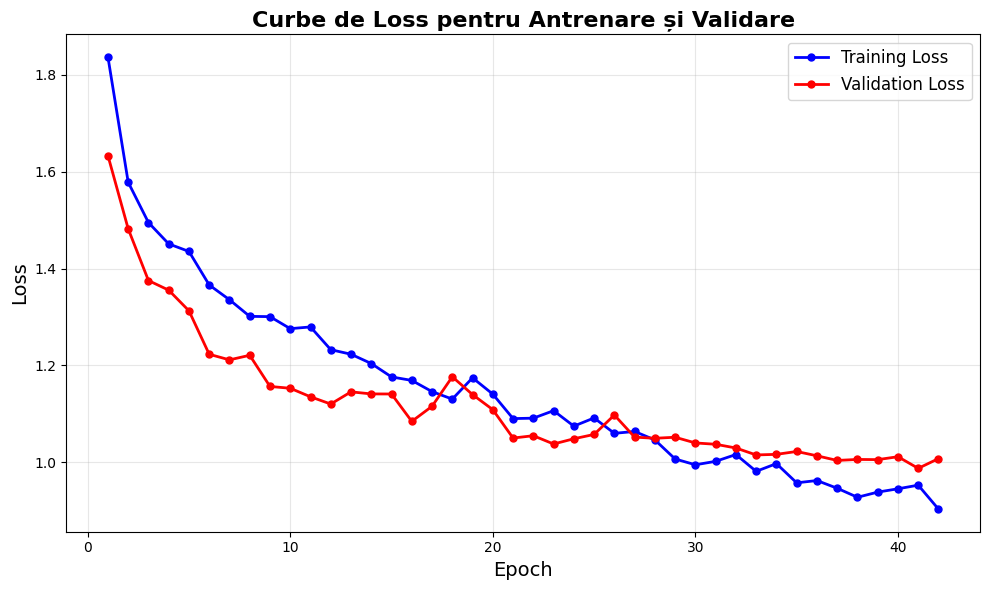

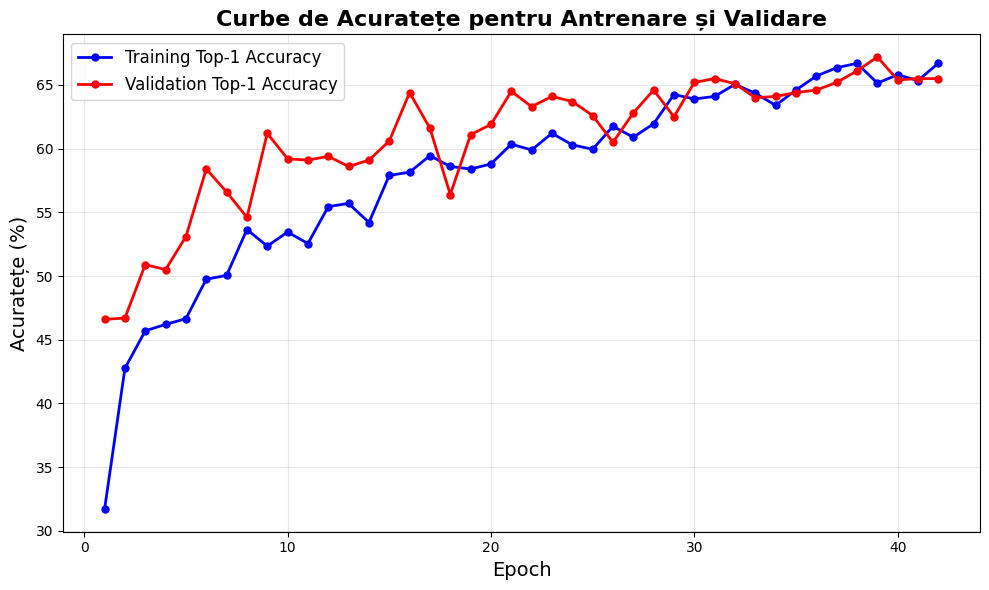

100%|██████████| 63/63 [00:01<00:00, 37.58it/s, epoch=43, train_loss=1.7574, top1_accuracy=133.83%]
Train - Loss: 0.8857, Top-1: 67.45%
100%|██████████| 32/32 [00:00<00:00, 114.66it/s, epoch=43, val_loss=3.8407, top1_accuracy=264.84%]
Val - Loss: 0.9832, Val - Top-1: 67.80%
Validation accuracy increased (67.200000 → 67.800000). Saving model...
100%|██████████| 63/63 [00:01<00:00, 40.73it/s, epoch=44, train_loss=1.7735, top1_accuracy=134.52%]
Train - Loss: 0.8938, Top-1: 67.80%
100%|██████████| 32/32 [00:00<00:00, 121.74it/s, epoch=44, val_loss=3.9143, top1_accuracy=259.77%]
Val - Loss: 1.0021, Val - Top-1: 66.50%
EarlyStopping counter: 1 out of 7


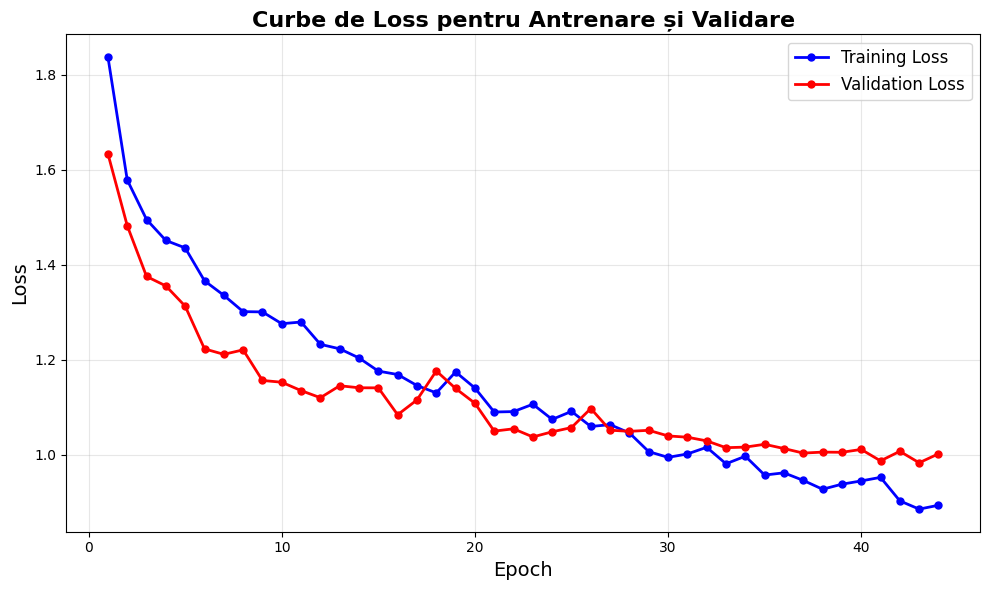

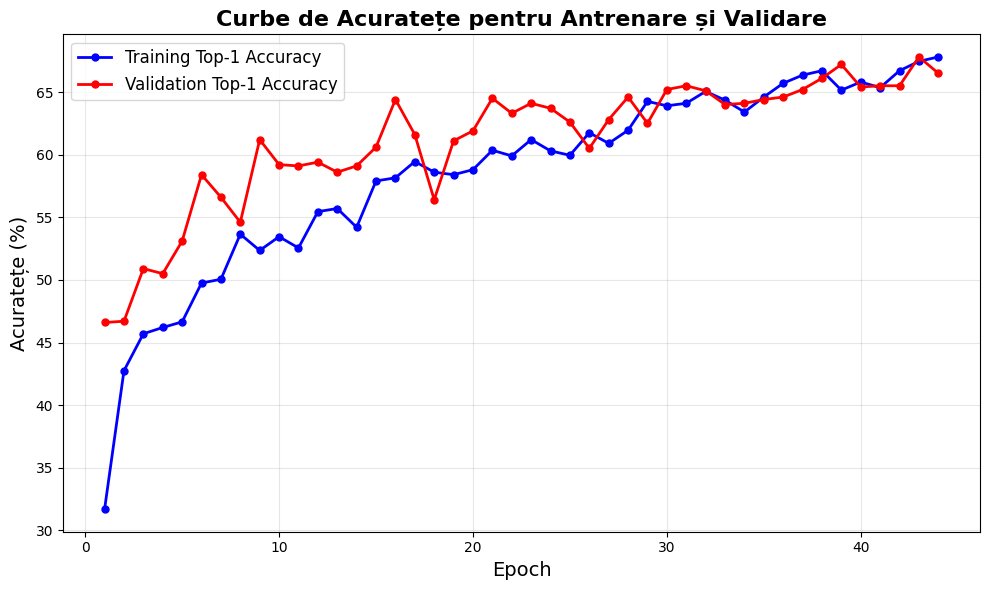

100%|██████████| 63/63 [00:01<00:00, 39.67it/s, epoch=45, train_loss=1.8064, top1_accuracy=132.34%]
Train - Loss: 0.9104, Top-1: 66.70%
100%|██████████| 32/32 [00:00<00:00, 119.90it/s, epoch=45, val_loss=3.8407, top1_accuracy=251.95%]
Val - Loss: 0.9832, Val - Top-1: 64.50%
EarlyStopping counter: 2 out of 7
100%|██████████| 63/63 [00:01<00:00, 40.63it/s, epoch=46, train_loss=1.7462, top1_accuracy=134.72%]
Train - Loss: 0.8801, Top-1: 67.90%
100%|██████████| 32/32 [00:00<00:00, 126.61it/s, epoch=46, val_loss=3.8794, top1_accuracy=260.16%]
Val - Loss: 0.9931, Val - Top-1: 66.60%
EarlyStopping counter: 3 out of 7


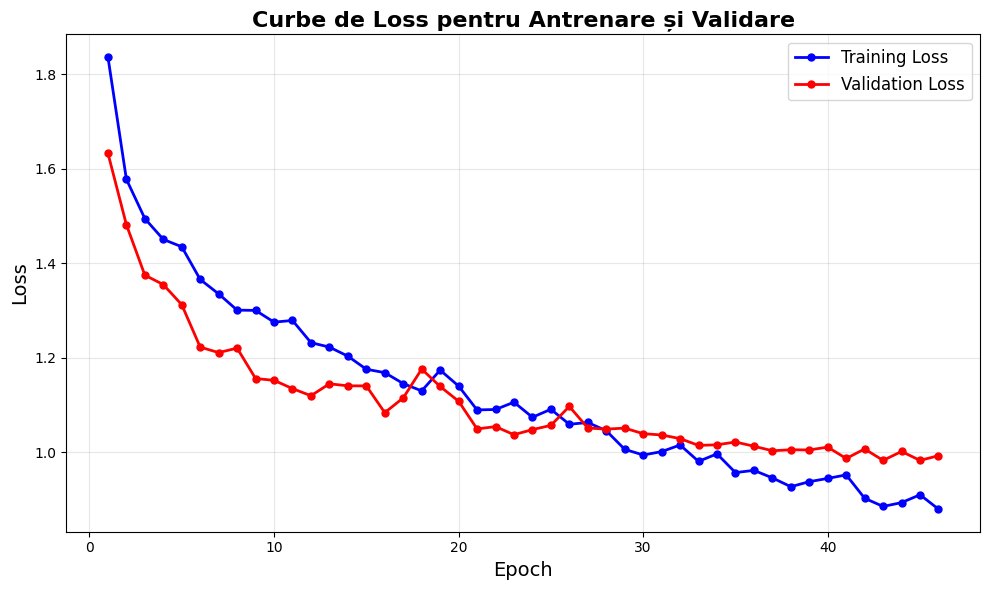

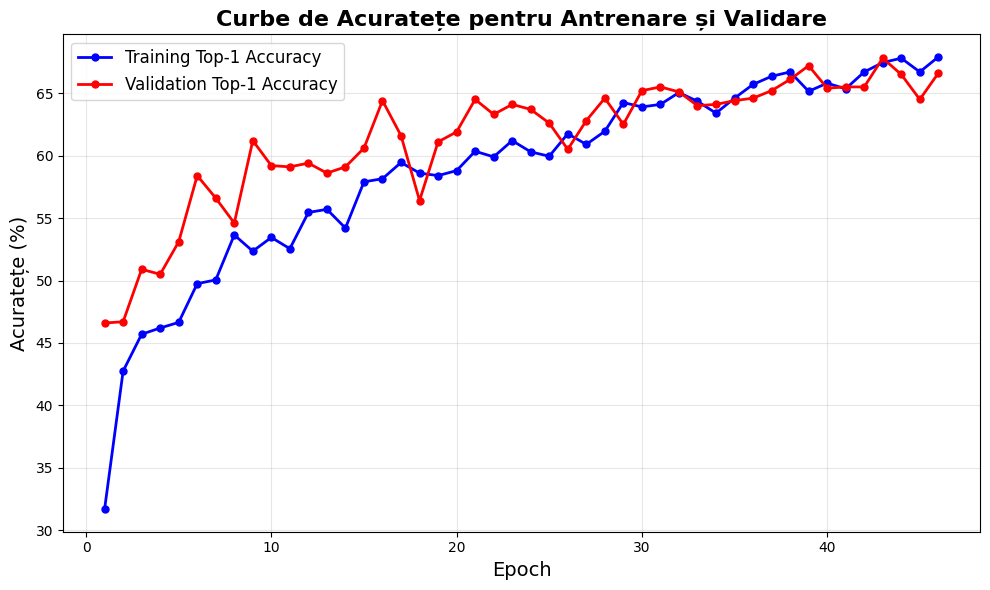

100%|██████████| 63/63 [00:01<00:00, 37.74it/s, epoch=47, train_loss=1.7910, top1_accuracy=134.23%]
Train - Loss: 0.9027, Top-1: 67.65%
100%|██████████| 32/32 [00:00<00:00, 116.86it/s, epoch=47, val_loss=3.8813, top1_accuracy=258.98%]
Val - Loss: 0.9936, Val - Top-1: 66.30%
EarlyStopping counter: 4 out of 7
100%|██████████| 63/63 [00:01<00:00, 40.73it/s, epoch=48, train_loss=1.7662, top1_accuracy=133.43%]
Train - Loss: 0.8902, Top-1: 67.25%
100%|██████████| 32/32 [00:00<00:00, 123.37it/s, epoch=48, val_loss=3.9559, top1_accuracy=255.08%]
Val - Loss: 1.0127, Val - Top-1: 65.30%
EarlyStopping counter: 5 out of 7


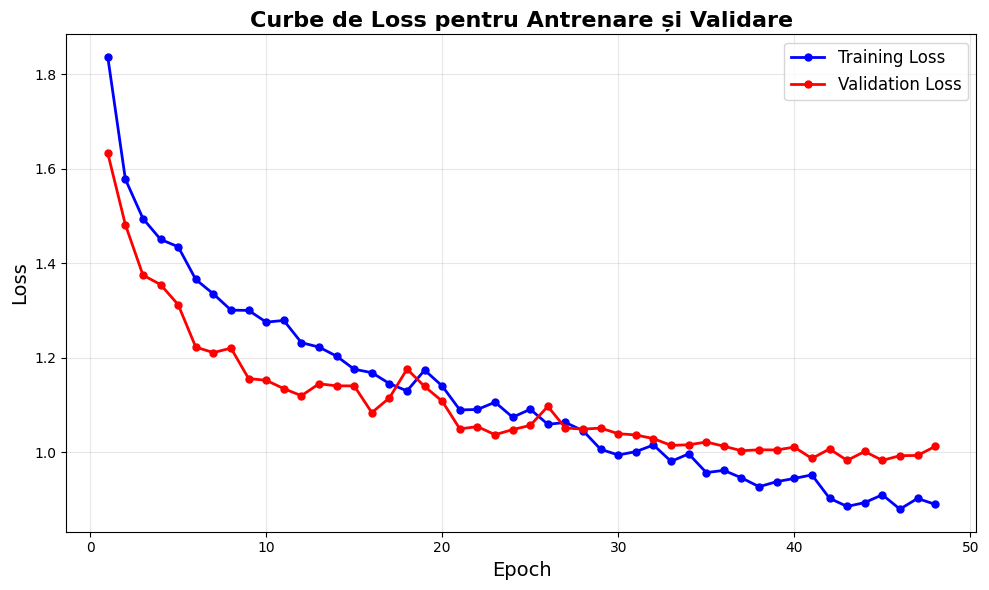

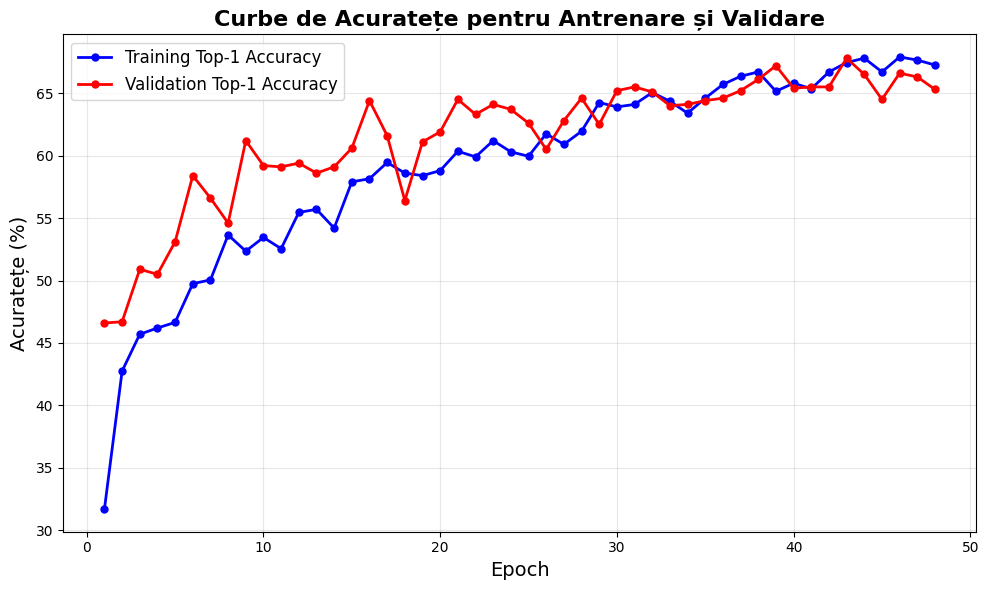

100%|██████████| 63/63 [00:01<00:00, 41.84it/s, epoch=49, train_loss=1.7176, top1_accuracy=134.42%]
Train - Loss: 0.8657, Top-1: 67.75%
100%|██████████| 32/32 [00:00<00:00, 128.21it/s, epoch=49, val_loss=3.8522, top1_accuracy=262.11%]
Val - Loss: 0.9862, Val - Top-1: 67.10%
EarlyStopping counter: 6 out of 7
100%|██████████| 63/63 [00:01<00:00, 43.19it/s, epoch=50, train_loss=1.7241, top1_accuracy=134.62%]
Train - Loss: 0.8689, Top-1: 67.85%
100%|██████████| 32/32 [00:00<00:00, 128.22it/s, epoch=50, val_loss=3.8322, top1_accuracy=260.55%]
Val - Loss: 0.9810, Val - Top-1: 66.70%
EarlyStopping counter: 7 out of 7
Early stopping triggered at epoch 50

Model 5 Best Validation Accuracy: 67.80%

Ensemble Training Complete!

Individual Model Accuracies:
  Model 1: 66.60%
  Model 2: 64.20%
  Model 3: 65.00%
  Model 4: 65.90%
  Model 5: 67.80%

Average Accuracy: 65.90%


In [132]:
ensemble_configs = [
    {'lr': 3e-3, 'weight_decay': 1e-4, 'lr_decay': 0.93},
    {'lr': 3e-3, 'weight_decay': 2e-4, 'lr_decay': 0.94},
    {'lr': 3e-3, 'weight_decay': 3e-4, 'lr_decay': 0.92},
    {'lr': 3e-3, 'weight_decay': 2e-4, 'lr_decay': 0.935},
    {'lr': 3e-3, 'weight_decay': 1e-4, 'lr_decay': 0.915}
]

trained_models = []
model_accuracies = []

print(f"Starting Ensemble Training of {len(ensemble_configs)} models...\n")

for i, conf in enumerate(ensemble_configs):
    print(f"\n{'='*60}")
    print(f"Training Model {i+1}/{len(ensemble_configs)}")
    print(f"Config: lr={conf['lr']}, weight_decay={conf['weight_decay']}, lr_decay={conf['lr_decay']}")
    print(f"{'='*60}\n")

    model, best_acc = train_single_model(conf, train_loader, validation_loader, CFG.device)
    trained_models.append(model)
    model_accuracies.append(best_acc)

    print(f"\nModel {i+1} Best Validation Accuracy: {best_acc:.2f}%")

print(f"\n{'='*60}")
print("Ensemble Training Complete!")
print(f"{'='*60}")
print("\nIndividual Model Accuracies:")
for i, acc in enumerate(model_accuracies):
    print(f"  Model {i+1}: {acc:.2f}%")
print(f"\nAverage Accuracy: {np.mean(model_accuracies):.2f}%")

In [133]:
combined = list(zip(trained_models, model_accuracies))
sorted_models = sorted(combined, key=lambda x: x[1], reverse=True)
top_three = sorted_models[:3]
top_three_models = [m for m, _ in top_three]
print("Top-3 validation accuracies:", [acc for _, acc in top_three])

Top-3 validation accuracies: [67.8, 66.6, 65.9]


In [134]:
print("\nEvaluating Ensemble with TTA...")
for i in range(2,3):
    print(f" - Using {i} TTA augmentations...")
    y_pred_ens_tta, y_true_ens_tta = predict_ensemble_with_tta(top_three_models, test_loader, CFG.device, num_tta=i)

    ens_tta_acc_i = accuracy_score(y_true_ens_tta, y_pred_ens_tta) * 100
    ens_tta_f1_i = f1_score(y_true_ens_tta, y_pred_ens_tta, average='weighted') * 100

    print(f"   Ensemble with {i} TTA Accuracy: {ens_tta_acc_i:.2f}%")
    print(f"   Ensemble with {i} TTA F1 Score: {ens_tta_f1_i:.2f}%")

print("\nEvaluating Baseline Ensemble (without TTA)...")
y_pred_ensemble, y_true_ensemble = predict_soft_vote_ensemble(top_three_models, test_loader, CFG.device)

ens_acc = accuracy_score(y_true_ensemble, y_pred_ensemble) * 100
ens_f1 = f1_score(y_true_ensemble, y_pred_ensemble, average='weighted') * 100

print(f"Baseline Ensemble Accuracy: {ens_acc:.2f}%")
print(f"Baseline Ensemble F1 Score: {ens_f1:.2f}%")


Evaluating Ensemble with TTA...
 - Using 2 TTA augmentations...


TTA Ensemble Prediction: 100%|██████████| 219/219 [00:25<00:00,  8.61it/s]


   Ensemble with 2 TTA Accuracy: 65.36%
   Ensemble with 2 TTA F1 Score: 64.79%

Evaluating Baseline Ensemble (without TTA)...
Baseline Ensemble Accuracy: 65.63%
Baseline Ensemble F1 Score: 65.10%



Evaluating Ensemble...
Ensemble Accuracy: 64.91%
Ensemble F1 Score: 64.35%

Generating Ensemble Confusion Matrix...


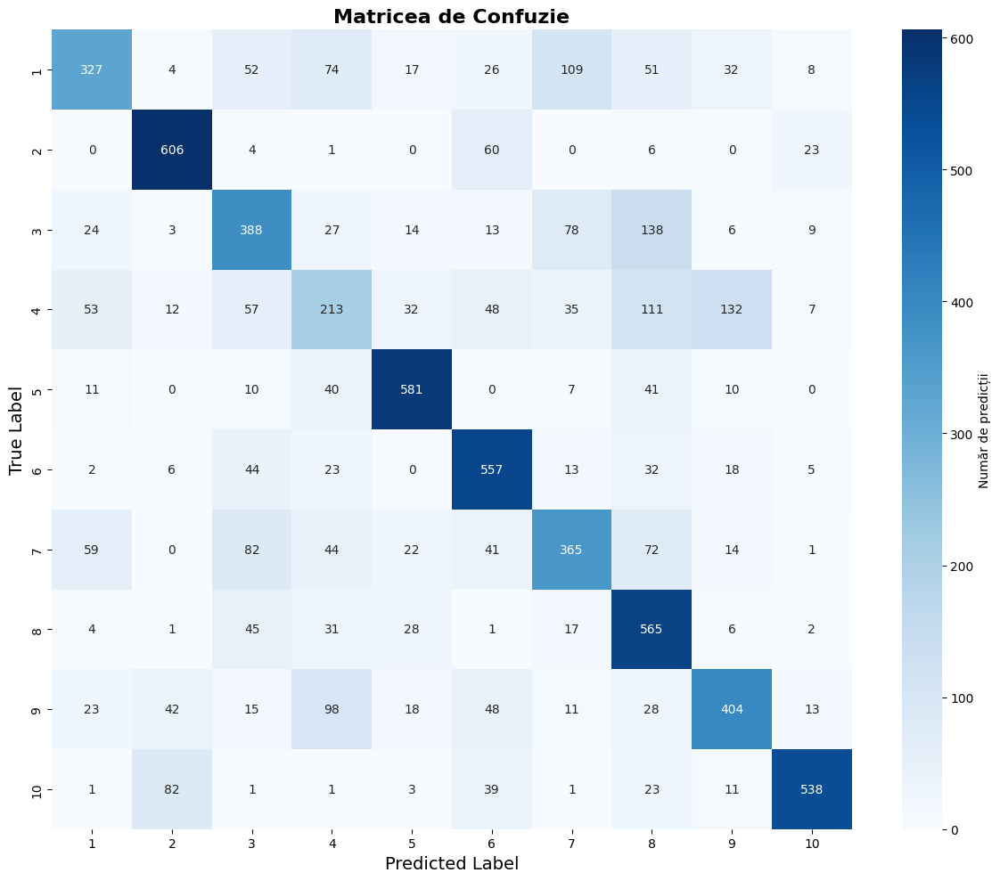

array([[327,   4,  52,  74,  17,  26, 109,  51,  32,   8],
       [  0, 606,   4,   1,   0,  60,   0,   6,   0,  23],
       [ 24,   3, 388,  27,  14,  13,  78, 138,   6,   9],
       [ 53,  12,  57, 213,  32,  48,  35, 111, 132,   7],
       [ 11,   0,  10,  40, 581,   0,   7,  41,  10,   0],
       [  2,   6,  44,  23,   0, 557,  13,  32,  18,   5],
       [ 59,   0,  82,  44,  22,  41, 365,  72,  14,   1],
       [  4,   1,  45,  31,  28,   1,  17, 565,   6,   2],
       [ 23,  42,  15,  98,  18,  48,  11,  28, 404,  13],
       [  1,  82,   1,   1,   3,  39,   1,  23,  11, 538]])

In [135]:
print("\nEvaluating Ensemble...")
y_pred_hard_ensemble, y_true_hard_ensemble = predict_hard_voting_ensemble(top_three_models, test_loader, CFG.device)

ens_acc = accuracy_score(y_true_hard_ensemble, y_pred_hard_ensemble) * 100
ens_f1 = f1_score(y_true_hard_ensemble, y_pred_hard_ensemble, average='weighted') * 100

print(f"Ensemble Accuracy: {ens_acc:.2f}%")
print(f"Ensemble F1 Score: {ens_f1:.2f}%")

print("\nGenerating Ensemble Confusion Matrix...")
plot_confusion_matrix(y_true_hard_ensemble, y_pred_hard_ensemble)